<a href="https://colab.research.google.com/github/AndiArdiansyah-a11y/DeepLearningLanjut/blob/main/Salinan_dari_Model_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [3]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [4]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 98% 0.98G/1.00G [00:08<00:00, 112MB/s]
100% 1.00G/1.00G [00:09<00:00, 107MB/s]
Dataset downloaded and extracted to /content/dataset/


In [5]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [6]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [7]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [8]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - d_loss: 0.4893 - g_loss: 0.7317

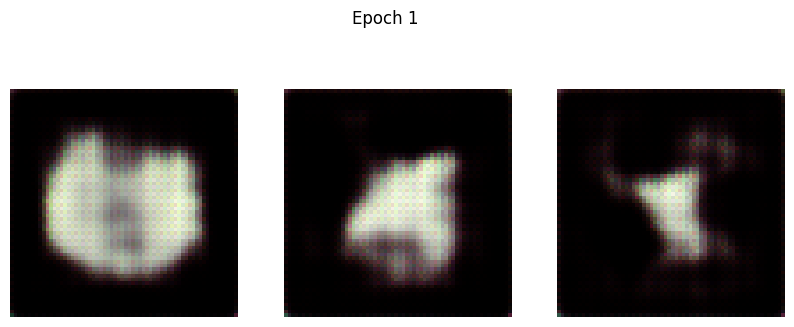

100/100 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - d_loss: 0.4898 - g_loss: 0.7320
Epoch 2/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6704 - g_loss: 0.7164

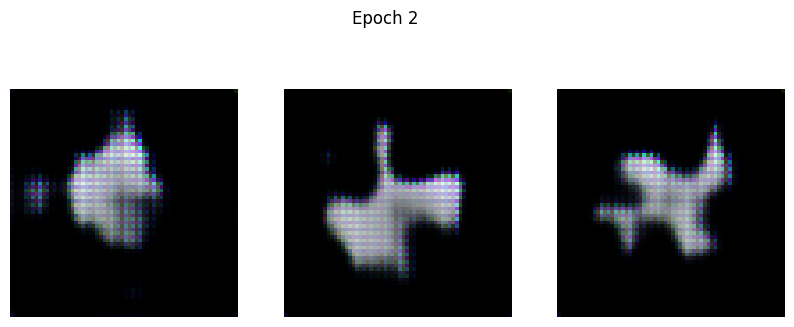

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6705 - g_loss: 0.7164
Epoch 3/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6661 - g_loss: 0.7286

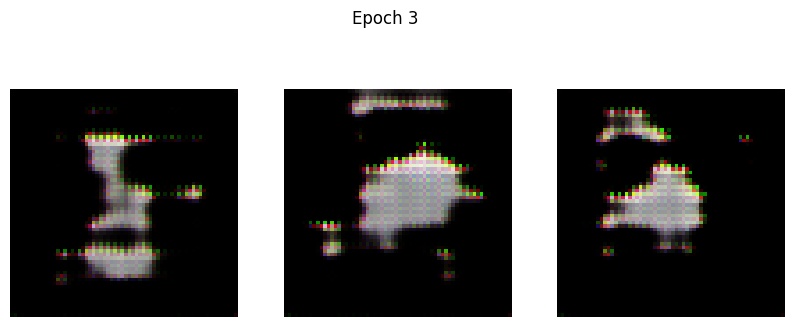

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6661 - g_loss: 0.7288
Epoch 4/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.6590 - g_loss: 0.7660

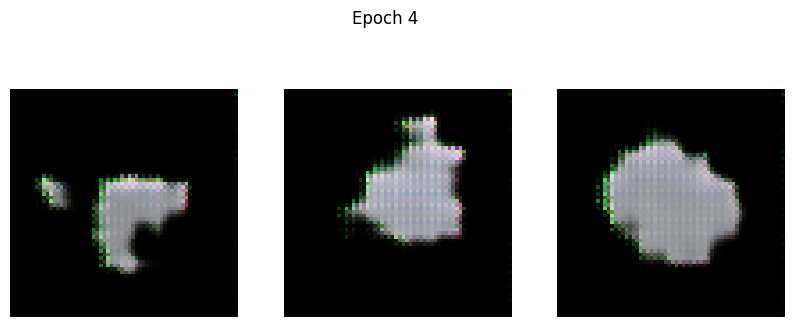

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.6590 - g_loss: 0.7659
Epoch 5/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.6593 - g_loss: 0.7914

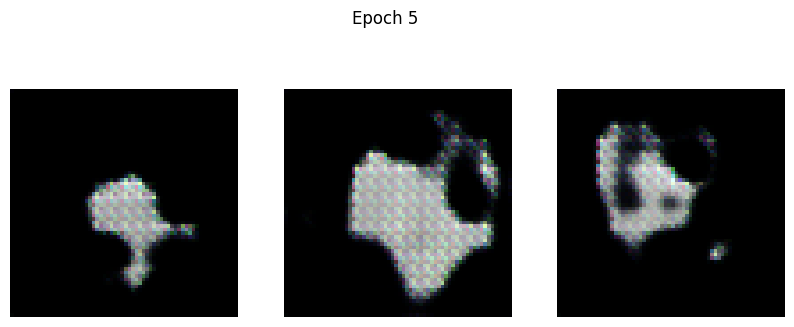

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6593 - g_loss: 0.7914
Epoch 6/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6569 - g_loss: 0.7879

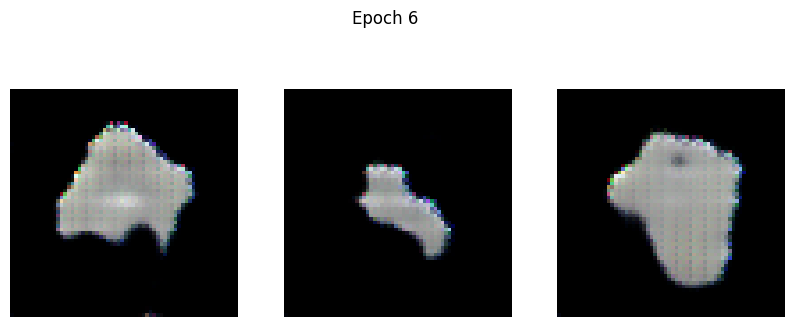

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6569 - g_loss: 0.7878
Epoch 7/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6504 - g_loss: 0.8031

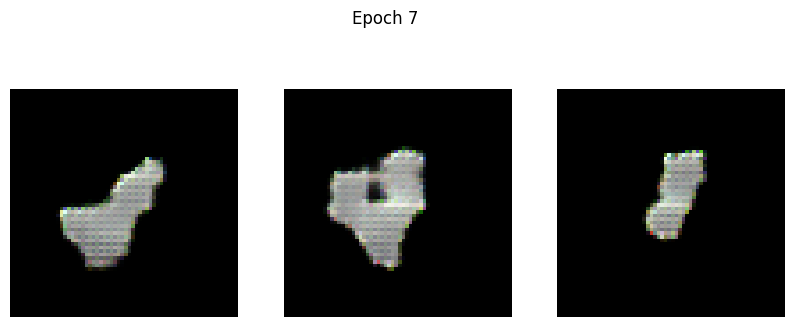

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6504 - g_loss: 0.8030
Epoch 8/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6424 - g_loss: 0.7746

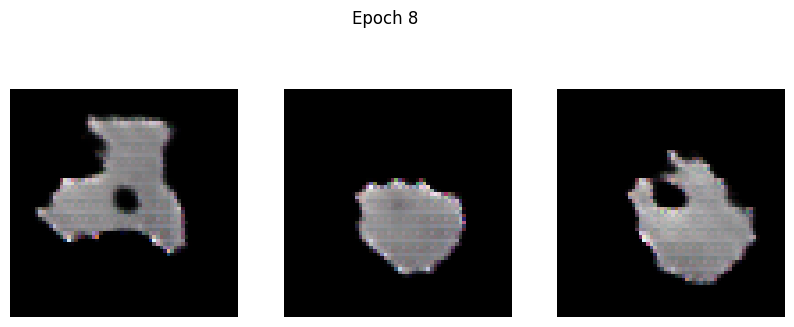

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6424 - g_loss: 0.7745
Epoch 9/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.6624 - g_loss: 0.7694

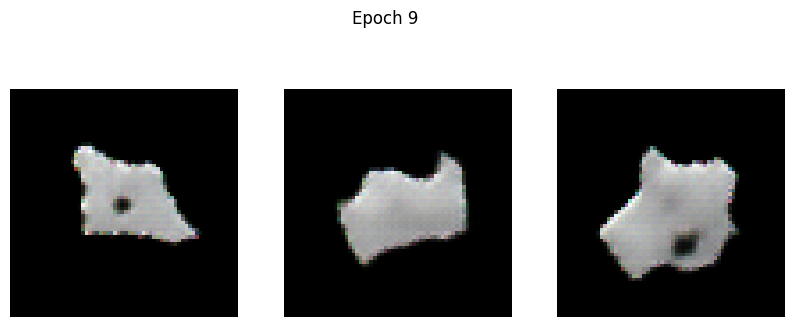

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.6624 - g_loss: 0.7693
Epoch 10/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6521 - g_loss: 0.7528

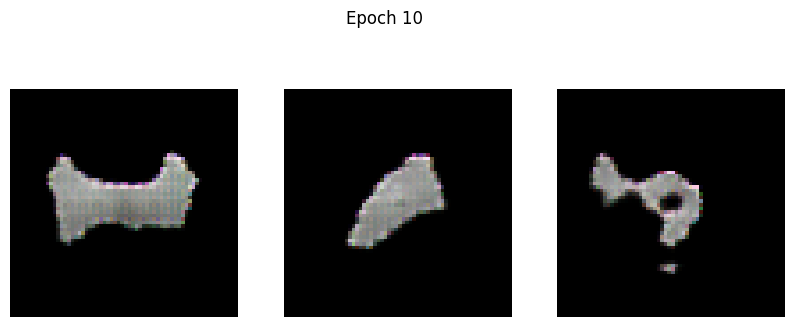

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6521 - g_loss: 0.7528
Epoch 11/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6625 - g_loss: 0.7579

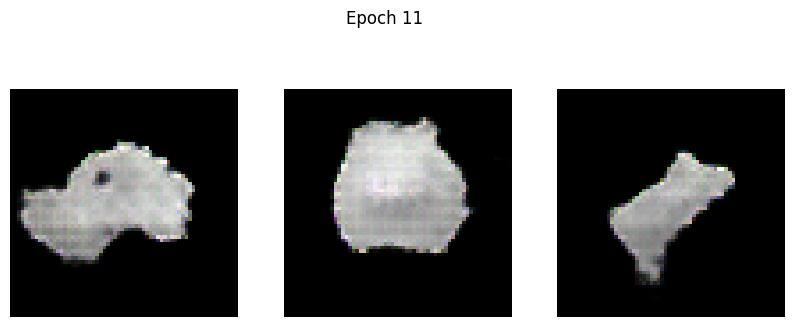

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6624 - g_loss: 0.7578
Epoch 12/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6412 - g_loss: 0.7776

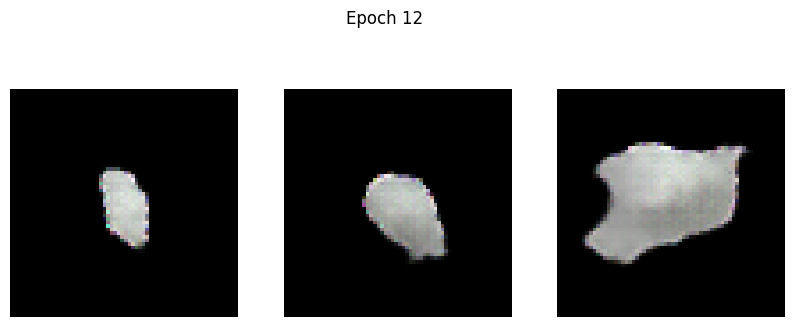

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6412 - g_loss: 0.7779
Epoch 13/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6372 - g_loss: 0.8380

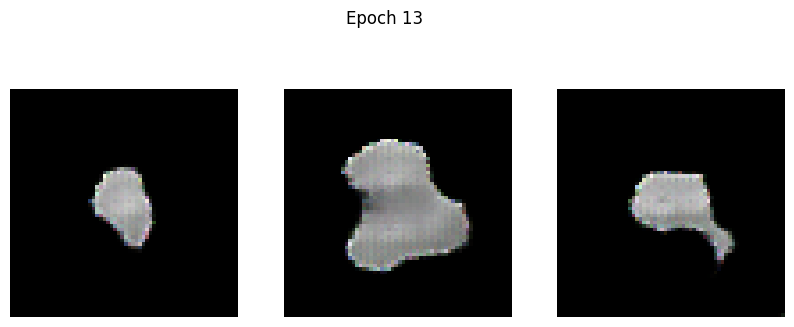

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6371 - g_loss: 0.8381
Epoch 14/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6298 - g_loss: 0.8581

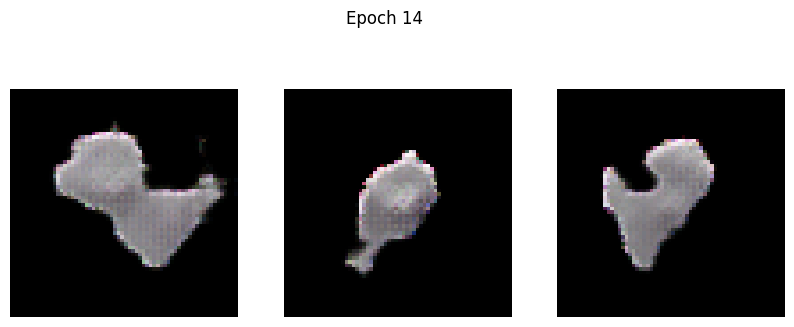

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6297 - g_loss: 0.8583
Epoch 15/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6122 - g_loss: 0.9395

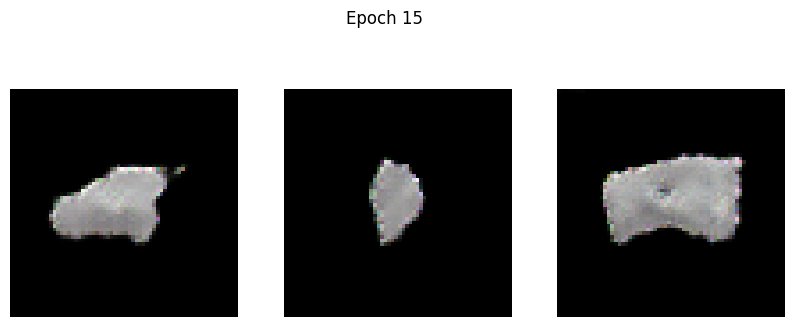

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6121 - g_loss: 0.9396
Epoch 16/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5986 - g_loss: 0.9376

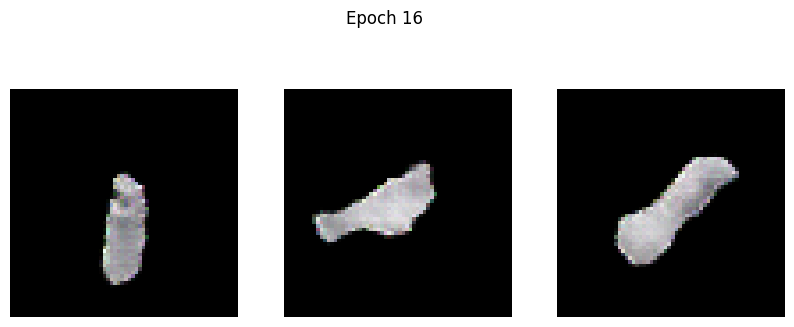

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5985 - g_loss: 0.9375
Epoch 17/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5670 - g_loss: 0.9364

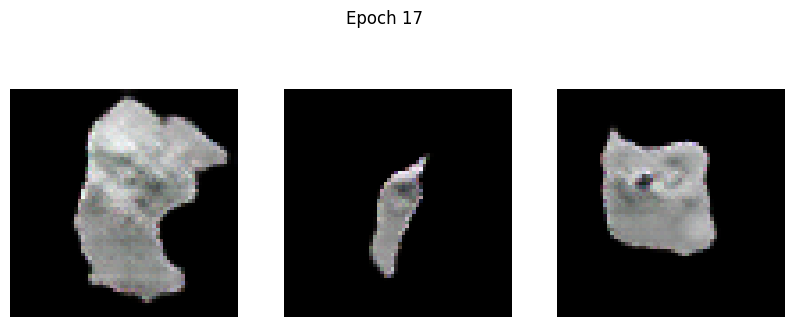

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5671 - g_loss: 0.9366
Epoch 18/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5645 - g_loss: 0.9564

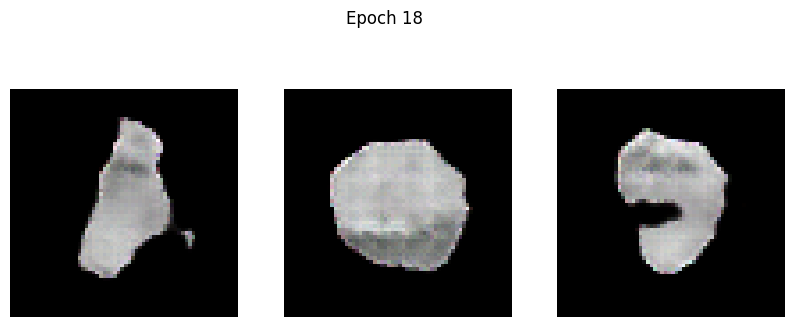

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5645 - g_loss: 0.9565
Epoch 19/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5662 - g_loss: 0.9952

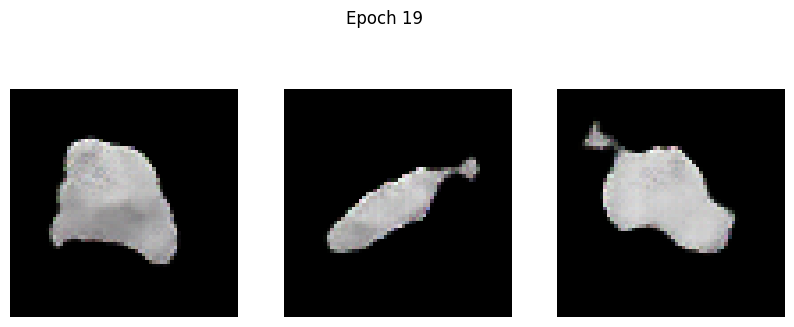

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5664 - g_loss: 0.9954
Epoch 20/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5448 - g_loss: 0.9834

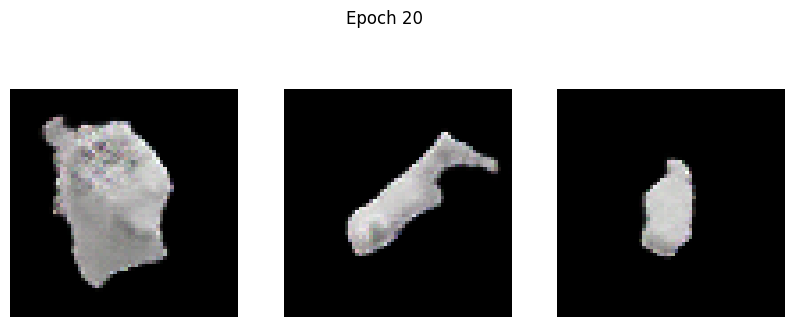

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5448 - g_loss: 0.9834
Epoch 21/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5474 - g_loss: 1.0247

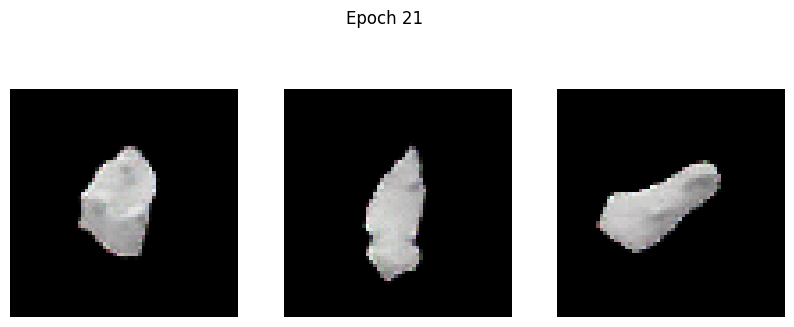

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5475 - g_loss: 1.0250
Epoch 22/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.5191 - g_loss: 1.0556

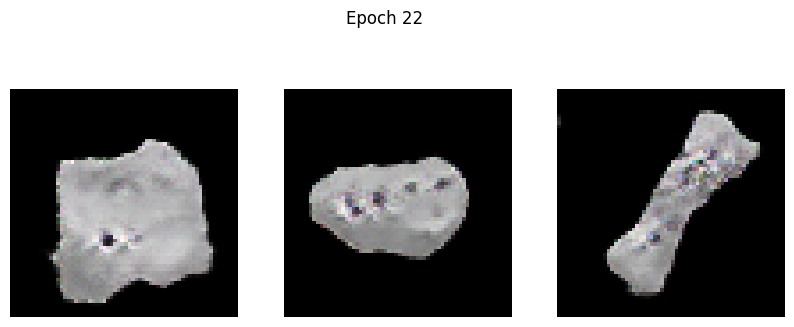

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5191 - g_loss: 1.0556
Epoch 23/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5065 - g_loss: 1.0775

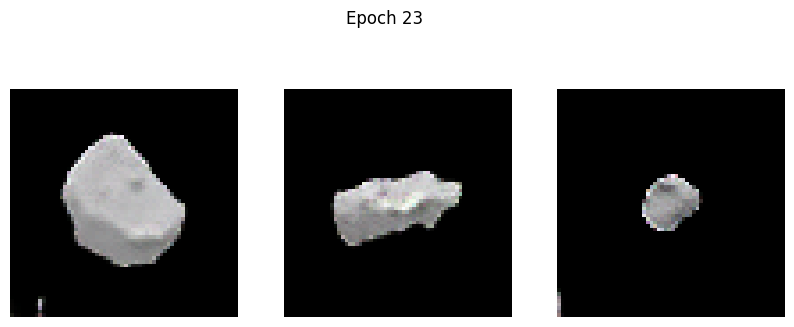

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5066 - g_loss: 1.0776
Epoch 24/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4995 - g_loss: 1.1501

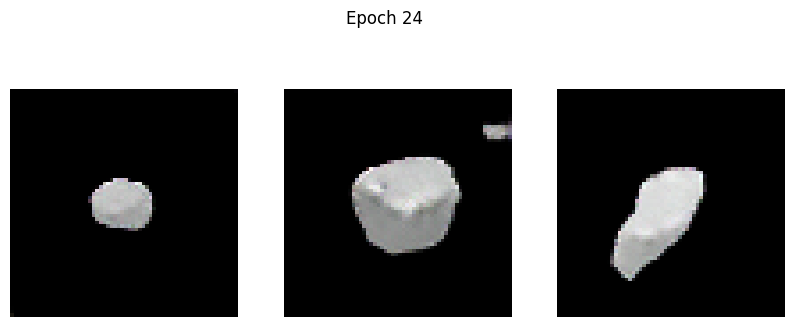

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4995 - g_loss: 1.1502
Epoch 25/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5113 - g_loss: 1.1759

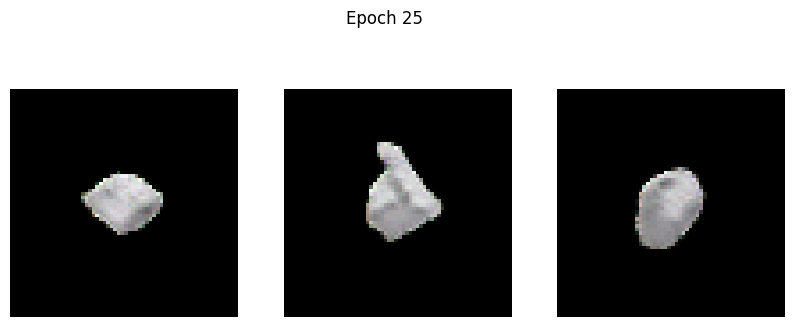

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5112 - g_loss: 1.1760
Epoch 26/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4790 - g_loss: 1.1645

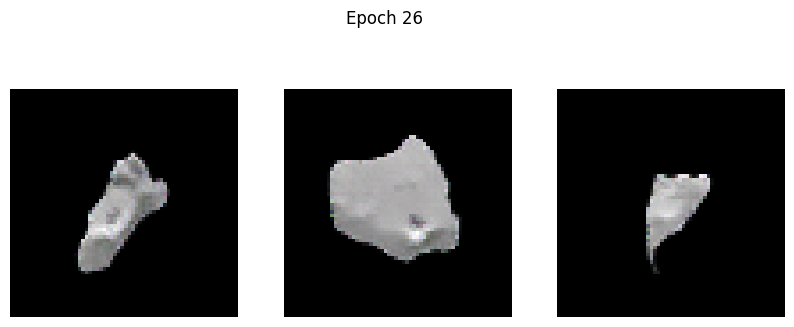

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4793 - g_loss: 1.1648
Epoch 27/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4621 - g_loss: 1.1682

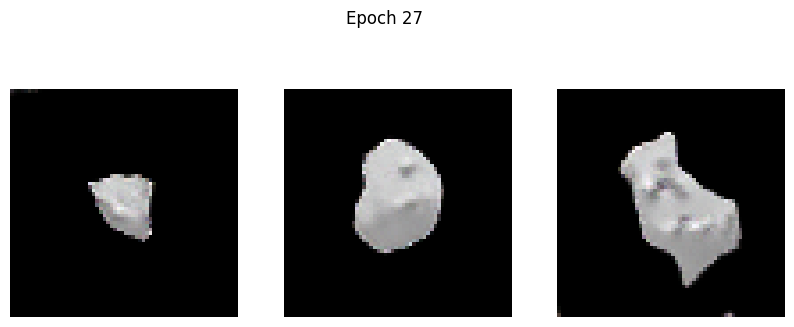

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4621 - g_loss: 1.1685
Epoch 28/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4777 - g_loss: 1.2756

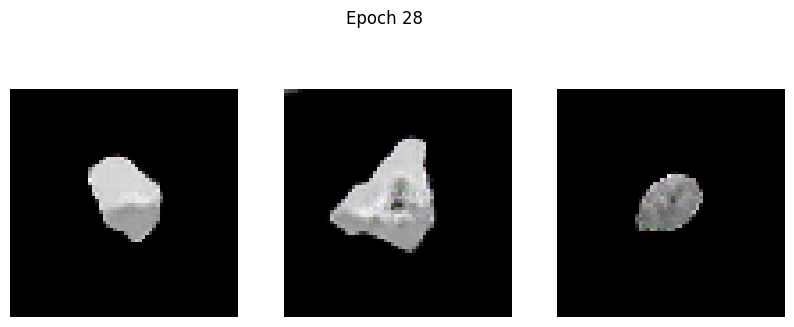

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4777 - g_loss: 1.2755
Epoch 29/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4463 - g_loss: 1.2951

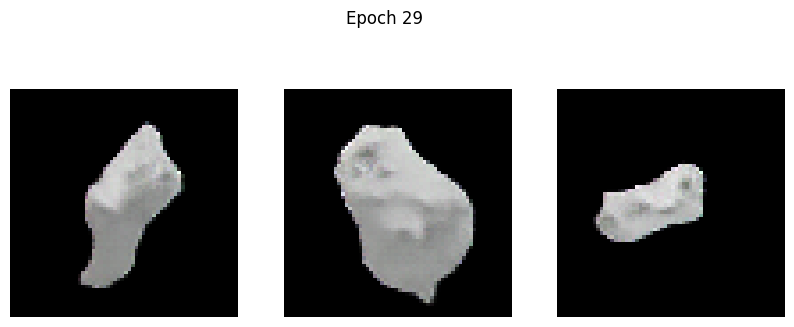

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4463 - g_loss: 1.2951
Epoch 30/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4453 - g_loss: 1.3537

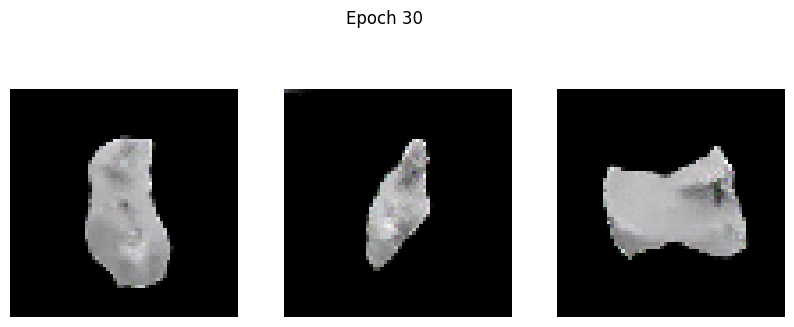

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4453 - g_loss: 1.3536
Epoch 31/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5022 - g_loss: 1.4240

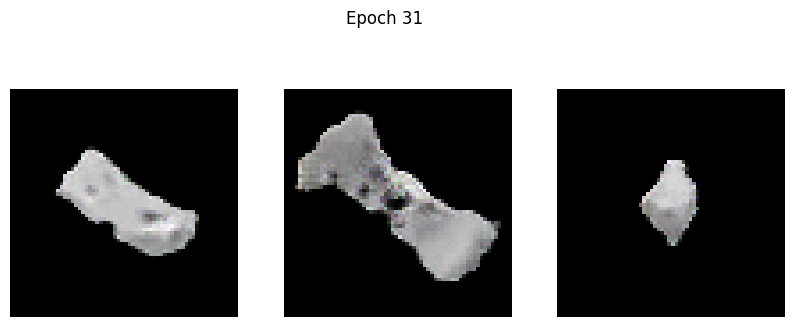

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5019 - g_loss: 1.4235
Epoch 32/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4308 - g_loss: 1.3594

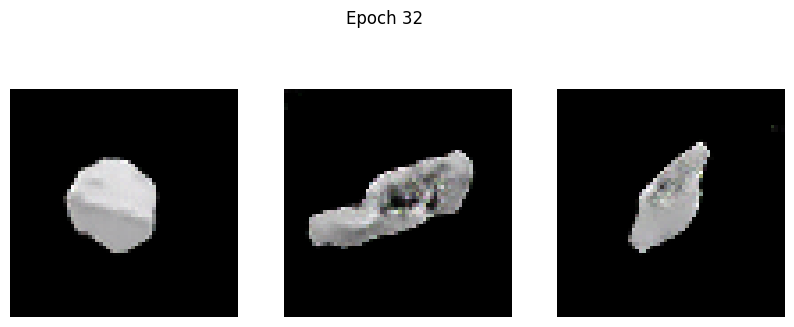

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4307 - g_loss: 1.3595
Epoch 33/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4325 - g_loss: 1.4770

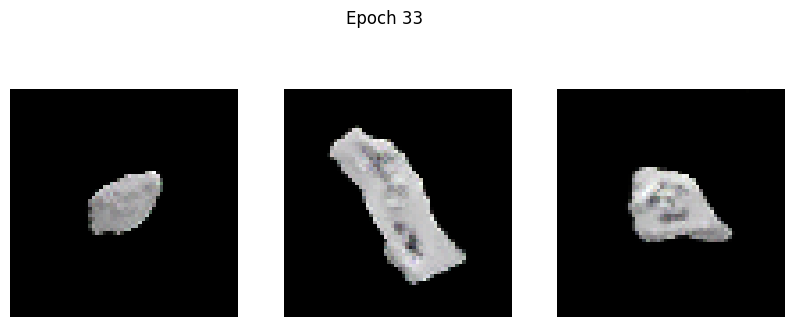

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4324 - g_loss: 1.4766
Epoch 34/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4262 - g_loss: 1.4633

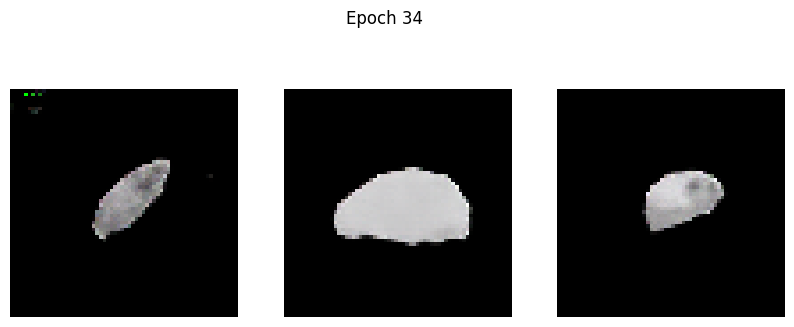

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4261 - g_loss: 1.4633
Epoch 35/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4070 - g_loss: 1.4951

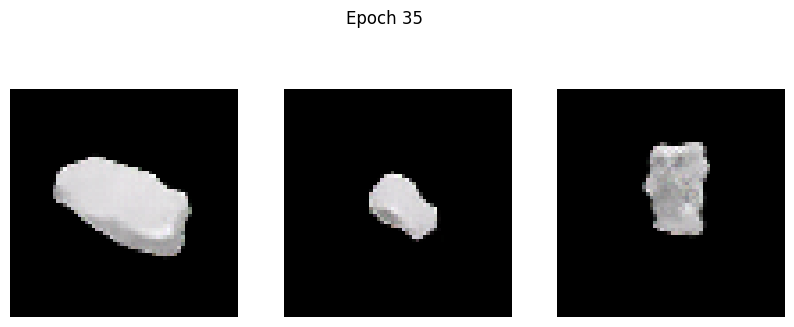

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4071 - g_loss: 1.4950
Epoch 36/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3655 - g_loss: 1.5114

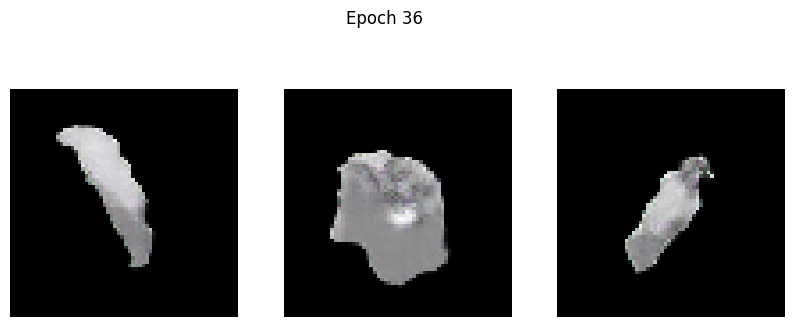

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3657 - g_loss: 1.5117
Epoch 37/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3701 - g_loss: 1.5493

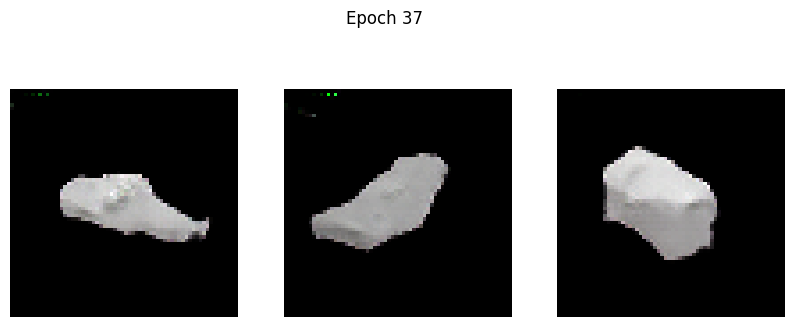

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3706 - g_loss: 1.5501
Epoch 38/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5520 - g_loss: 1.2985

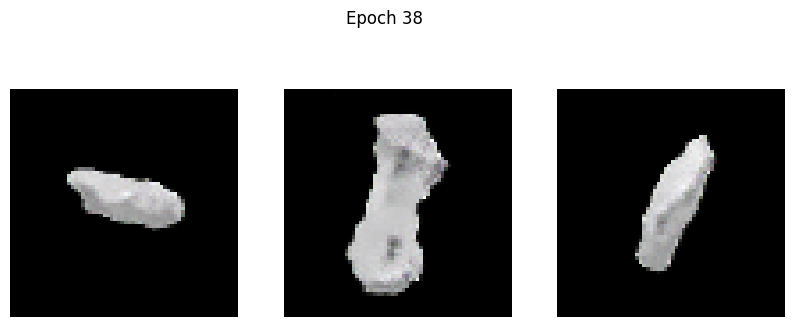

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5507 - g_loss: 1.2991
Epoch 39/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3761 - g_loss: 1.5254

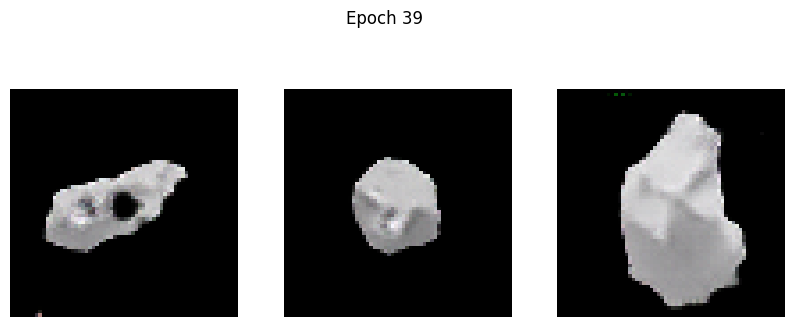

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3761 - g_loss: 1.5257
Epoch 40/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3547 - g_loss: 1.5939

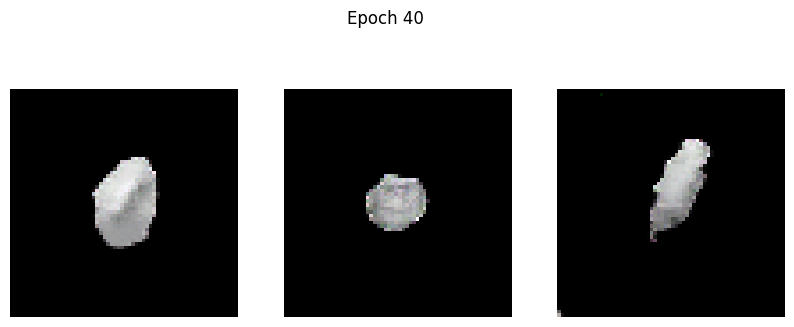

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3547 - g_loss: 1.5940
Epoch 41/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3781 - g_loss: 1.6180

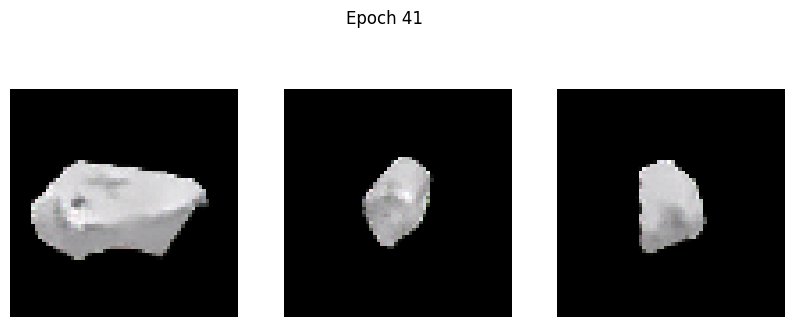

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3780 - g_loss: 1.6184
Epoch 42/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4197 - g_loss: 1.6837

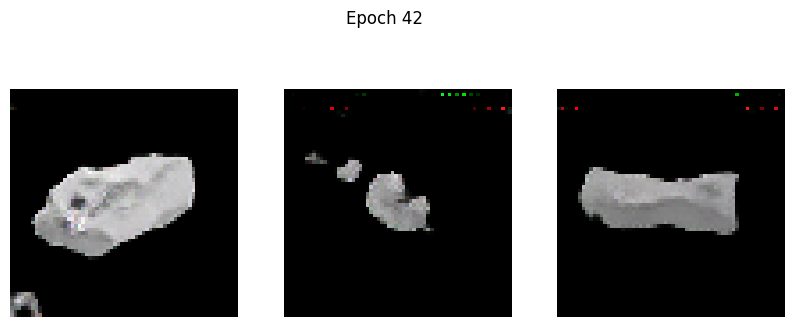

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4194 - g_loss: 1.6835
Epoch 43/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3557 - g_loss: 1.7055

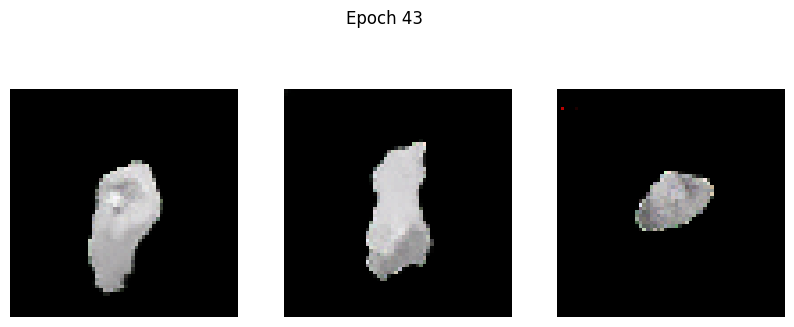

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3558 - g_loss: 1.7054
Epoch 44/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4099 - g_loss: 1.7389

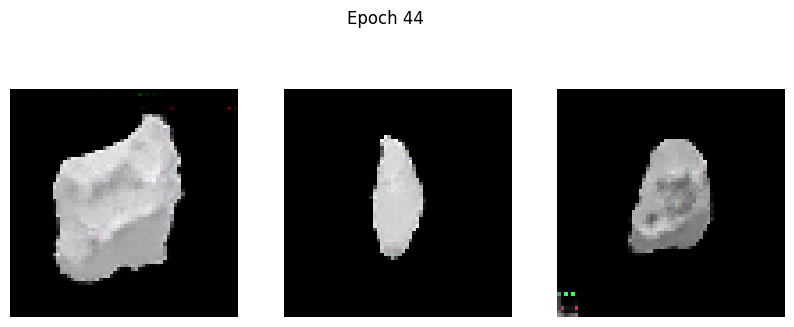

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4096 - g_loss: 1.7384
Epoch 45/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3851 - g_loss: 1.7341

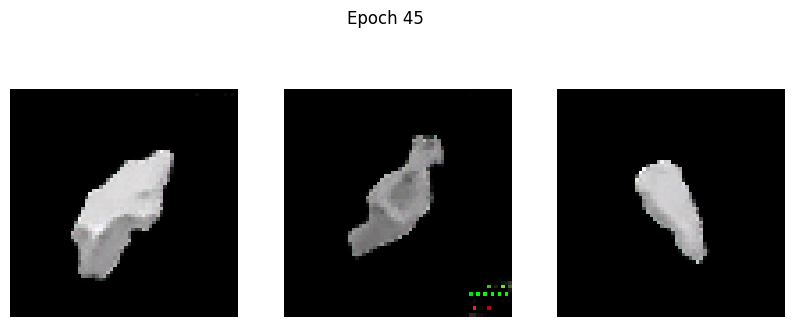

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3849 - g_loss: 1.7337
Epoch 46/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3527 - g_loss: 1.7082

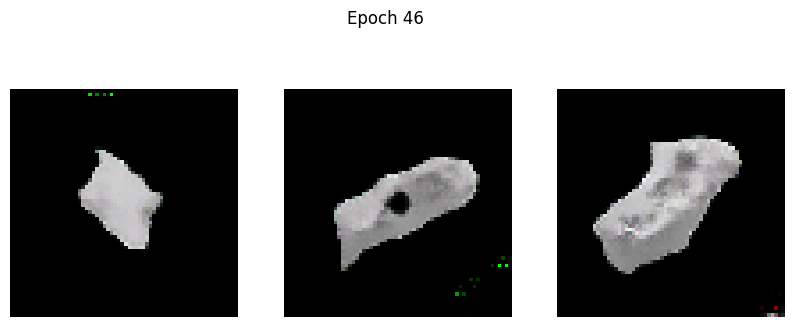

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3525 - g_loss: 1.7085
Epoch 47/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4022 - g_loss: 1.7961

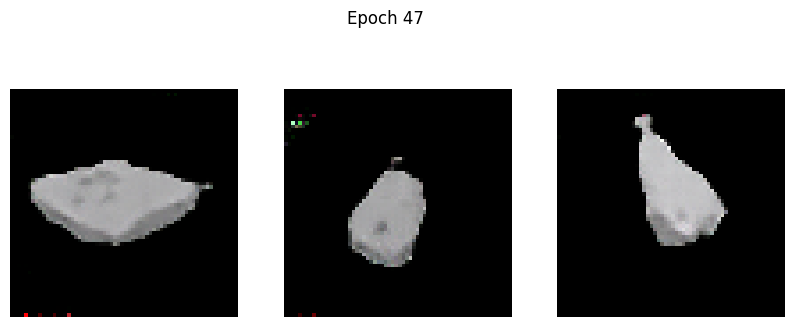

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4019 - g_loss: 1.7958
Epoch 48/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3388 - g_loss: 1.7384

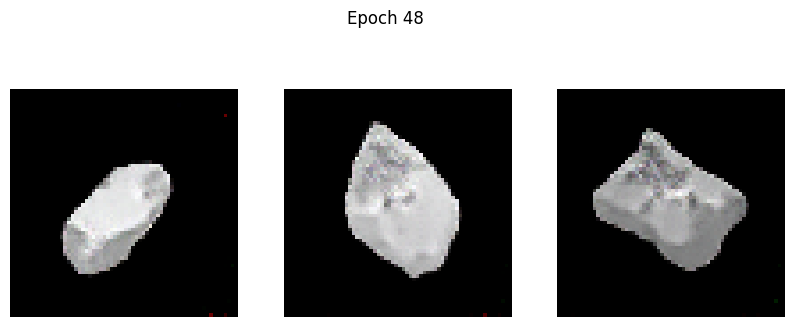

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3391 - g_loss: 1.7391
Epoch 49/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3243 - g_loss: 1.6710

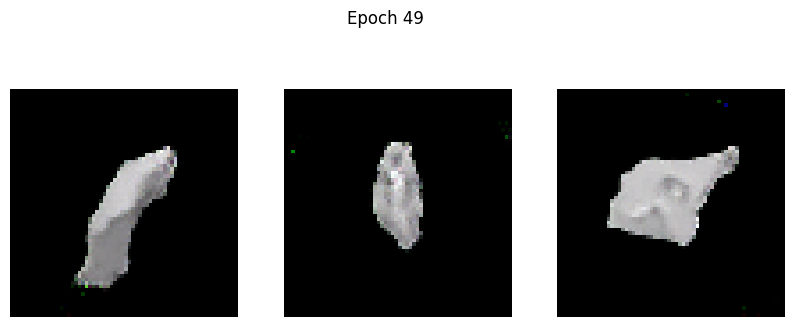

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3244 - g_loss: 1.6716
Epoch 50/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3150 - g_loss: 1.7795

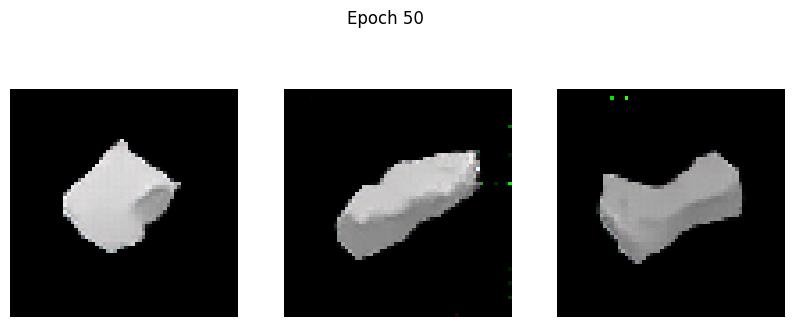

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3153 - g_loss: 1.7796
Epoch 51/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3756 - g_loss: 1.7174

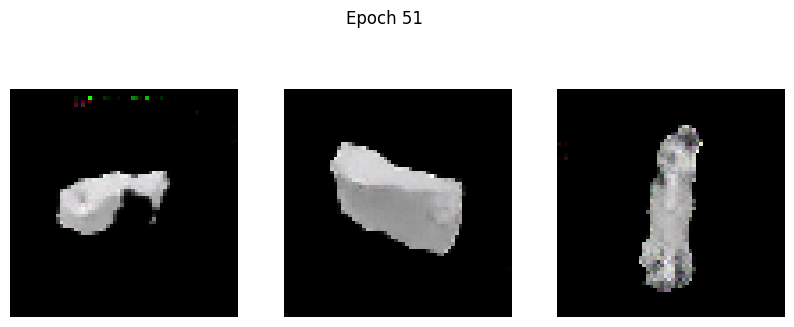

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3755 - g_loss: 1.7179
Epoch 52/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3680 - g_loss: 1.8281

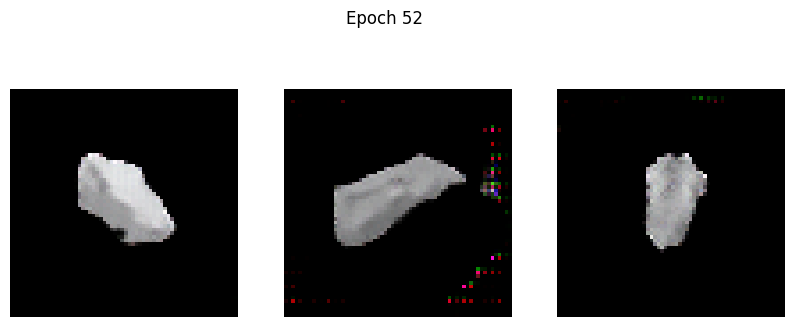

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3680 - g_loss: 1.8282
Epoch 53/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3616 - g_loss: 1.8330

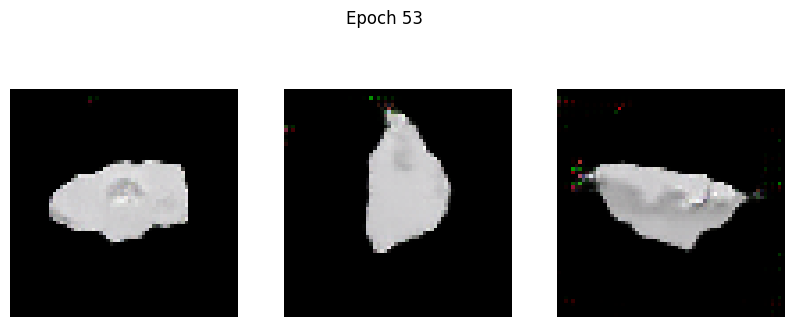

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3614 - g_loss: 1.8324
Epoch 54/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3210 - g_loss: 1.8031

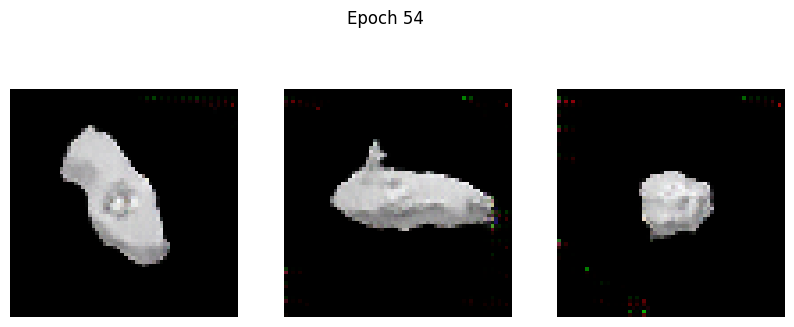

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3216 - g_loss: 1.8038
Epoch 55/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3224 - g_loss: 1.7198

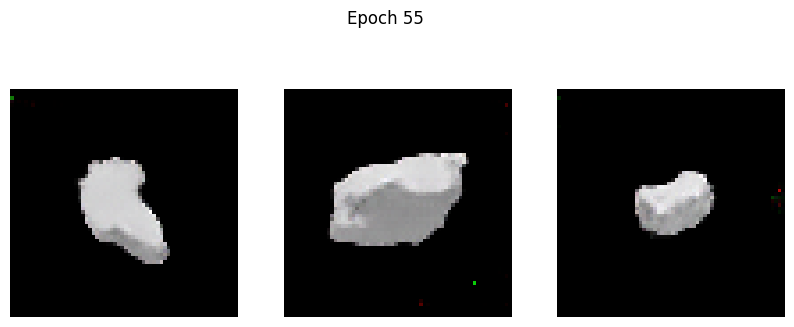

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3223 - g_loss: 1.7199
Epoch 56/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3077 - g_loss: 1.8013

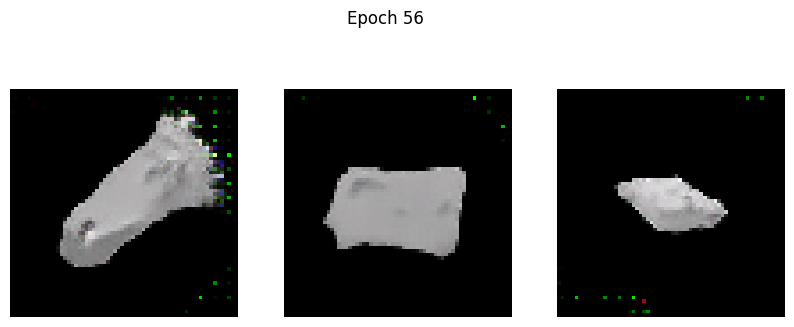

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3079 - g_loss: 1.8015
Epoch 57/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2989 - g_loss: 1.8913

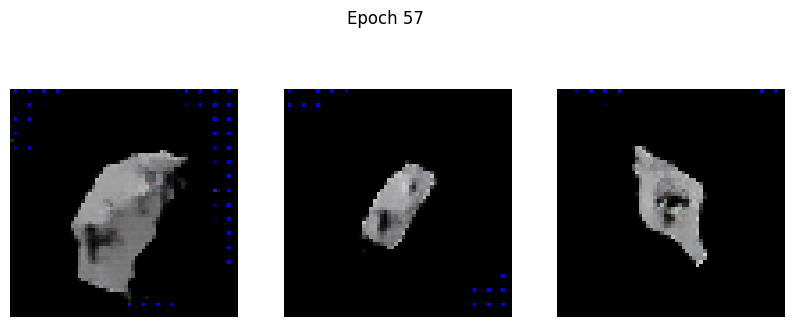

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2996 - g_loss: 1.8924
Epoch 58/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3194 - g_loss: 1.8712

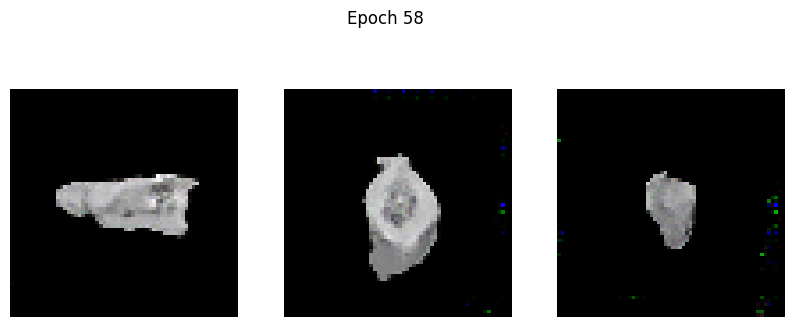

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3194 - g_loss: 1.8708
Epoch 59/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3163 - g_loss: 1.8403

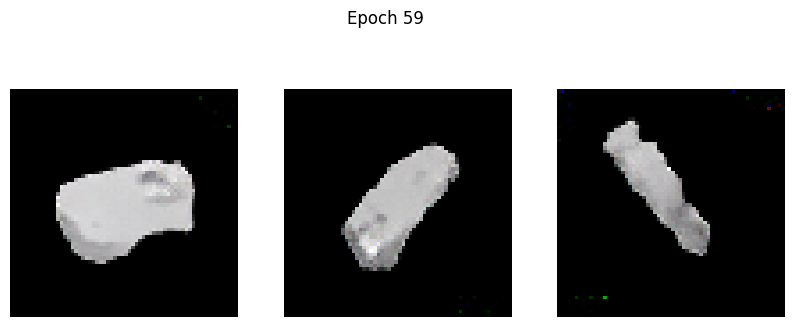

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3163 - g_loss: 1.8402
Epoch 60/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3036 - g_loss: 1.8688

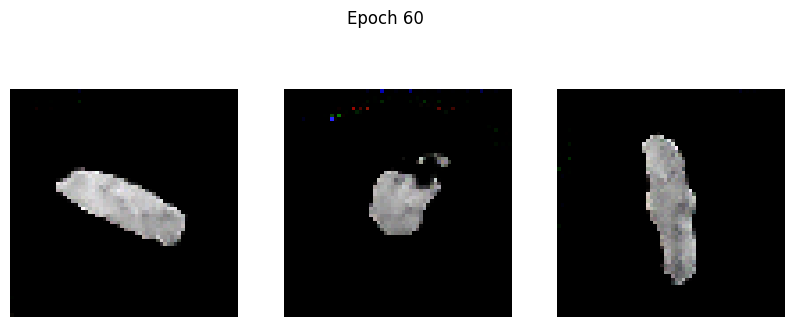

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.3035 - g_loss: 1.8688
Epoch 61/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3265 - g_loss: 1.9798

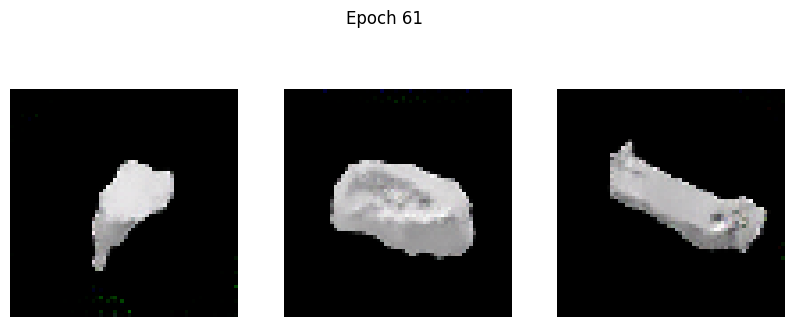

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3265 - g_loss: 1.9796
Epoch 62/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3010 - g_loss: 1.9337

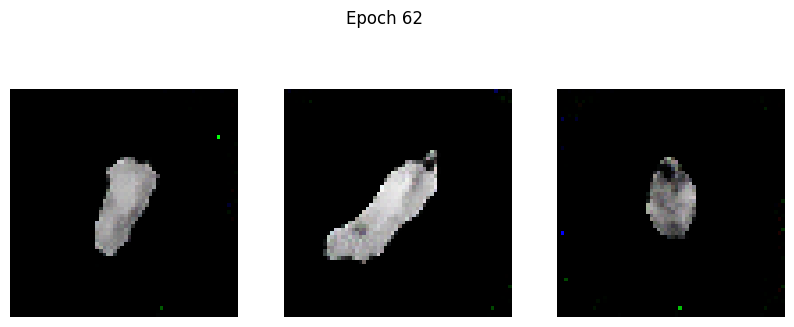

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3012 - g_loss: 1.9339
Epoch 63/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3414 - g_loss: 1.9705

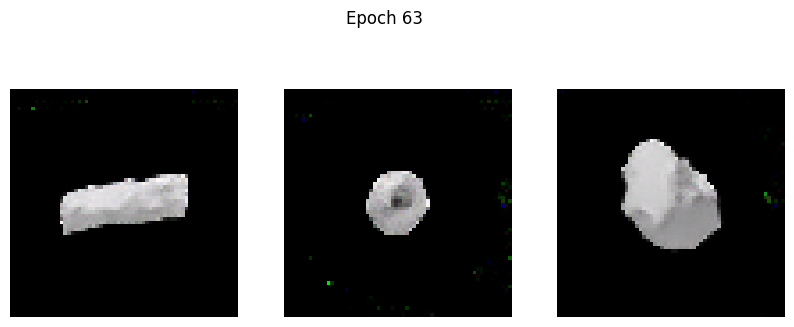

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.3416 - g_loss: 1.9705
Epoch 64/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2934 - g_loss: 1.9098

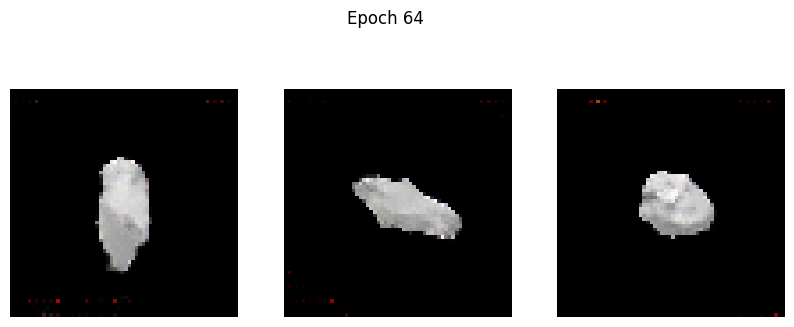

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2936 - g_loss: 1.9102
Epoch 65/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3144 - g_loss: 1.9189

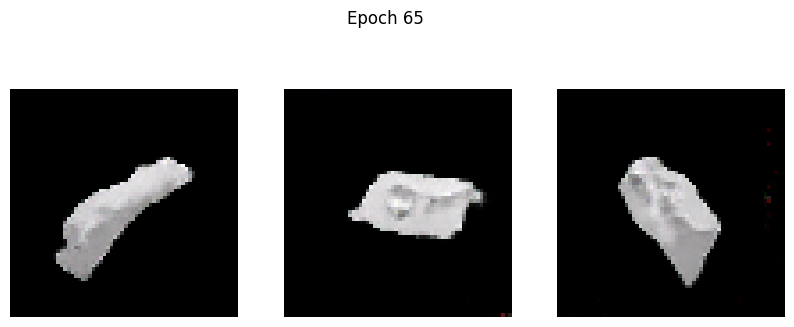

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3142 - g_loss: 1.9192
Epoch 66/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2883 - g_loss: 1.9916

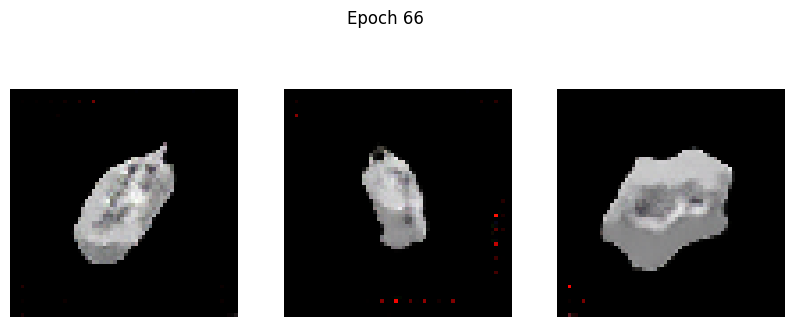

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2882 - g_loss: 1.9916
Epoch 67/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2882 - g_loss: 2.1108

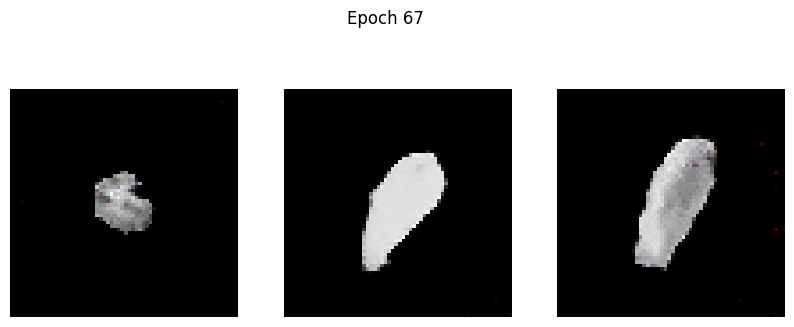

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2882 - g_loss: 2.1103
Epoch 68/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3772 - g_loss: 2.1788

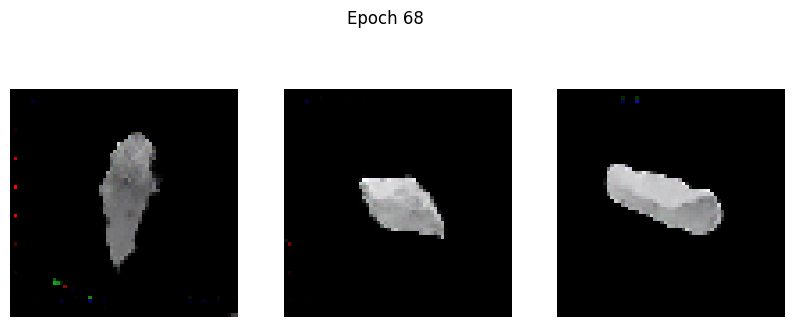

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3767 - g_loss: 2.1774
Epoch 69/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2839 - g_loss: 2.0286

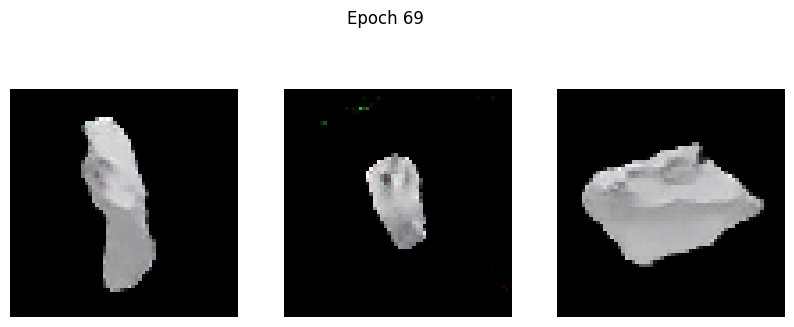

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2838 - g_loss: 2.0285
Epoch 70/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2823 - g_loss: 2.0816

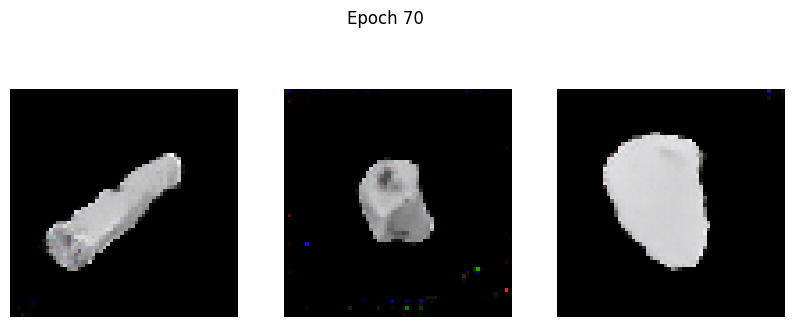

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2823 - g_loss: 2.0816
Epoch 71/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2633 - g_loss: 2.0990

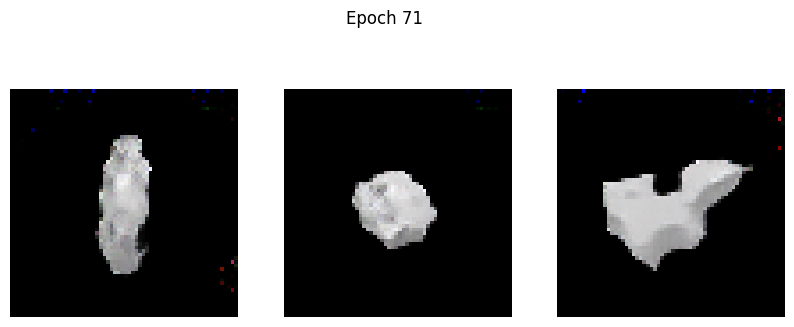

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2635 - g_loss: 2.0992
Epoch 72/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2769 - g_loss: 2.0300

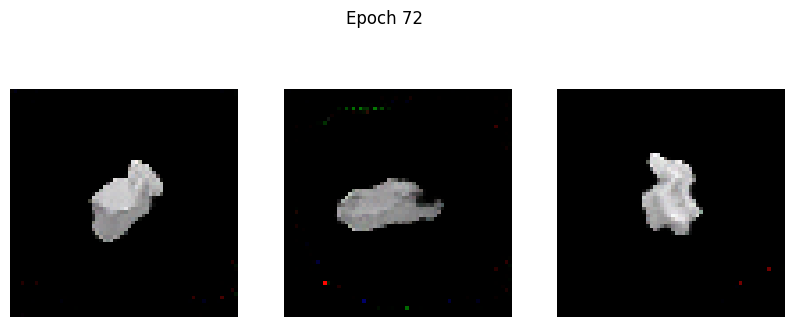

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2770 - g_loss: 2.0305
Epoch 73/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2769 - g_loss: 2.1300

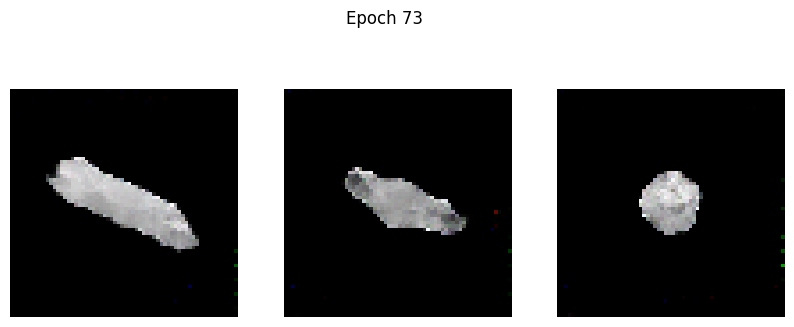

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2772 - g_loss: 2.1301
Epoch 74/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2992 - g_loss: 2.2097

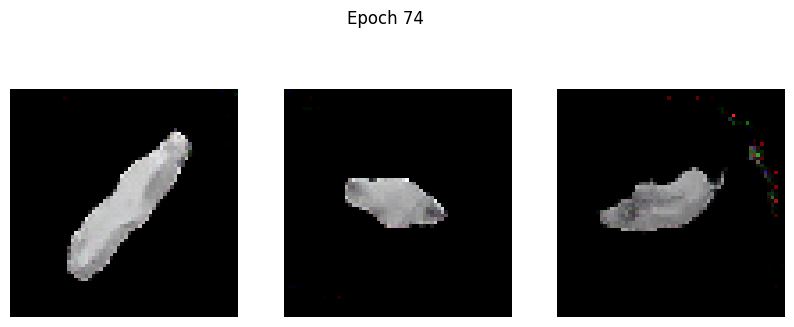

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2997 - g_loss: 2.2091
Epoch 75/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2370 - g_loss: 2.0396

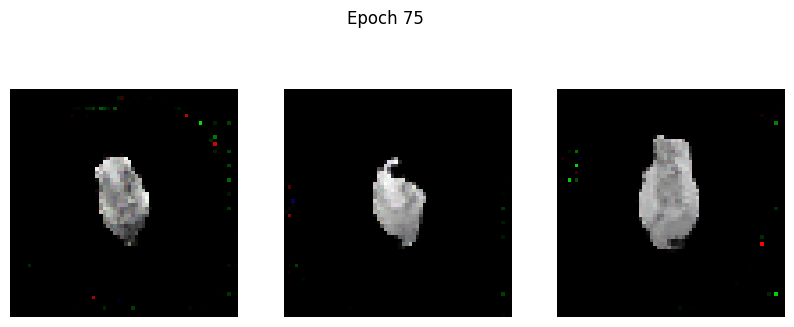

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2369 - g_loss: 2.0397
Epoch 76/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2851 - g_loss: 2.1935

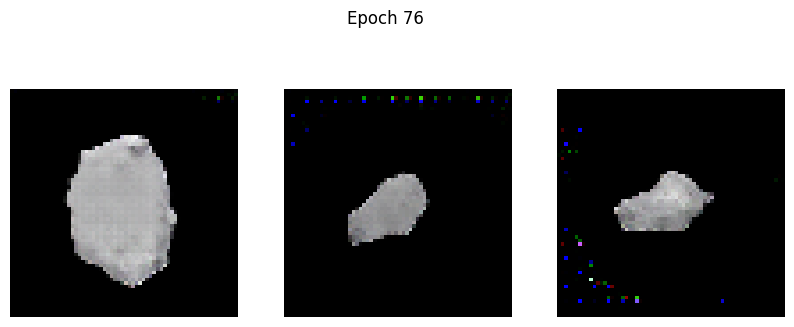

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2870 - g_loss: 2.1961
Epoch 77/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3677 - g_loss: 1.8267

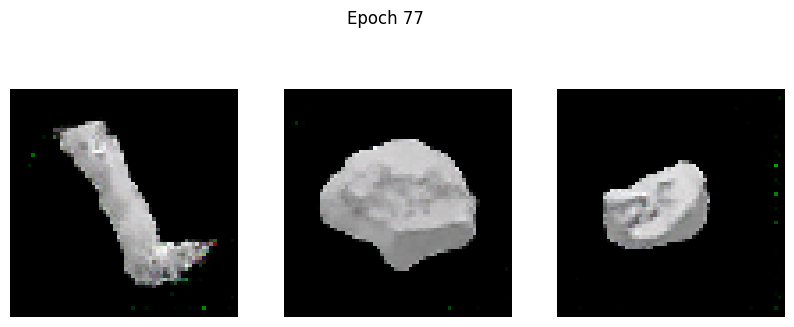

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3671 - g_loss: 1.8273
Epoch 78/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2498 - g_loss: 2.0114

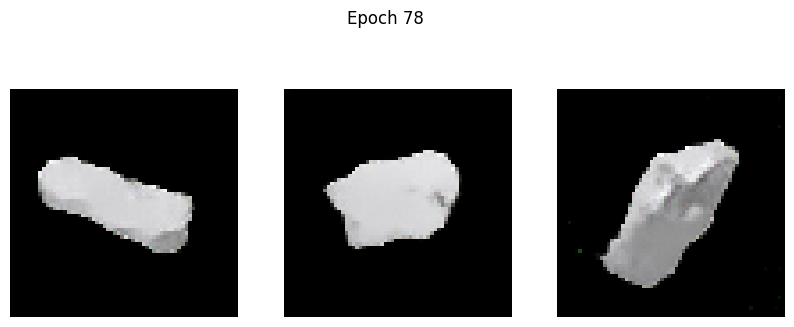

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2498 - g_loss: 2.0117
Epoch 79/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3256 - g_loss: 2.1801

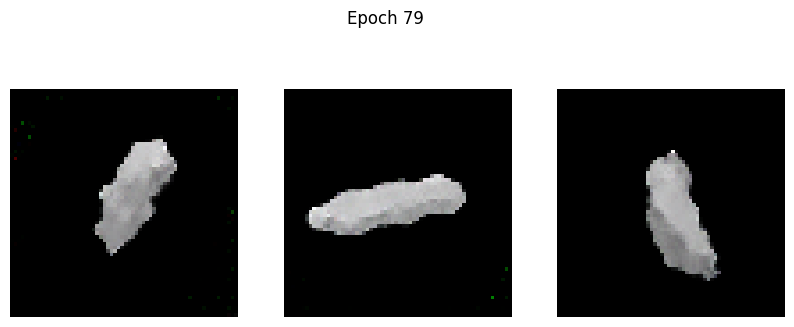

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3253 - g_loss: 2.1793
Epoch 80/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2238 - g_loss: 2.0891

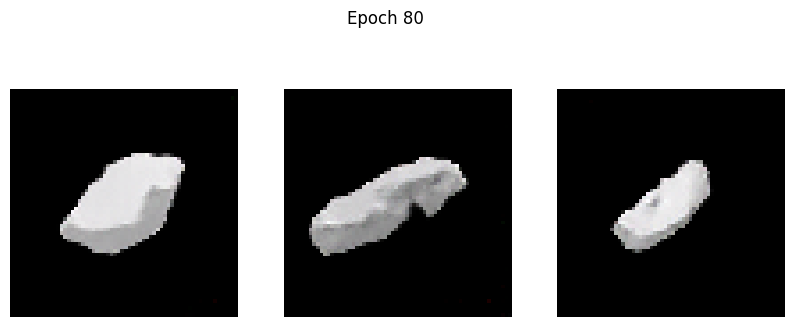

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2239 - g_loss: 2.0894
Epoch 81/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2522 - g_loss: 2.1754

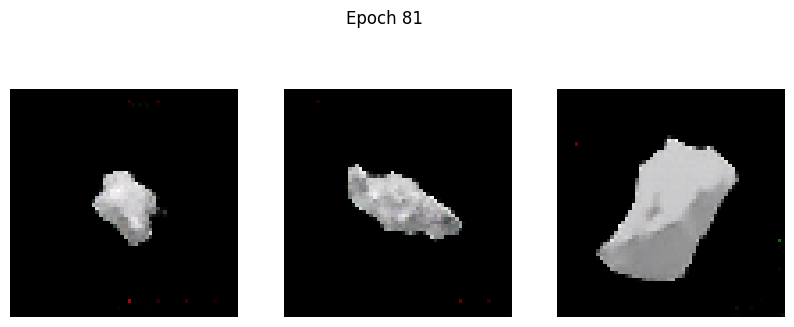

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2523 - g_loss: 2.1754
Epoch 82/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2551 - g_loss: 2.2316

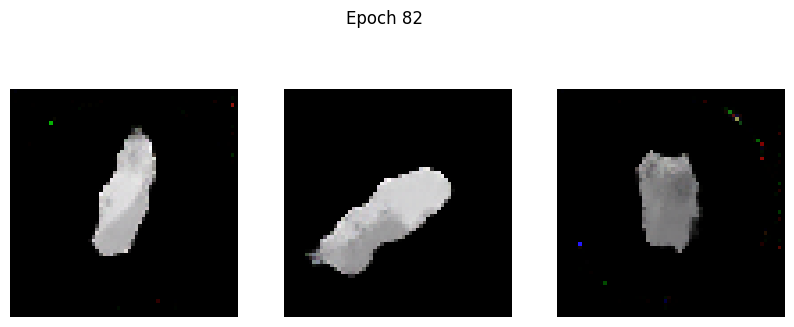

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2552 - g_loss: 2.2314
Epoch 83/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2423 - g_loss: 2.1782

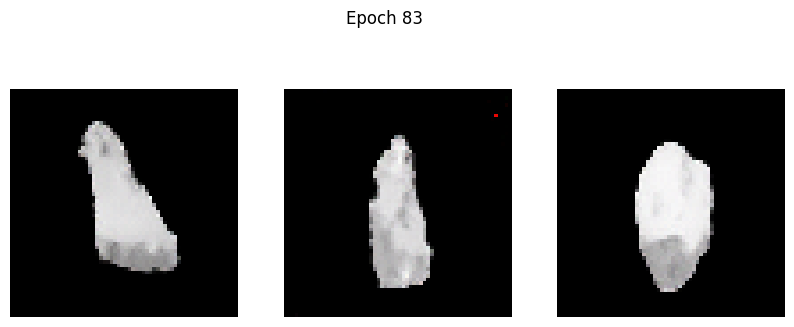

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2423 - g_loss: 2.1783
Epoch 84/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2657 - g_loss: 2.3717

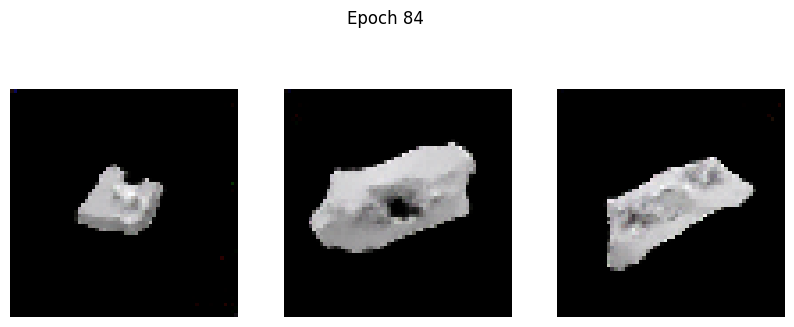

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2656 - g_loss: 2.3711
Epoch 85/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2339 - g_loss: 2.2711

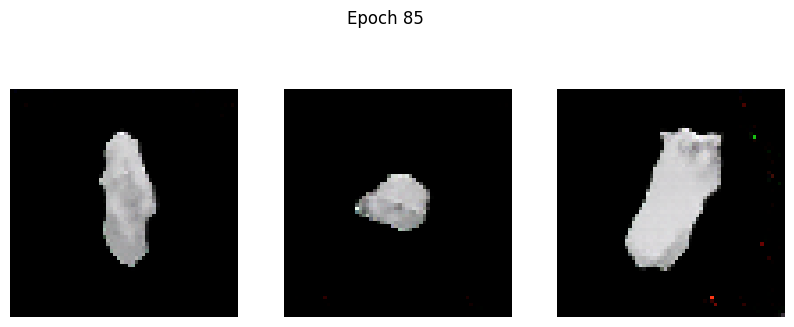

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2341 - g_loss: 2.2713
Epoch 86/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2374 - g_loss: 2.3233

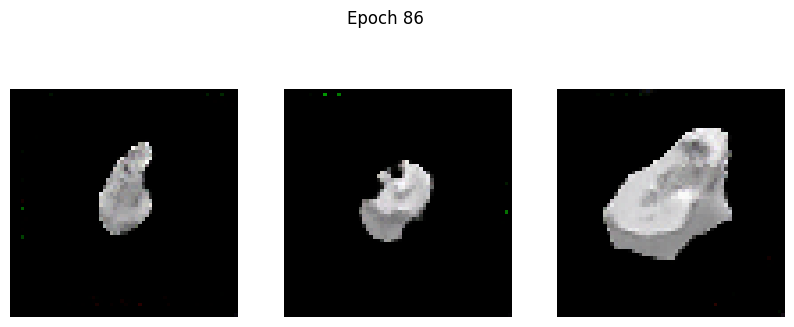

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2375 - g_loss: 2.3232
Epoch 87/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2375 - g_loss: 2.2778

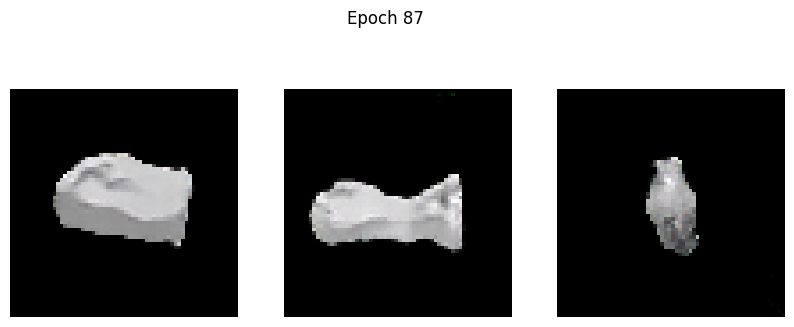

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2377 - g_loss: 2.2781
Epoch 88/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2609 - g_loss: 2.4495

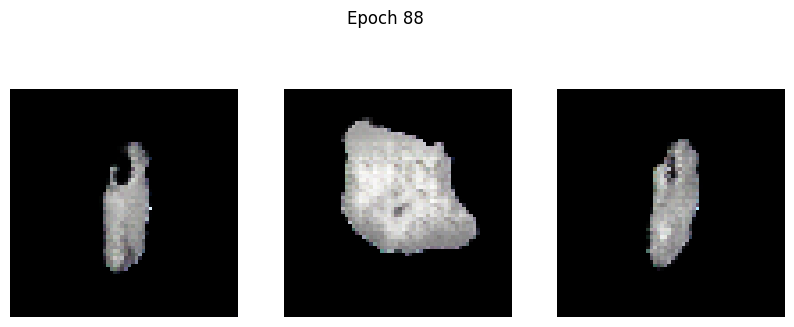

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2637 - g_loss: 2.4557
Epoch 89/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4489 - g_loss: 2.3006

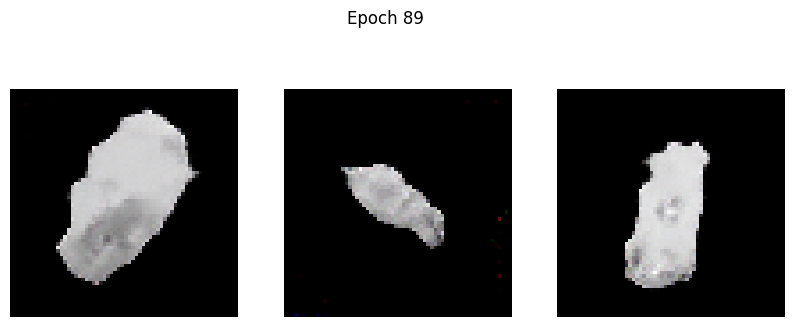

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4475 - g_loss: 2.2987
Epoch 90/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2324 - g_loss: 2.0828

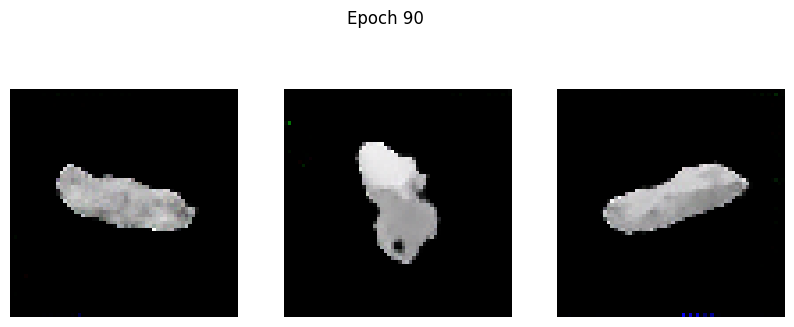

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2324 - g_loss: 2.0830
Epoch 91/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2134 - g_loss: 2.1763

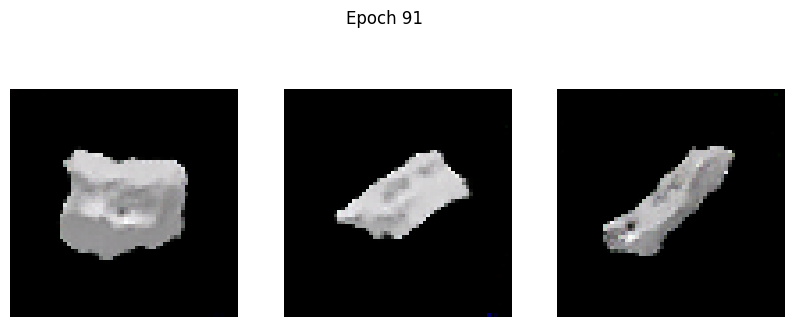

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2135 - g_loss: 2.1766
Epoch 92/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2244 - g_loss: 2.2443

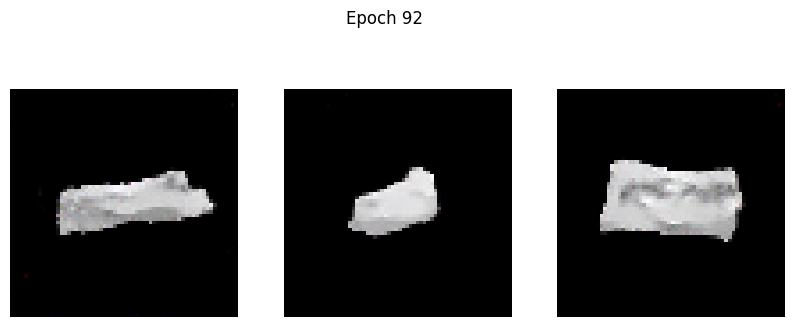

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2245 - g_loss: 2.2444
Epoch 93/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2082 - g_loss: 2.2680

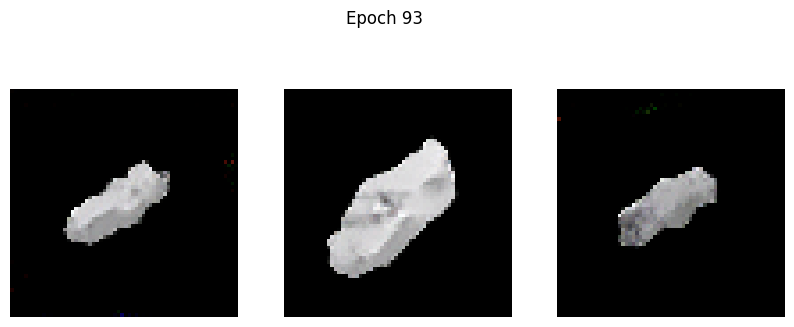

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2083 - g_loss: 2.2678
Epoch 94/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3348 - g_loss: 2.4154

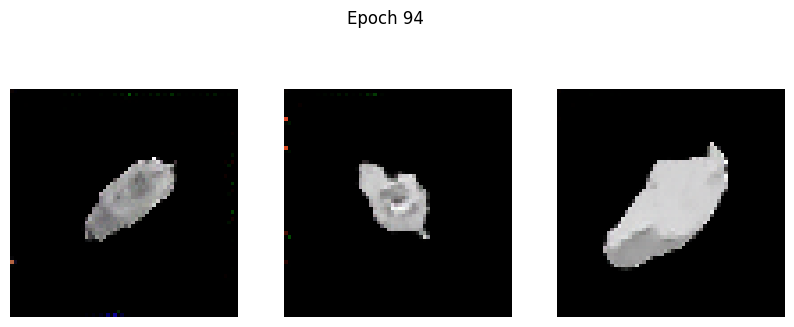

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3342 - g_loss: 2.4147
Epoch 95/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2128 - g_loss: 2.3285

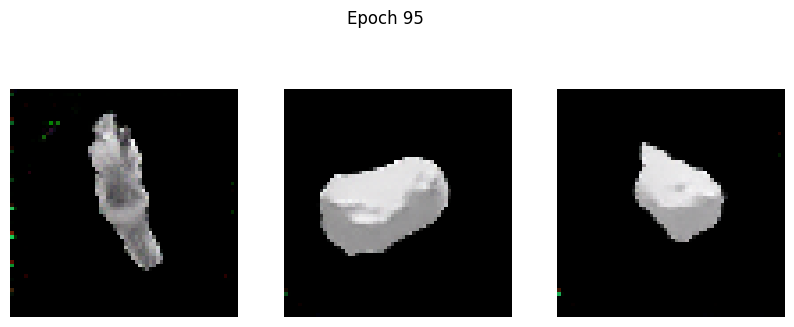

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2129 - g_loss: 2.3288
Epoch 96/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2279 - g_loss: 2.3985

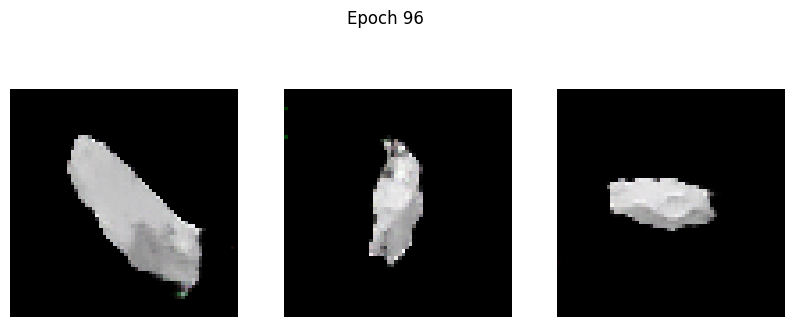

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2282 - g_loss: 2.3987
Epoch 97/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2248 - g_loss: 2.3706

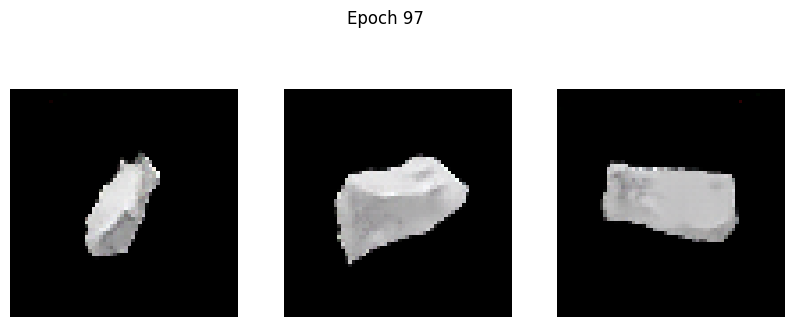

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2249 - g_loss: 2.3706
Epoch 98/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2136 - g_loss: 2.3758

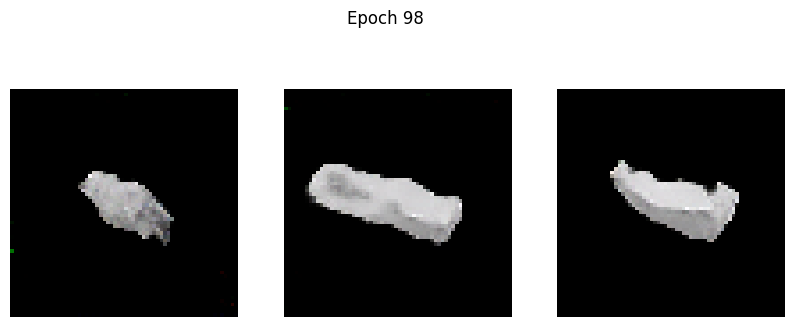

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2137 - g_loss: 2.3760
Epoch 99/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2357 - g_loss: 2.4829

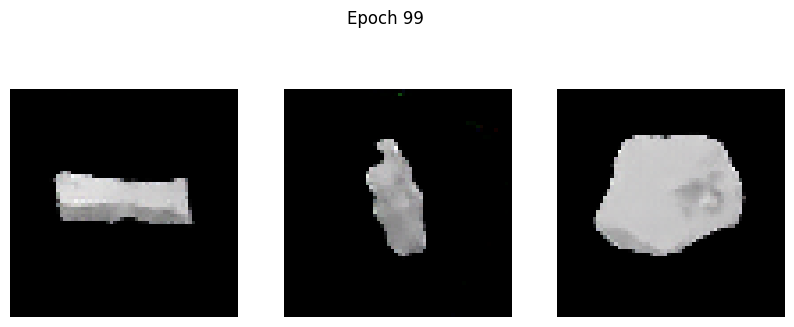

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2363 - g_loss: 2.4830
Epoch 100/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2131 - g_loss: 2.4035

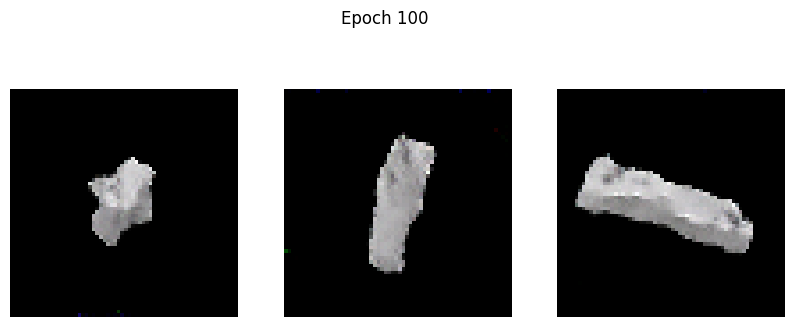

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2131 - g_loss: 2.4035
Epoch 101/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2177 - g_loss: 2.4145

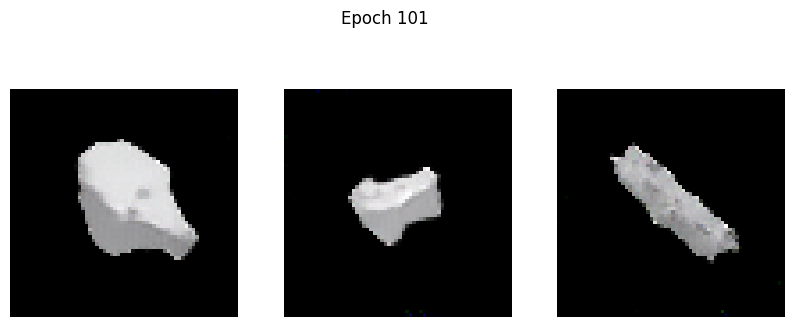

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2177 - g_loss: 2.4146
Epoch 102/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2295 - g_loss: 2.5227

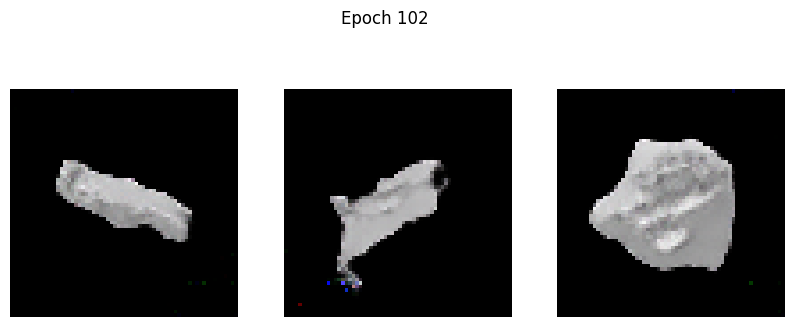

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2293 - g_loss: 2.5222
Epoch 103/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3033 - g_loss: 2.6145

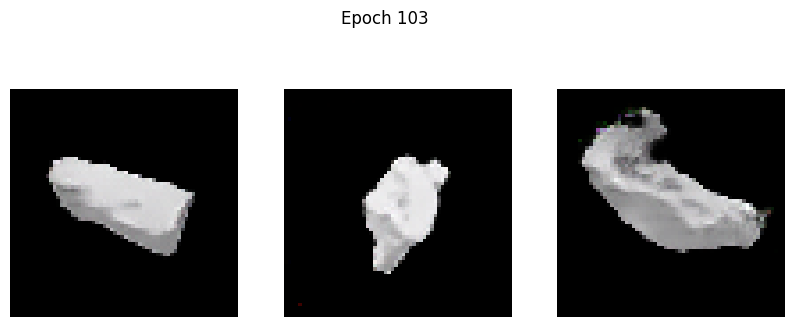

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3030 - g_loss: 2.6133
Epoch 104/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2470 - g_loss: 2.5176

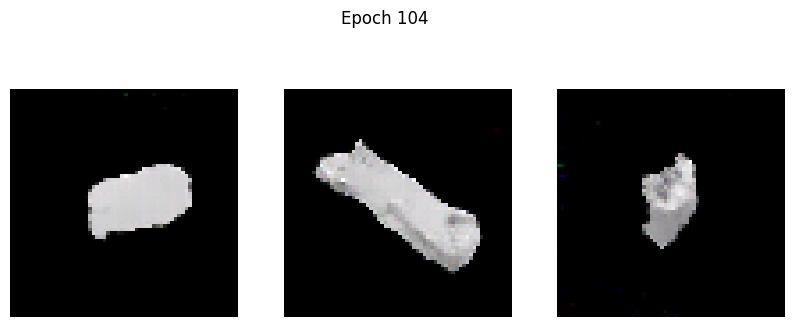

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2467 - g_loss: 2.5170
Epoch 105/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1970 - g_loss: 2.4695

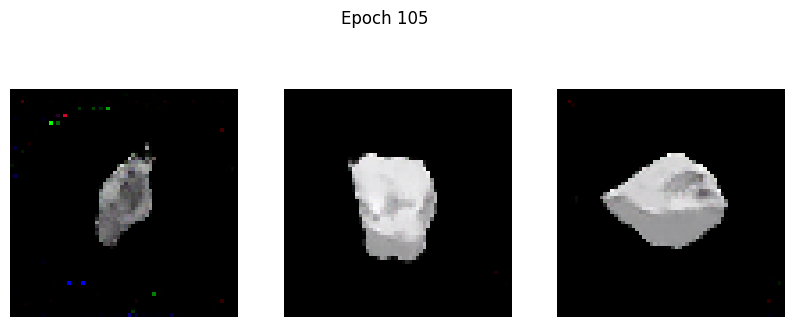

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1969 - g_loss: 2.4695
Epoch 106/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2156 - g_loss: 2.6004

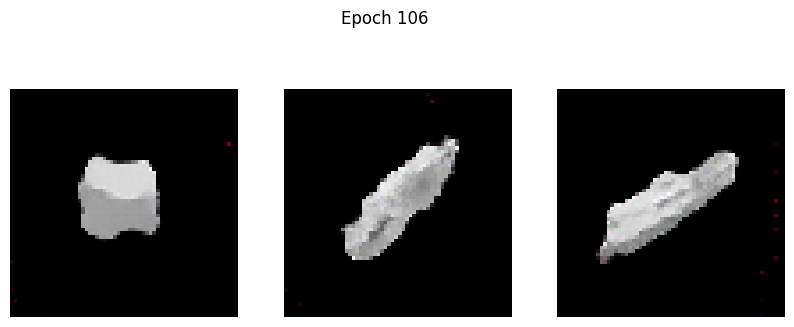

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2156 - g_loss: 2.6004
Epoch 107/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2328 - g_loss: 2.6108

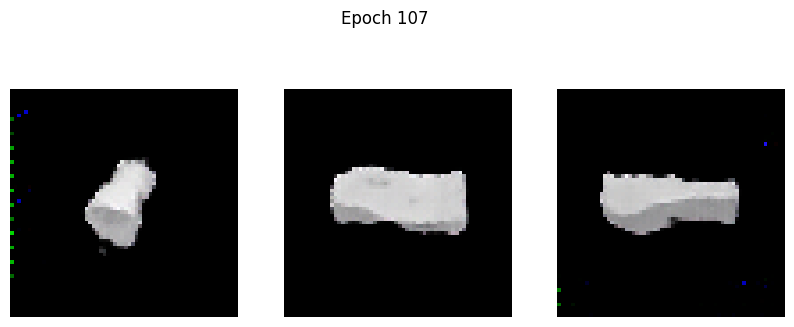

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2338 - g_loss: 2.6122
Epoch 108/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2219 - g_loss: 2.4270

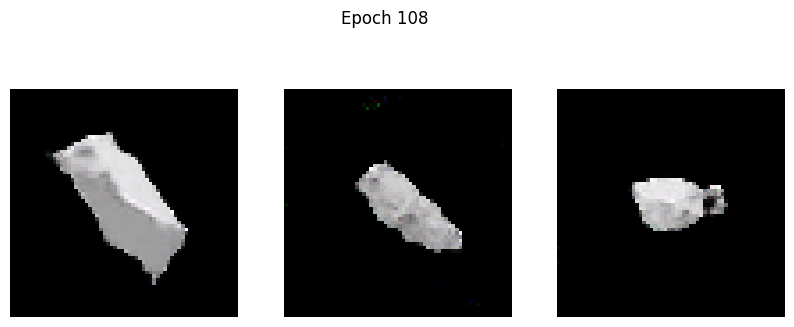

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2219 - g_loss: 2.4270
Epoch 109/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1913 - g_loss: 2.4350

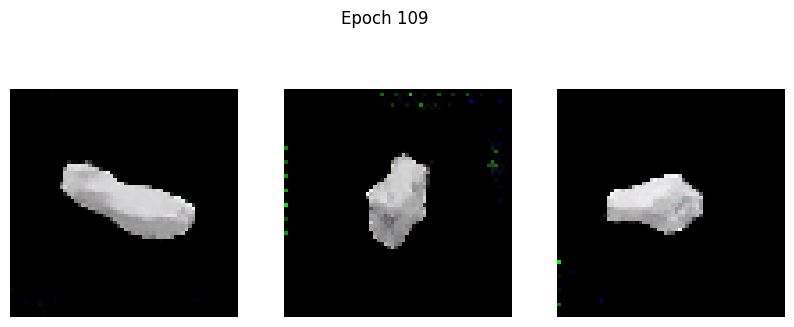

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1916 - g_loss: 2.4356
Epoch 110/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1752 - g_loss: 2.5349

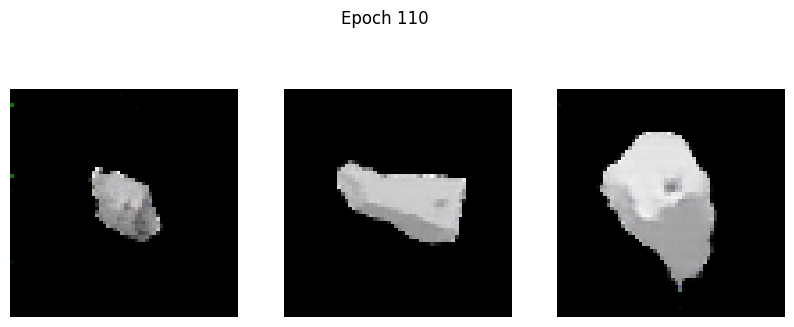

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1753 - g_loss: 2.5349
Epoch 111/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4399 - g_loss: 2.8473

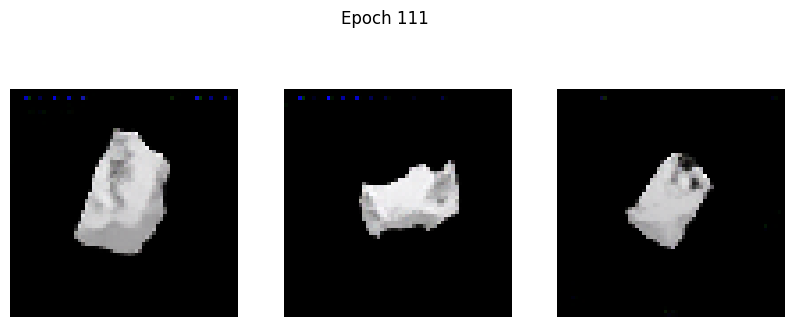

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4397 - g_loss: 2.8462
Epoch 112/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1693 - g_loss: 2.3991

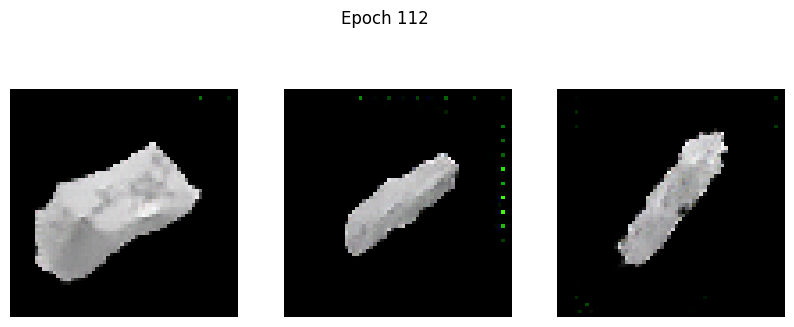

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1693 - g_loss: 2.3994
Epoch 113/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1695 - g_loss: 2.4719

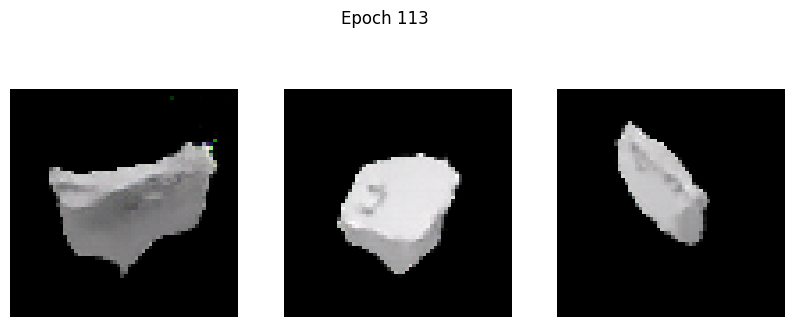

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1696 - g_loss: 2.4723
Epoch 114/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1778 - g_loss: 2.5136

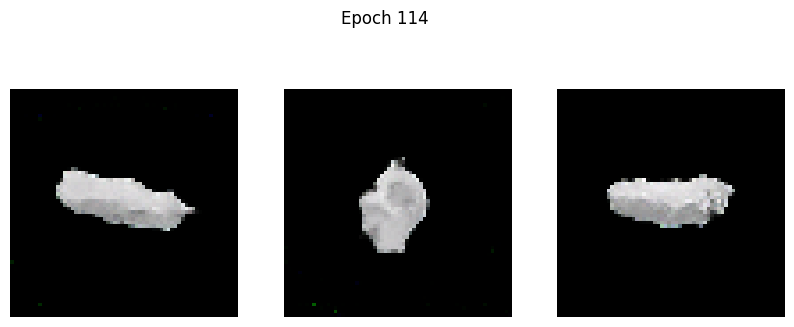

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1780 - g_loss: 2.5136
Epoch 115/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1928 - g_loss: 2.6500

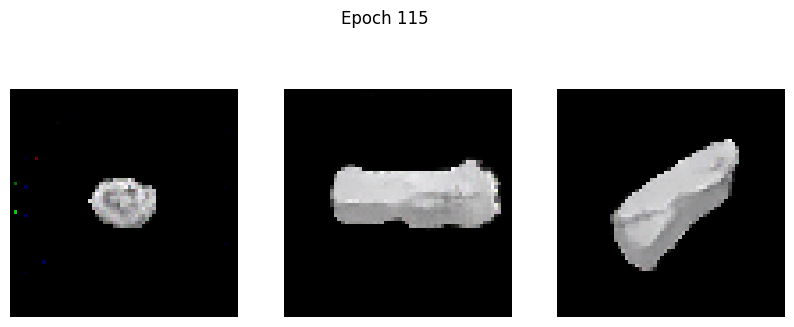

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1928 - g_loss: 2.6499
Epoch 116/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2012 - g_loss: 2.6878

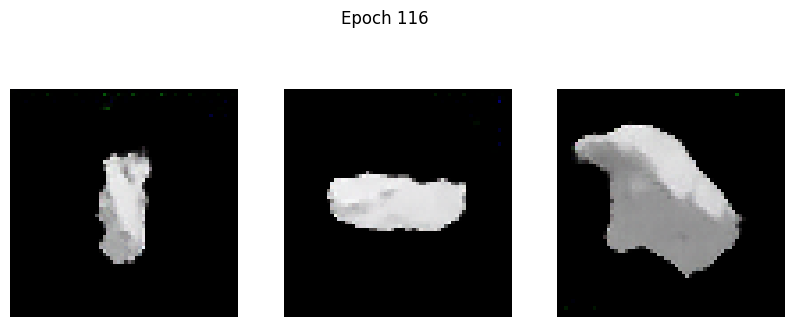

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2013 - g_loss: 2.6877
Epoch 117/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2431 - g_loss: 2.6745

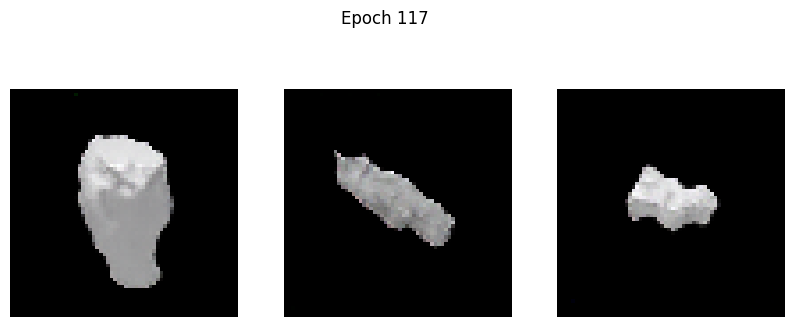

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2429 - g_loss: 2.6745
Epoch 118/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2039 - g_loss: 2.6168

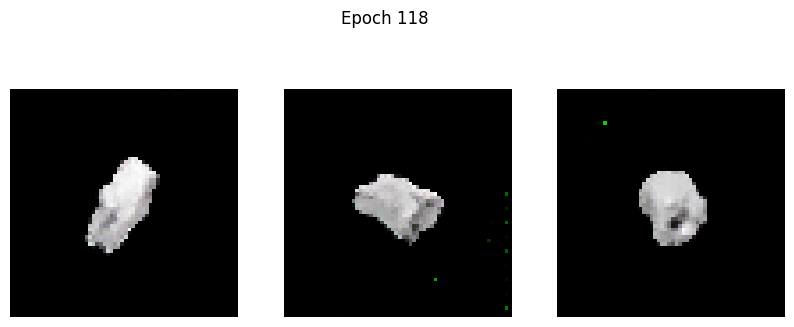

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2041 - g_loss: 2.6173
Epoch 119/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2045 - g_loss: 2.6926

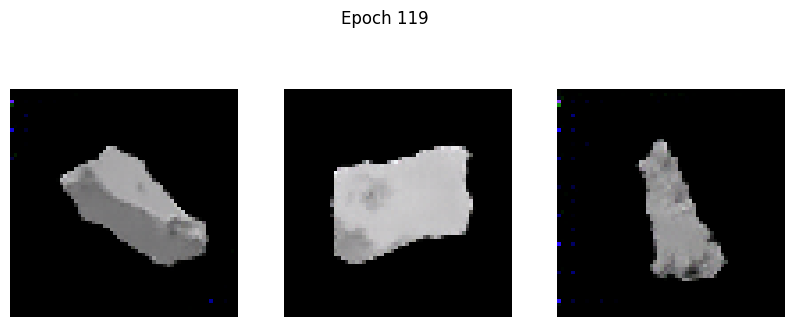

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2047 - g_loss: 2.6925
Epoch 120/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1880 - g_loss: 2.6563

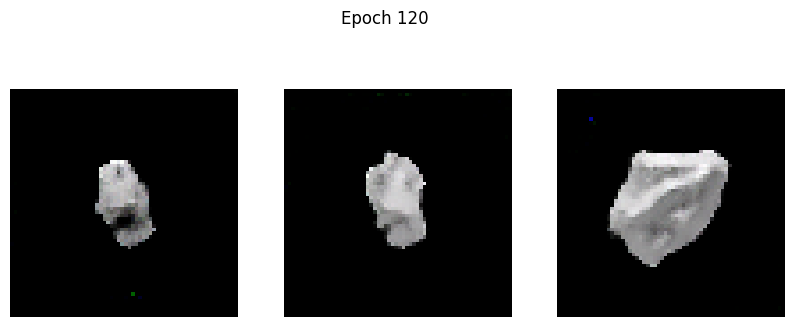

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1880 - g_loss: 2.6564
Epoch 121/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1781 - g_loss: 2.7243

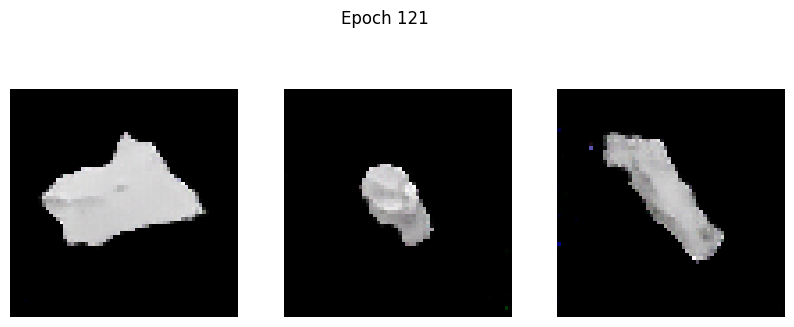

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1781 - g_loss: 2.7243
Epoch 122/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3869 - g_loss: 2.9967

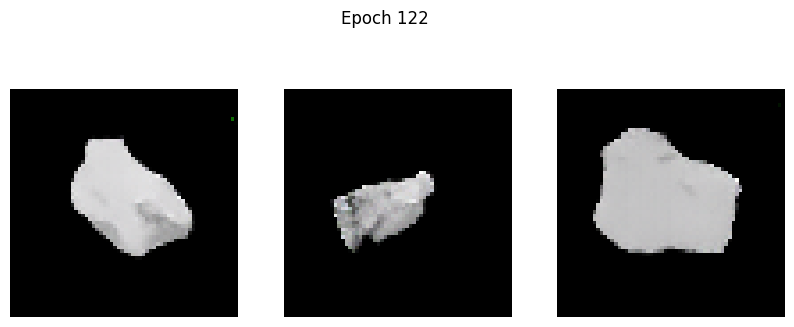

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3871 - g_loss: 2.9963
Epoch 123/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1751 - g_loss: 2.5623

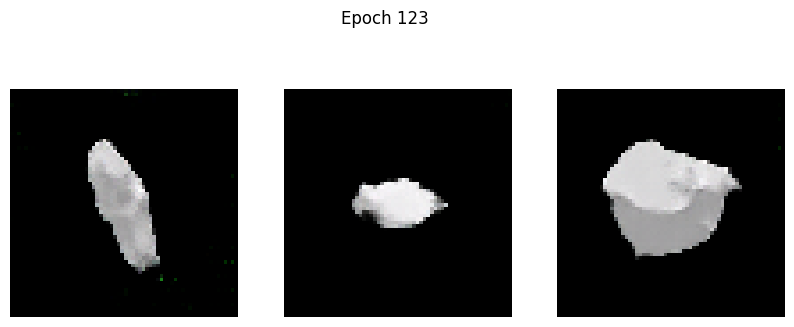

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1751 - g_loss: 2.5623
Epoch 124/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1964 - g_loss: 2.6807

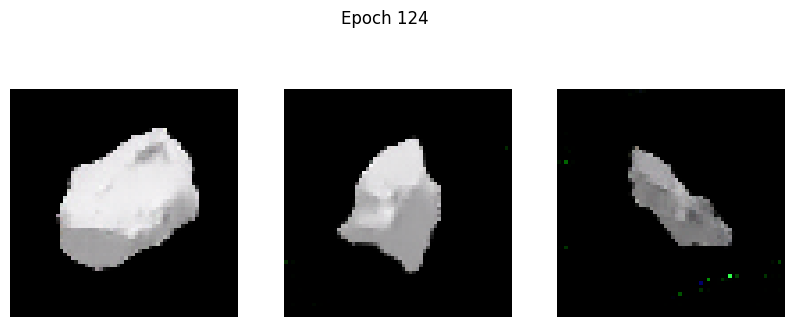

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1963 - g_loss: 2.6805
Epoch 125/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1890 - g_loss: 2.7087

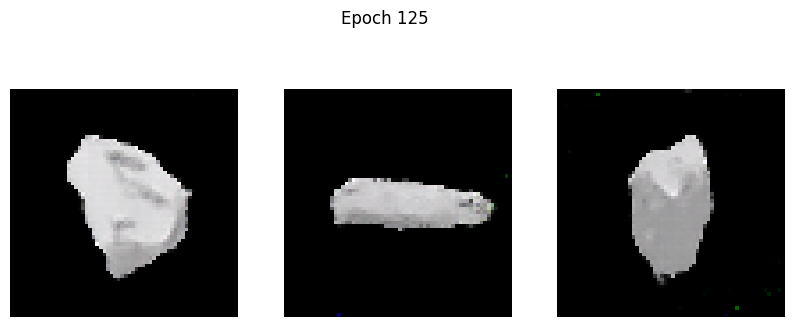

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1888 - g_loss: 2.7086
Epoch 126/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1829 - g_loss: 2.7120

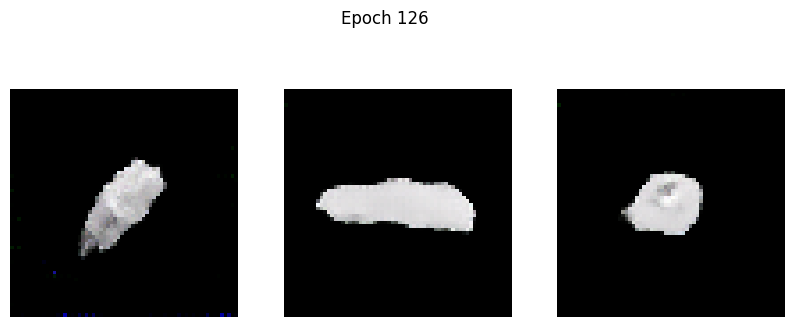

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1830 - g_loss: 2.7128
Epoch 127/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3630 - g_loss: 2.9402

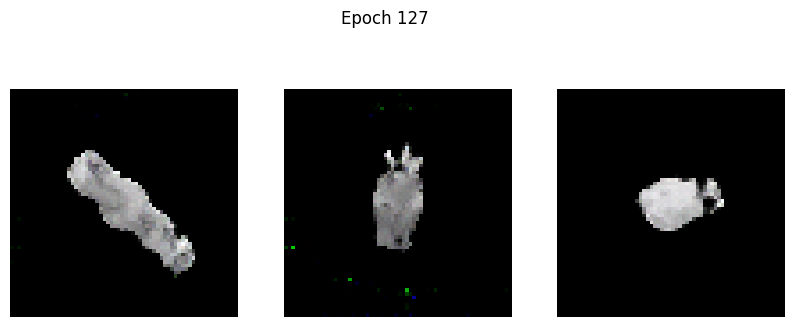

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.3617 - g_loss: 2.9390
Epoch 128/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2071 - g_loss: 2.8057

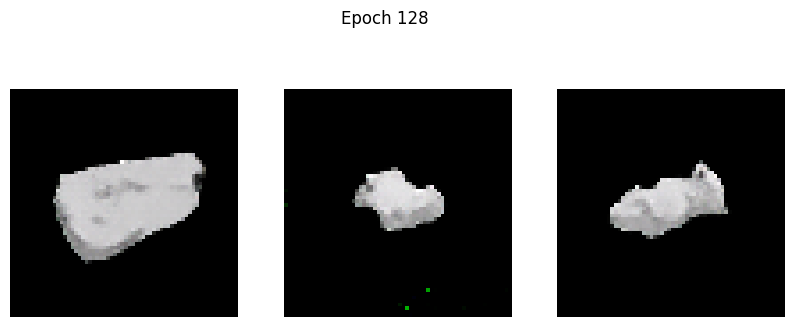

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2069 - g_loss: 2.8056
Epoch 129/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1658 - g_loss: 2.7595

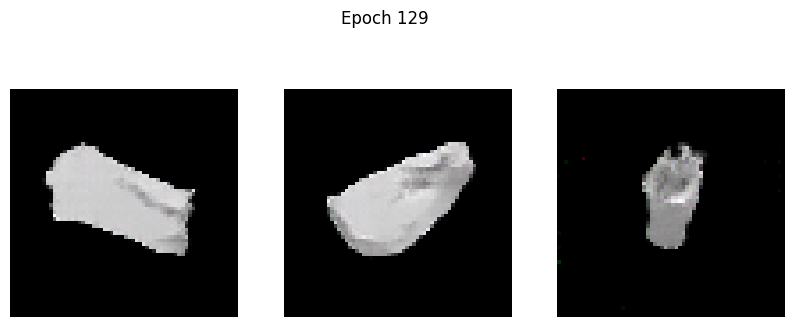

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1660 - g_loss: 2.7594
Epoch 130/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1513 - g_loss: 2.7178

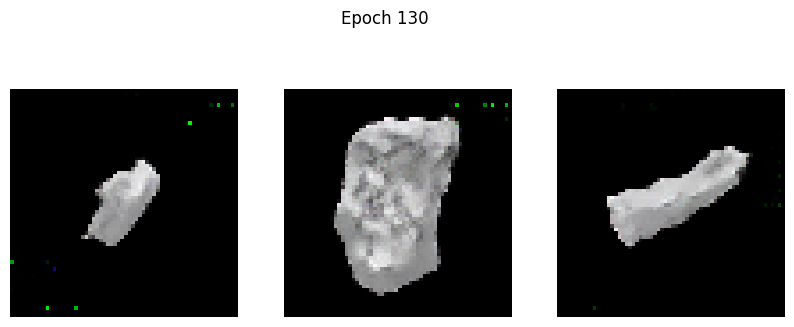

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1514 - g_loss: 2.7186
Epoch 131/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2297 - g_loss: 2.9229

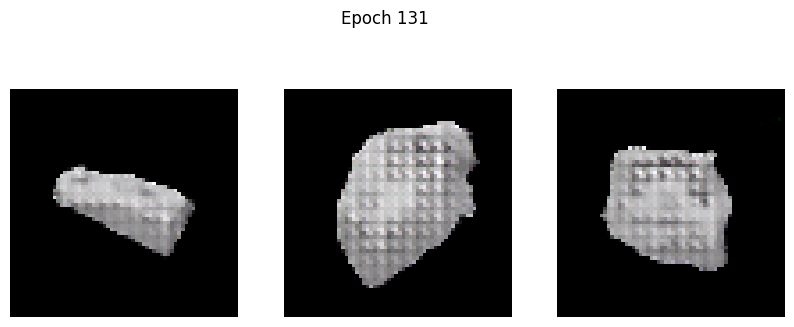

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2333 - g_loss: 2.9281
Epoch 132/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2763 - g_loss: 2.3678

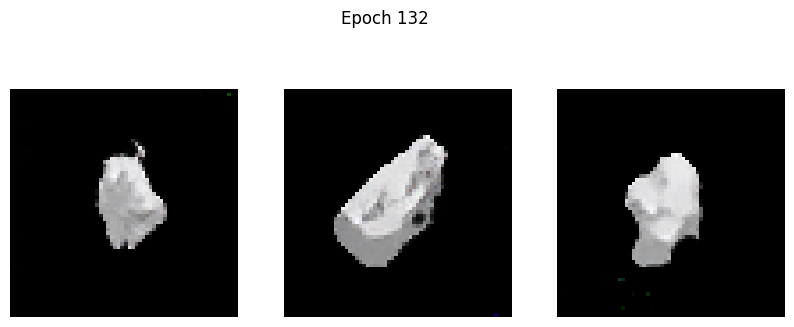

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2758 - g_loss: 2.3681
Epoch 133/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1760 - g_loss: 2.6032

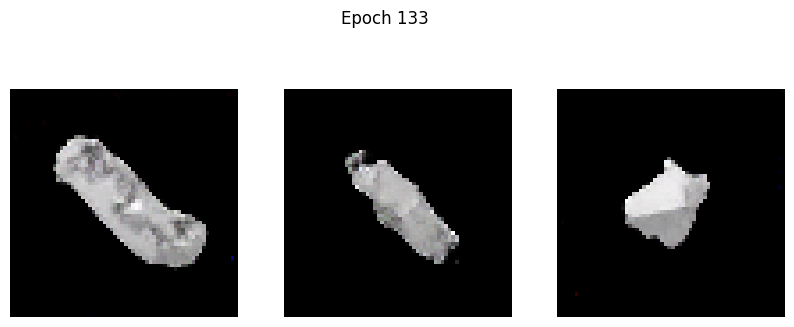

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1760 - g_loss: 2.6032
Epoch 134/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1769 - g_loss: 2.6414

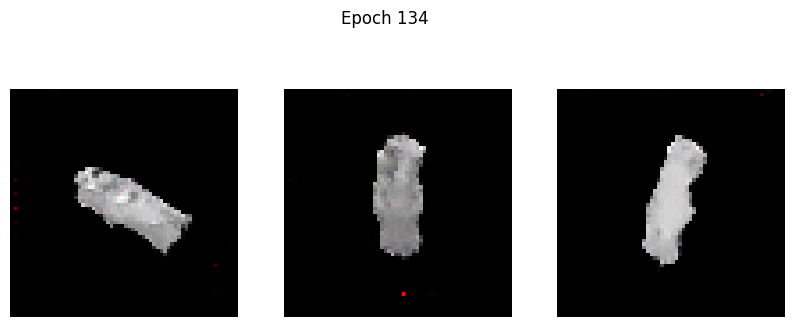

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1768 - g_loss: 2.6415
Epoch 135/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1613 - g_loss: 2.7261

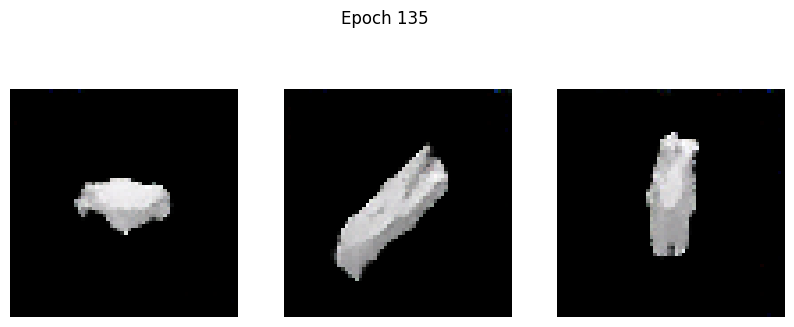

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1613 - g_loss: 2.7261
Epoch 136/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1706 - g_loss: 2.7939

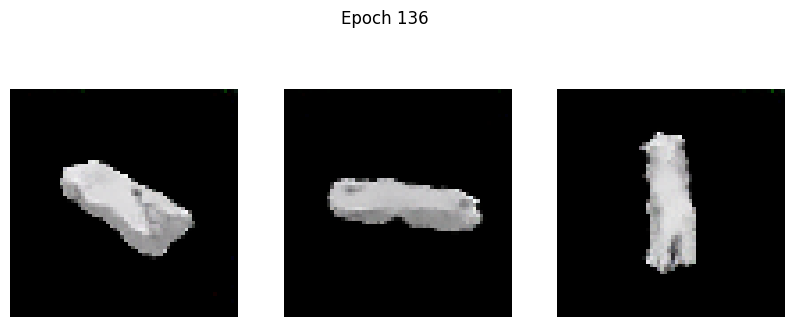

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1706 - g_loss: 2.7934
Epoch 137/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2484 - g_loss: 2.9469

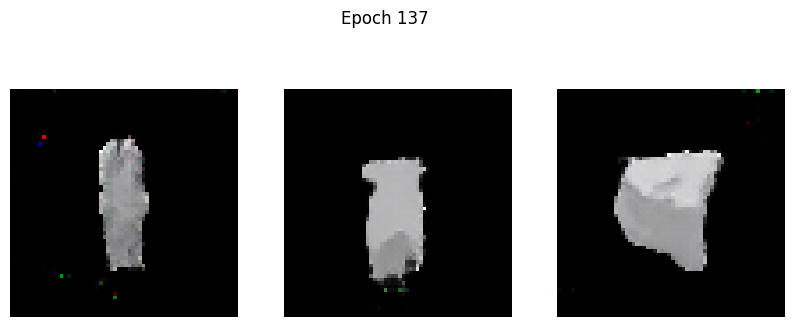

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2495 - g_loss: 2.9484
Epoch 138/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1719 - g_loss: 2.7375

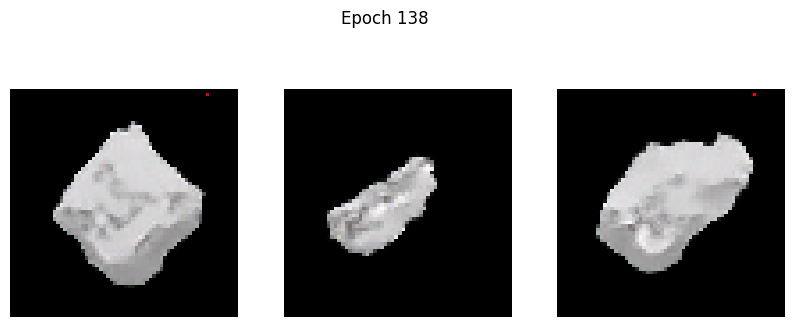

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1719 - g_loss: 2.7381
Epoch 139/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1628 - g_loss: 2.7245

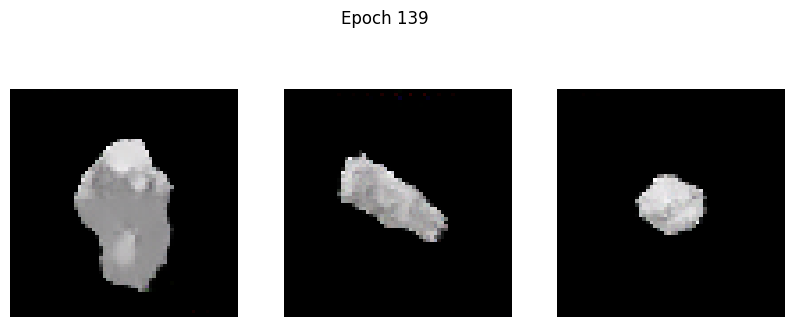

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1629 - g_loss: 2.7247
Epoch 140/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1568 - g_loss: 2.8000

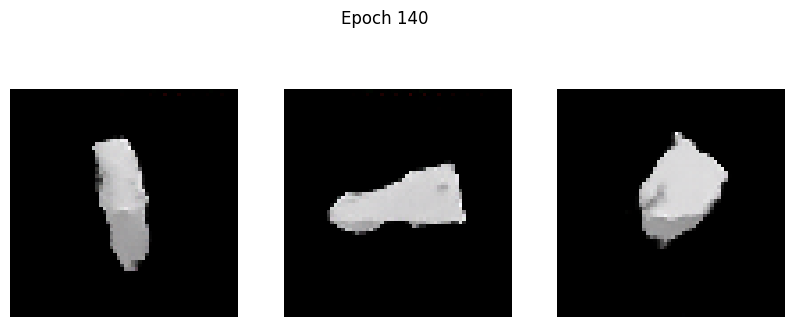

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1567 - g_loss: 2.7999
Epoch 141/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1830 - g_loss: 2.9227

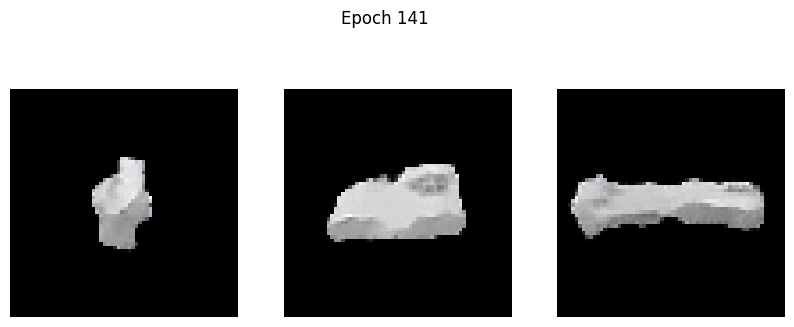

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1829 - g_loss: 2.9219
Epoch 142/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4390 - g_loss: 3.5098

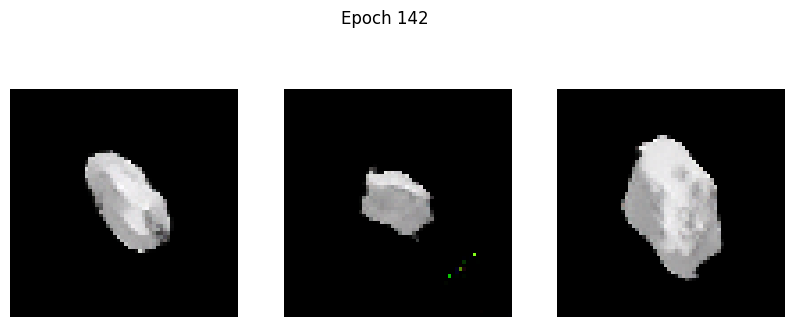

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4394 - g_loss: 3.5093
Epoch 143/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1551 - g_loss: 2.6471

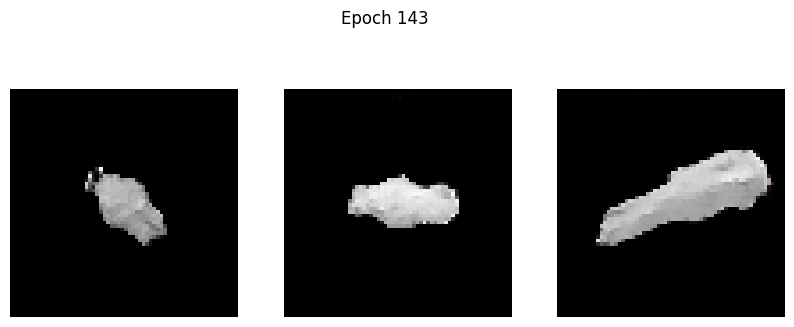

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1551 - g_loss: 2.6470
Epoch 144/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1525 - g_loss: 2.6824

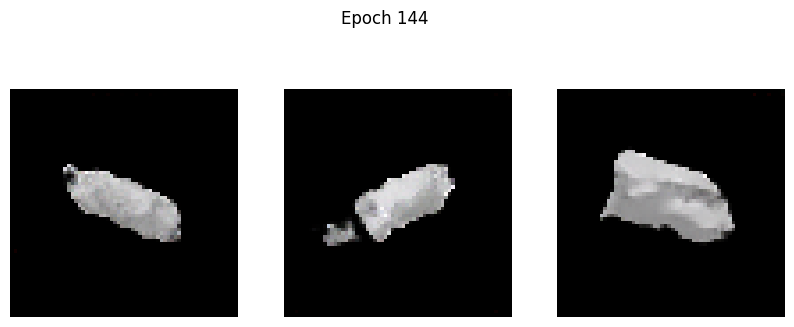

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1525 - g_loss: 2.6829
Epoch 145/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1531 - g_loss: 2.7722

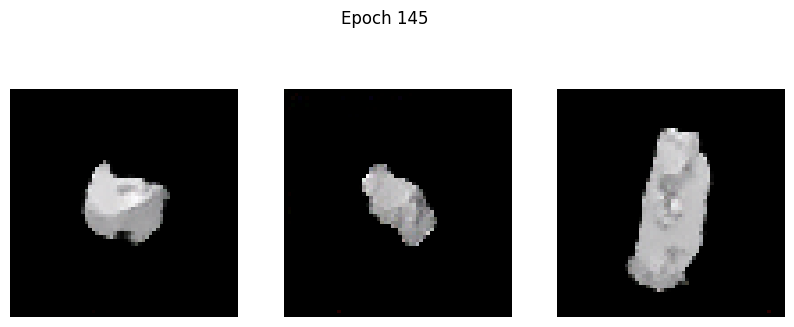

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1534 - g_loss: 2.7730
Epoch 146/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1952 - g_loss: 2.7714

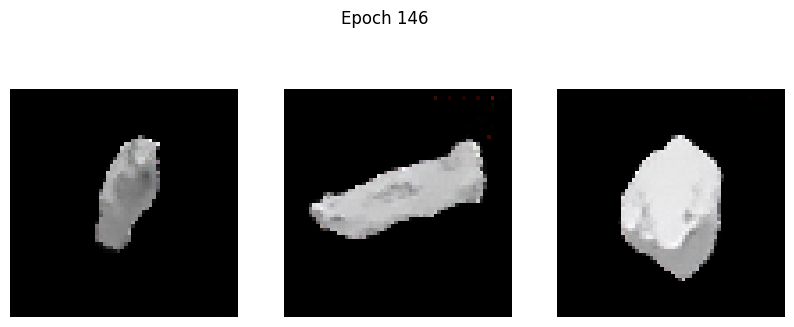

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1947 - g_loss: 2.7715
Epoch 147/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2056 - g_loss: 2.9488

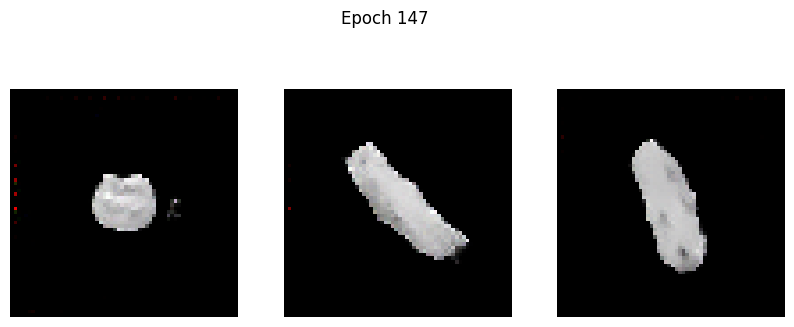

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2055 - g_loss: 2.9484
Epoch 148/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2056 - g_loss: 2.9899

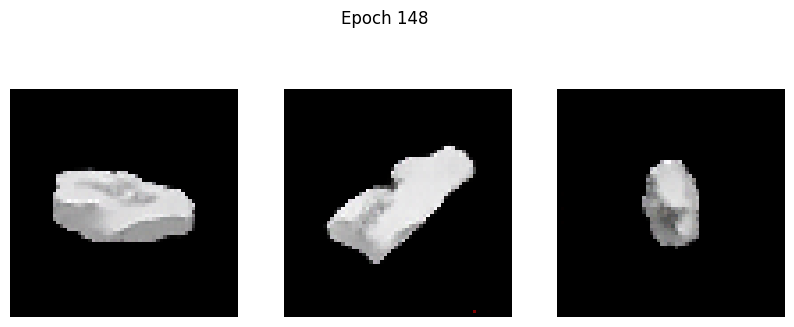

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2053 - g_loss: 2.9889
Epoch 149/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1700 - g_loss: 2.9437

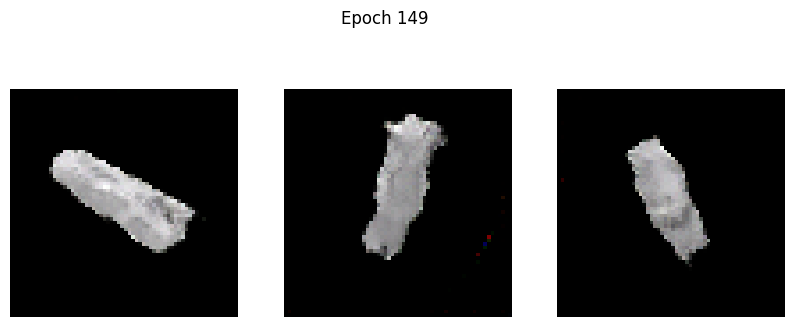

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1710 - g_loss: 2.9453
Epoch 150/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1828 - g_loss: 2.9791

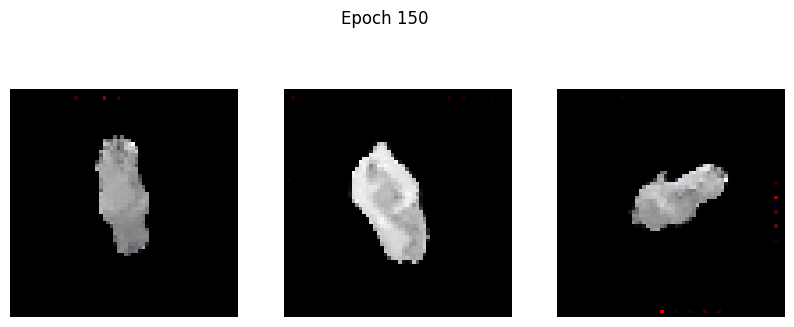

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1826 - g_loss: 2.9783
Epoch 151/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1401 - g_loss: 2.8152

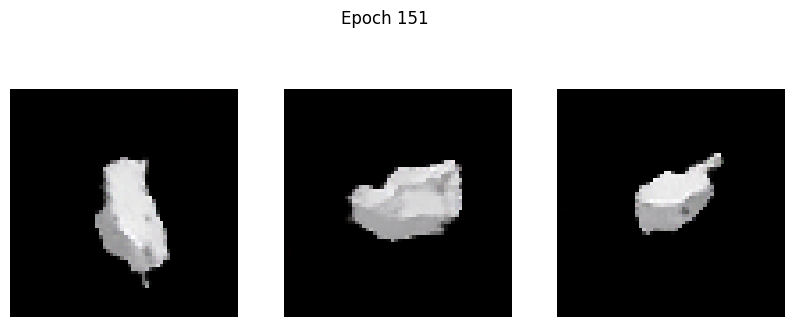

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1403 - g_loss: 2.8161
Epoch 152/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1421 - g_loss: 3.0070

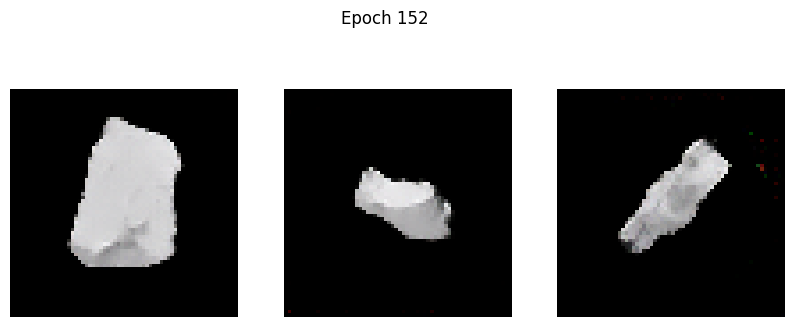

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1423 - g_loss: 3.0070
Epoch 153/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1865 - g_loss: 2.9787

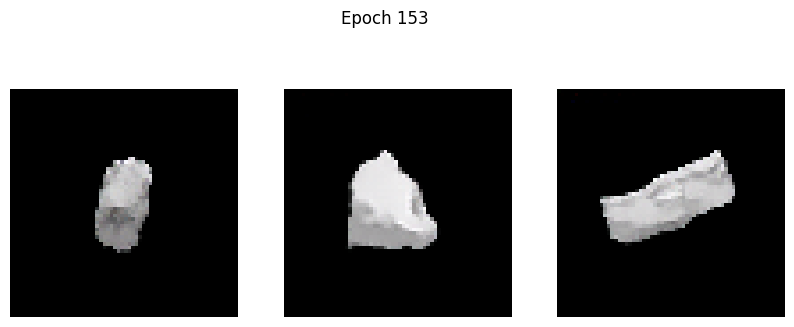

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1863 - g_loss: 2.9784
Epoch 154/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1646 - g_loss: 3.0482

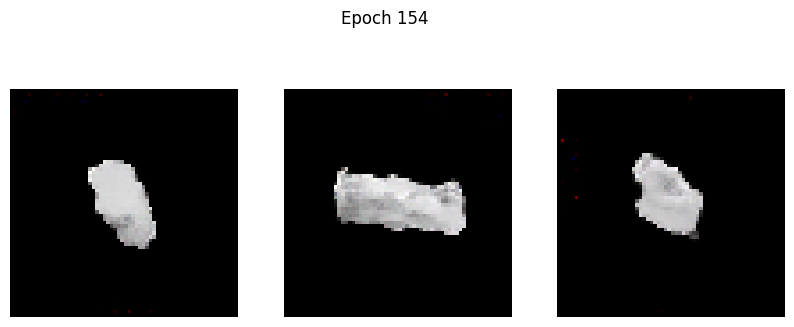

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1647 - g_loss: 3.0483
Epoch 155/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2195 - g_loss: 3.0686

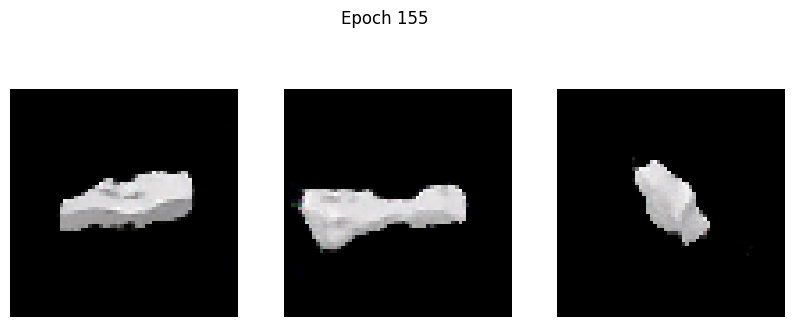

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2195 - g_loss: 3.0681
Epoch 156/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1437 - g_loss: 2.9803

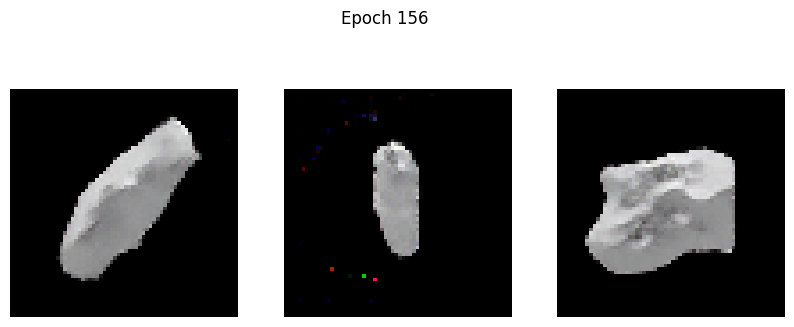

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1437 - g_loss: 2.9809
Epoch 157/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1500 - g_loss: 3.0607

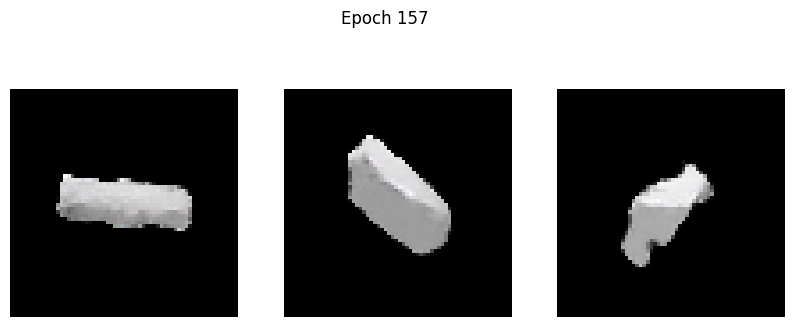

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1499 - g_loss: 3.0606
Epoch 158/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1928 - g_loss: 3.1121

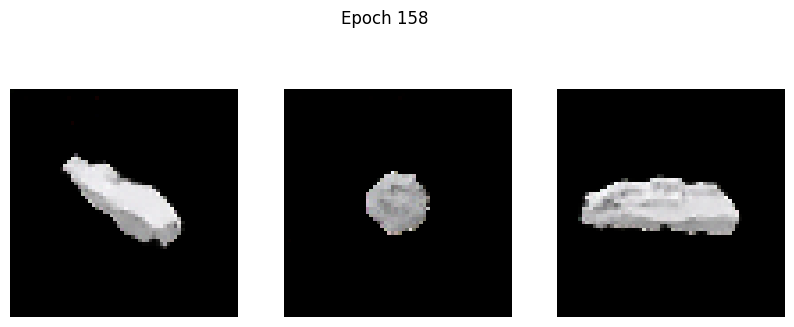

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1928 - g_loss: 3.1120
Epoch 159/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1964 - g_loss: 3.1525

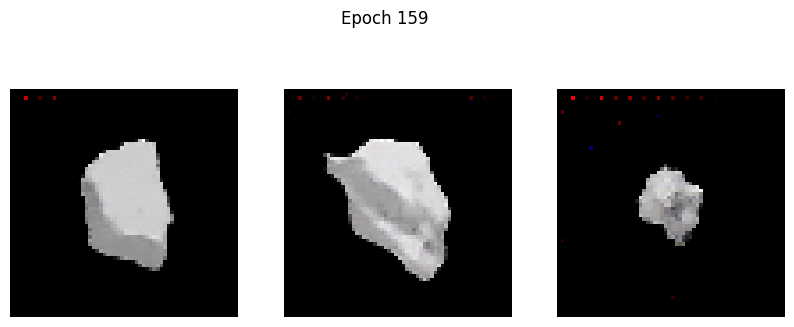

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1962 - g_loss: 3.1519
Epoch 160/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2132 - g_loss: 3.1706

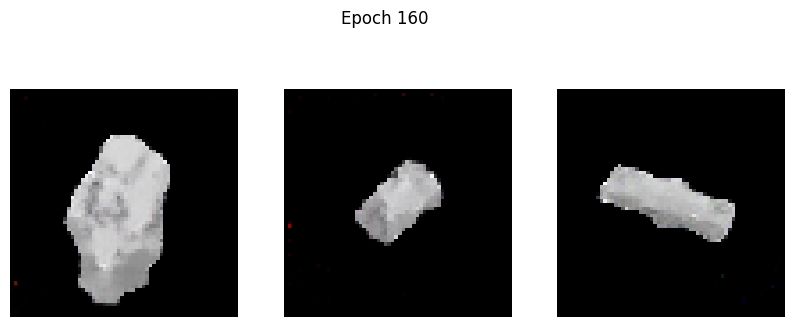

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2129 - g_loss: 3.1700
Epoch 161/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1476 - g_loss: 3.1556

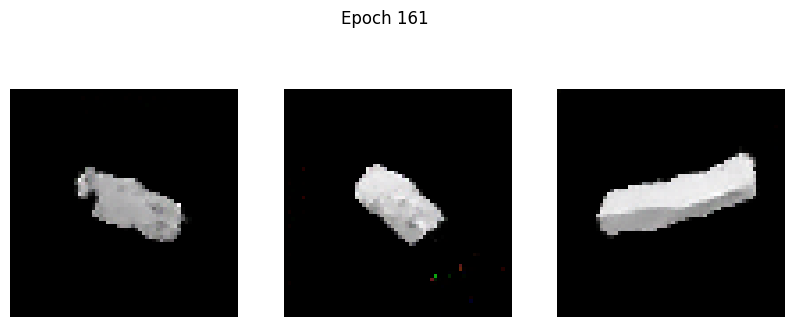

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1482 - g_loss: 3.1555
Epoch 162/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1349 - g_loss: 3.0418

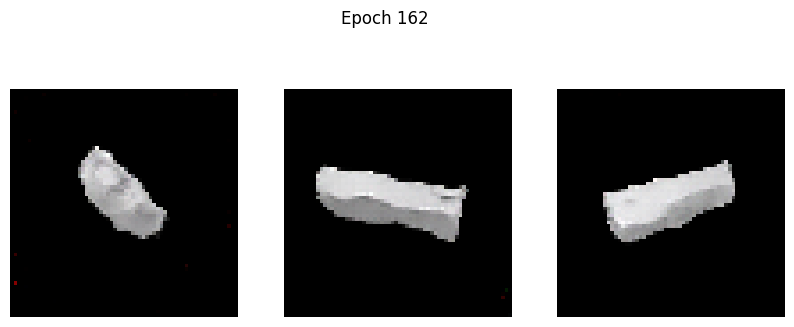

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1349 - g_loss: 3.0419
Epoch 163/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1494 - g_loss: 3.1909

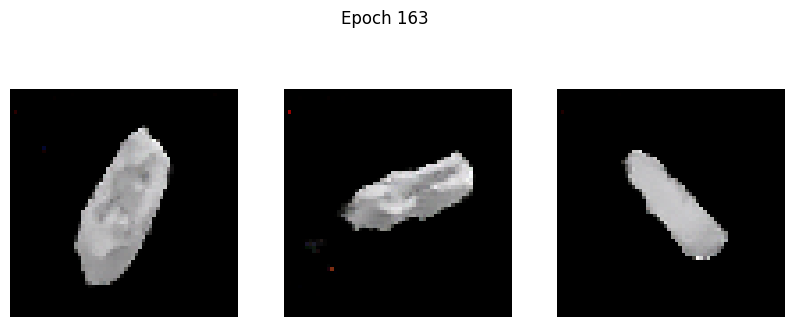

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1501 - g_loss: 3.1910
Epoch 164/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1311 - g_loss: 3.1040

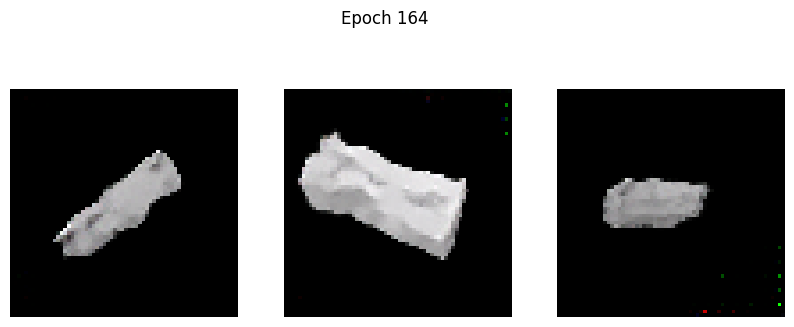

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1311 - g_loss: 3.1035
Epoch 165/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1376 - g_loss: 3.1344

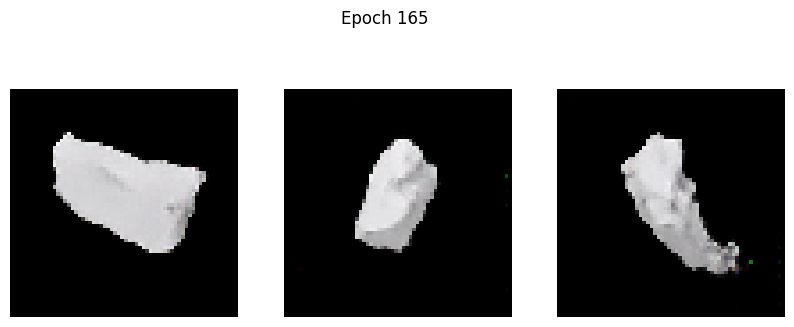

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1383 - g_loss: 3.1352
Epoch 166/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1225 - g_loss: 3.1320

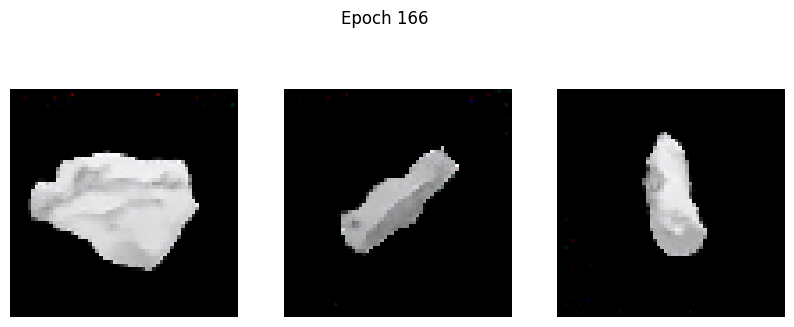

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1226 - g_loss: 3.1318
Epoch 167/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1769 - g_loss: 3.1182

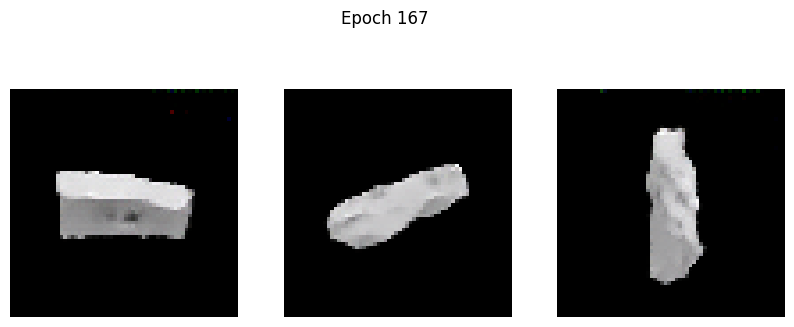

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1767 - g_loss: 3.1183
Epoch 168/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1355 - g_loss: 3.2000

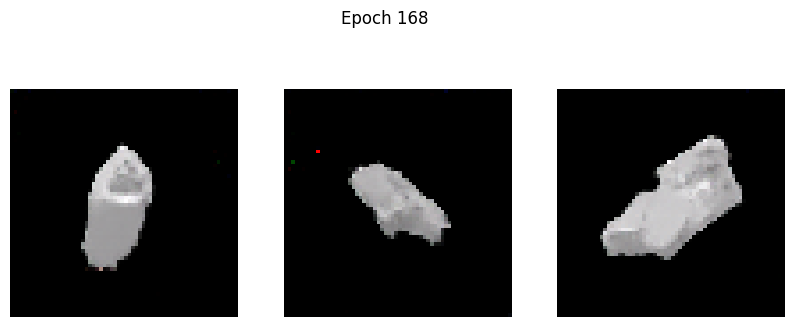

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1356 - g_loss: 3.1998
Epoch 169/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1508 - g_loss: 3.1158

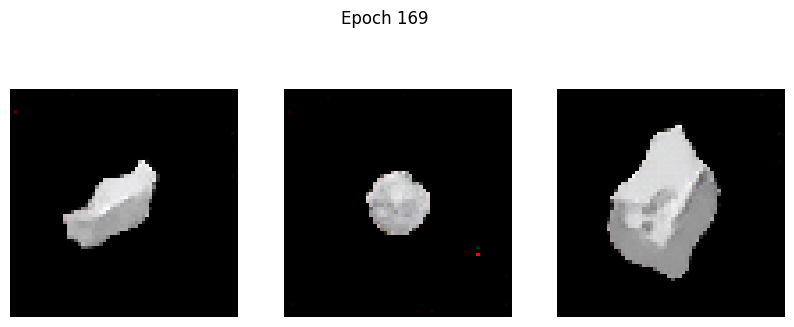

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1507 - g_loss: 3.1164
Epoch 170/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1532 - g_loss: 3.3030

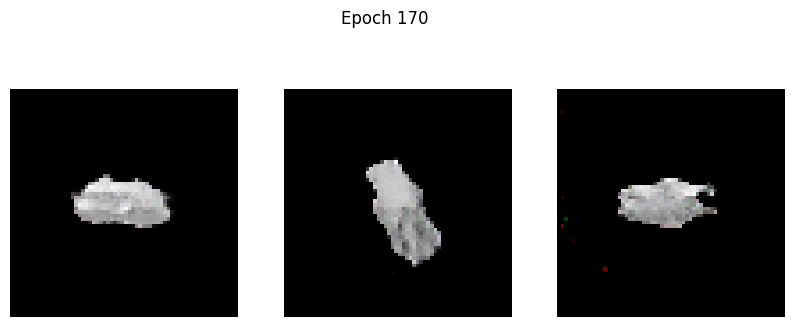

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1534 - g_loss: 3.3031
Epoch 171/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1881 - g_loss: 3.3197

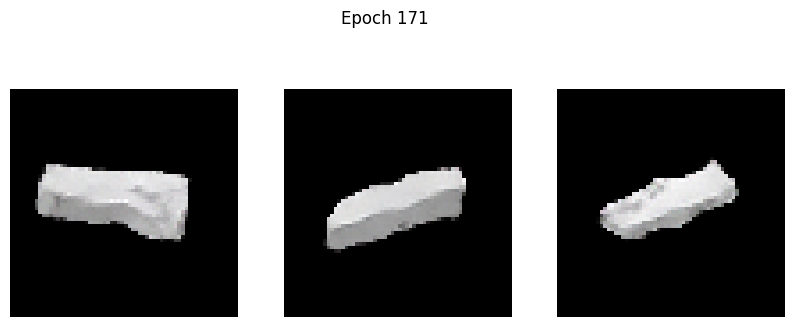

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1886 - g_loss: 3.3195
Epoch 172/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1364 - g_loss: 3.1606

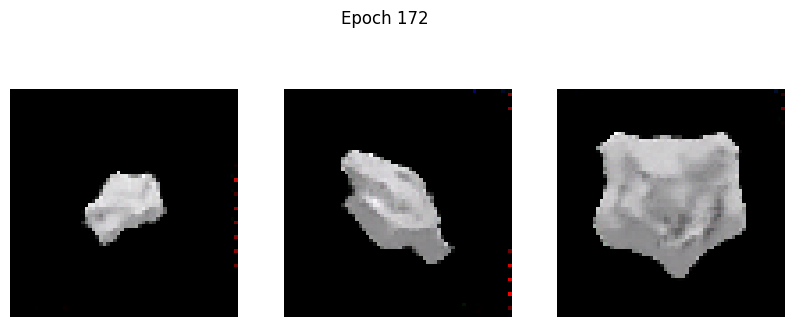

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1366 - g_loss: 3.1607
Epoch 173/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1150 - g_loss: 3.1162

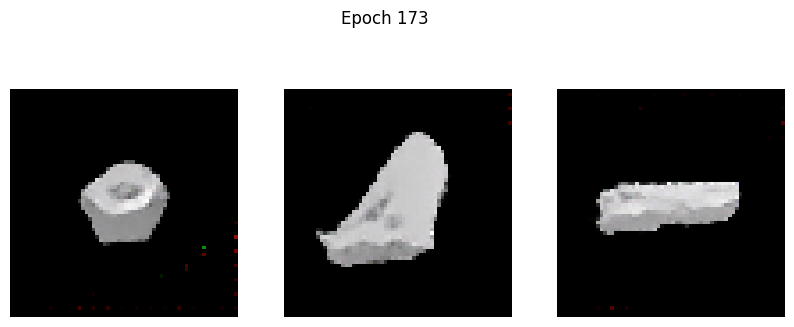

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1151 - g_loss: 3.1167
Epoch 174/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2306 - g_loss: 3.3527

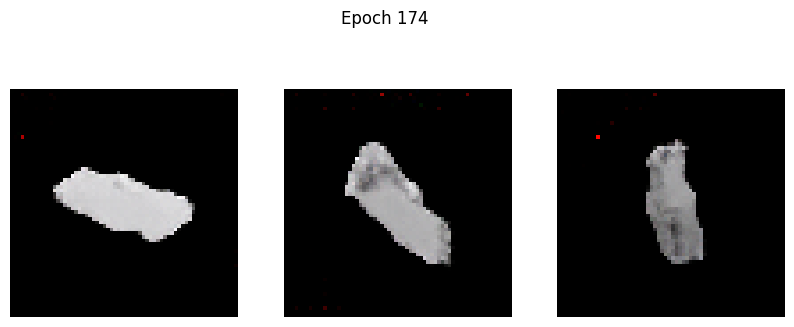

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2314 - g_loss: 3.3528
Epoch 175/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1425 - g_loss: 3.2421

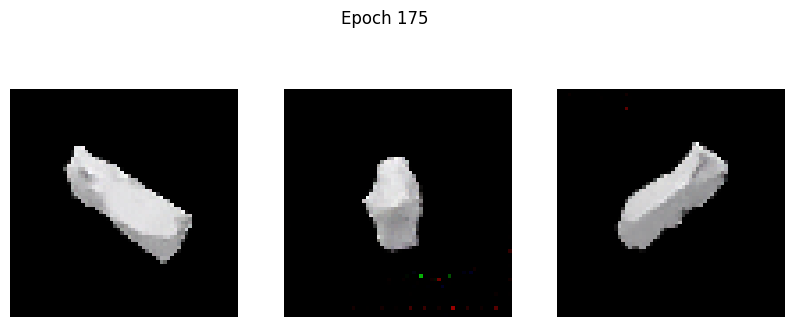

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1424 - g_loss: 3.2411
Epoch 176/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1082 - g_loss: 3.1432

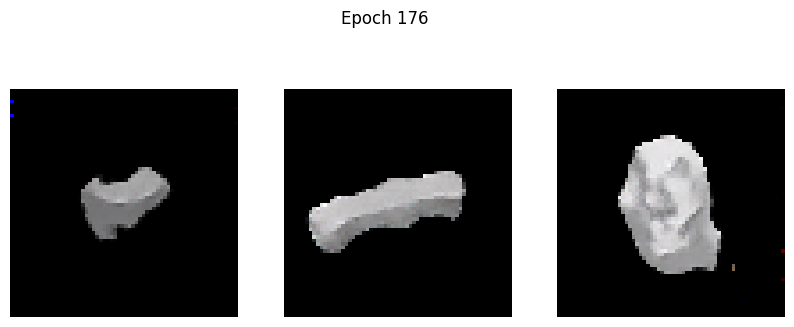

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1083 - g_loss: 3.1436
Epoch 177/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1284 - g_loss: 3.2602

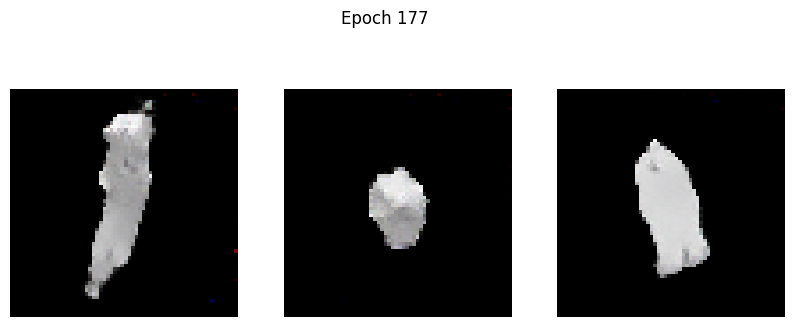

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1283 - g_loss: 3.2599
Epoch 178/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1068 - g_loss: 3.2484

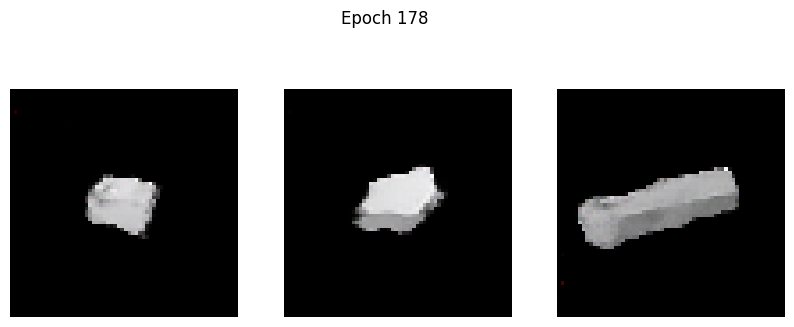

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1070 - g_loss: 3.2485
Epoch 179/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2072 - g_loss: 3.4018

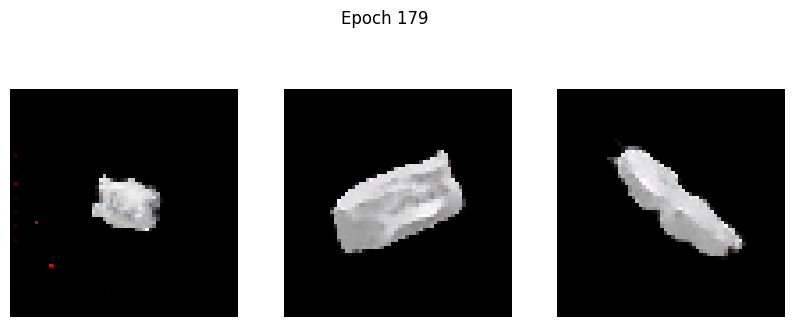

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2070 - g_loss: 3.4013
Epoch 180/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1280 - g_loss: 3.2700

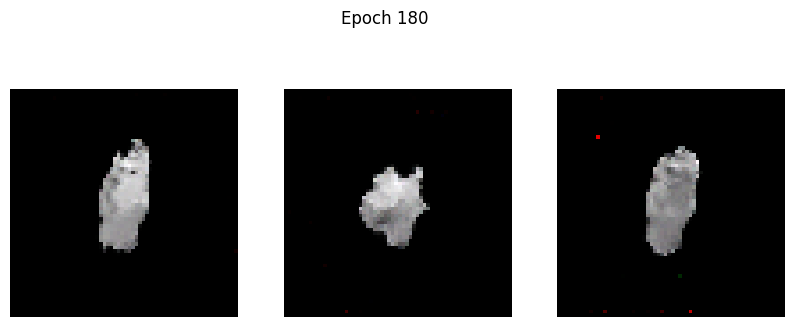

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1281 - g_loss: 3.2702
Epoch 181/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1344 - g_loss: 3.2758

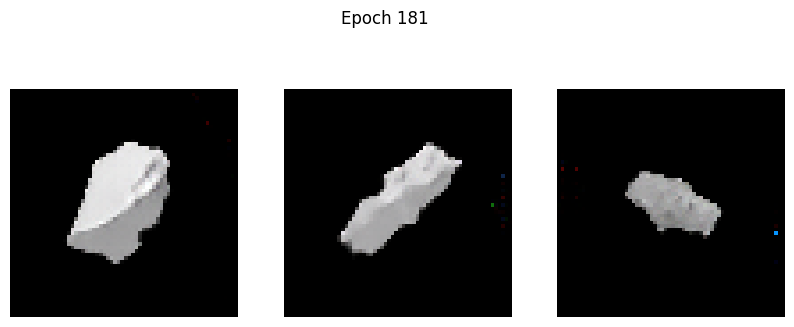

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1346 - g_loss: 3.2763
Epoch 182/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1113 - g_loss: 3.2195

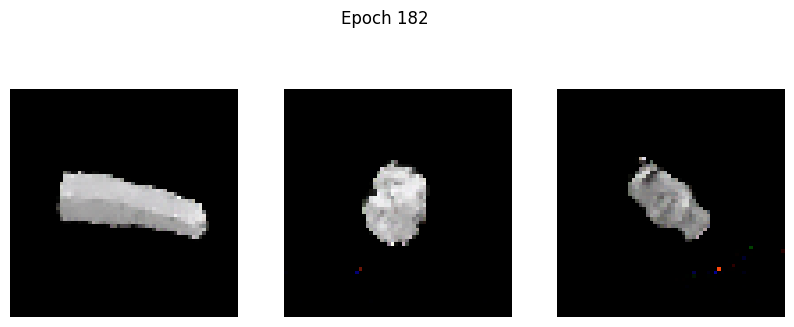

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1117 - g_loss: 3.2205
Epoch 183/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 1.5194 - g_loss: 5.6720

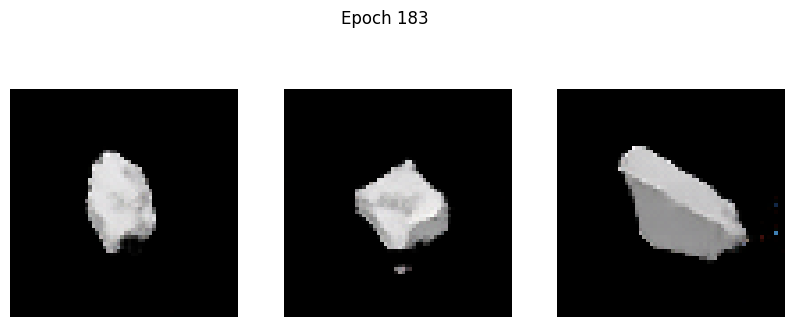

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 1.5116 - g_loss: 5.6540
Epoch 184/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1556 - g_loss: 2.9633

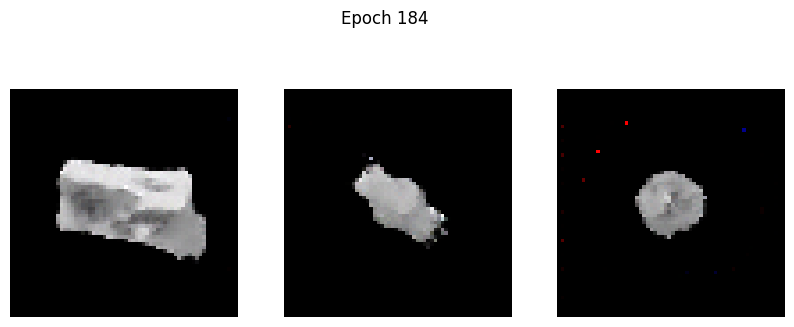

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1555 - g_loss: 2.9635
Epoch 185/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1532 - g_loss: 3.1093

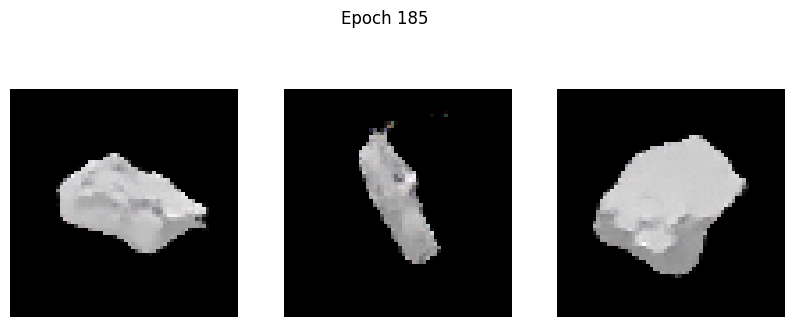

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1531 - g_loss: 3.1090
Epoch 186/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1142 - g_loss: 3.1801

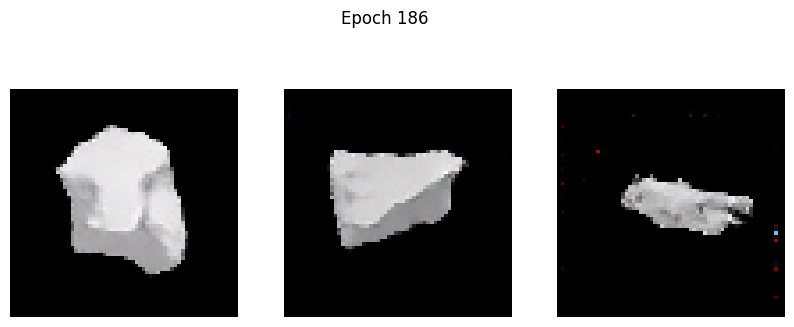

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1142 - g_loss: 3.1801
Epoch 187/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1180 - g_loss: 3.1399

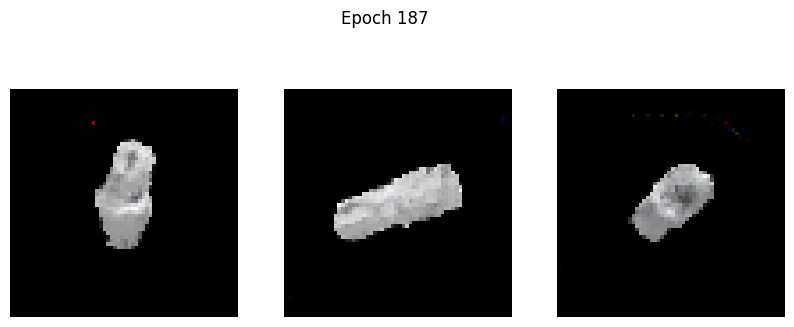

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1180 - g_loss: 3.1403
Epoch 188/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1255 - g_loss: 3.1660

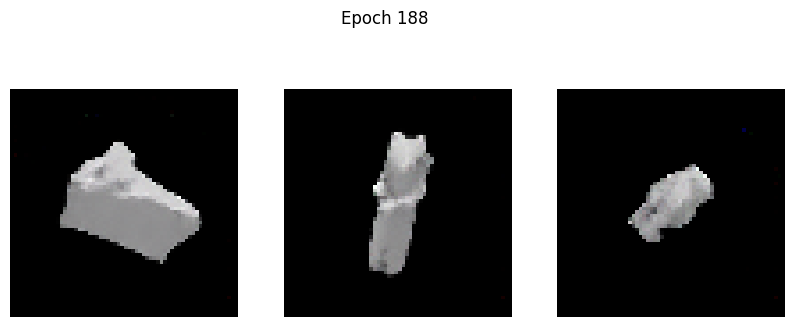

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1255 - g_loss: 3.1665
Epoch 189/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1365 - g_loss: 3.3889

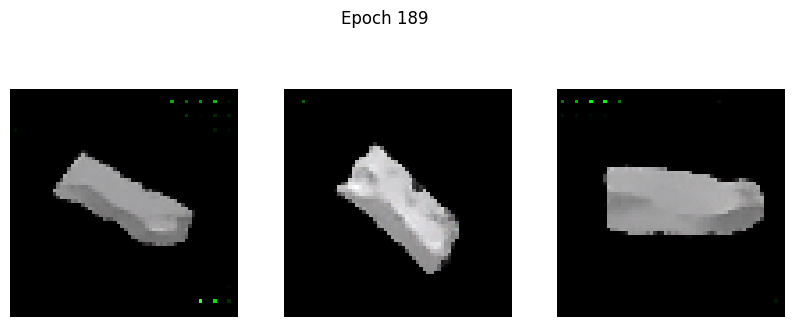

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1367 - g_loss: 3.3884
Epoch 190/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1656 - g_loss: 3.3616

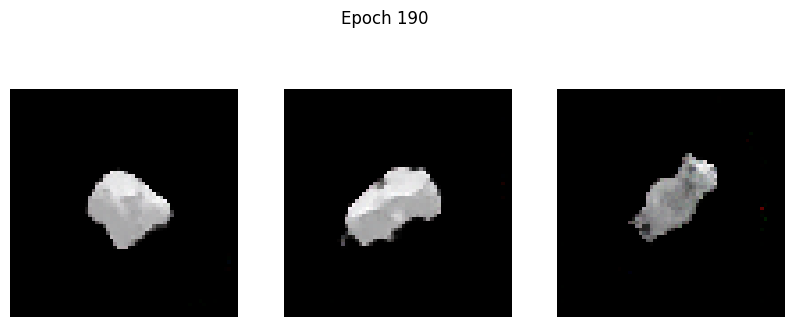

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1655 - g_loss: 3.3615
Epoch 191/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0982 - g_loss: 3.2949

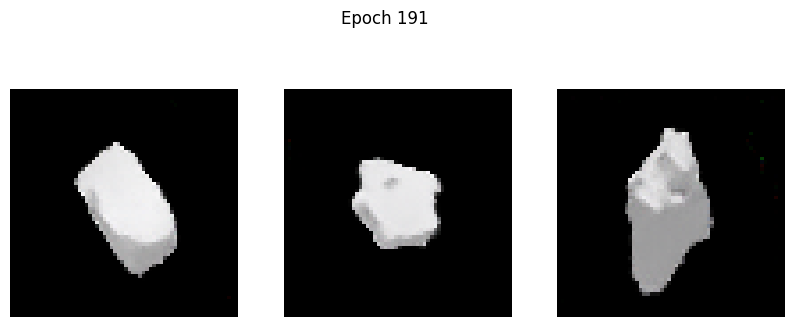

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0983 - g_loss: 3.2950
Epoch 192/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1942 - g_loss: 3.4354

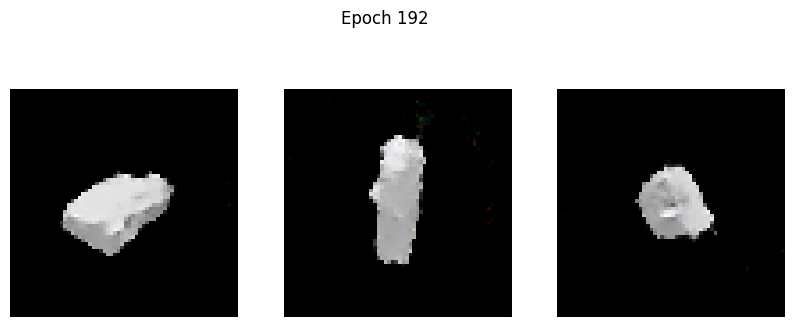

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1940 - g_loss: 3.4351
Epoch 193/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0967 - g_loss: 3.3356

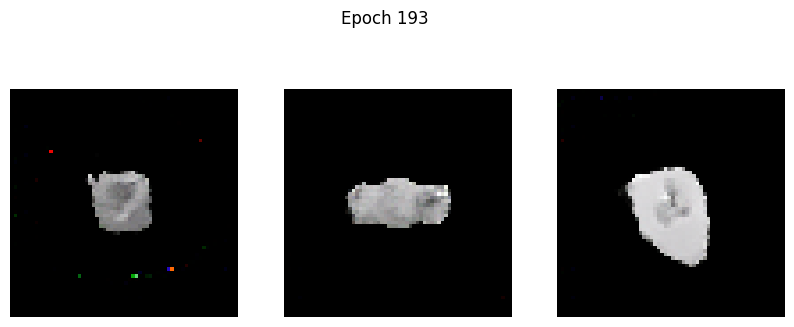

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0968 - g_loss: 3.3360
Epoch 194/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1360 - g_loss: 3.3955

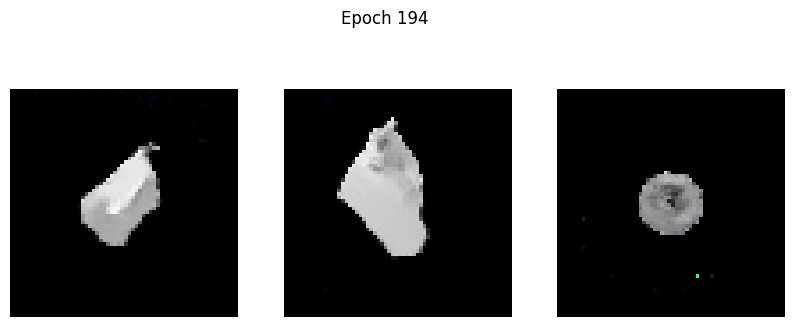

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1360 - g_loss: 3.3952
Epoch 195/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1545 - g_loss: 3.4469

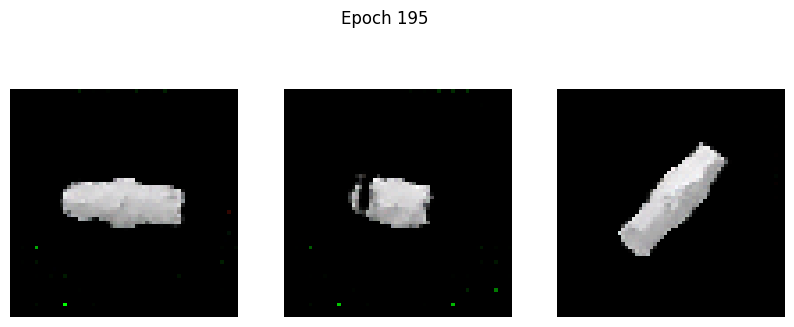

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1544 - g_loss: 3.4464
Epoch 196/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2206 - g_loss: 3.4711

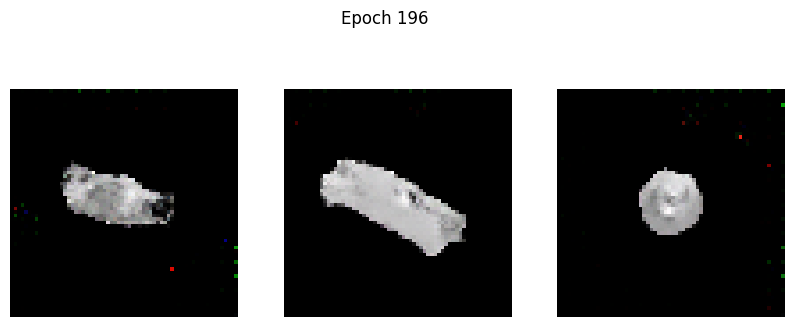

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2201 - g_loss: 3.4702
Epoch 197/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1259 - g_loss: 3.4441

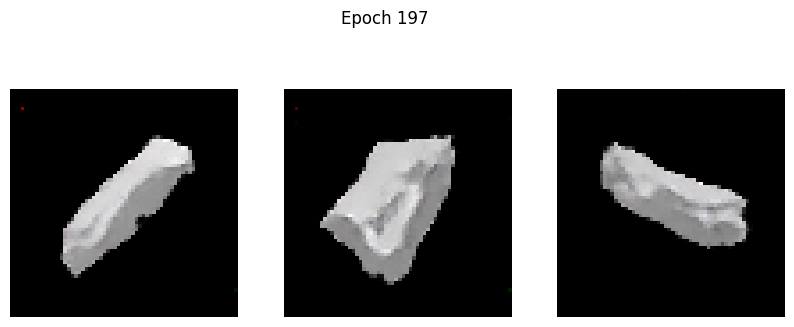

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1257 - g_loss: 3.4437
Epoch 198/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1113 - g_loss: 3.4489

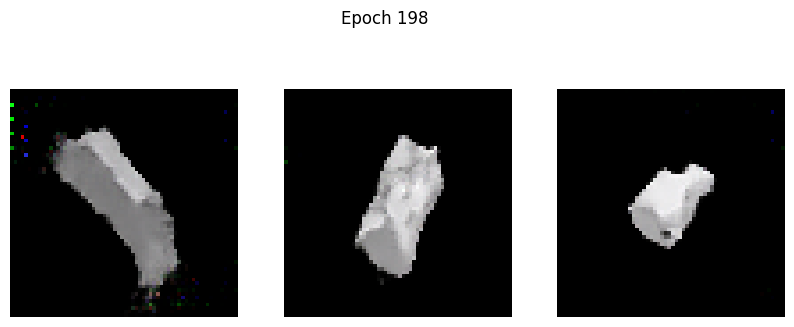

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1115 - g_loss: 3.4487
Epoch 199/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1905 - g_loss: 3.5483

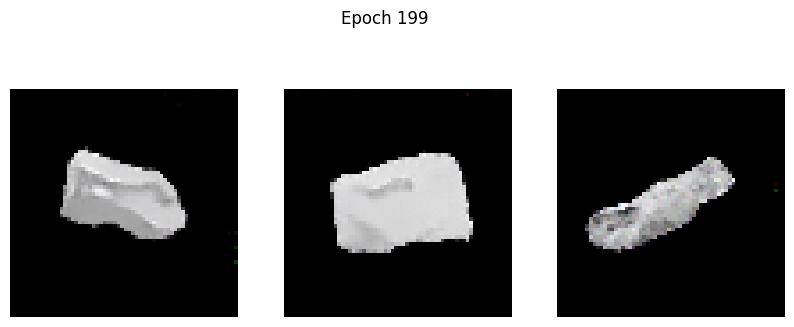

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1902 - g_loss: 3.5476
Epoch 200/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1410 - g_loss: 3.4811

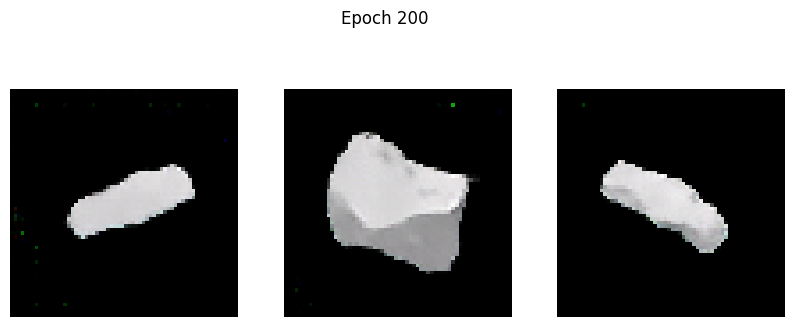

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1415 - g_loss: 3.4817
Epoch 201/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1377 - g_loss: 3.3239

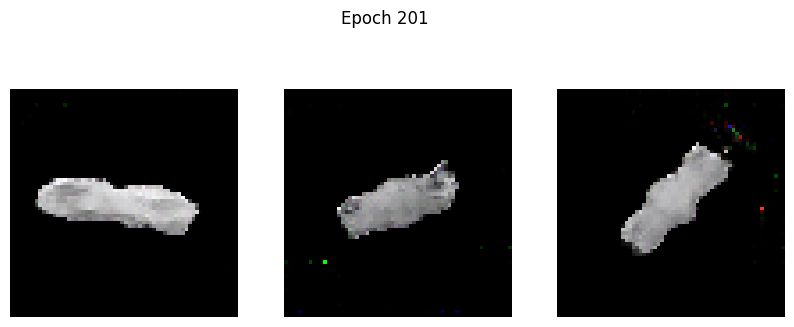

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1377 - g_loss: 3.3243
Epoch 202/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1399 - g_loss: 3.4324

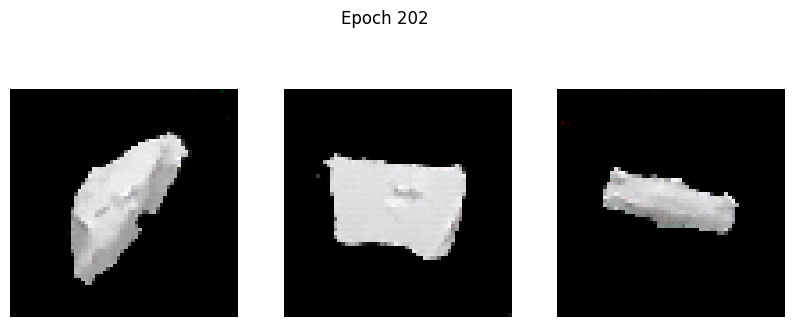

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1404 - g_loss: 3.4331
Epoch 203/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1073 - g_loss: 3.2952

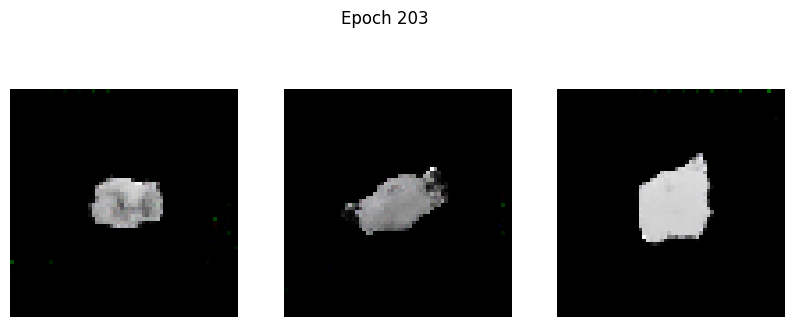

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1072 - g_loss: 3.2960
Epoch 204/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0954 - g_loss: 3.3623

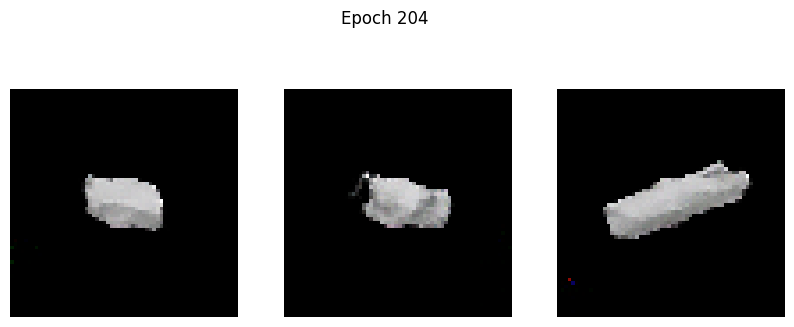

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0955 - g_loss: 3.3623
Epoch 205/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2051 - g_loss: 3.7314

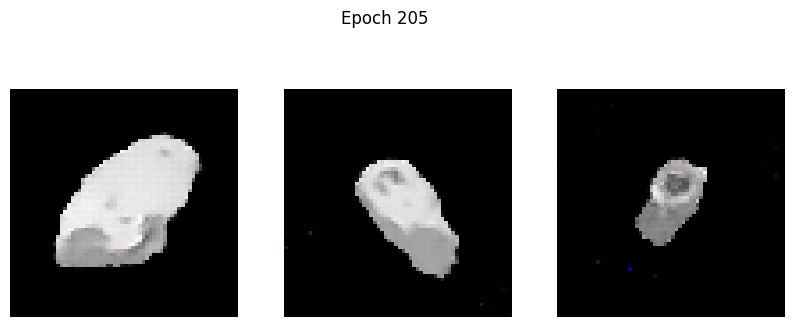

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2048 - g_loss: 3.7305
Epoch 206/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2172 - g_loss: 3.6456

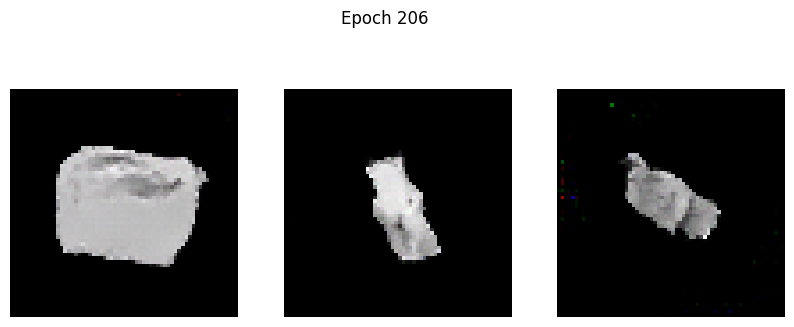

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2169 - g_loss: 3.6448
Epoch 207/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0987 - g_loss: 3.4215

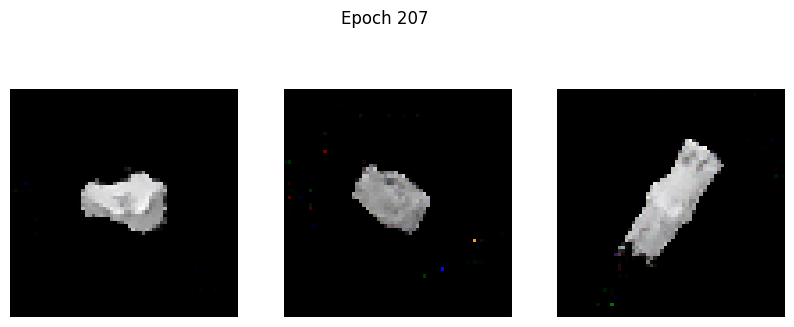

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0987 - g_loss: 3.4215
Epoch 208/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0952 - g_loss: 3.4192

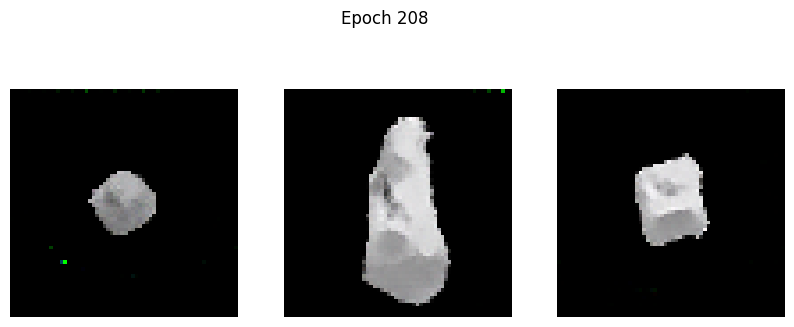

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0953 - g_loss: 3.4198
Epoch 209/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2303 - g_loss: 3.6692

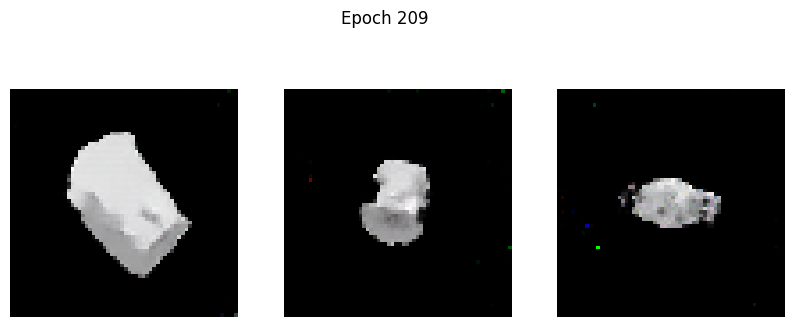

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2298 - g_loss: 3.6683
Epoch 210/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1284 - g_loss: 3.6442

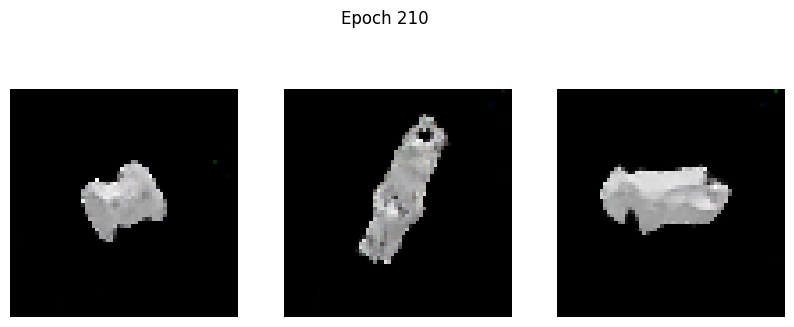

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1283 - g_loss: 3.6431
Epoch 211/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3002 - g_loss: 3.8463

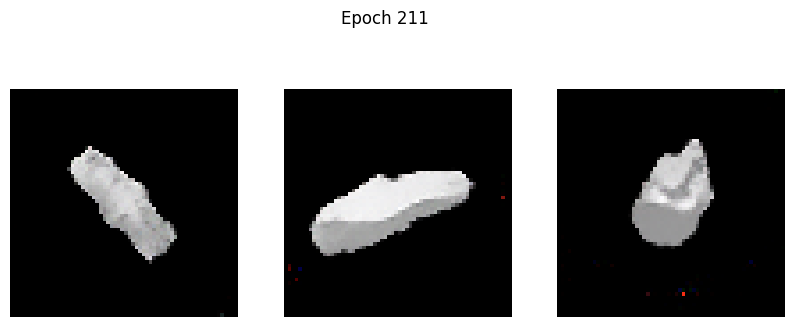

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2999 - g_loss: 3.8449
Epoch 212/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1123 - g_loss: 3.4129

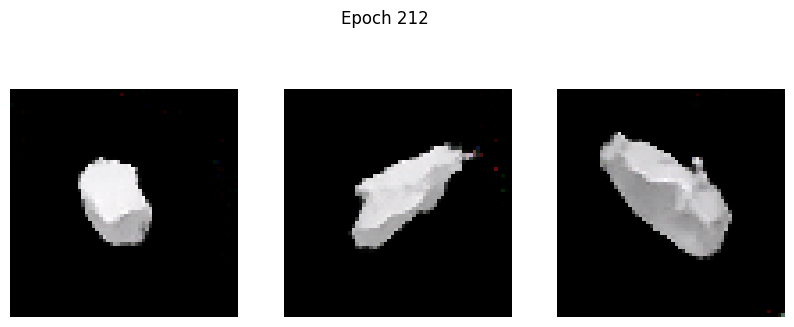

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1122 - g_loss: 3.4131
Epoch 213/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1029 - g_loss: 3.4891

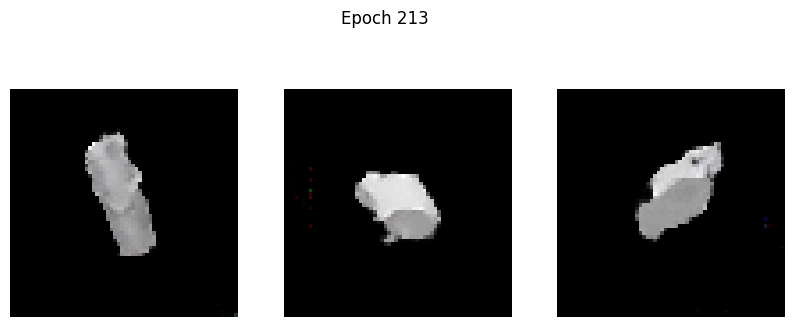

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1029 - g_loss: 3.4885
Epoch 214/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1190 - g_loss: 3.5711

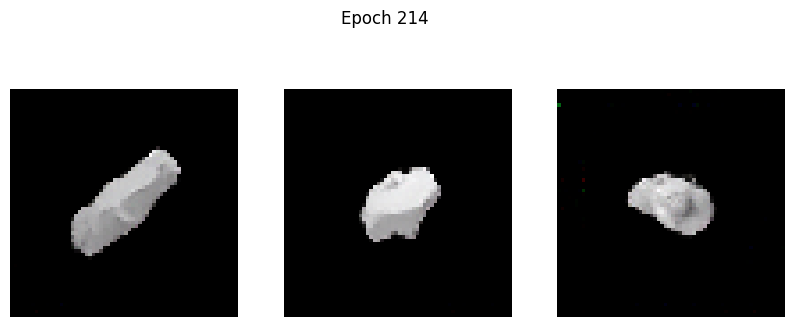

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1189 - g_loss: 3.5708
Epoch 215/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1732 - g_loss: 3.8367

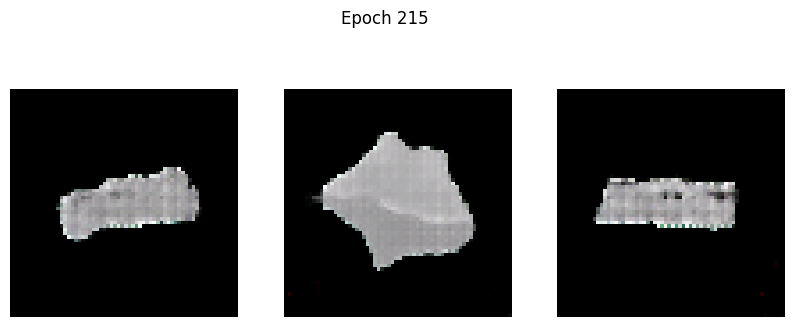

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1771 - g_loss: 3.8436
Epoch 216/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.5998 - g_loss: 3.5140

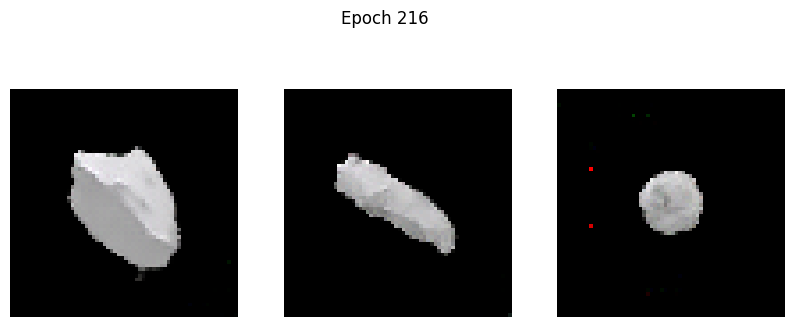

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.5968 - g_loss: 3.5102
Epoch 217/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1146 - g_loss: 3.1526

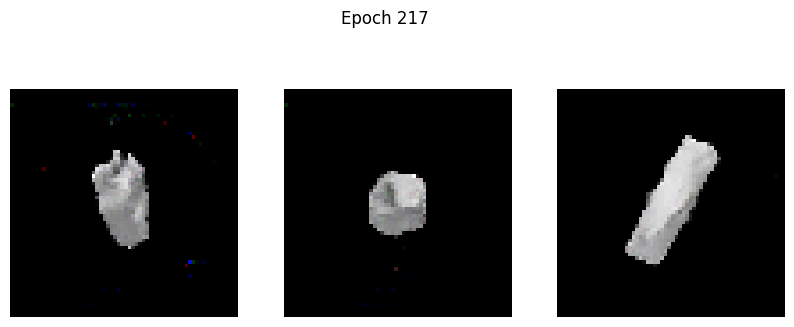

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1145 - g_loss: 3.1530
Epoch 218/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1018 - g_loss: 3.3642

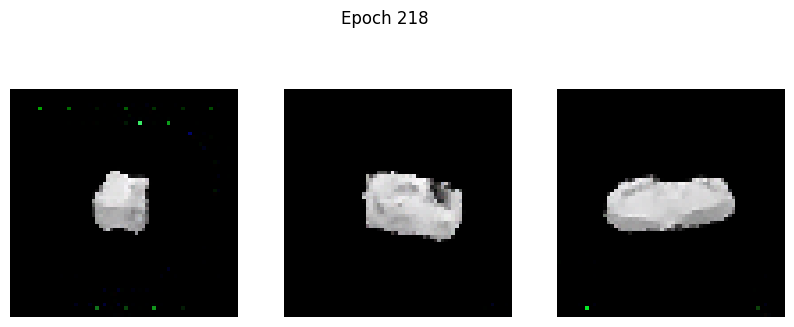

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1018 - g_loss: 3.3638
Epoch 219/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0972 - g_loss: 3.3674

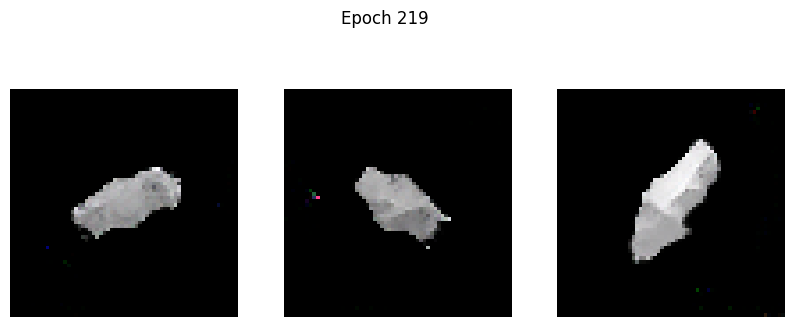

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0973 - g_loss: 3.3676
Epoch 220/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0988 - g_loss: 3.4869

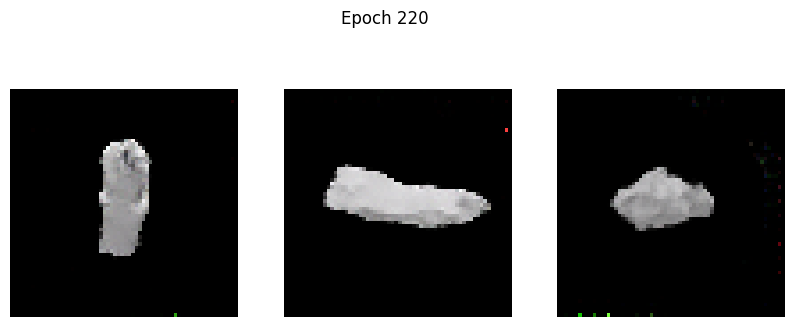

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0989 - g_loss: 3.4868
Epoch 221/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0830 - g_loss: 3.4185

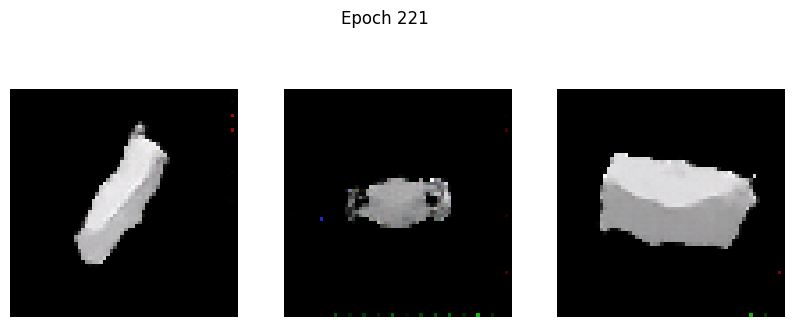

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0830 - g_loss: 3.4186
Epoch 222/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0923 - g_loss: 3.4347

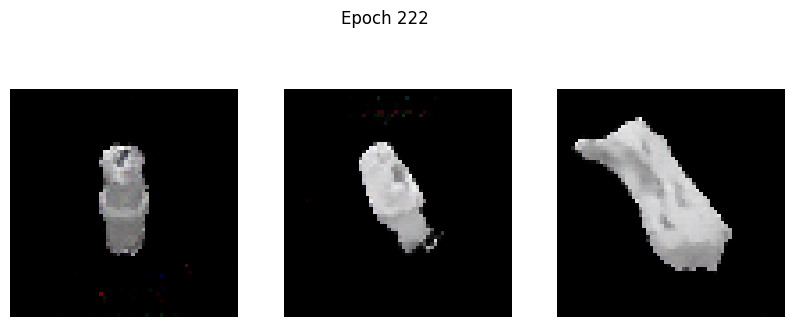

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0925 - g_loss: 3.4357
Epoch 223/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1046 - g_loss: 3.5269

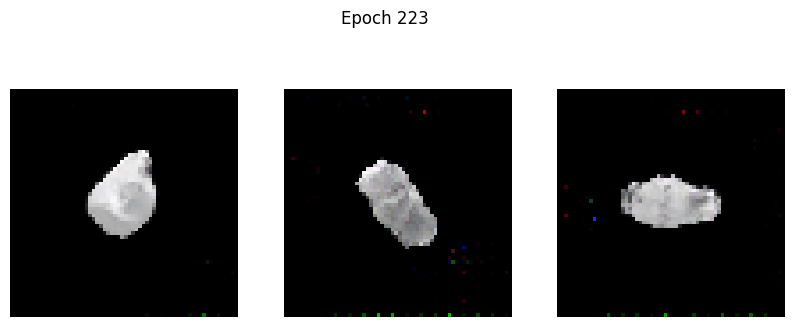

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1048 - g_loss: 3.5270
Epoch 224/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2076 - g_loss: 3.6864

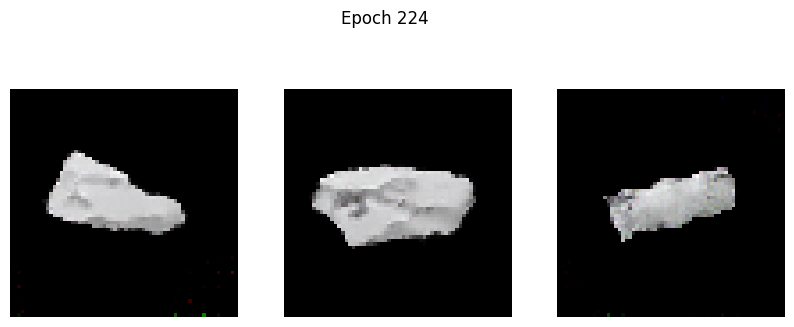

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2070 - g_loss: 3.6855
Epoch 225/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1156 - g_loss: 3.5550

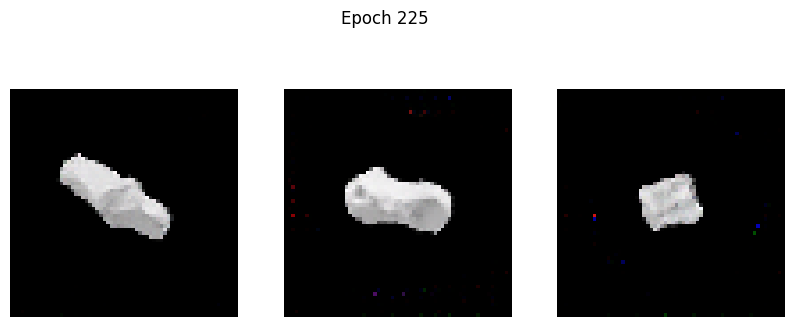

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1156 - g_loss: 3.5550
Epoch 226/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0888 - g_loss: 3.5414

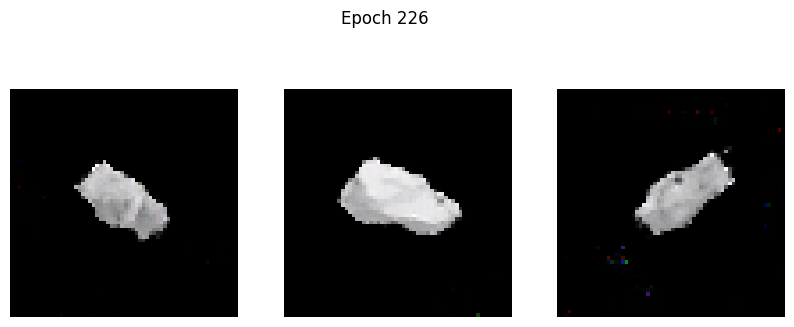

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0890 - g_loss: 3.5419
Epoch 227/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0933 - g_loss: 3.6078

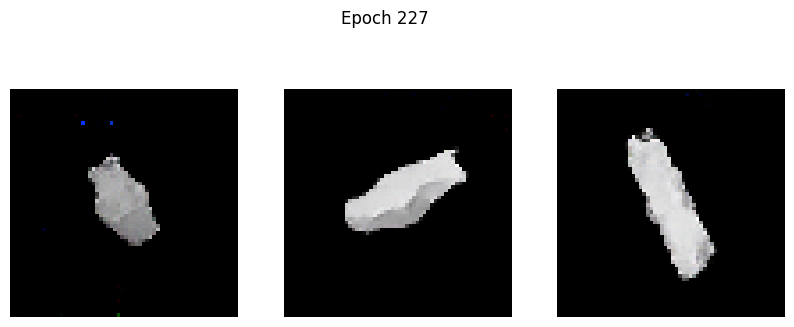

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0933 - g_loss: 3.6075
Epoch 228/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1161 - g_loss: 3.7250

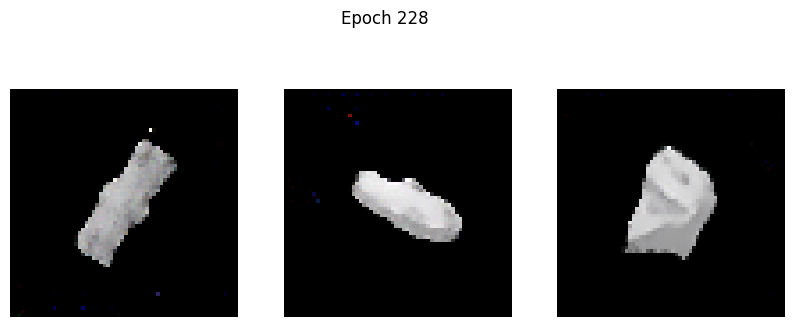

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1160 - g_loss: 3.7248
Epoch 229/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0950 - g_loss: 3.6602

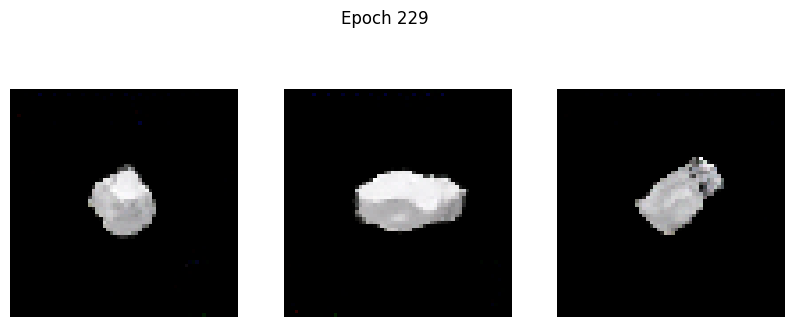

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0953 - g_loss: 3.6603
Epoch 230/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4335 - g_loss: 4.0453

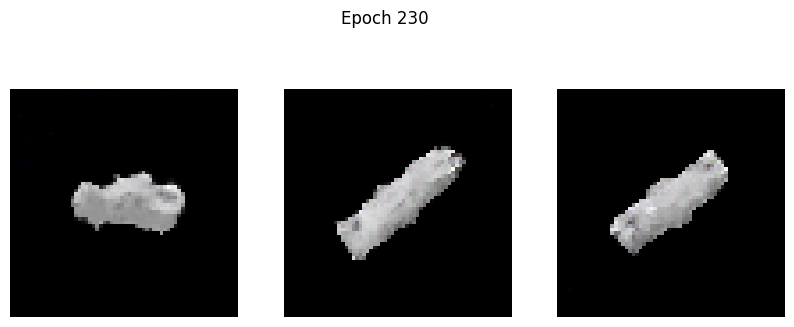

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4317 - g_loss: 4.0424
Epoch 231/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0846 - g_loss: 3.5377

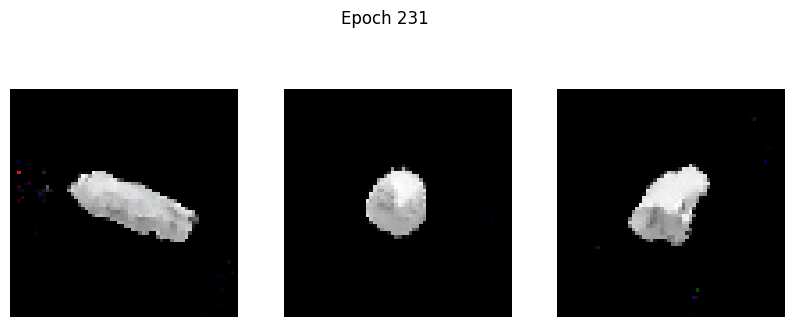

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0845 - g_loss: 3.5378
Epoch 232/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1111 - g_loss: 3.6846

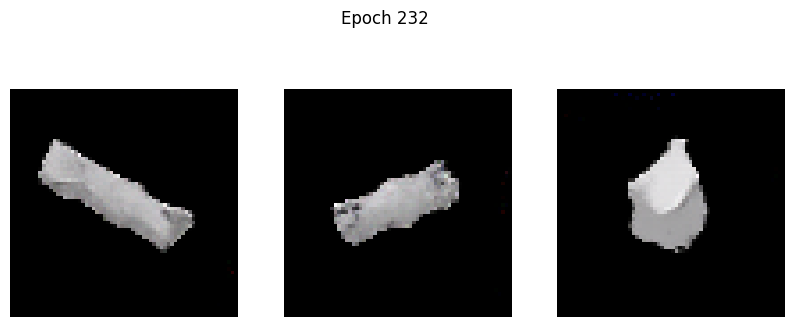

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1112 - g_loss: 3.6846
Epoch 233/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1245 - g_loss: 3.6220

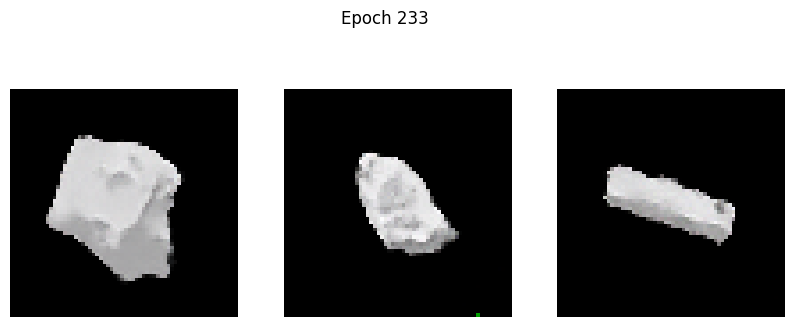

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1245 - g_loss: 3.6224
Epoch 234/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0973 - g_loss: 3.7058

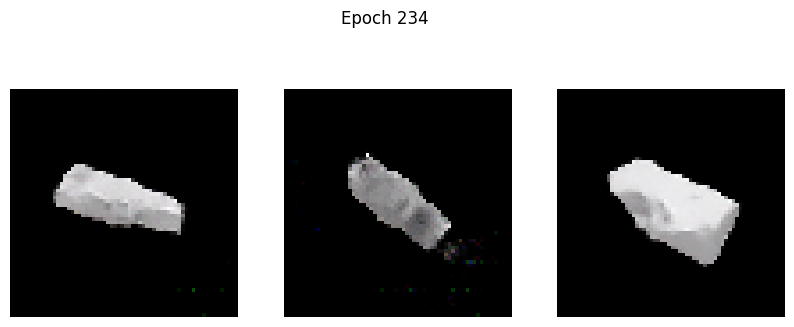

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0972 - g_loss: 3.7050
Epoch 235/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0865 - g_loss: 3.6997

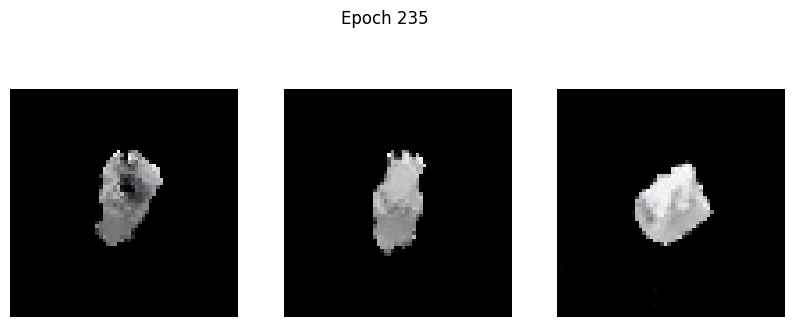

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0867 - g_loss: 3.7002
Epoch 236/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1015 - g_loss: 3.7770

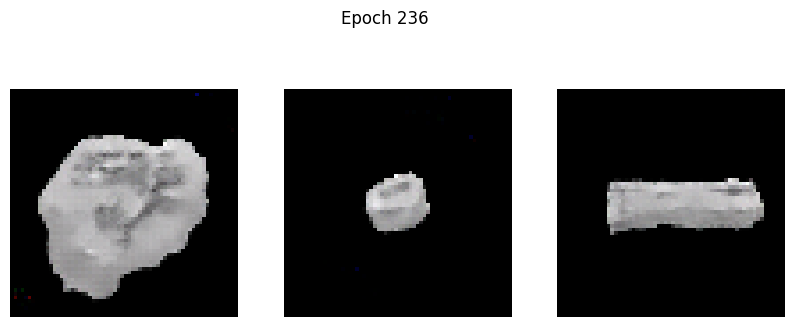

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1015 - g_loss: 3.7769
Epoch 237/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0993 - g_loss: 3.7741

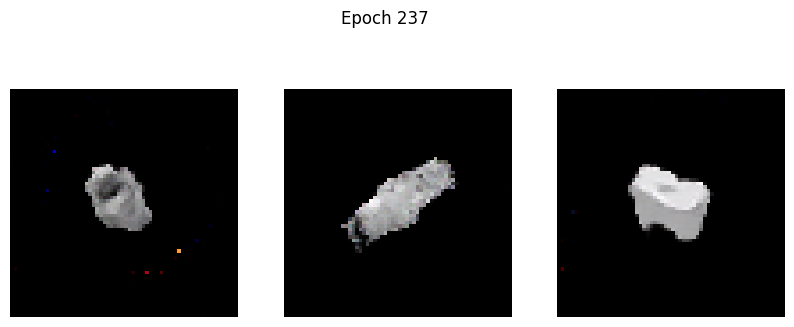

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0995 - g_loss: 3.7748
Epoch 238/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0862 - g_loss: 3.6932

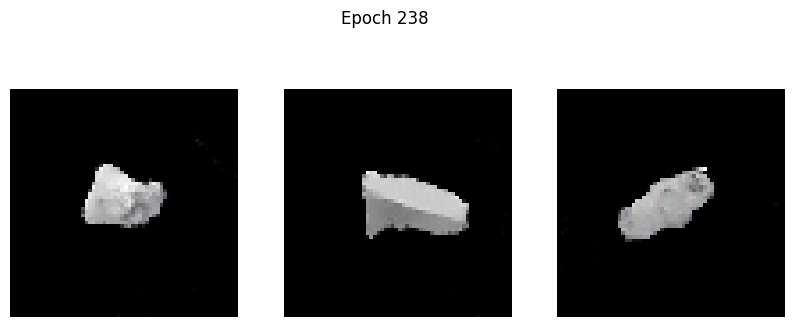

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0863 - g_loss: 3.6935
Epoch 239/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1032 - g_loss: 3.8991

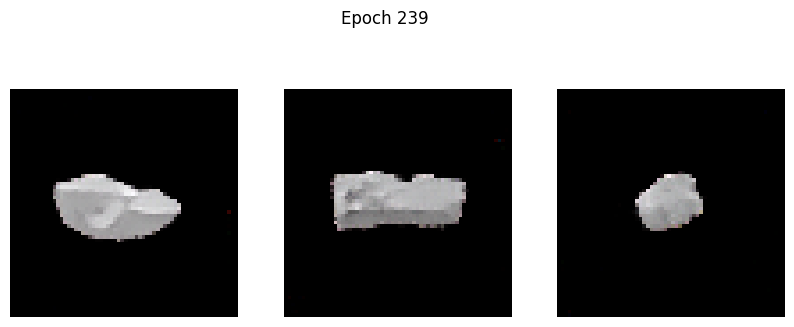

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1040 - g_loss: 3.8999
Epoch 240/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2318 - g_loss: 3.7759

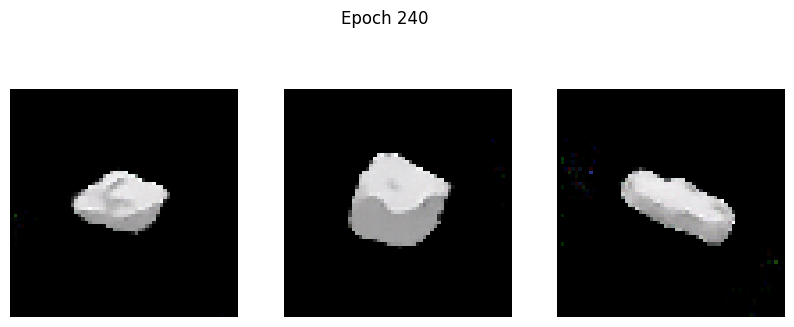

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.2308 - g_loss: 3.7749
Epoch 241/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0911 - g_loss: 3.7602

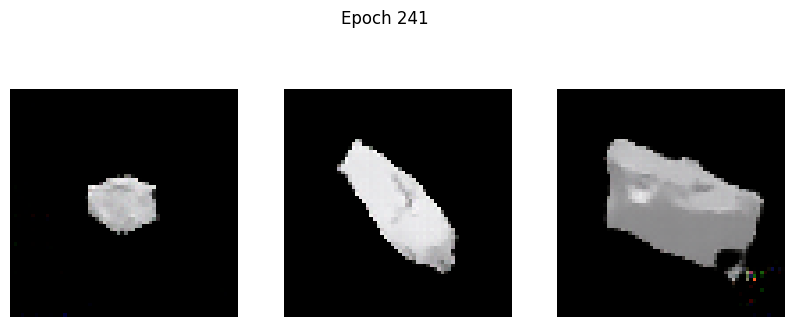

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0913 - g_loss: 3.7598
Epoch 242/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1280 - g_loss: 3.8134

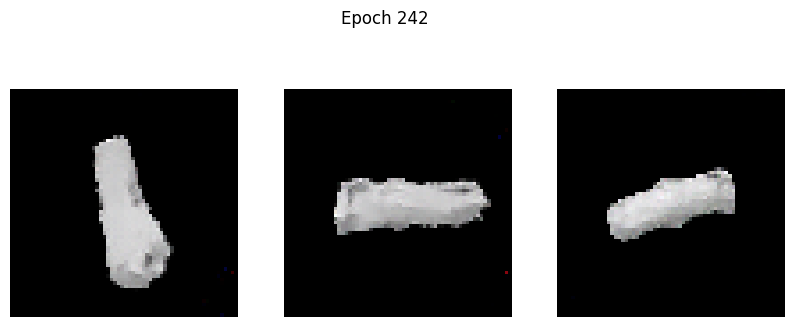

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1278 - g_loss: 3.8126
Epoch 243/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0807 - g_loss: 3.7711

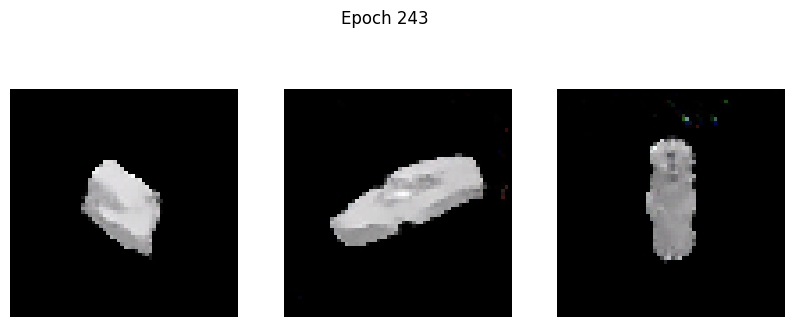

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0807 - g_loss: 3.7712
Epoch 244/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0924 - g_loss: 3.8792

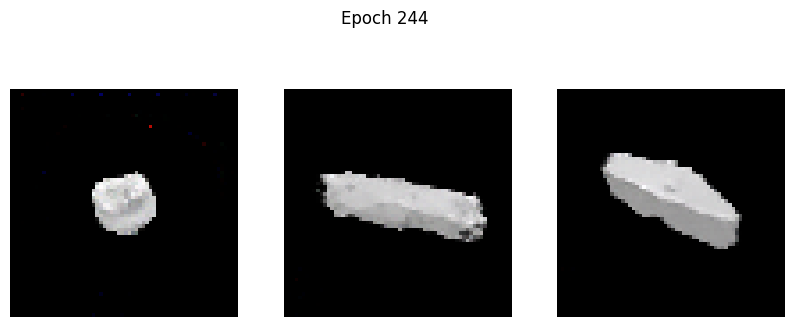

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0924 - g_loss: 3.8786
Epoch 245/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1213 - g_loss: 3.9690

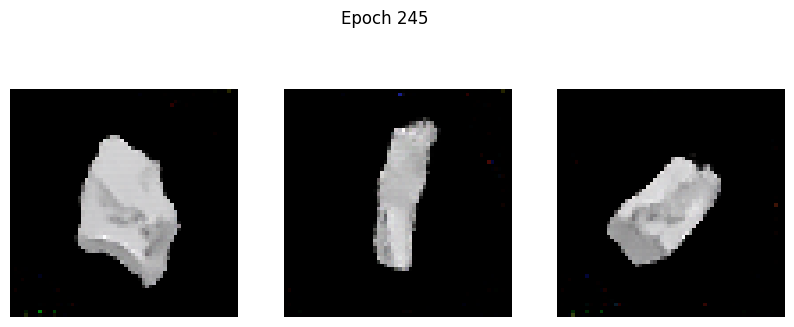

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1212 - g_loss: 3.9684
Epoch 246/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1026 - g_loss: 3.8717

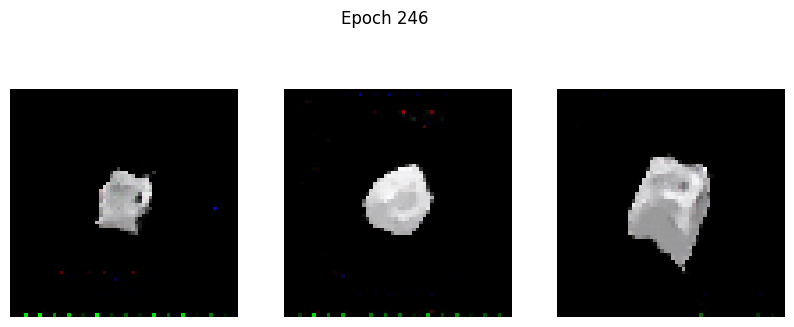

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1029 - g_loss: 3.8721
Epoch 247/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0911 - g_loss: 3.8912

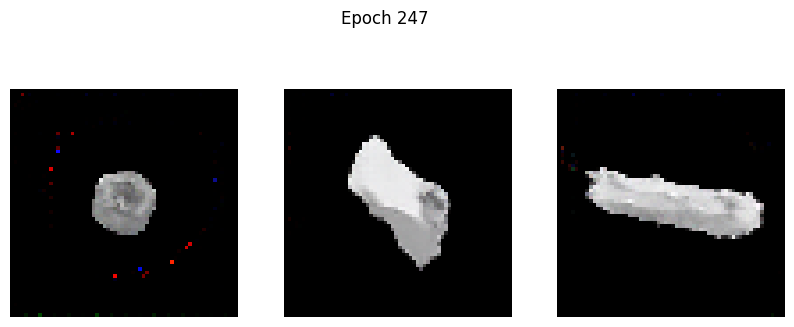

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0912 - g_loss: 3.8914
Epoch 248/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1148 - g_loss: 3.8786

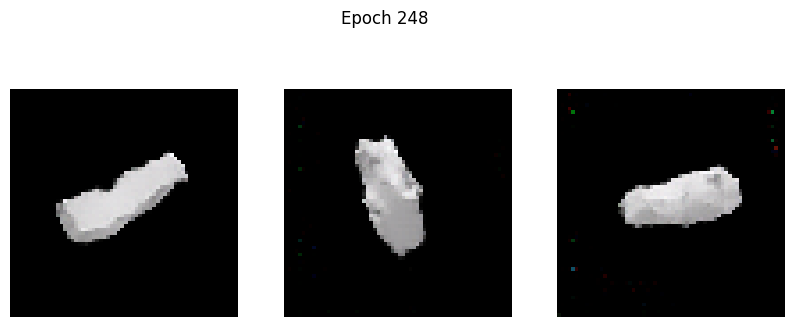

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1153 - g_loss: 3.8791
Epoch 249/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0739 - g_loss: 3.6659

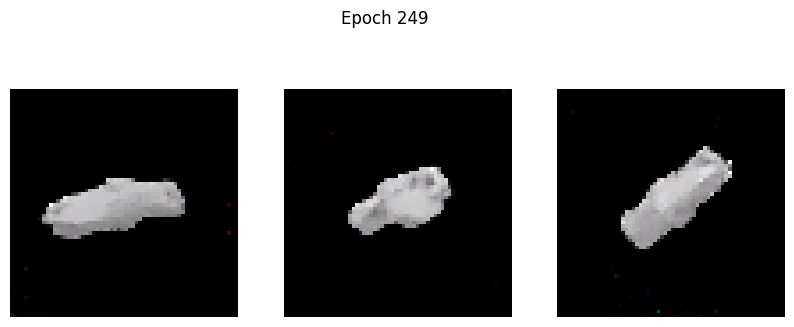

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0739 - g_loss: 3.6666
Epoch 250/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1035 - g_loss: 3.8325

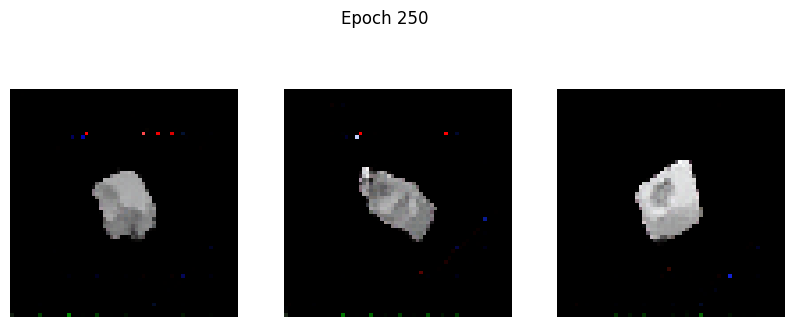

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1037 - g_loss: 3.8335
Epoch 251/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1557 - g_loss: 4.3182

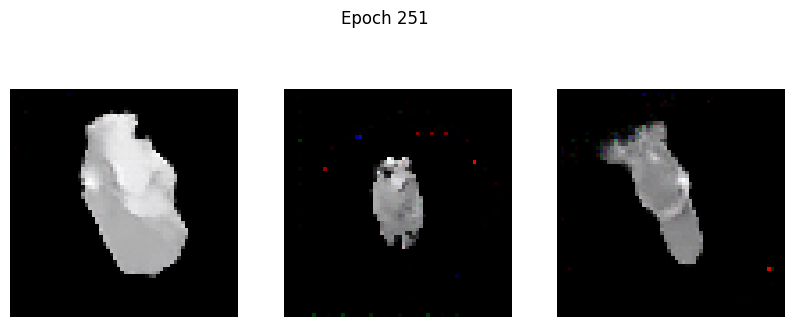

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1554 - g_loss: 4.3147
Epoch 252/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0715 - g_loss: 3.7665

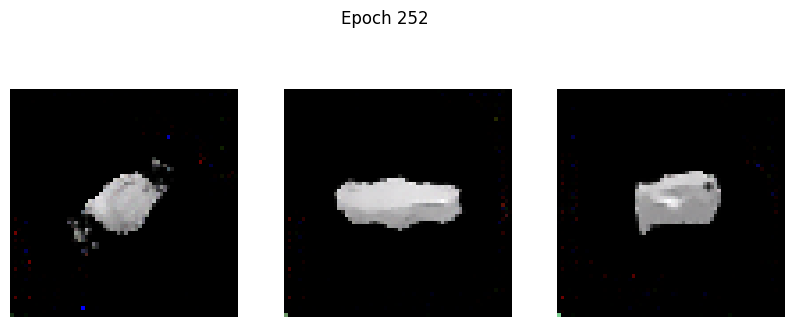

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0715 - g_loss: 3.7670
Epoch 253/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0915 - g_loss: 3.9073

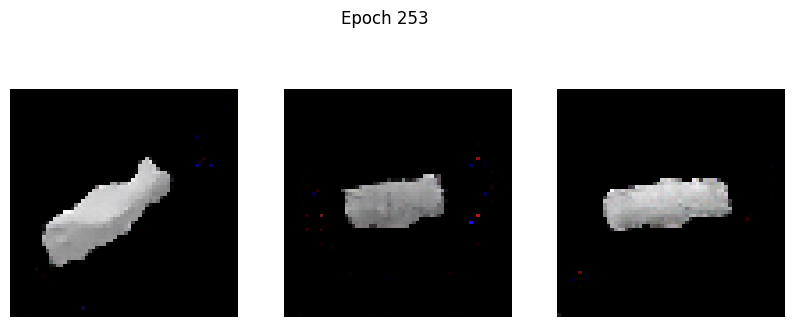

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0918 - g_loss: 3.9080
Epoch 254/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.2289 - g_loss: 3.9741

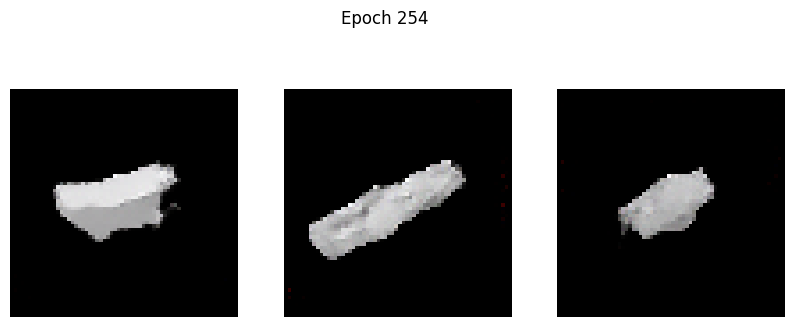

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2287 - g_loss: 3.9737
Epoch 255/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0611 - g_loss: 3.8088

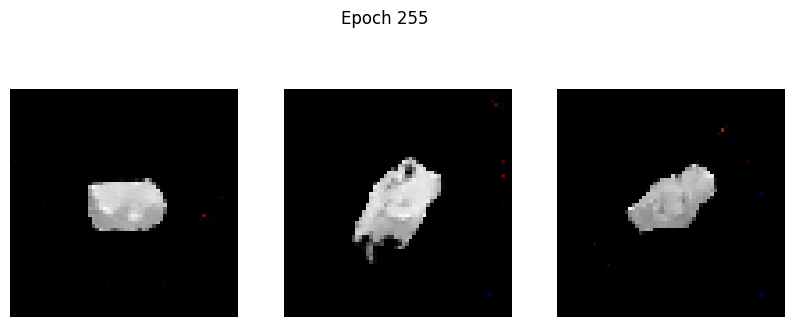

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0612 - g_loss: 3.8091
Epoch 256/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0620 - g_loss: 3.8422

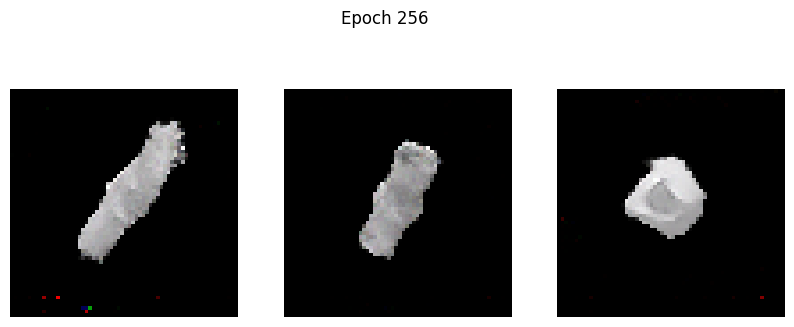

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0620 - g_loss: 3.8427
Epoch 257/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0827 - g_loss: 3.9894

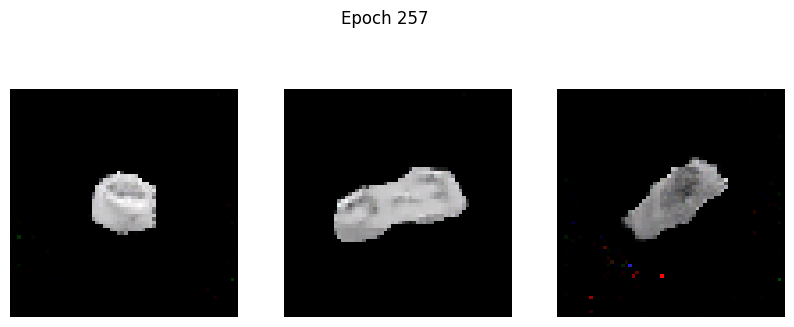

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0827 - g_loss: 3.9890
Epoch 258/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0978 - g_loss: 3.9332

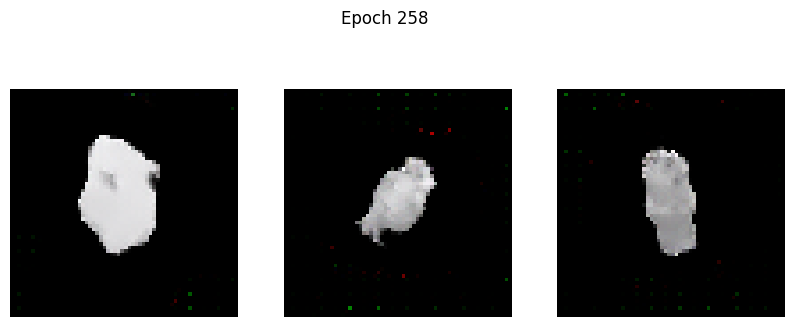

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0983 - g_loss: 3.9338
Epoch 259/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0830 - g_loss: 3.9286

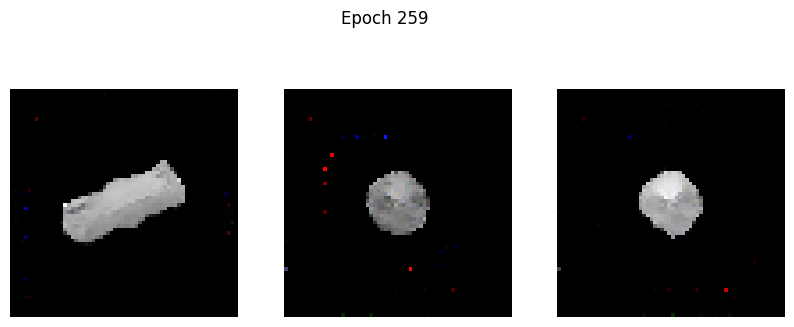

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0830 - g_loss: 3.9283
Epoch 260/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0606 - g_loss: 3.8075

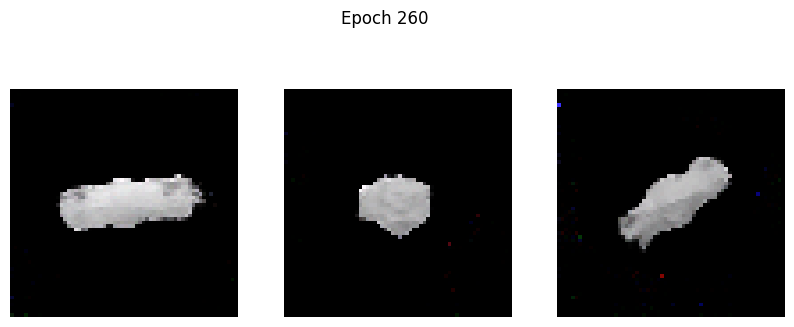

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0606 - g_loss: 3.8087
Epoch 261/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0712 - g_loss: 4.0296

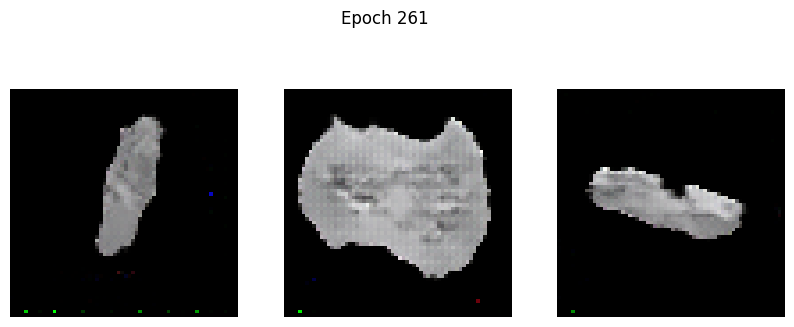

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0731 - g_loss: 4.0335
Epoch 262/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4093 - g_loss: 4.4007

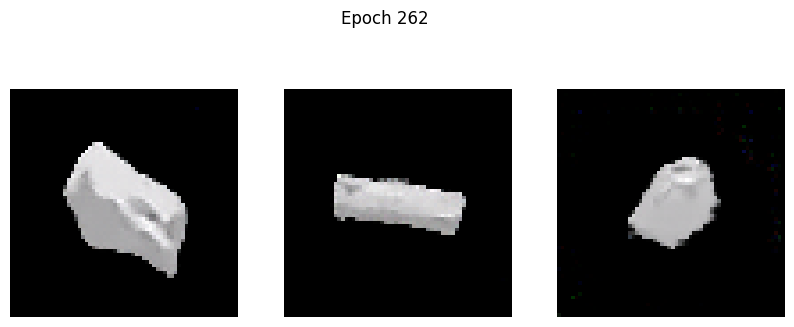

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4073 - g_loss: 4.3961
Epoch 263/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0872 - g_loss: 3.8057

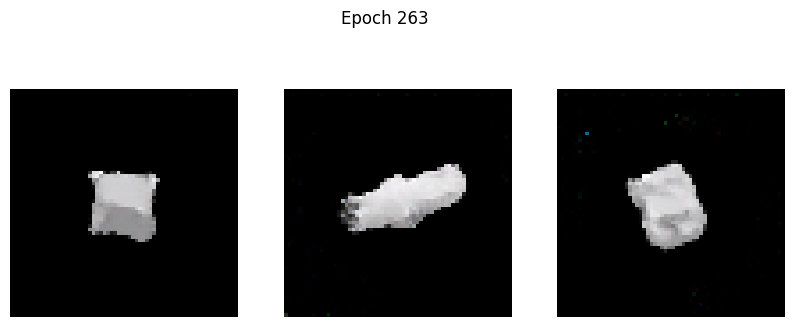

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0872 - g_loss: 3.8059
Epoch 264/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0815 - g_loss: 3.9427

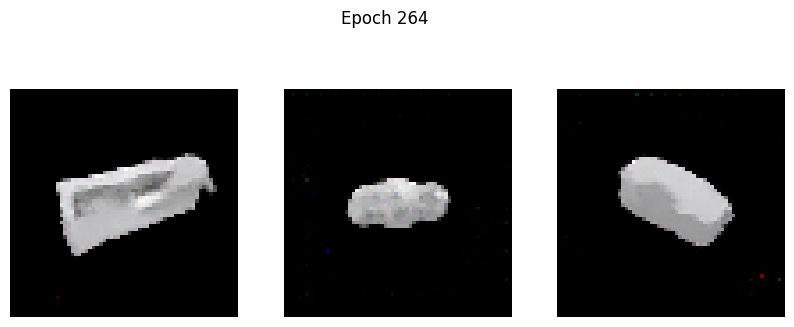

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0814 - g_loss: 3.9421
Epoch 265/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0612 - g_loss: 3.9333

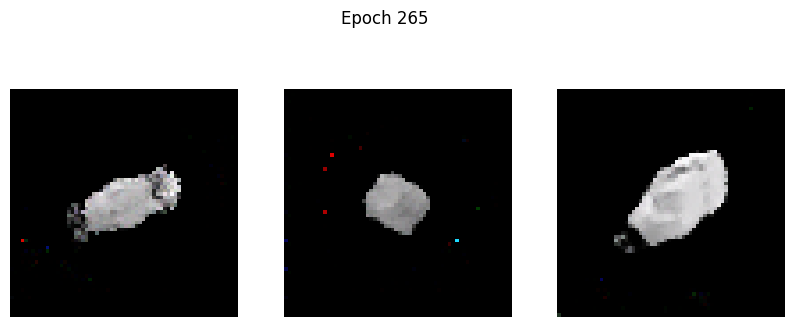

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0612 - g_loss: 3.9328
Epoch 266/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0552 - g_loss: 3.8317

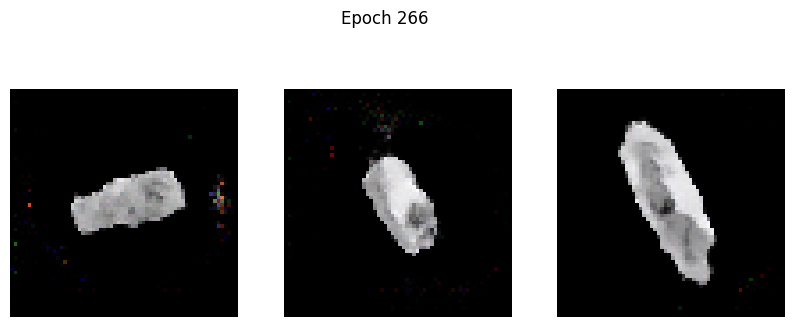

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0554 - g_loss: 3.8325
Epoch 267/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0804 - g_loss: 4.1261

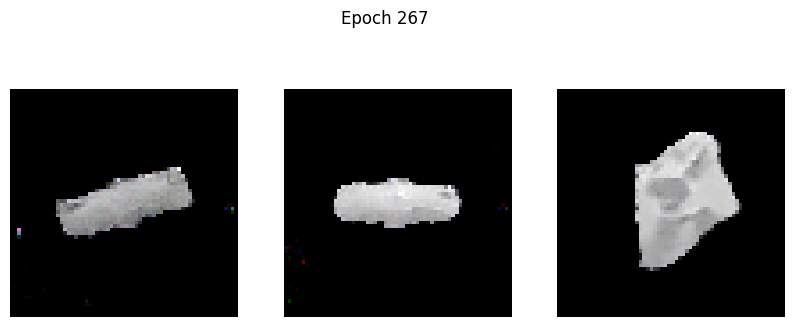

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0804 - g_loss: 4.1252
Epoch 268/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0935 - g_loss: 3.9841

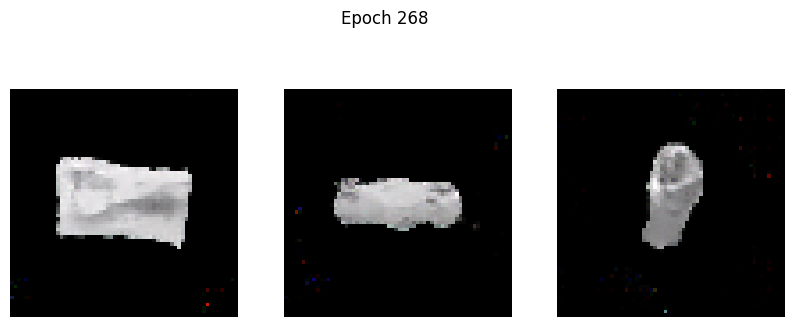

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0934 - g_loss: 3.9843
Epoch 269/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0944 - g_loss: 4.0073

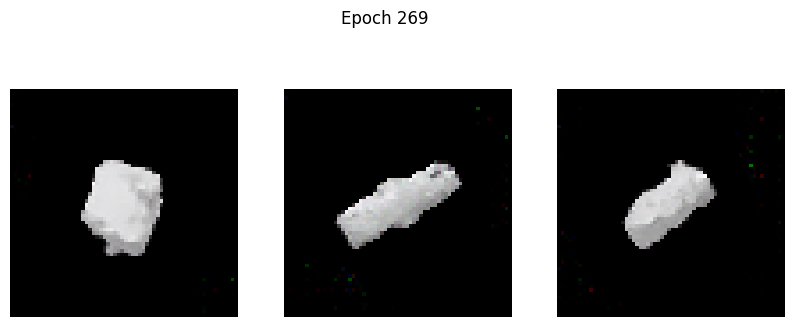

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0945 - g_loss: 4.0078
Epoch 270/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1029 - g_loss: 4.1817

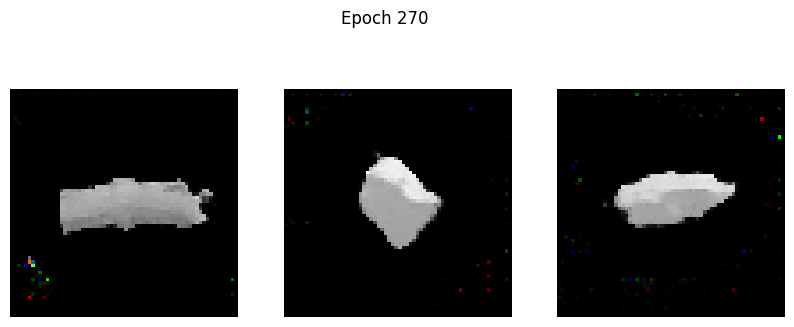

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1028 - g_loss: 4.1808
Epoch 271/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4390 - g_loss: 4.7229

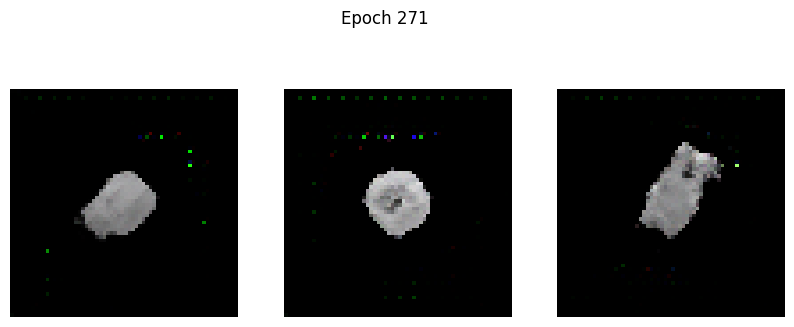

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.4393 - g_loss: 4.7221
Epoch 272/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0790 - g_loss: 3.8314

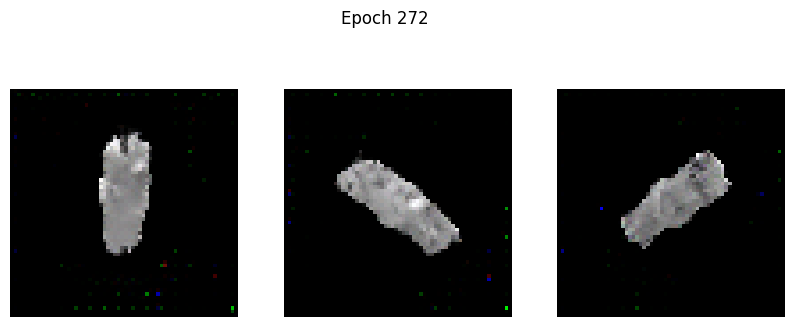

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0790 - g_loss: 3.8316
Epoch 273/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0717 - g_loss: 3.8207

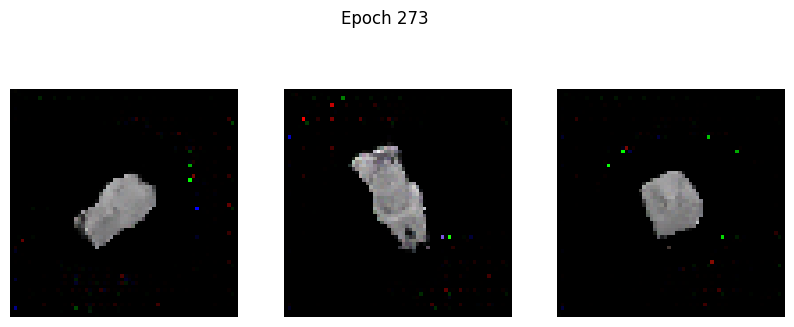

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0718 - g_loss: 3.8214
Epoch 274/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0619 - g_loss: 3.9307

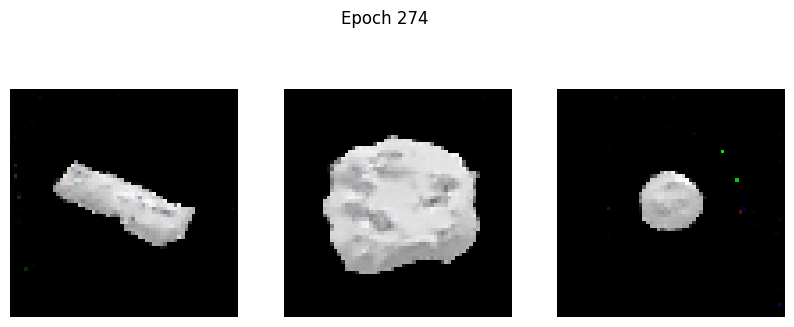

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0620 - g_loss: 3.9310
Epoch 275/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0595 - g_loss: 4.0522

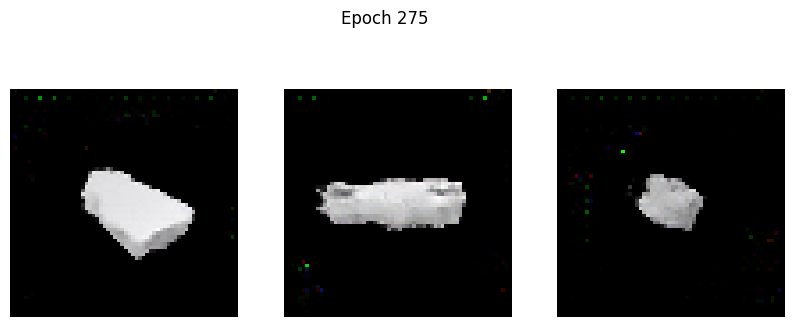

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0597 - g_loss: 4.0526
Epoch 276/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0921 - g_loss: 4.0503

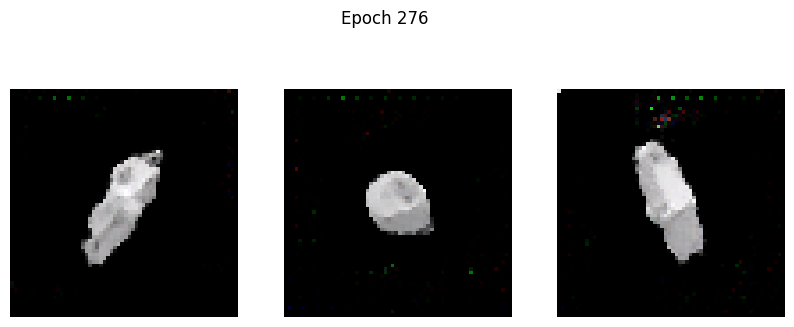

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0921 - g_loss: 4.0505
Epoch 277/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0636 - g_loss: 3.9347

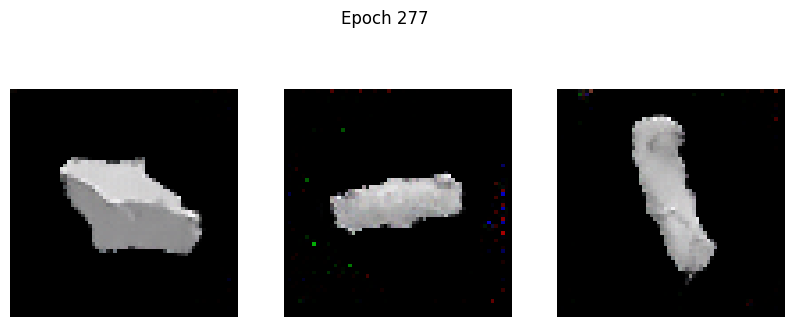

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0636 - g_loss: 3.9348
Epoch 278/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0727 - g_loss: 4.0260

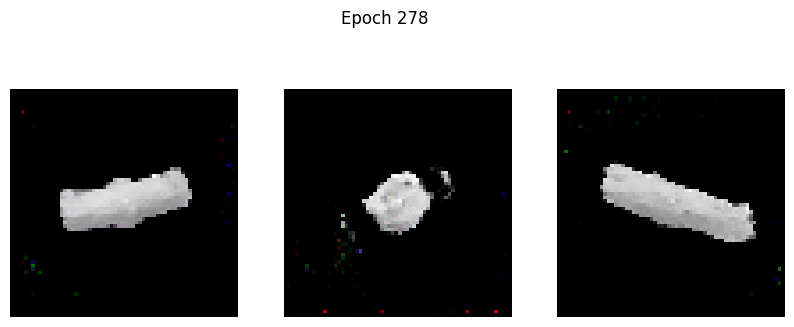

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0727 - g_loss: 4.0261
Epoch 279/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0512 - g_loss: 4.0467

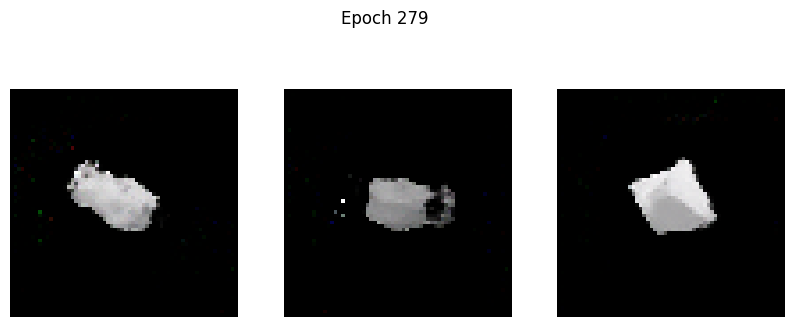

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0512 - g_loss: 4.0466
Epoch 280/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0835 - g_loss: 4.3045

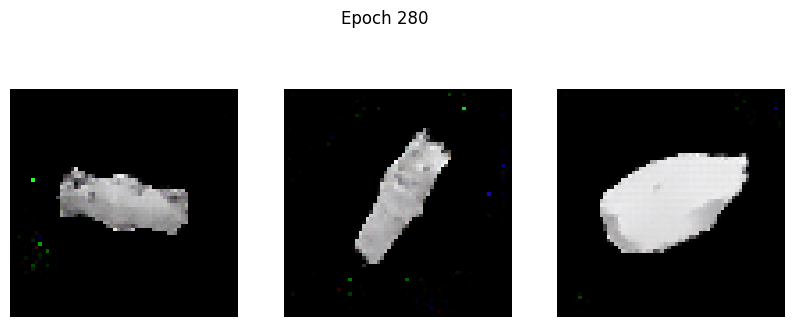

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0839 - g_loss: 4.3049
Epoch 281/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0747 - g_loss: 4.1924

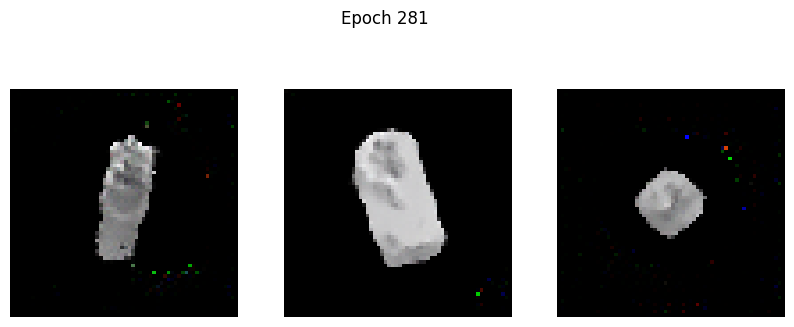

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0746 - g_loss: 4.1915
Epoch 282/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0568 - g_loss: 4.0302

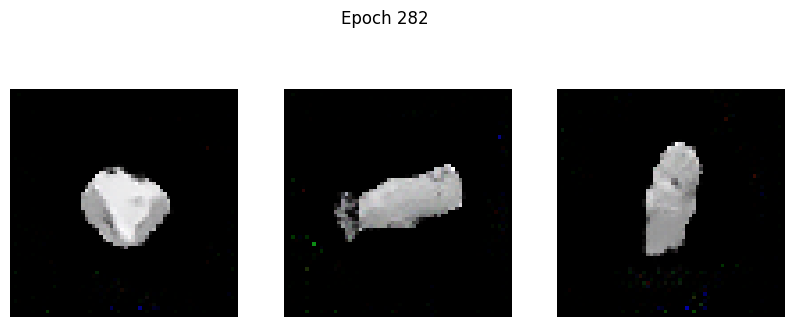

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0568 - g_loss: 4.0308
Epoch 283/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0907 - g_loss: 4.0933

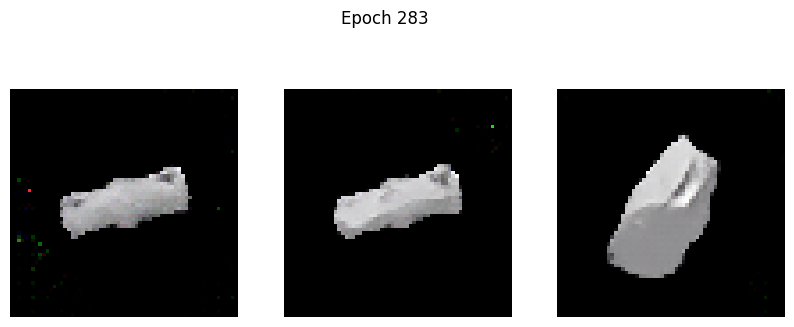

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0907 - g_loss: 4.0933
Epoch 284/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0840 - g_loss: 4.3021

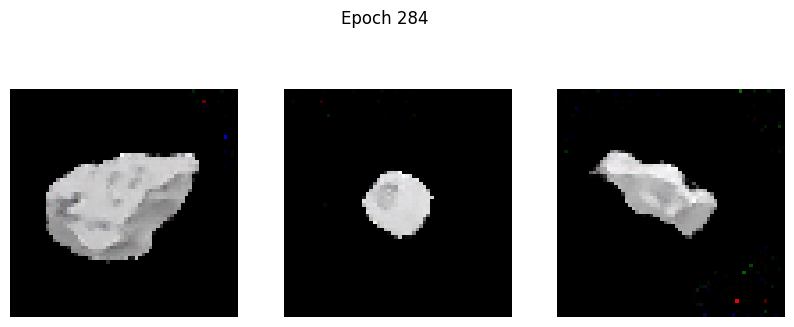

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0839 - g_loss: 4.3007
Epoch 285/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0658 - g_loss: 4.2113

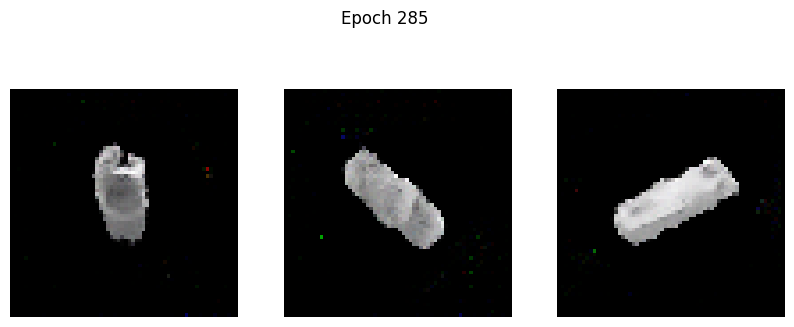

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0657 - g_loss: 4.2112
Epoch 286/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0632 - g_loss: 4.2761

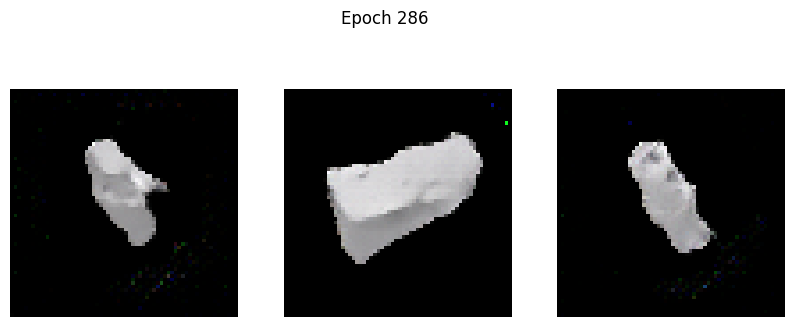

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0634 - g_loss: 4.2761
Epoch 287/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4901 - g_loss: 4.8967

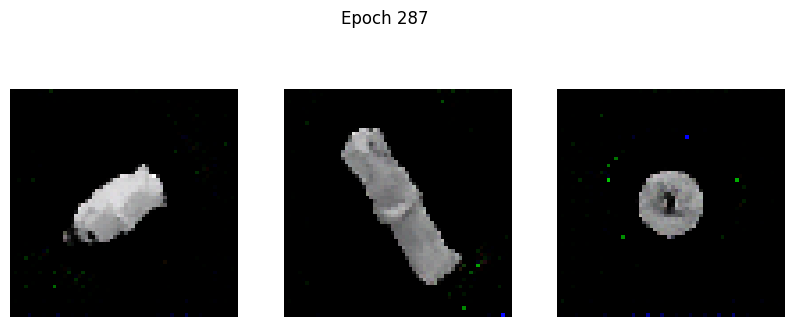

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4885 - g_loss: 4.8922
Epoch 288/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0547 - g_loss: 3.8865

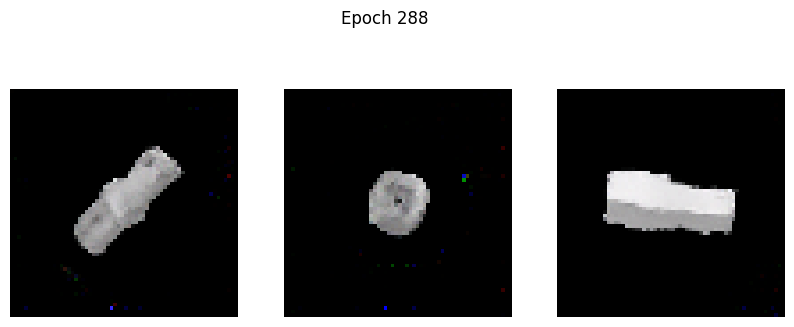

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0547 - g_loss: 3.8867
Epoch 289/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0555 - g_loss: 4.0234

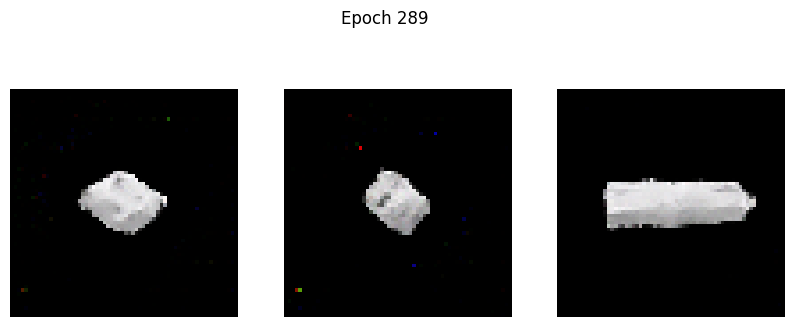

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0555 - g_loss: 4.0236
Epoch 290/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0479 - g_loss: 4.0086

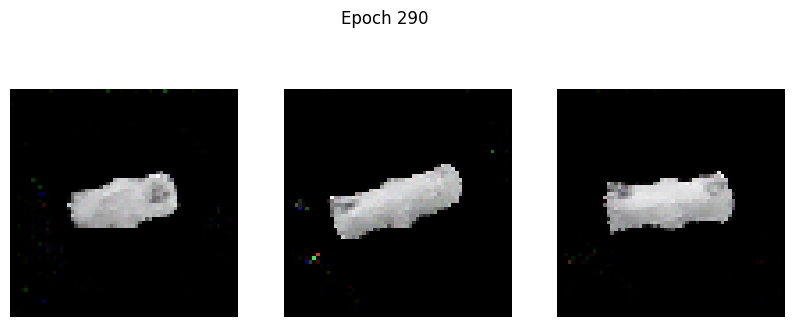

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0480 - g_loss: 4.0091
Epoch 291/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0712 - g_loss: 4.0842

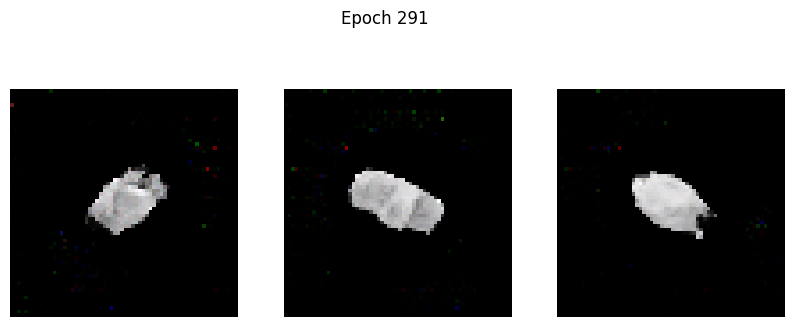

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0711 - g_loss: 4.0844
Epoch 292/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0719 - g_loss: 4.2595

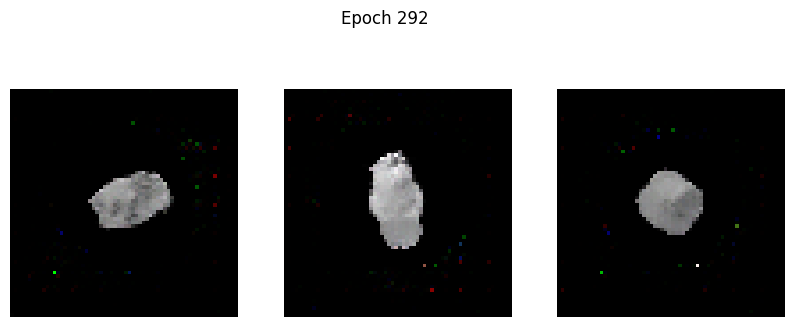

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0721 - g_loss: 4.2597
Epoch 293/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0705 - g_loss: 4.2538

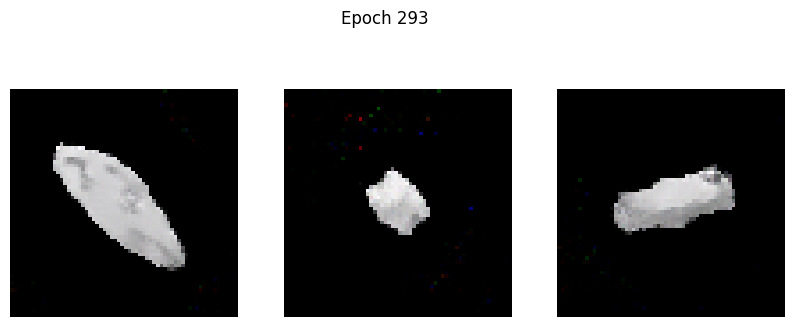

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0704 - g_loss: 4.2540
Epoch 294/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0585 - g_loss: 4.2812

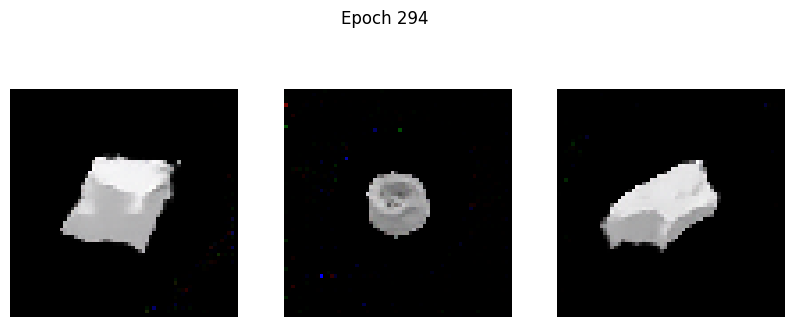

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0587 - g_loss: 4.2812
Epoch 295/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0703 - g_loss: 4.2454

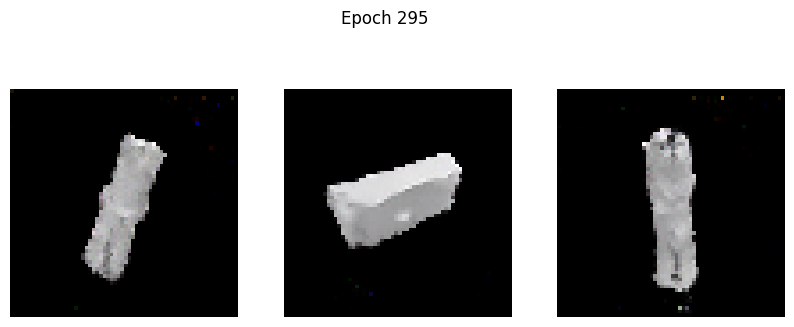

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0704 - g_loss: 4.2463
Epoch 296/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0482 - g_loss: 4.1422

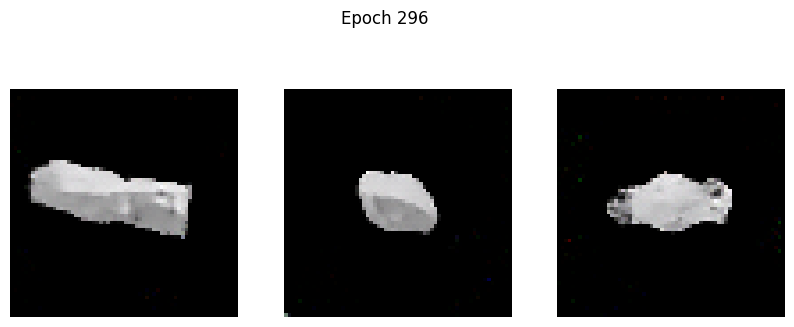

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0482 - g_loss: 4.1427
Epoch 297/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0906 - g_loss: 4.5538

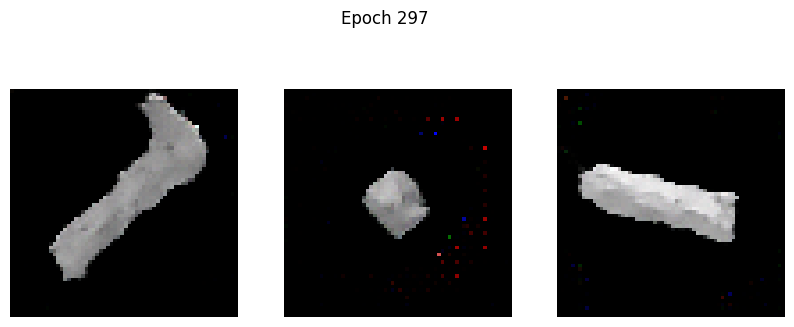

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0915 - g_loss: 4.5551
Epoch 298/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0666 - g_loss: 4.2242

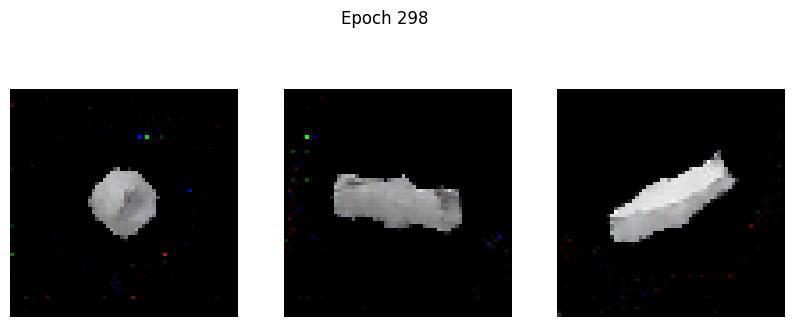

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0666 - g_loss: 4.2239
Epoch 299/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0614 - g_loss: 4.2831

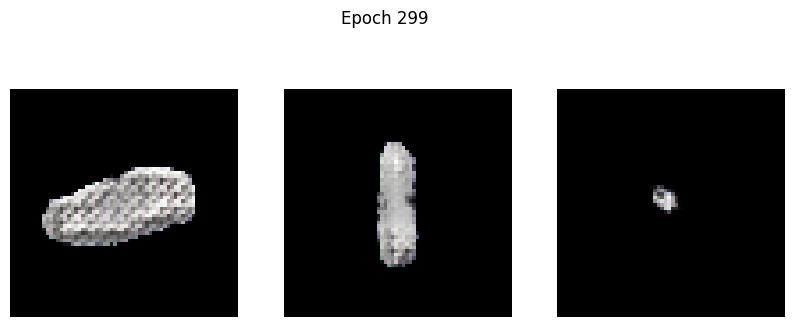

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0624 - g_loss: 4.2920
Epoch 300/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4219 - g_loss: 7.1946

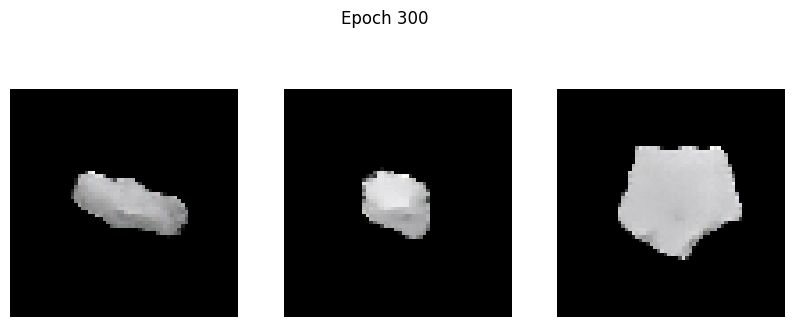

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4190 - g_loss: 7.1791
Epoch 301/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0202 - g_loss: 4.4672

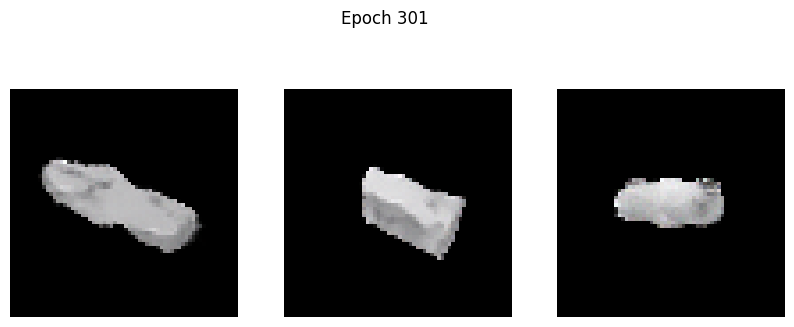

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0203 - g_loss: 4.4664
Epoch 302/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0455 - g_loss: 4.3355

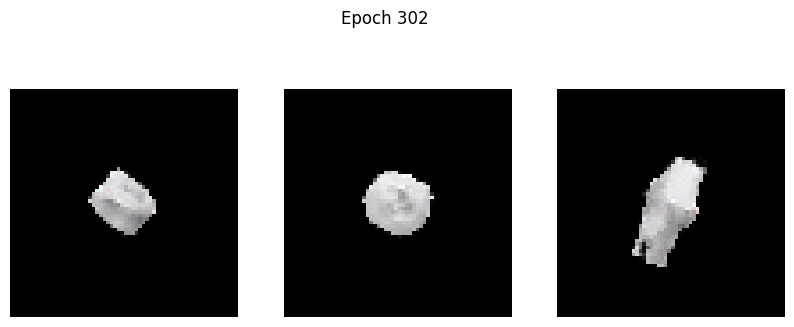

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0454 - g_loss: 4.3351
Epoch 303/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1216 - g_loss: 4.5446

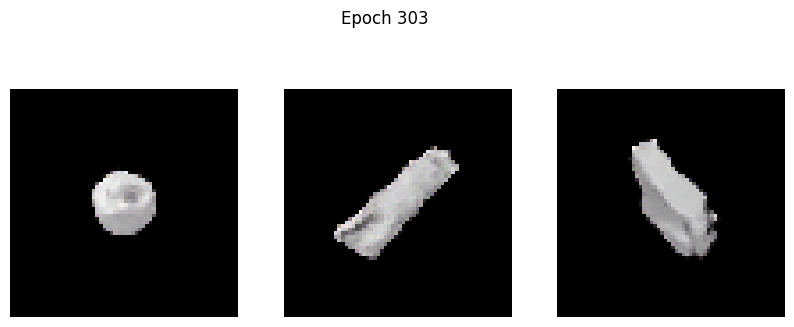

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1220 - g_loss: 4.5448
Epoch 304/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0702 - g_loss: 4.2527

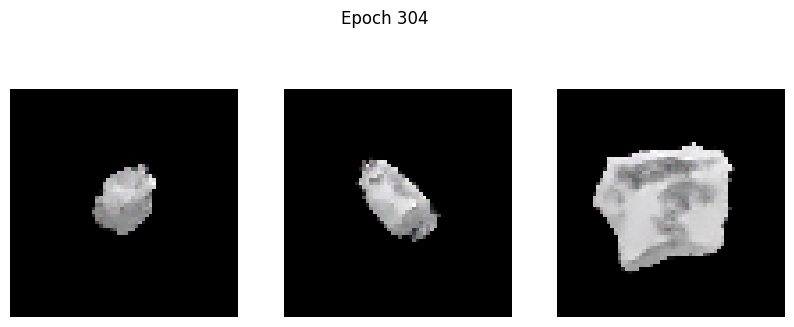

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0702 - g_loss: 4.2525
Epoch 305/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0407 - g_loss: 4.3266

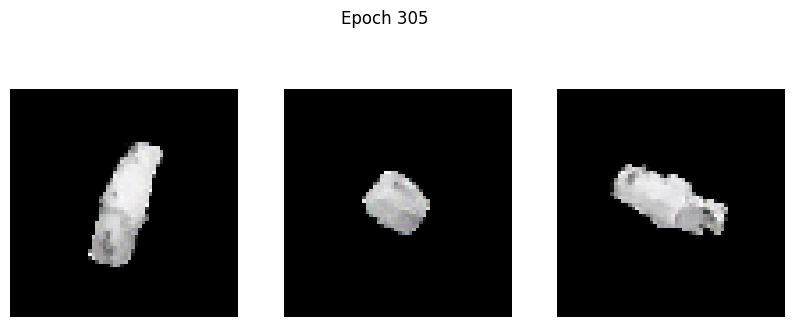

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0406 - g_loss: 4.3253
Epoch 306/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0350 - g_loss: 4.2351

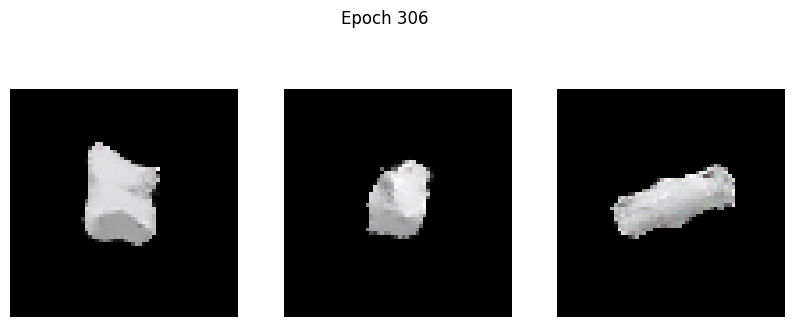

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0350 - g_loss: 4.2354
Epoch 307/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0991 - g_loss: 4.6531

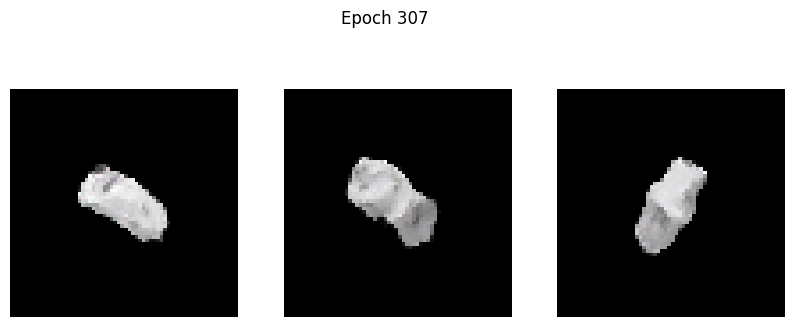

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0989 - g_loss: 4.6508
Epoch 308/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0341 - g_loss: 4.2175

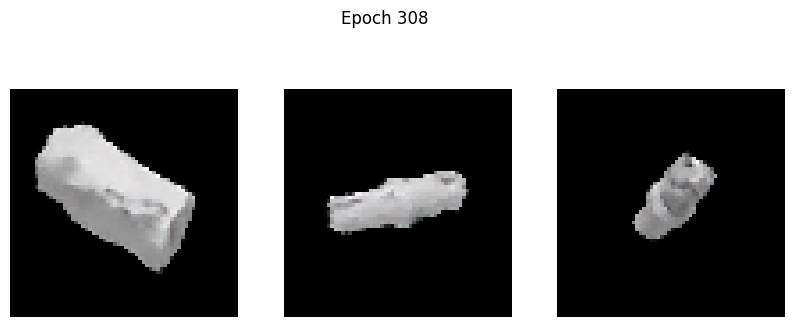

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0343 - g_loss: 4.2188
Epoch 309/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0496 - g_loss: 4.2939

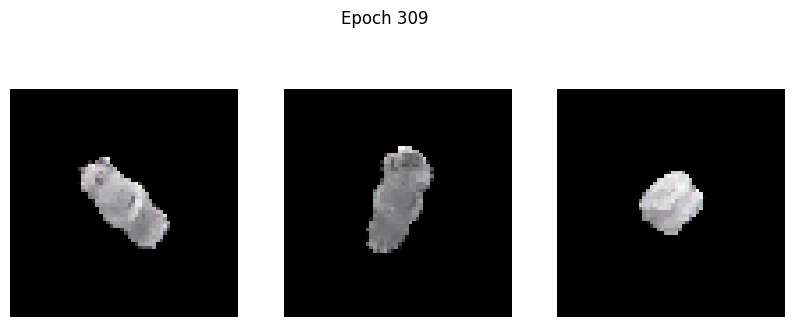

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0498 - g_loss: 4.2953
Epoch 310/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0490 - g_loss: 4.5784

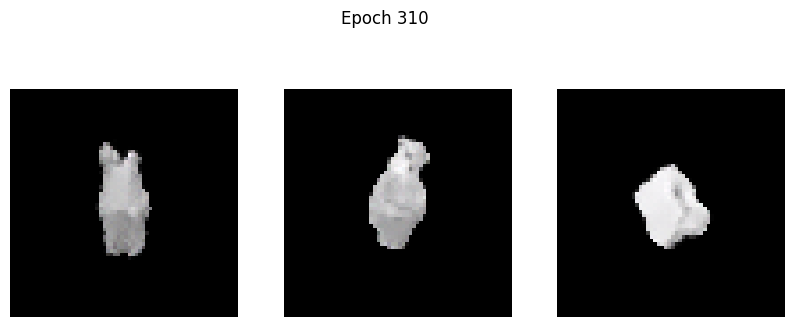

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0490 - g_loss: 4.5786
Epoch 311/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0920 - g_loss: 4.5406

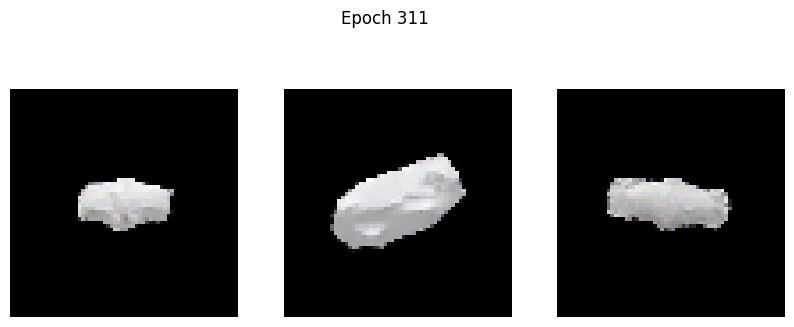

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0919 - g_loss: 4.5396
Epoch 312/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0319 - g_loss: 4.3880

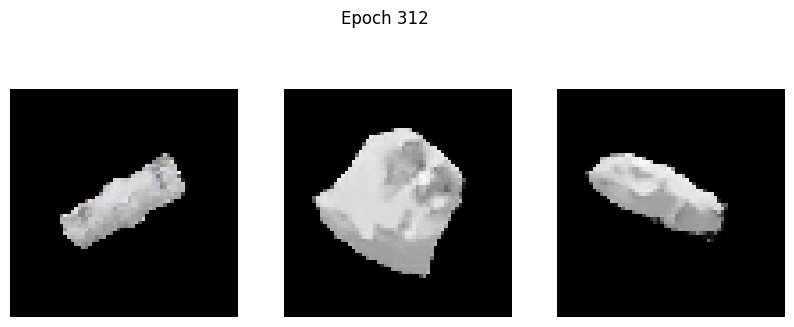

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0320 - g_loss: 4.3885
Epoch 313/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0532 - g_loss: 4.4634

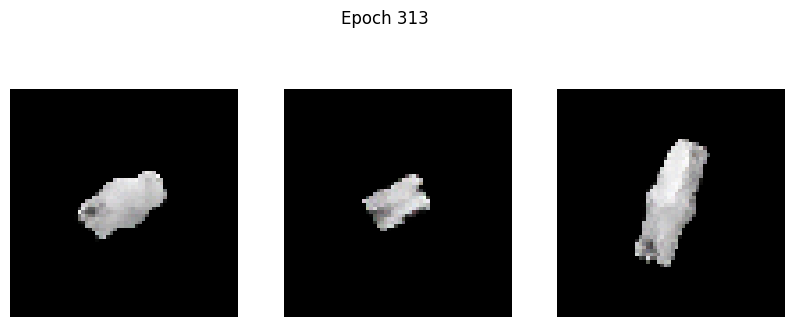

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0533 - g_loss: 4.4638
Epoch 314/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1066 - g_loss: 4.5904

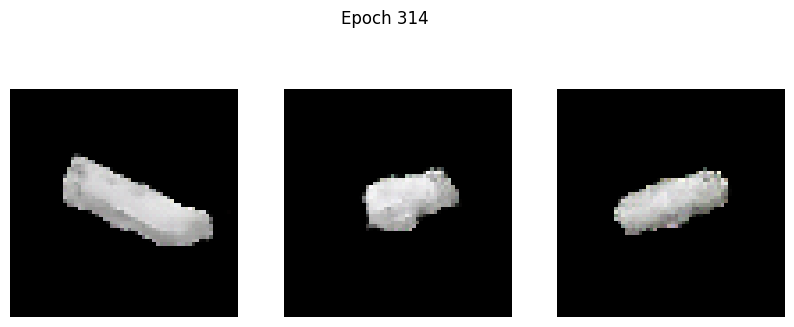

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1091 - g_loss: 4.5942
Epoch 315/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0805 - g_loss: 4.4276

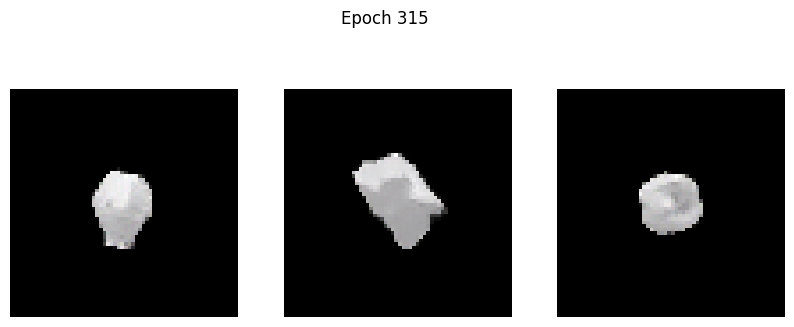

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0803 - g_loss: 4.4260
Epoch 316/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0517 - g_loss: 4.3030

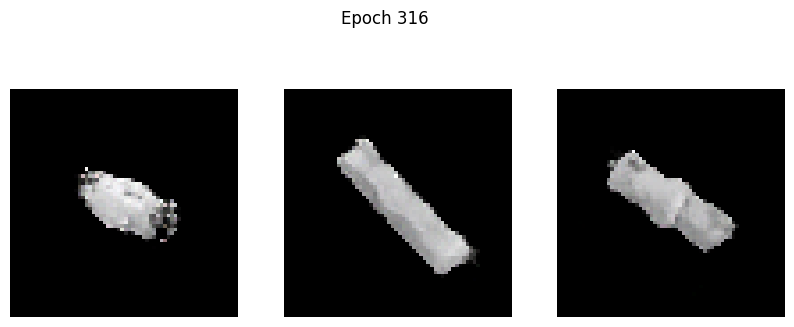

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0516 - g_loss: 4.3025
Epoch 317/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0122 - g_loss: 4.1347

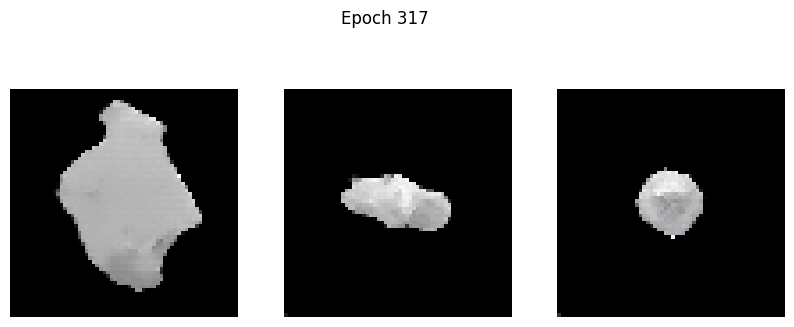

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0123 - g_loss: 4.1354
Epoch 318/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0751 - g_loss: 4.5894

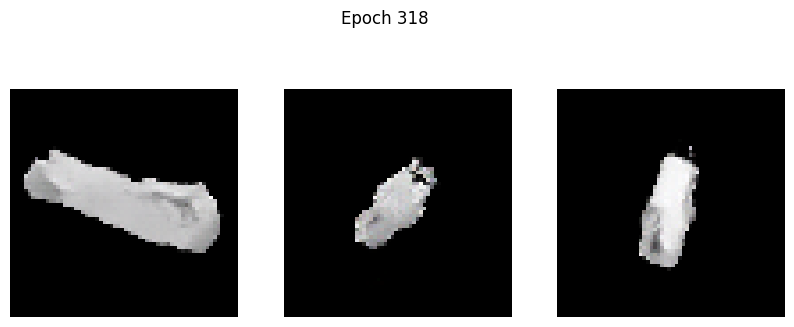

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0751 - g_loss: 4.5886
Epoch 319/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0565 - g_loss: 4.5778

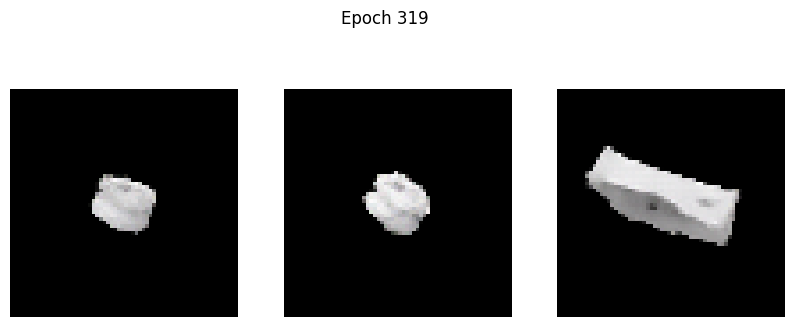

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0564 - g_loss: 4.5765
Epoch 320/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0233 - g_loss: 4.3415

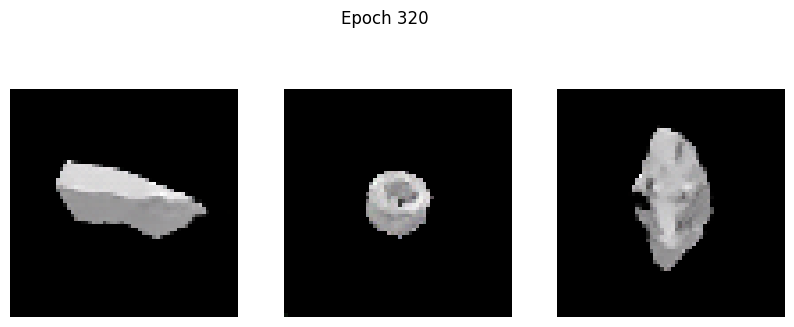

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0234 - g_loss: 4.3422
Epoch 321/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0891 - g_loss: 4.5790

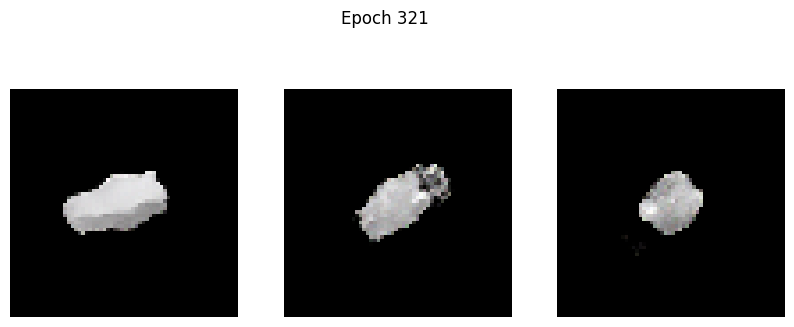

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.0892 - g_loss: 4.5792
Epoch 322/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1035 - g_loss: 4.5201

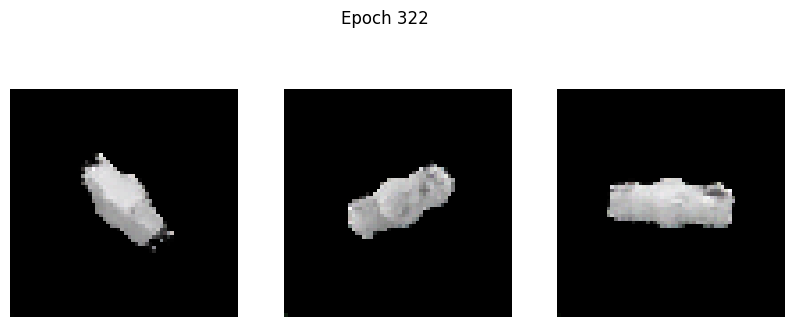

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1030 - g_loss: 4.5193
Epoch 323/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0387 - g_loss: 4.5594

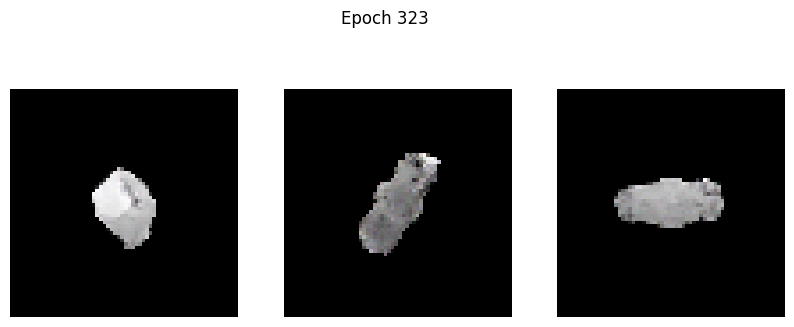

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0387 - g_loss: 4.5588
Epoch 324/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1061 - g_loss: 4.7290

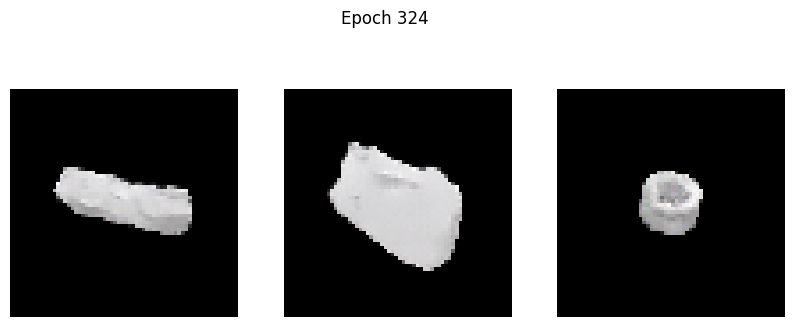

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1057 - g_loss: 4.7278
Epoch 325/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0411 - g_loss: 4.5254

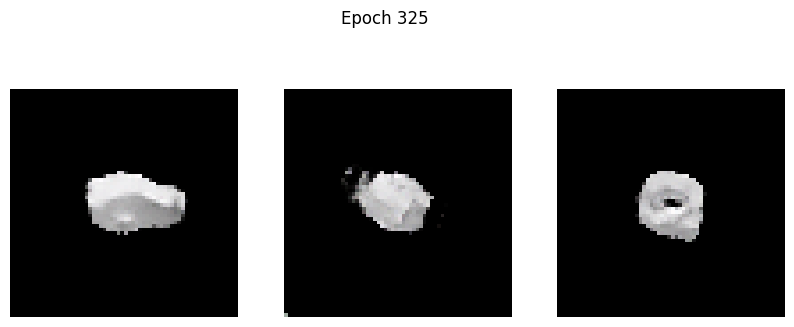

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0411 - g_loss: 4.5253
Epoch 326/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0424 - g_loss: 4.6641

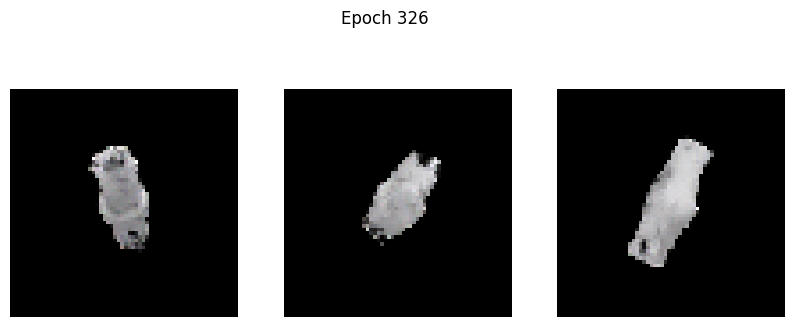

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0425 - g_loss: 4.6631
Epoch 327/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0271 - g_loss: 4.4832

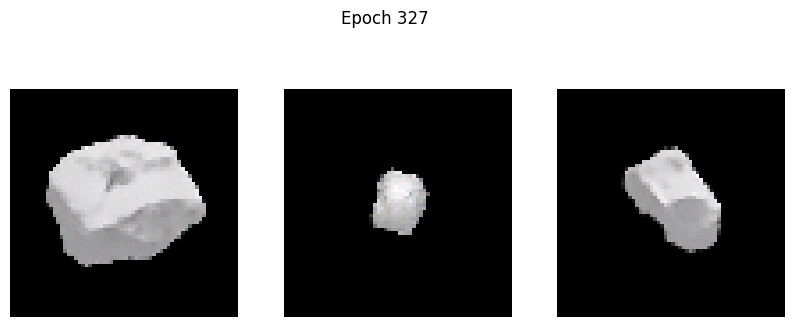

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0271 - g_loss: 4.4840
Epoch 328/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1070 - g_loss: 4.8065

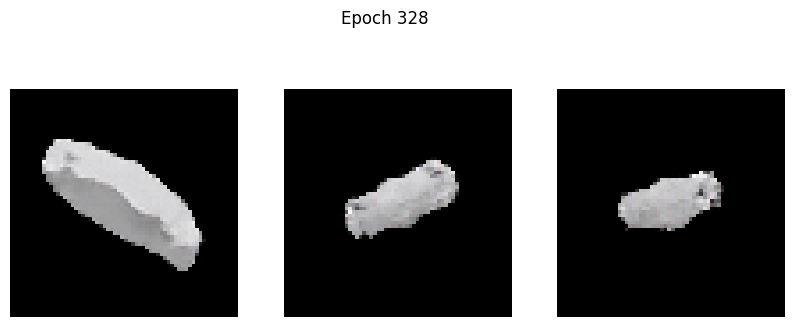

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1075 - g_loss: 4.8073
Epoch 329/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0273 - g_loss: 4.6470

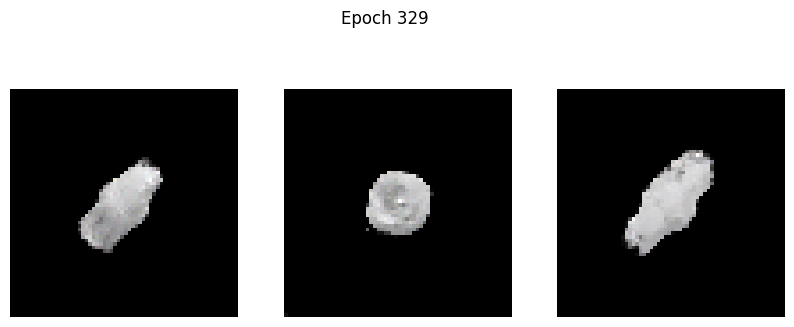

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0273 - g_loss: 4.6457
Epoch 330/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0138 - g_loss: 4.5210

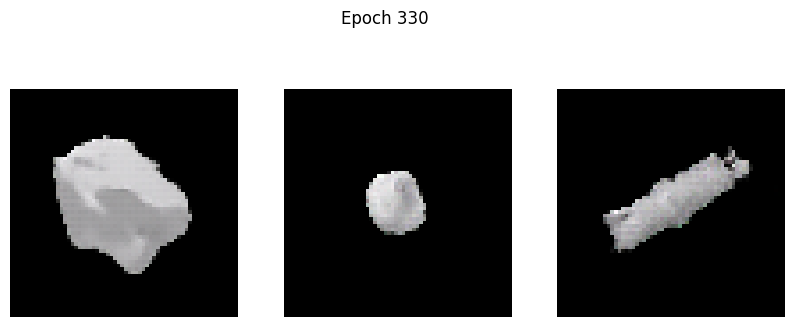

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0140 - g_loss: 4.5230
Epoch 331/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4554 - g_loss: 5.5151

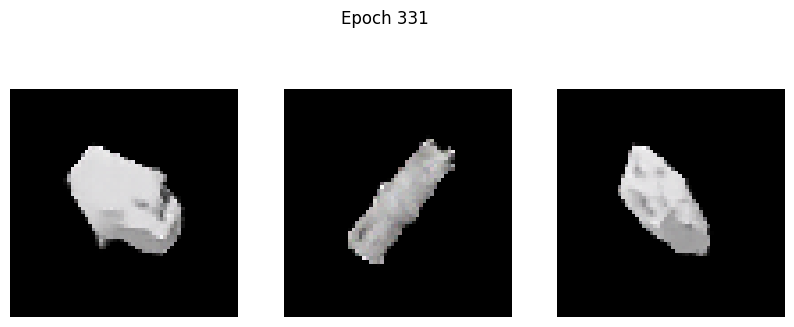

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4531 - g_loss: 5.5095
Epoch 332/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0043 - g_loss: 4.4152

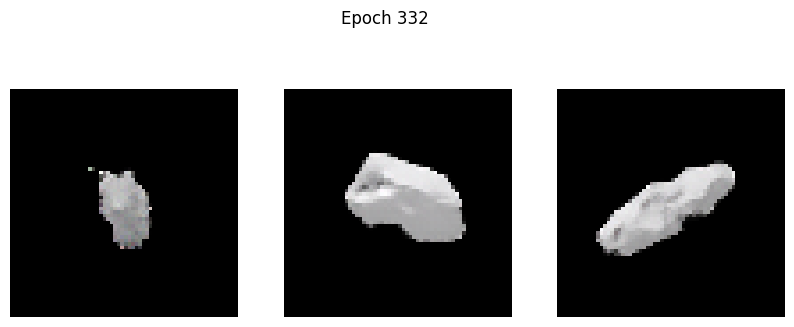

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0045 - g_loss: 4.4150
Epoch 333/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1080 - g_loss: 4.5587

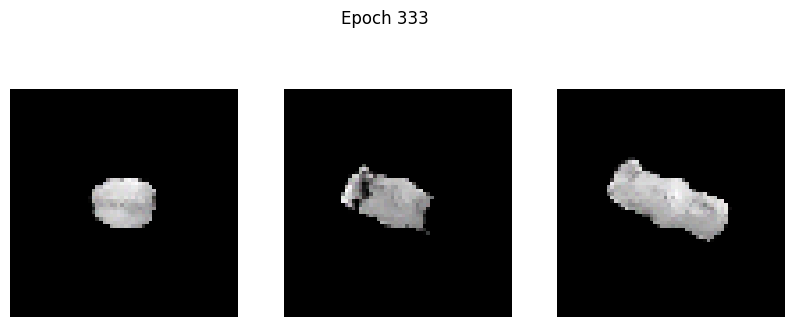

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1076 - g_loss: 4.5580
Epoch 334/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0316 - g_loss: 4.4566

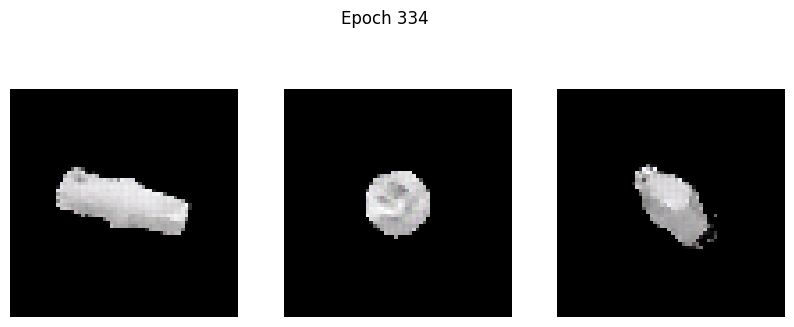

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0315 - g_loss: 4.4566
Epoch 335/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0443 - g_loss: 4.7113

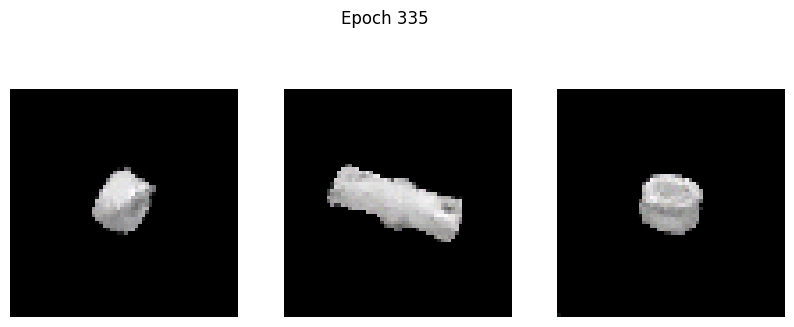

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0443 - g_loss: 4.7109
Epoch 336/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0635 - g_loss: 4.8778

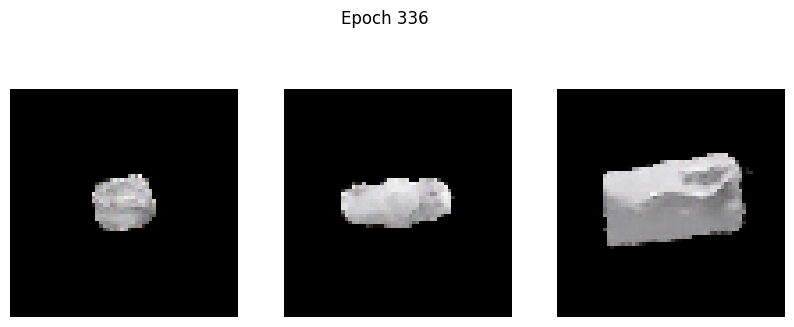

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0633 - g_loss: 4.8771
Epoch 337/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0952 - g_loss: 4.4996

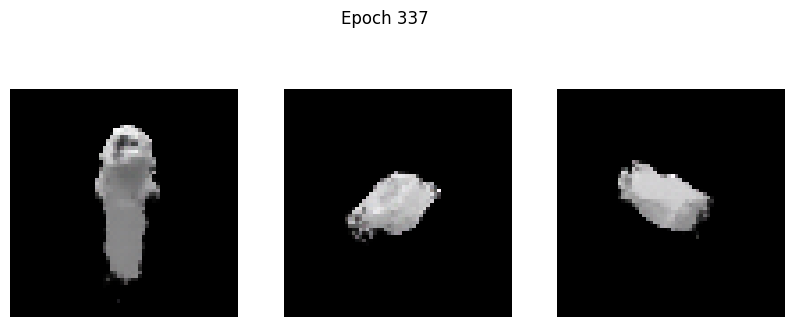

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.0948 - g_loss: 4.5002
Epoch 338/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0401 - g_loss: 4.5479

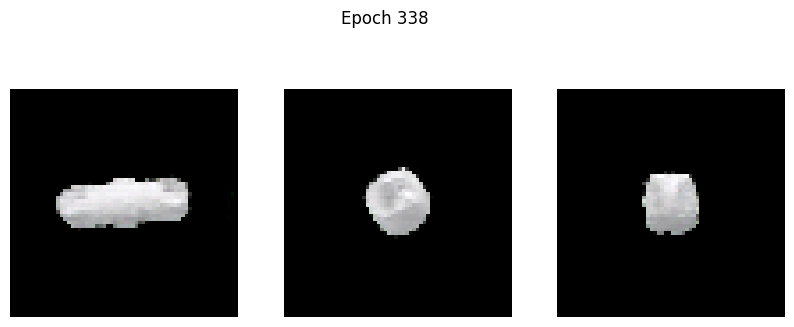

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0404 - g_loss: 4.5484
Epoch 339/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0526 - g_loss: 4.7400

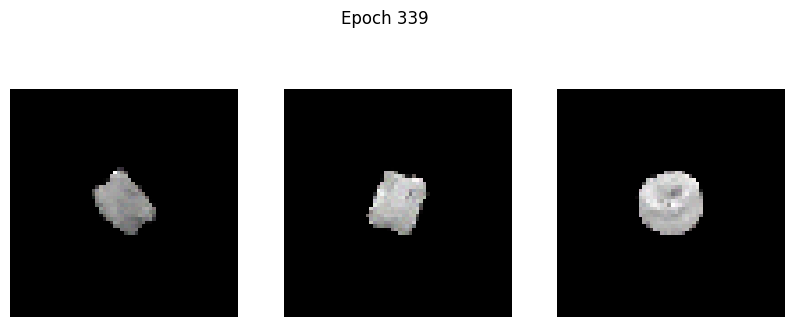

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0527 - g_loss: 4.7395
Epoch 340/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1243 - g_loss: 4.8648

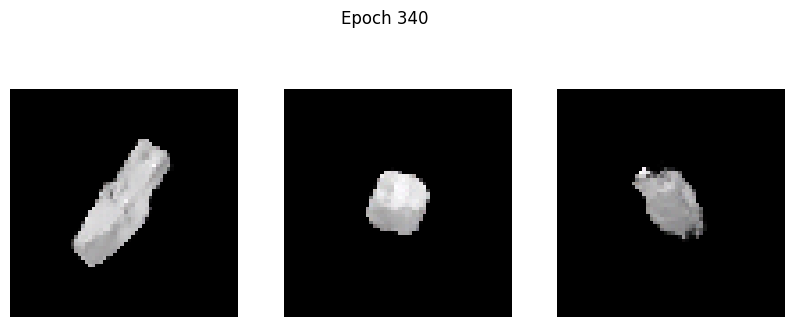

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1239 - g_loss: 4.8636
Epoch 341/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0596 - g_loss: 4.7540

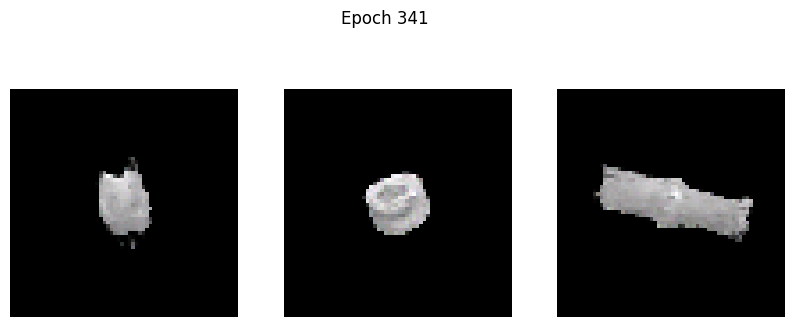

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0595 - g_loss: 4.7549
Epoch 342/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0342 - g_loss: 4.6897

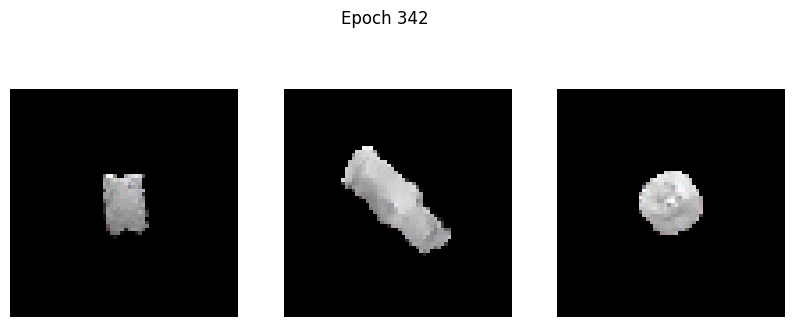

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0341 - g_loss: 4.6894
Epoch 343/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0160 - g_loss: 4.5580

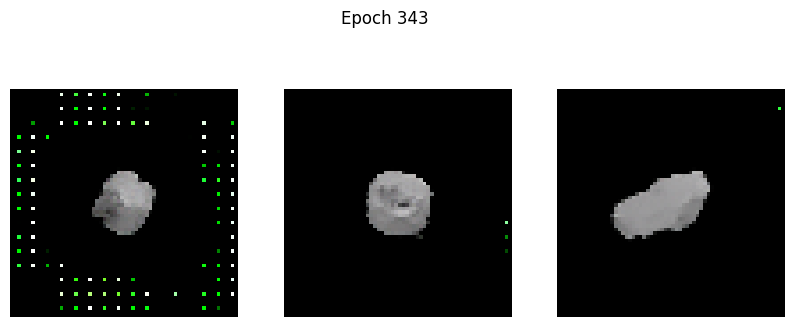

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0160 - g_loss: 4.5576
Epoch 344/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0417 - g_loss: 4.9201

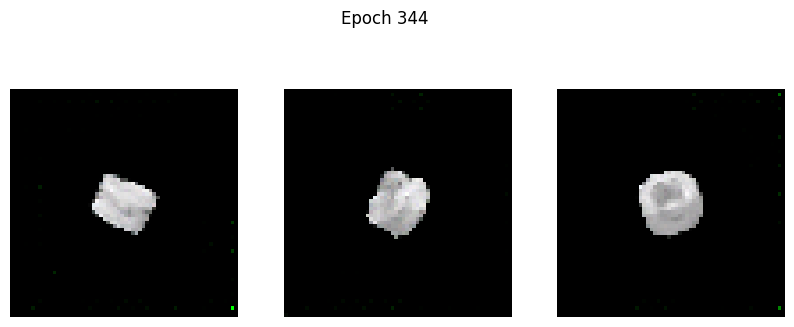

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0420 - g_loss: 4.9203
Epoch 345/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1122 - g_loss: 5.1821

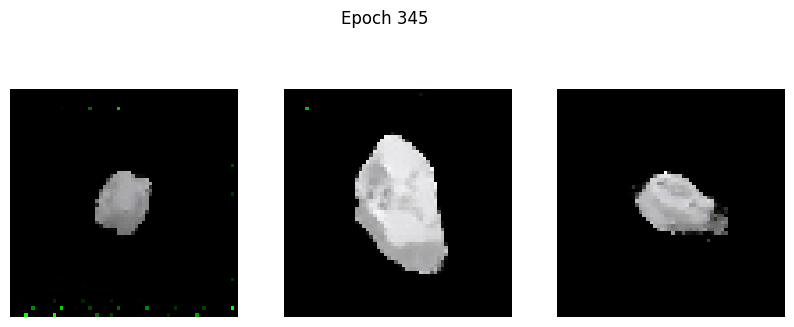

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1129 - g_loss: 5.1813
Epoch 346/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0277 - g_loss: 4.5118

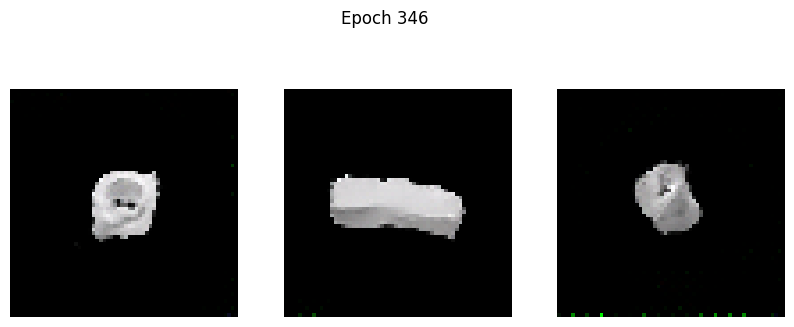

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0276 - g_loss: 4.5122
Epoch 347/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0437 - g_loss: 4.6300

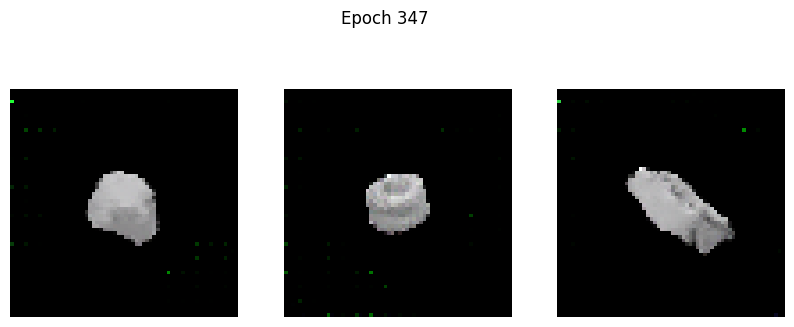

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0436 - g_loss: 4.6306
Epoch 348/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0556 - g_loss: 4.8451

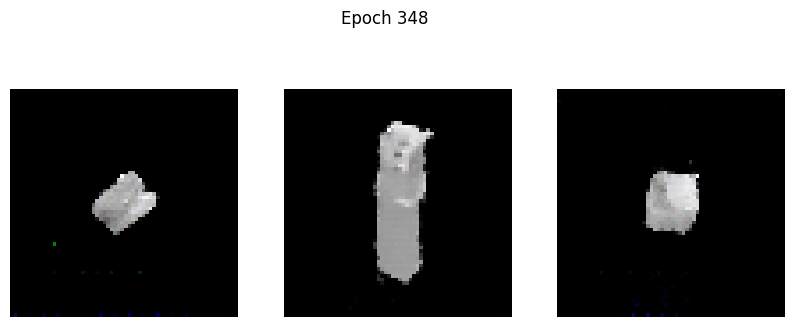

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0554 - g_loss: 4.8453
Epoch 349/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0615 - g_loss: 4.9689

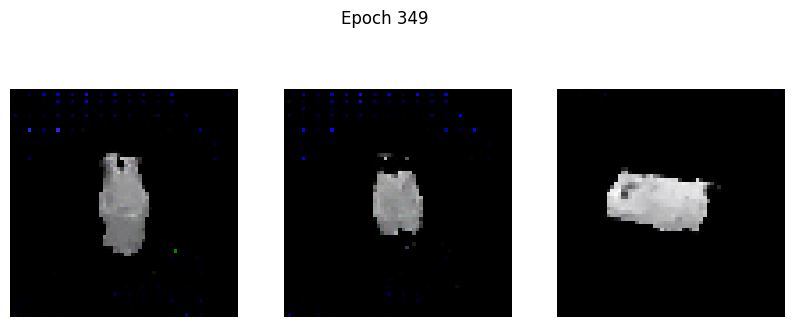

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0617 - g_loss: 4.9680
Epoch 350/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0249 - g_loss: 4.7652

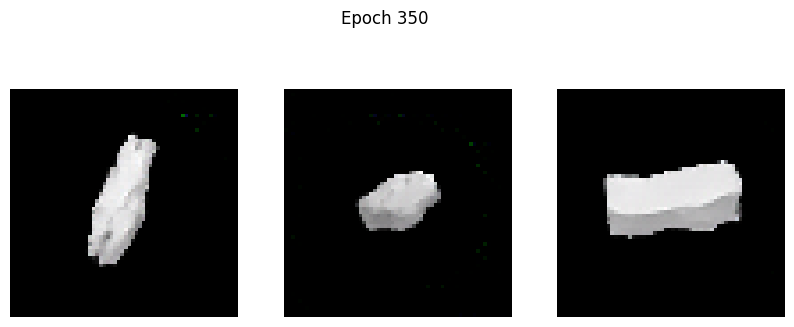

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0254 - g_loss: 4.7672
Epoch 351/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0119 - g_loss: 4.7603

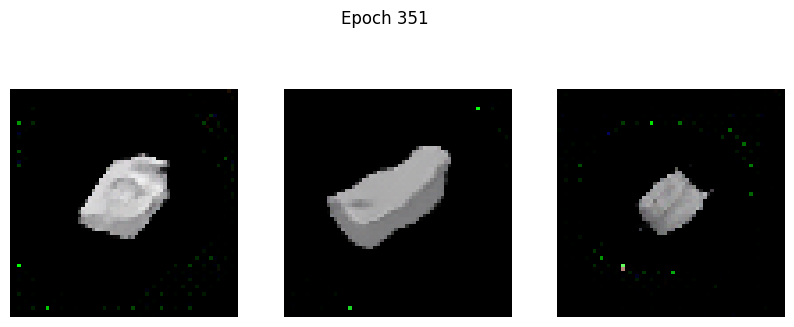

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0124 - g_loss: 4.7613
Epoch 352/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0602 - g_loss: 4.7482

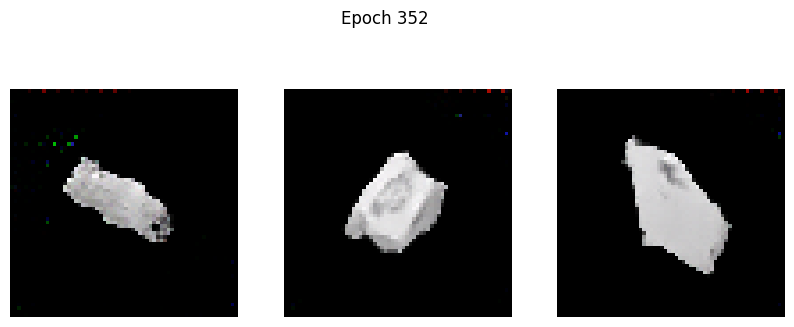

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0601 - g_loss: 4.7486
Epoch 353/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0118 - g_loss: 4.7991

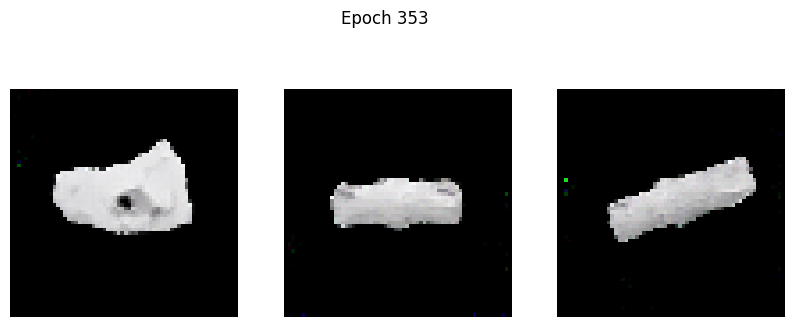

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0119 - g_loss: 4.7989
Epoch 354/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0339 - g_loss: 4.7445

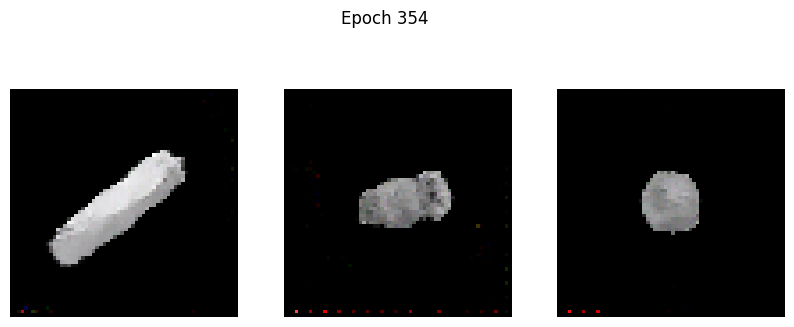

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0338 - g_loss: 4.7448
Epoch 355/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0383 - g_loss: 4.8905

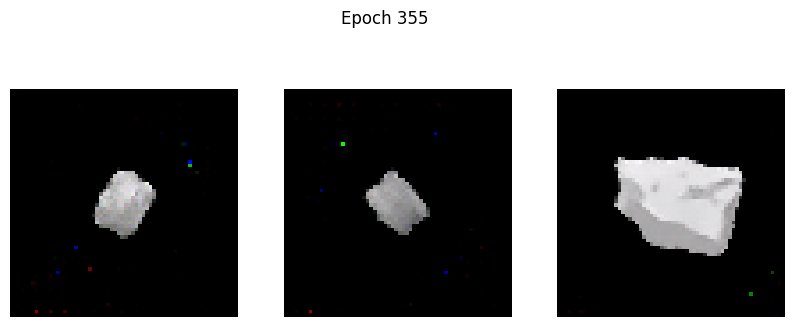

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0383 - g_loss: 4.8911
Epoch 356/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0924 - g_loss: 5.2077

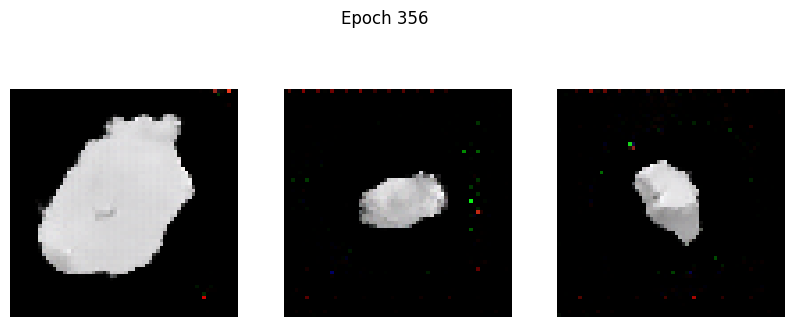

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - d_loss: 0.0925 - g_loss: 5.2065
Epoch 357/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0176 - g_loss: 4.9390

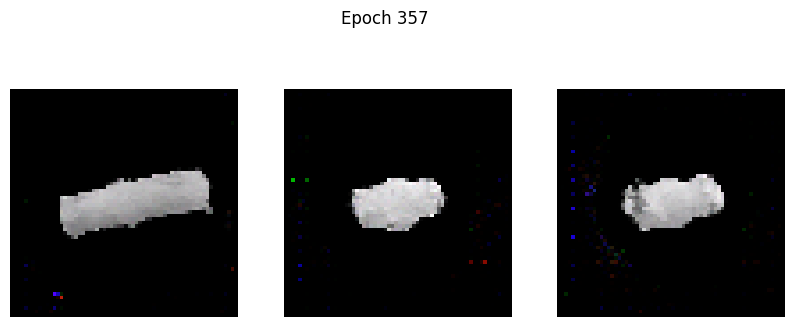

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0179 - g_loss: 4.9395
Epoch 358/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0158 - g_loss: 4.7231

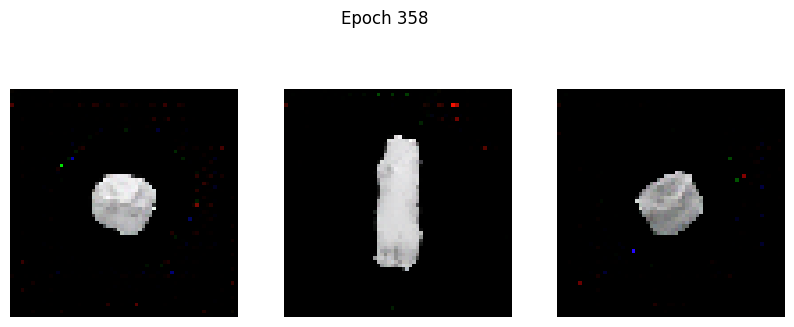

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0158 - g_loss: 4.7235
Epoch 359/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0199 - g_loss: 4.8246

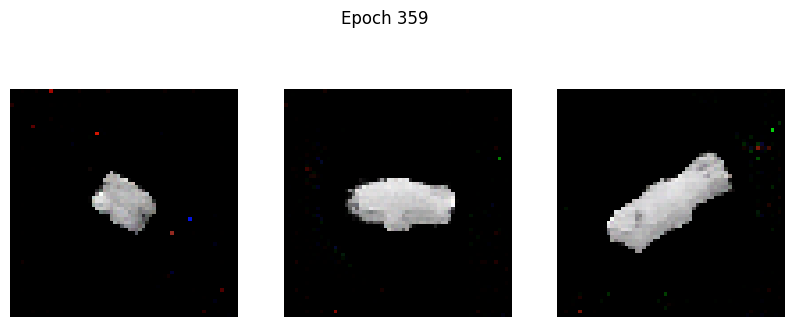

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0198 - g_loss: 4.8237
Epoch 360/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0548 - g_loss: 5.1088

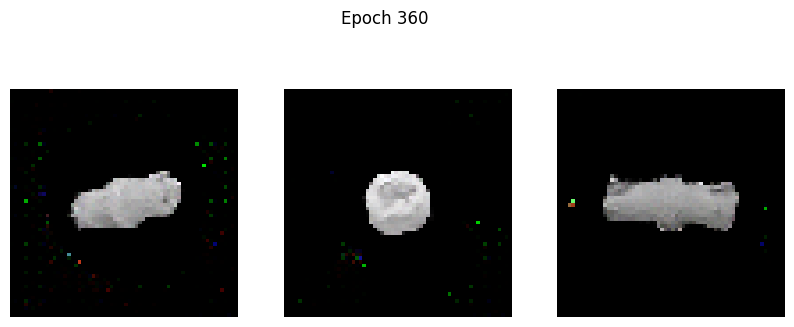

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0551 - g_loss: 5.1084
Epoch 361/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0153 - g_loss: 4.7163

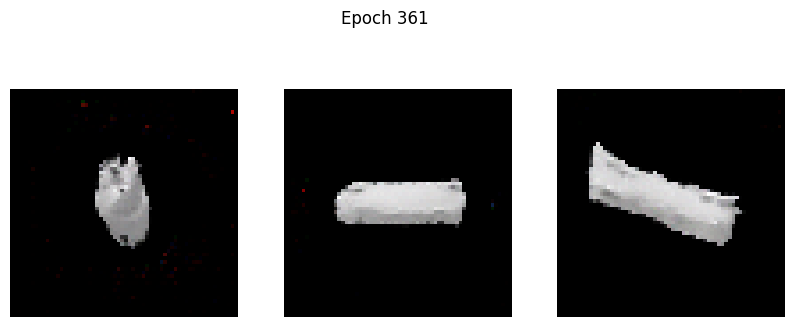

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0152 - g_loss: 4.7170
Epoch 362/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0290 - g_loss: 4.8962

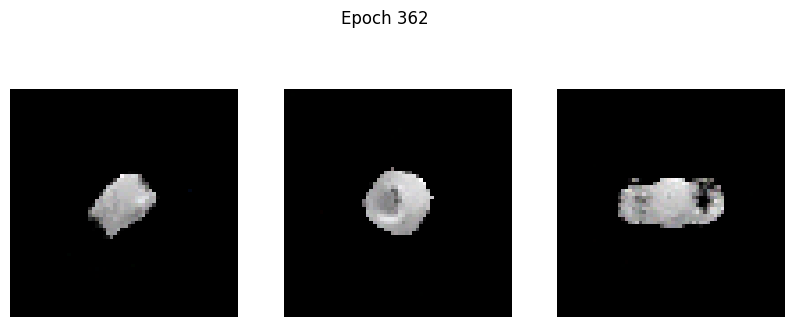

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0290 - g_loss: 4.8955
Epoch 363/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1187 - g_loss: 5.0513

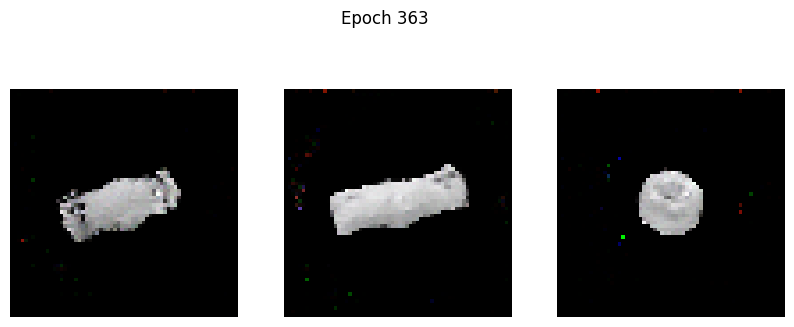

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1186 - g_loss: 5.0516
Epoch 364/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0349 - g_loss: 4.9376

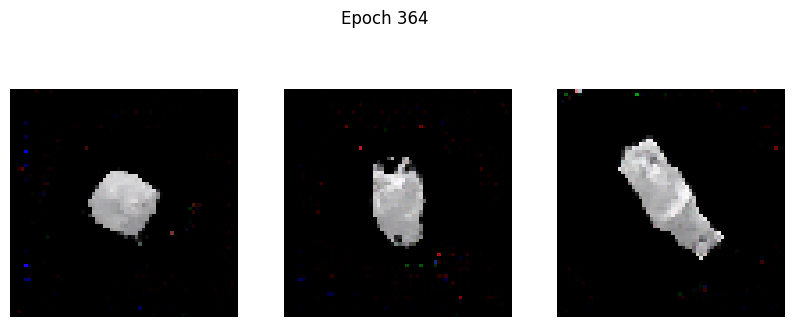

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0350 - g_loss: 4.9379
Epoch 365/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0056 - g_loss: 4.9226

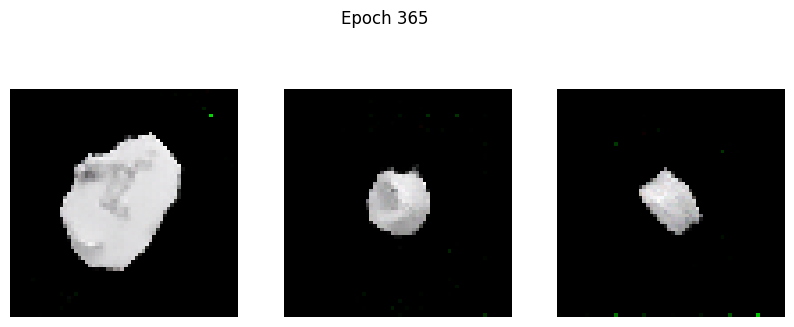

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0057 - g_loss: 4.9223
Epoch 366/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0213 - g_loss: 4.9929

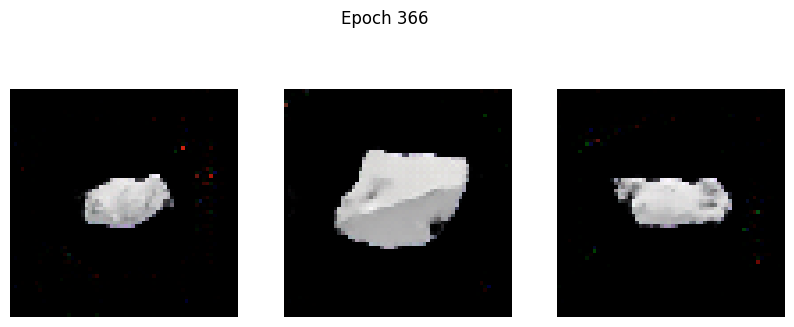

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0216 - g_loss: 4.9936
Epoch 367/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1465 - g_loss: 5.0273

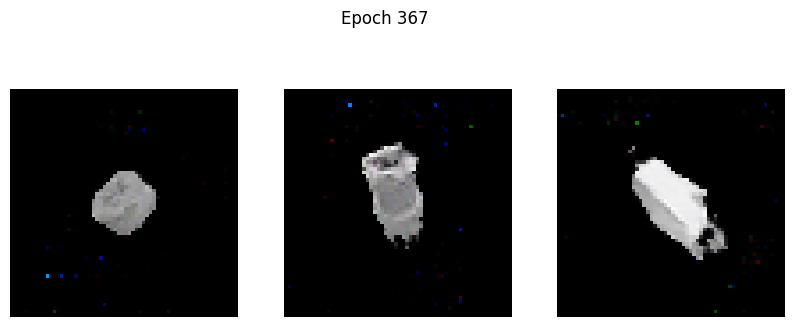

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1459 - g_loss: 5.0273
Epoch 368/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0288 - g_loss: 4.8437

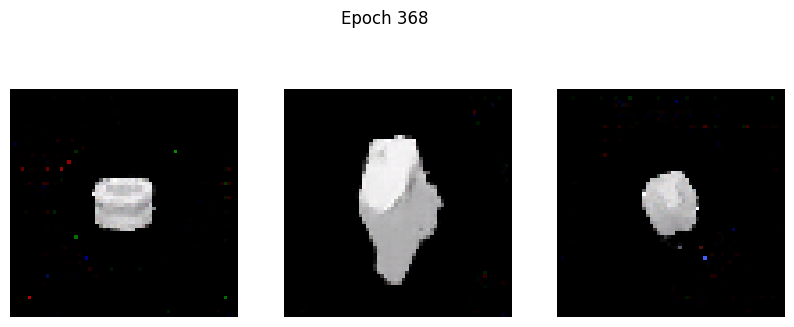

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0287 - g_loss: 4.8433
Epoch 369/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0122 - g_loss: 4.9745

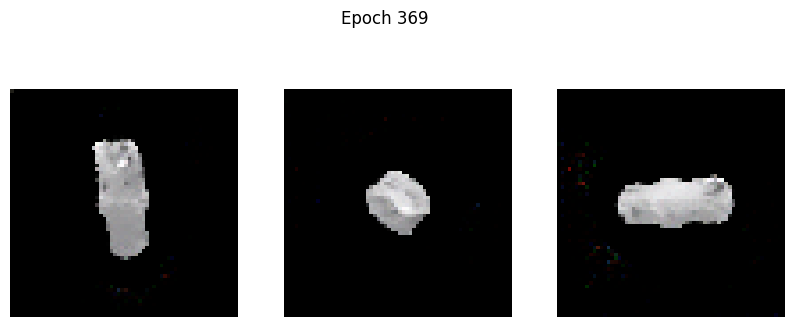

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0123 - g_loss: 4.9748
Epoch 370/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0359 - g_loss: 4.8972

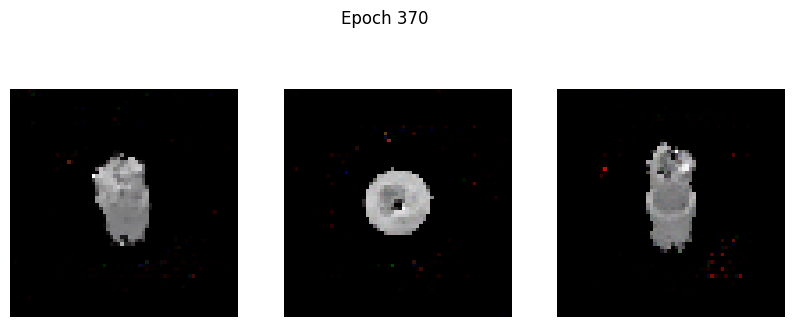

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0357 - g_loss: 4.8962
Epoch 371/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0354 - g_loss: 5.1975

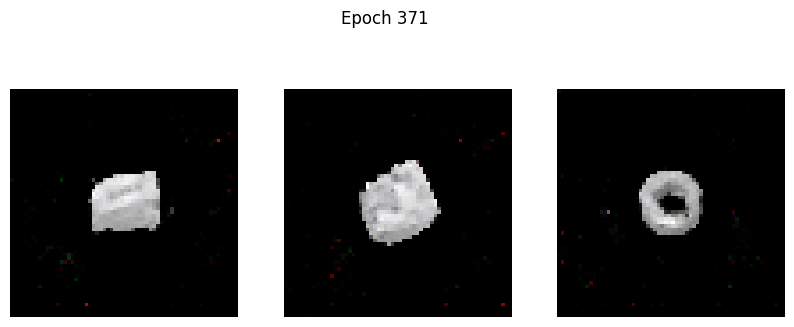

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0358 - g_loss: 5.1981
Epoch 372/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1977 - g_loss: 5.4588

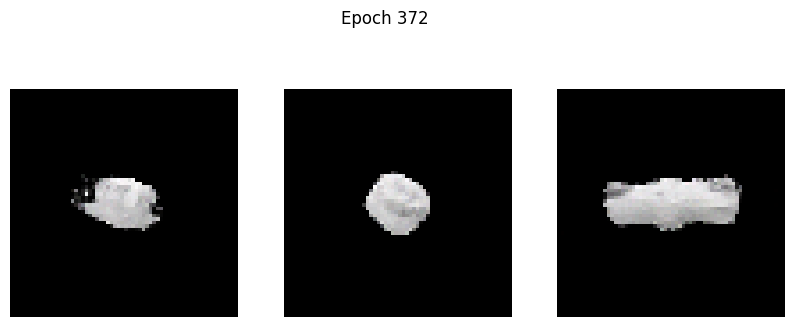

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.1970 - g_loss: 5.4564
Epoch 373/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0079 - g_loss: 4.7129

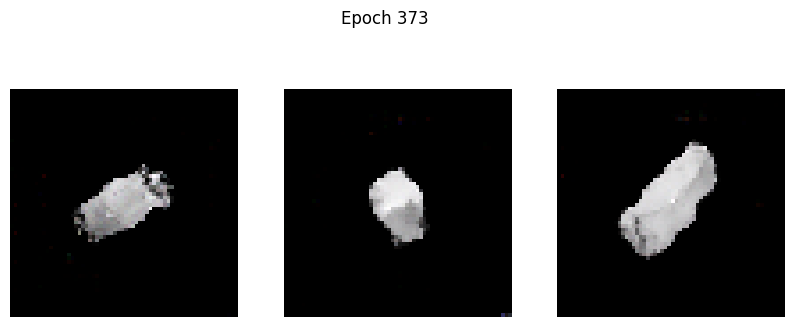

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0078 - g_loss: 4.7146
Epoch 374/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0121 - g_loss: 4.7902

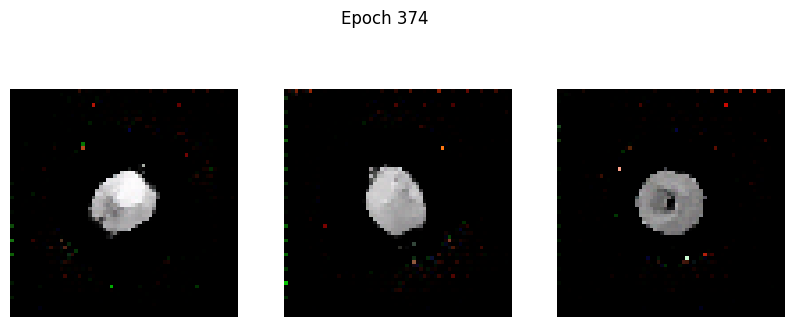

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0122 - g_loss: 4.7923
Epoch 375/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0069 - g_loss: 5.2043

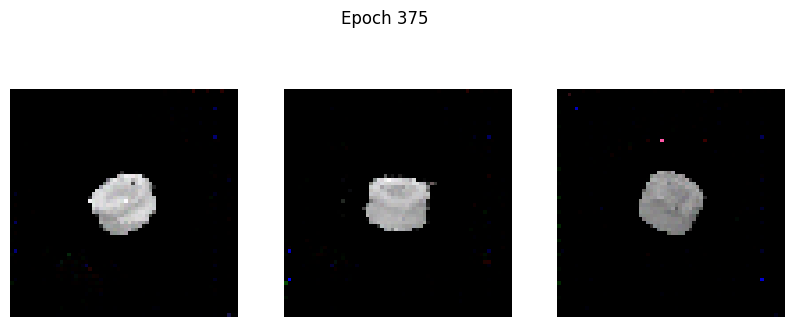

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0068 - g_loss: 5.2023
Epoch 376/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0213 - g_loss: 5.4421

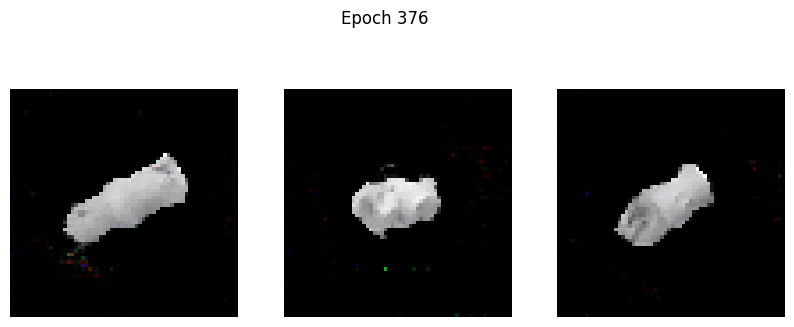

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0211 - g_loss: 5.4394
Epoch 377/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0361 - g_loss: 5.2665

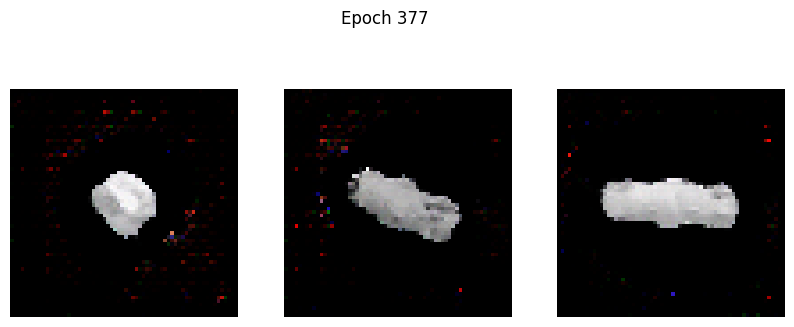

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0365 - g_loss: 5.2683
Epoch 378/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0276 - g_loss: 5.0772

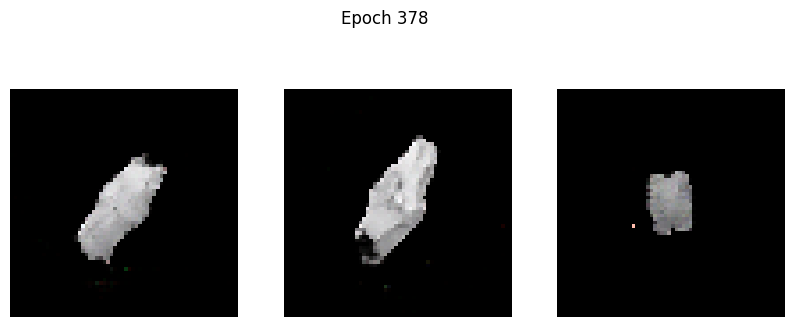

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0275 - g_loss: 5.0779
Epoch 379/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1533 - g_loss: 5.7725

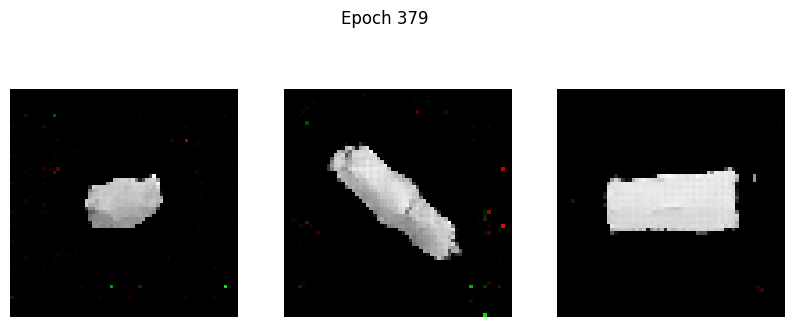

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1525 - g_loss: 5.7684
Epoch 380/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0272 - g_loss: 5.2479

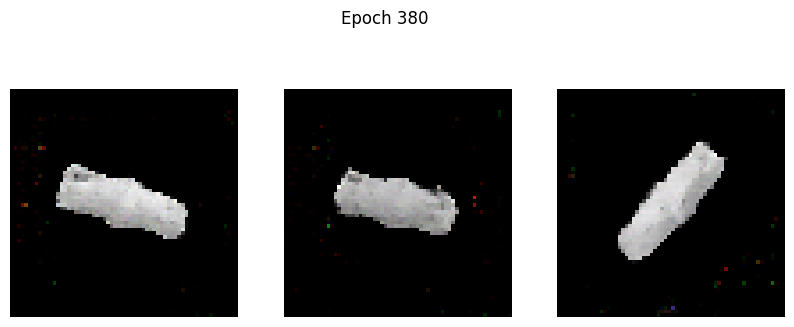

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0272 - g_loss: 5.2466
Epoch 381/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0198 - g_loss: 5.0693

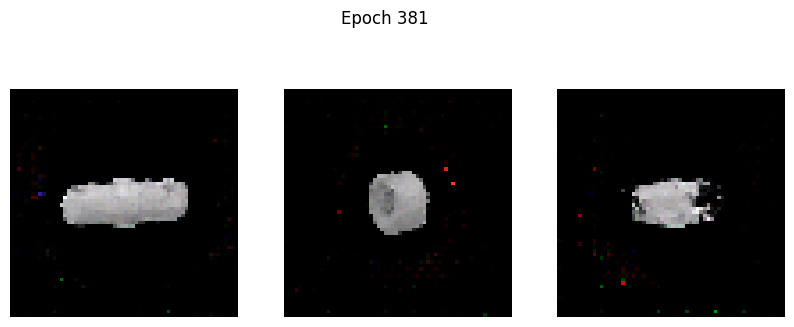

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0197 - g_loss: 5.0698
Epoch 382/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0616 - g_loss: 5.2980

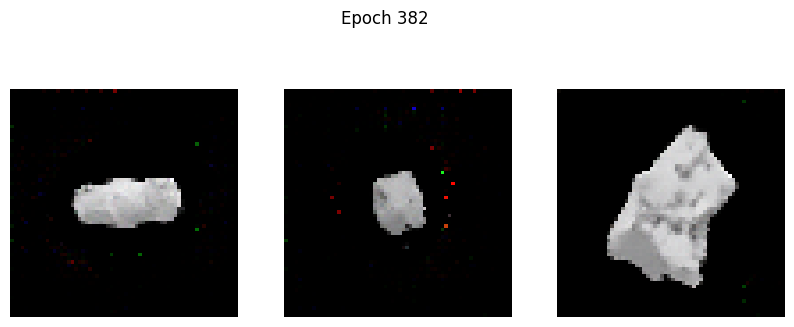

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0615 - g_loss: 5.2980
Epoch 383/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0786 - g_loss: 5.7917

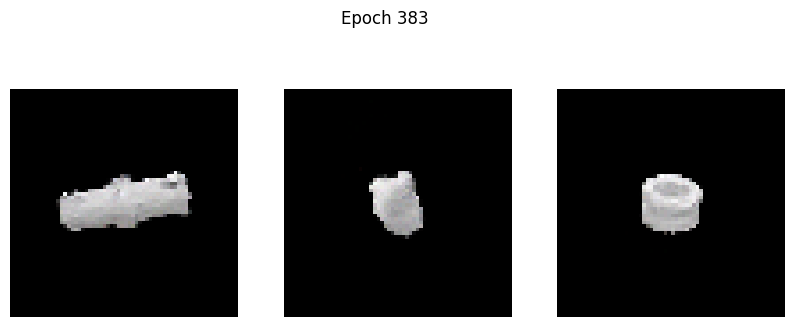

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0783 - g_loss: 5.7886
Epoch 384/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0146 - g_loss: 5.2842

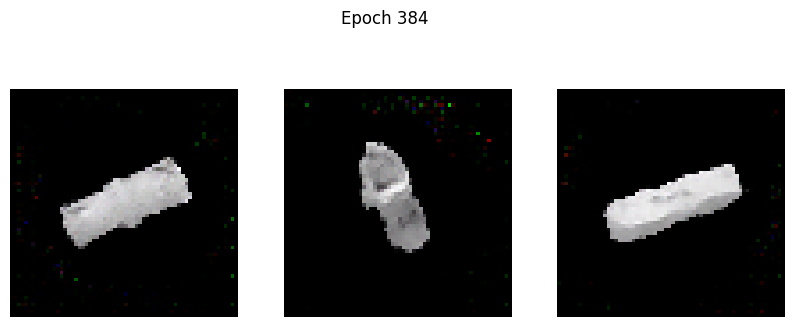

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0144 - g_loss: 5.2830
Epoch 385/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -5.6238e-04 - g_loss: 5.2937

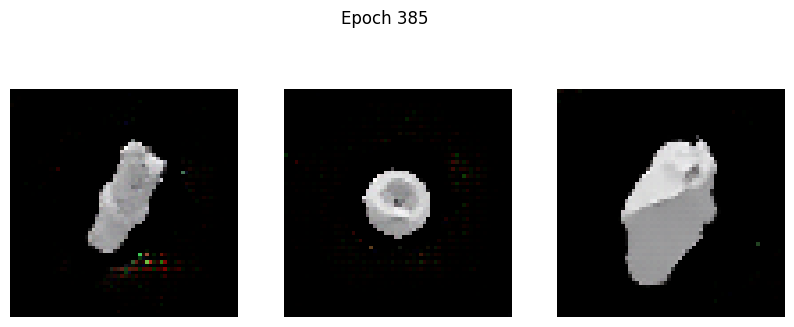

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -4.9212e-04 - g_loss: 5.2926
Epoch 386/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0687 - g_loss: 5.5601

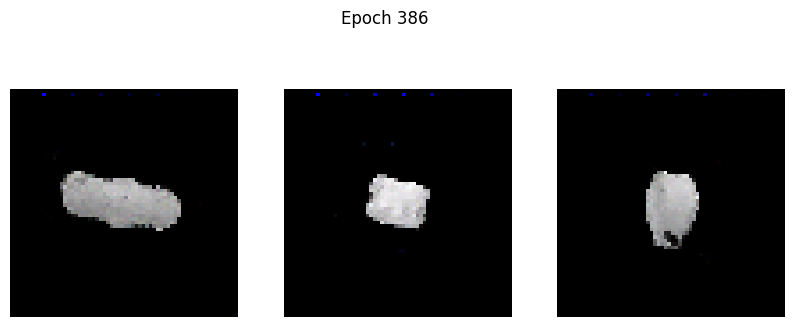

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0686 - g_loss: 5.5597
Epoch 387/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0073 - g_loss: 5.0366

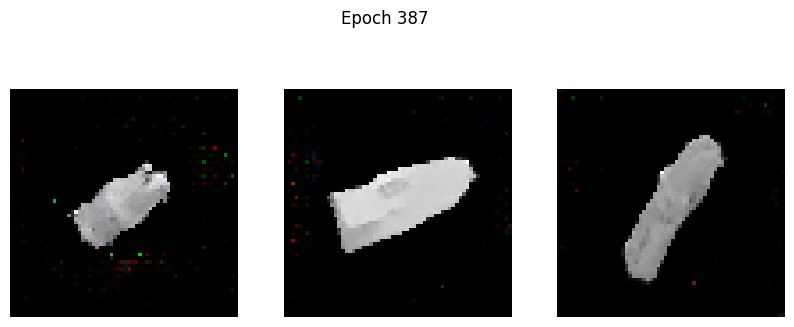

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0069 - g_loss: 5.0383
Epoch 388/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0329 - g_loss: 5.1170

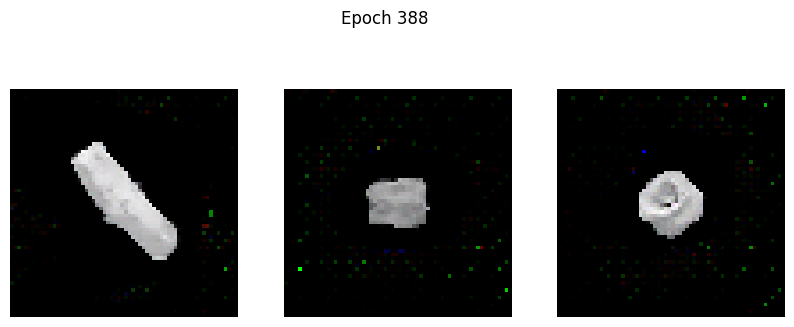

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0327 - g_loss: 5.1174
Epoch 389/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0019 - g_loss: 5.3953

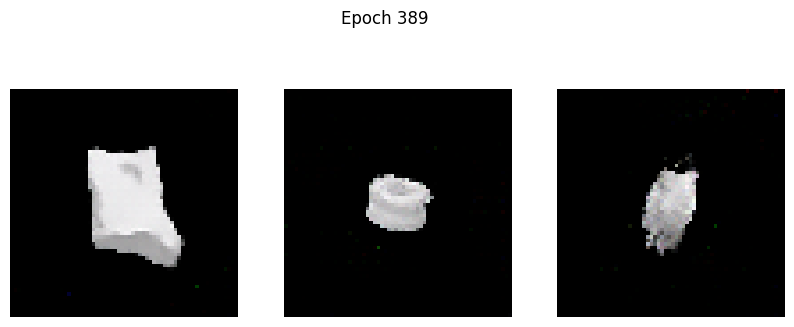

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0020 - g_loss: 5.3946
Epoch 390/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0285 - g_loss: 5.5196

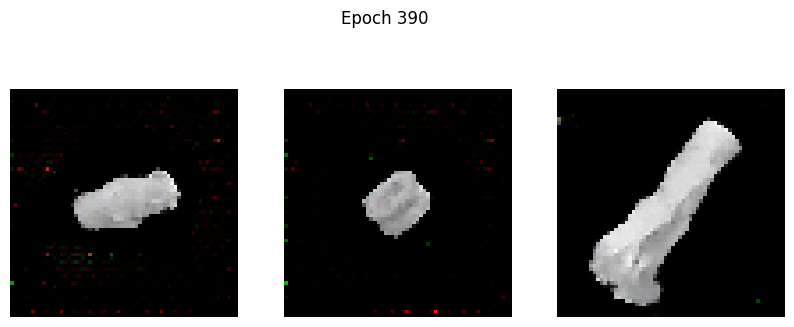

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0286 - g_loss: 5.5197
Epoch 391/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0224 - g_loss: 4.9988

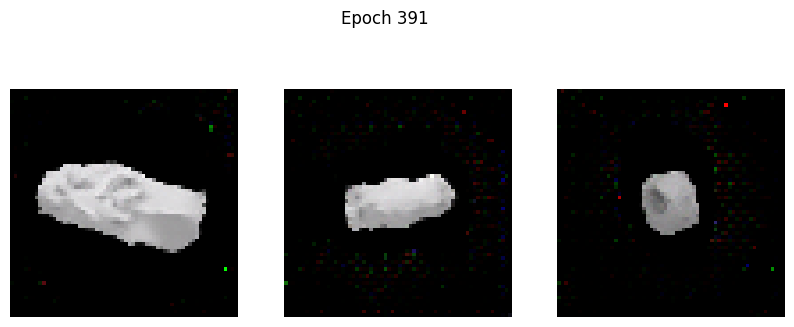

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0221 - g_loss: 5.0017
Epoch 392/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0016 - g_loss: 5.2851

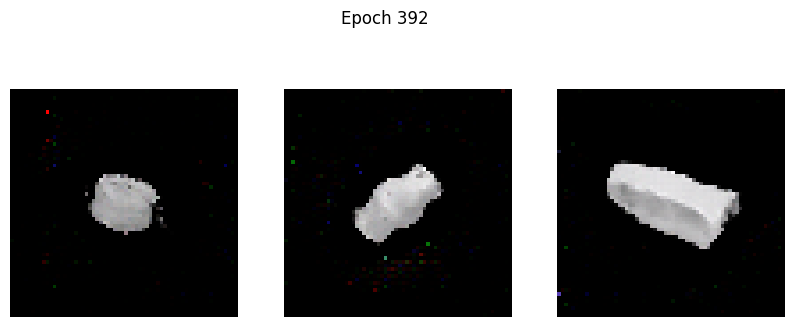

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0014 - g_loss: 5.2863
Epoch 393/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0043 - g_loss: 5.3915

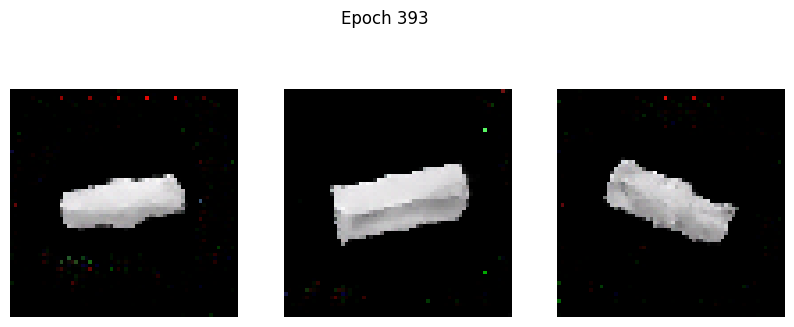

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0046 - g_loss: 5.3925
Epoch 394/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0238 - g_loss: 5.4143

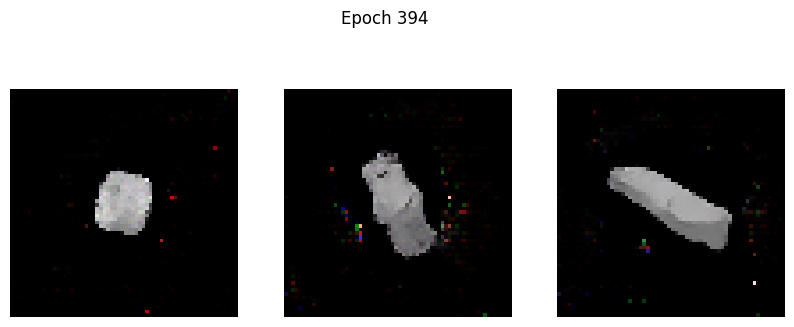

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0237 - g_loss: 5.4147
Epoch 395/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0085 - g_loss: 5.3116

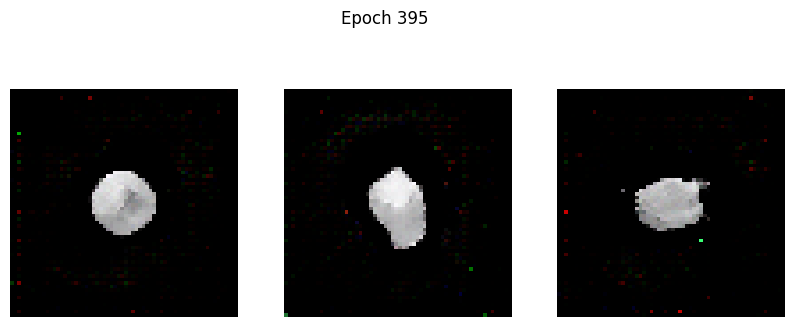

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0085 - g_loss: 5.3131
Epoch 396/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0216 - g_loss: 5.4326

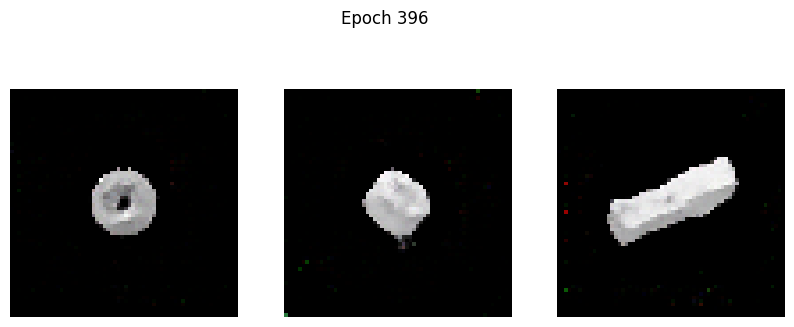

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0215 - g_loss: 5.4335
Epoch 397/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0470 - g_loss: 6.1651

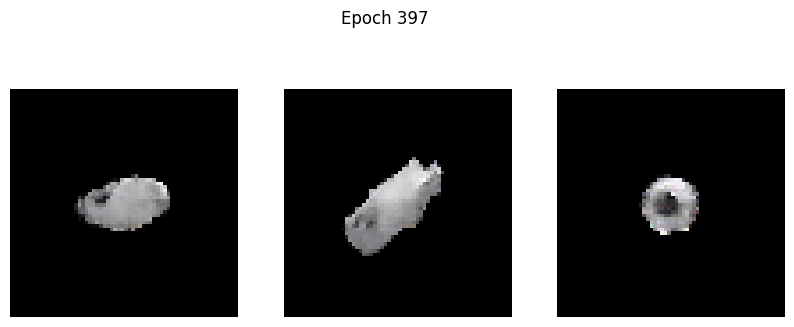

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0470 - g_loss: 6.1727
Epoch 398/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1255 - g_loss: 6.0994

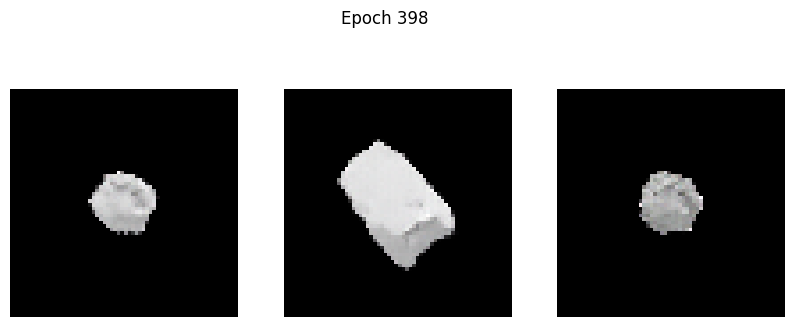

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1254 - g_loss: 6.0971
Epoch 399/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1163 - g_loss: 5.5031

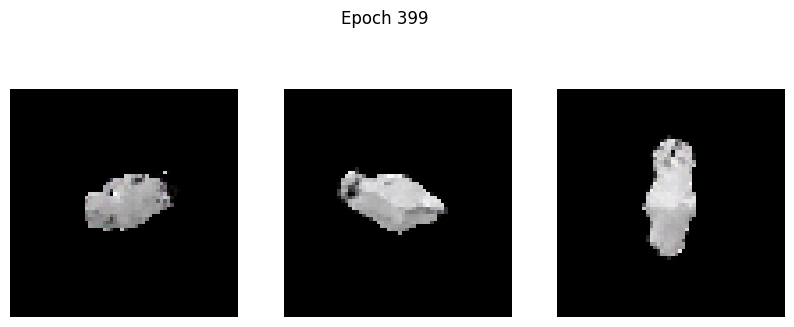

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1162 - g_loss: 5.5025
Epoch 400/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0857 - g_loss: 5.7098

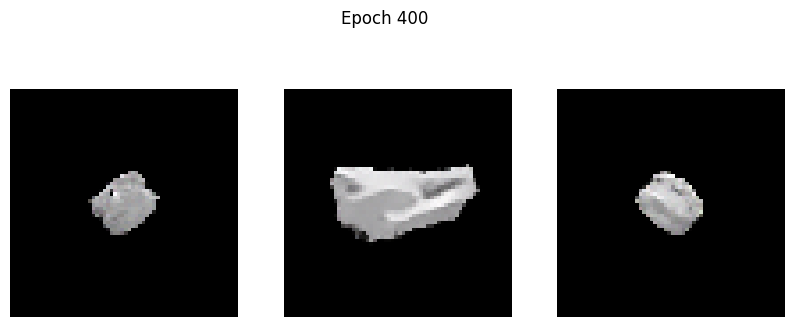

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0855 - g_loss: 5.7104
Epoch 401/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0591 - g_loss: 5.6999

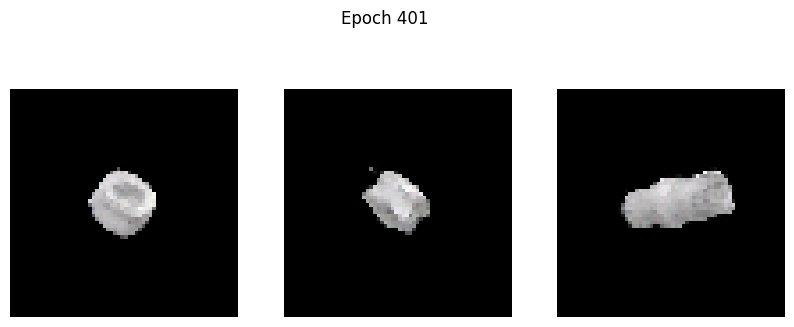

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0588 - g_loss: 5.7014
Epoch 402/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0444 - g_loss: 5.8307

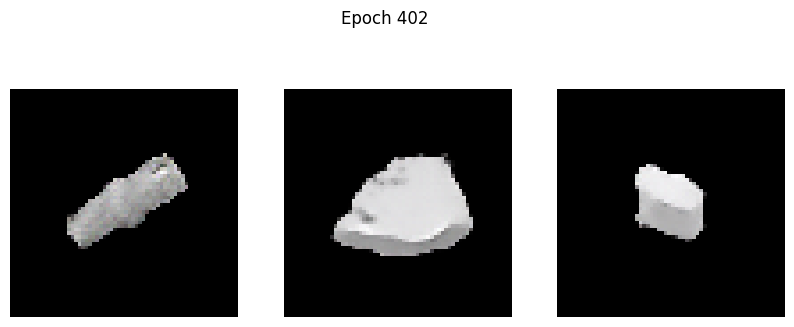

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0443 - g_loss: 5.8294
Epoch 403/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0347 - g_loss: 5.8182

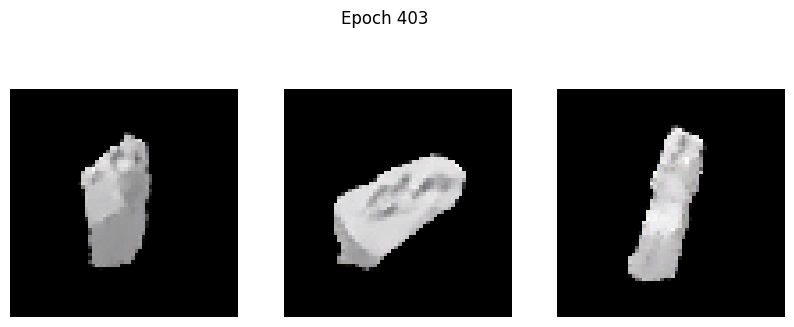

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0347 - g_loss: 5.8172
Epoch 404/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0693 - g_loss: 5.5836

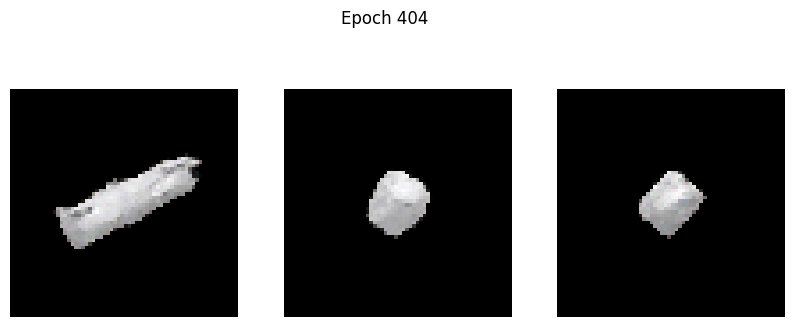

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0691 - g_loss: 5.5846
Epoch 405/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0645 - g_loss: 5.9829

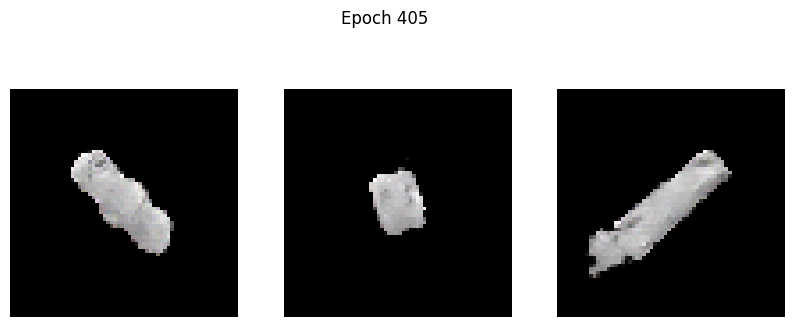

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0643 - g_loss: 5.9827
Epoch 406/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0263 - g_loss: 5.9787

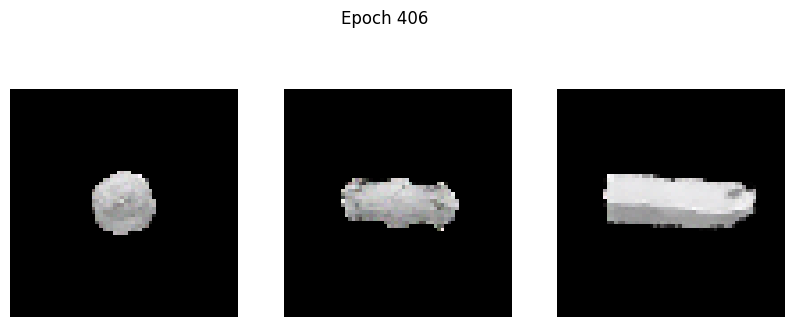

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0260 - g_loss: 5.9776
Epoch 407/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0841 - g_loss: 6.0120

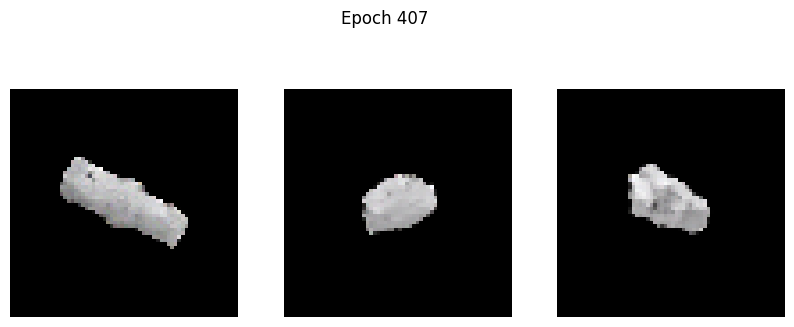

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0839 - g_loss: 6.0118
Epoch 408/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0797 - g_loss: 5.2003

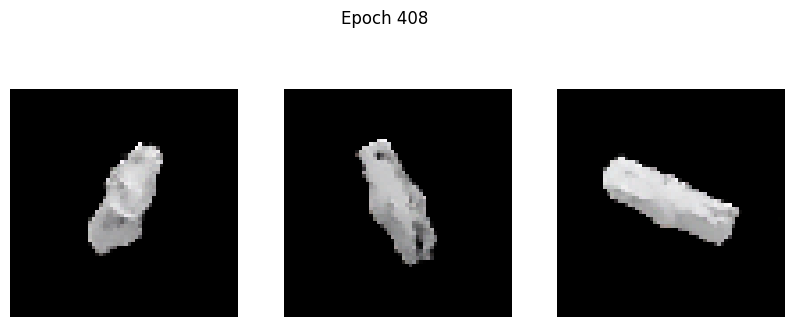

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0795 - g_loss: 5.2019
Epoch 409/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -7.8703e-04 - g_loss: 5.7943

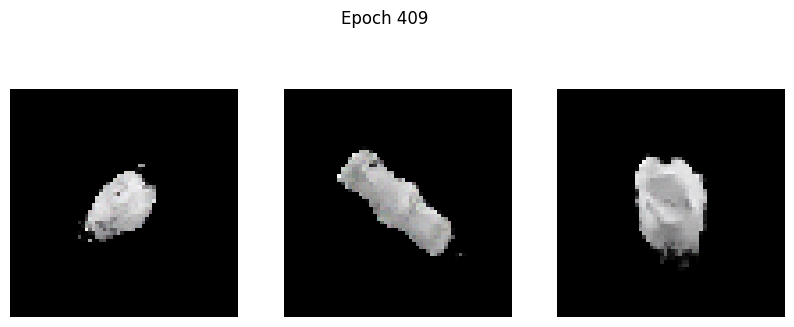

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0010 - g_loss: 5.7929   
Epoch 410/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0466 - g_loss: 5.6482

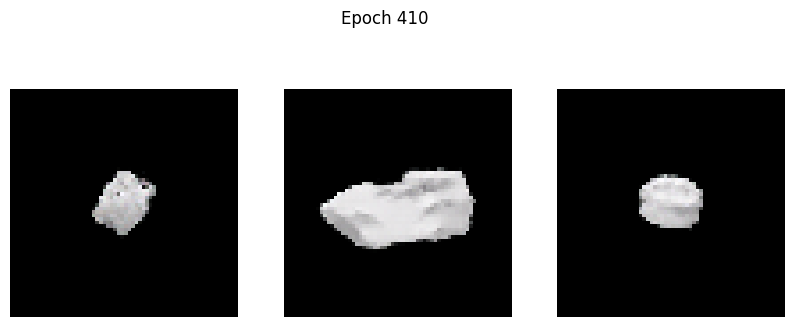

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0465 - g_loss: 5.6482
Epoch 411/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0382 - g_loss: 5.5963

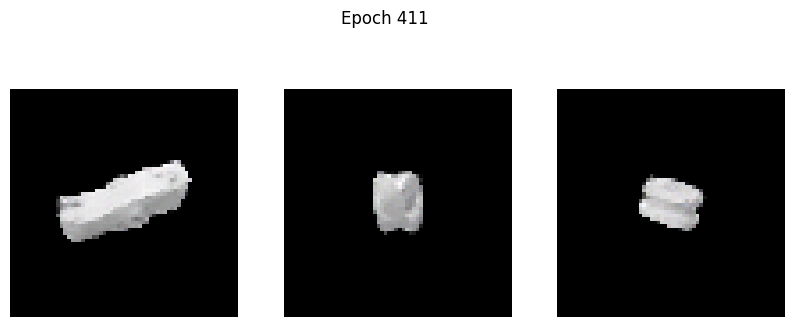

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0383 - g_loss: 5.5951
Epoch 412/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0332 - g_loss: 5.7203

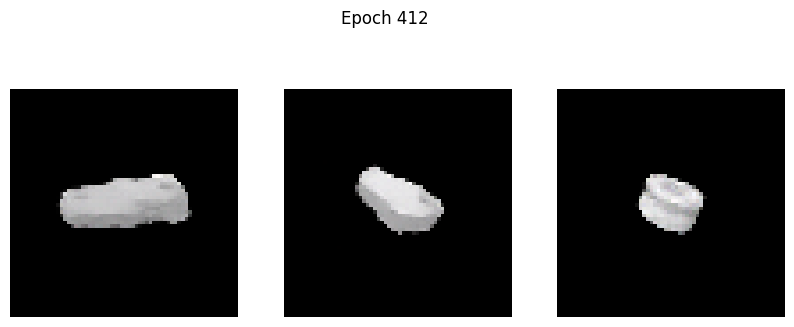

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0330 - g_loss: 5.7193
Epoch 413/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0273 - g_loss: 6.2518

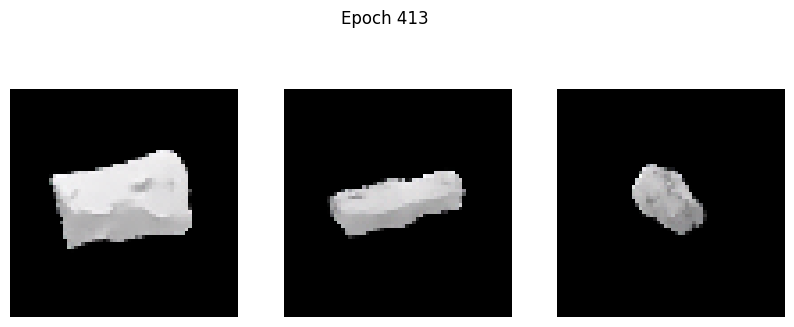

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0269 - g_loss: 6.2474
Epoch 414/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0344 - g_loss: 6.0064

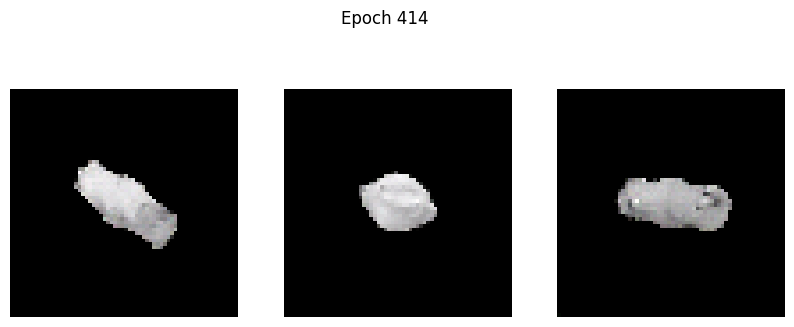

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0344 - g_loss: 6.0058
Epoch 415/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0063 - g_loss: 6.0775

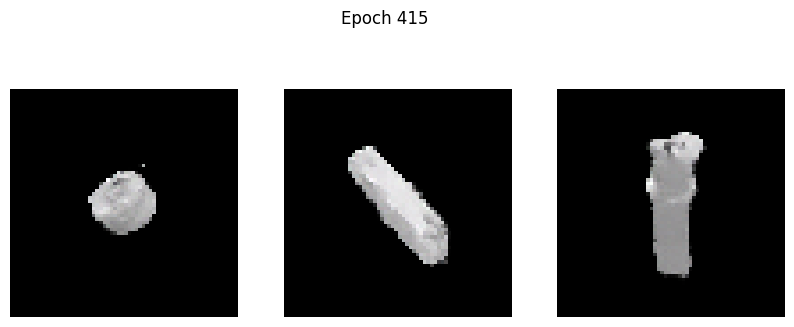

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0067 - g_loss: 6.0791
Epoch 416/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0657 - g_loss: 5.4411

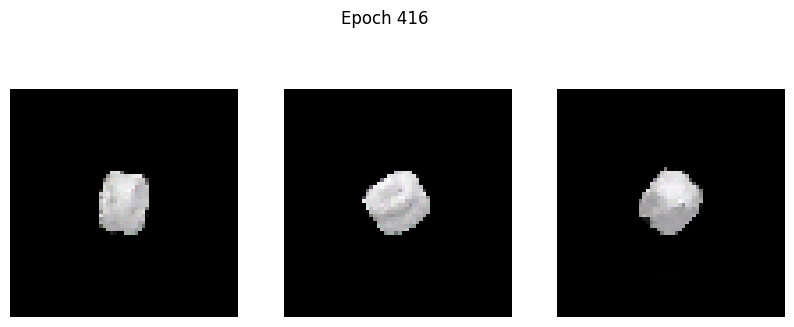

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0658 - g_loss: 5.4411
Epoch 417/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0559 - g_loss: 5.4650

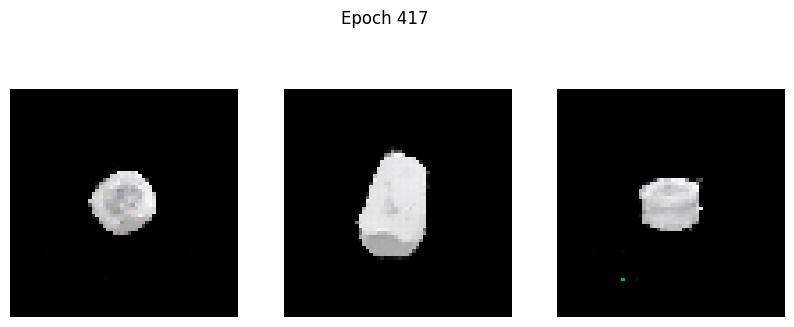

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0559 - g_loss: 5.4667
Epoch 418/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0361 - g_loss: 5.9222

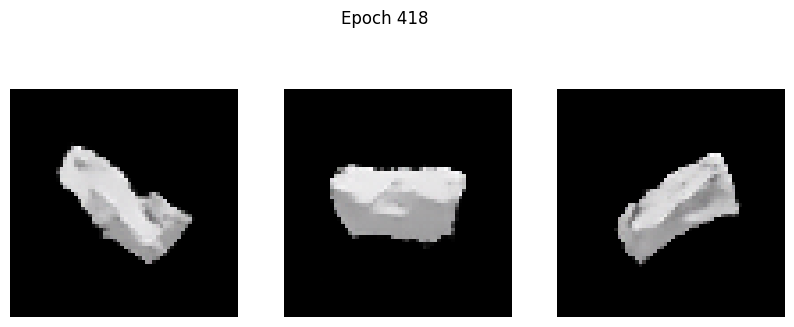

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0363 - g_loss: 5.9214
Epoch 419/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0680 - g_loss: 5.8222

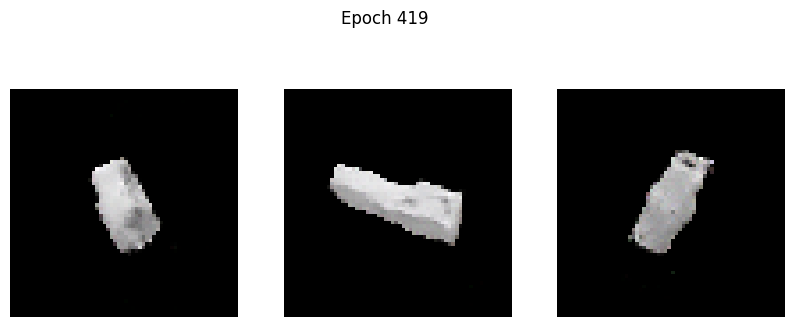

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0674 - g_loss: 5.8246
Epoch 420/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1693 - g_loss: 6.6968

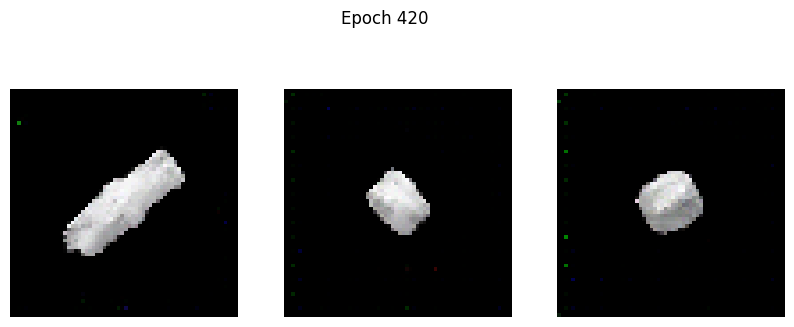

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1681 - g_loss: 6.6912
Epoch 421/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0545 - g_loss: 5.5409

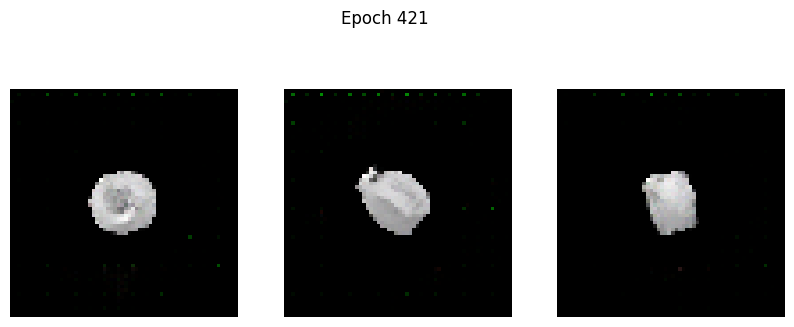

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0545 - g_loss: 5.5416
Epoch 422/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0167 - g_loss: 5.9667

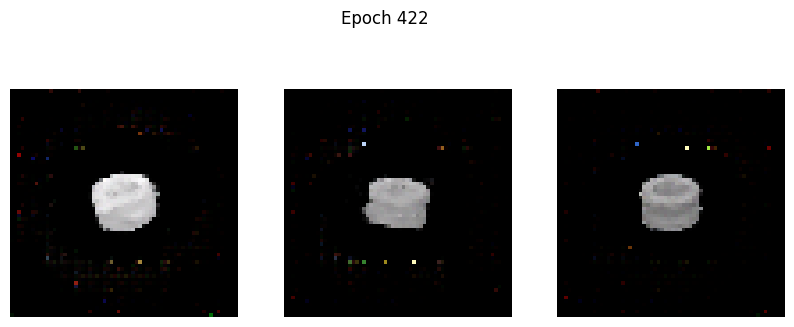

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0169 - g_loss: 5.9654
Epoch 423/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0014 - g_loss: 6.2096

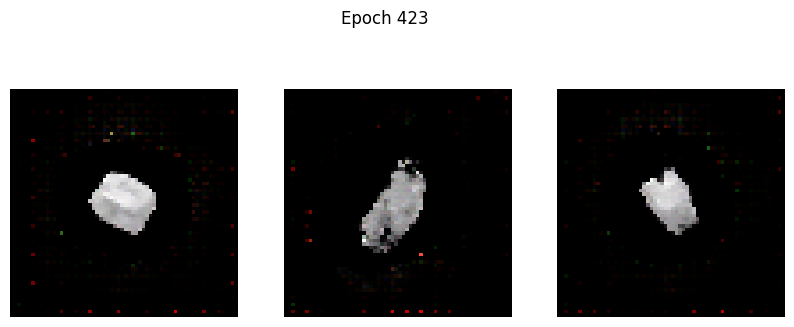

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0017 - g_loss: 6.2108
Epoch 424/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2376 - g_loss: 7.0328

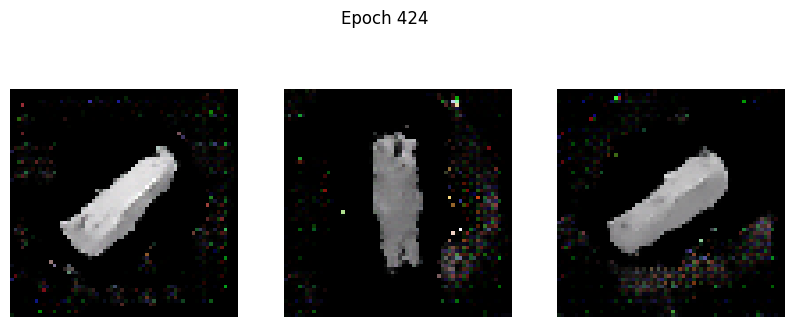

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2380 - g_loss: 7.0326
Epoch 425/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0632 - g_loss: 7.8520

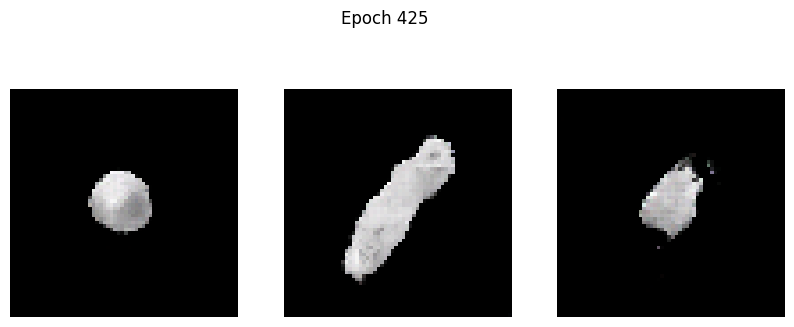

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0622 - g_loss: 7.8401
Epoch 426/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1081 - g_loss: 5.7817

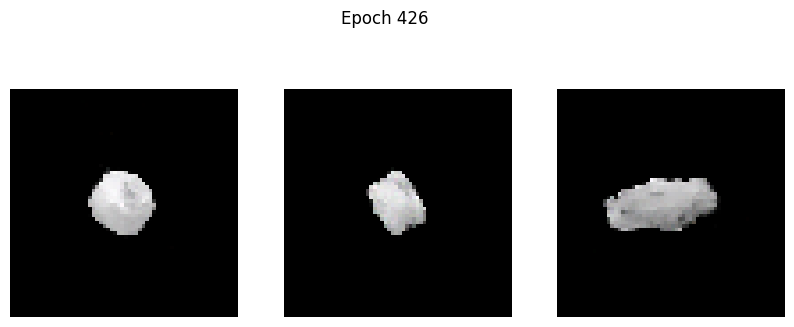

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1080 - g_loss: 5.7821
Epoch 427/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1048 - g_loss: 5.8161

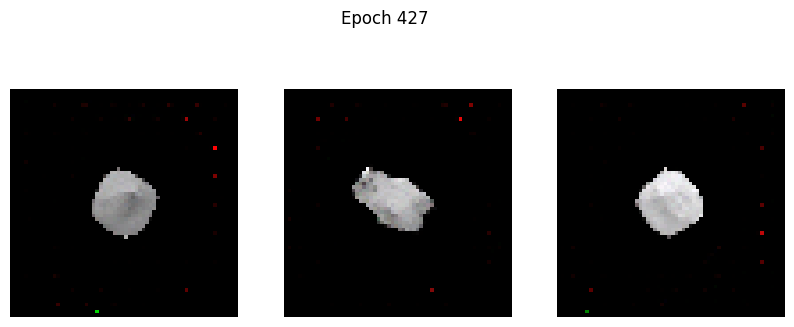

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1045 - g_loss: 5.8168
Epoch 428/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0884 - g_loss: 5.7285

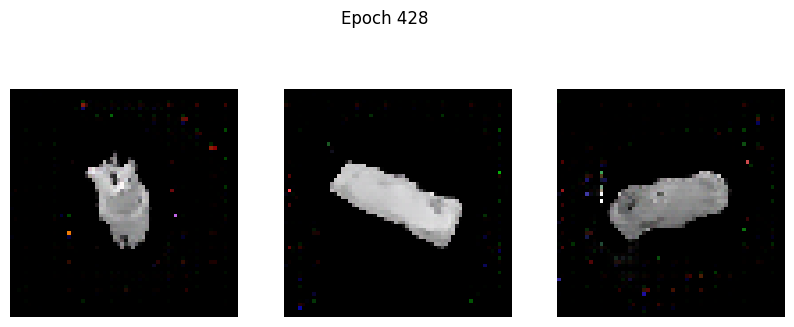

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0886 - g_loss: 5.7276
Epoch 429/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0195 - g_loss: 6.4223

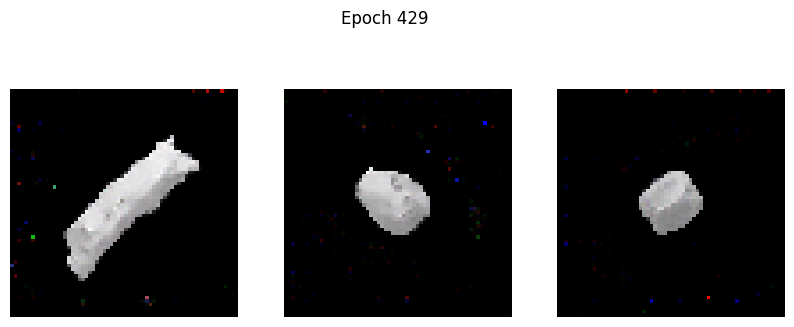

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0199 - g_loss: 6.4201
Epoch 430/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0612 - g_loss: 6.3944

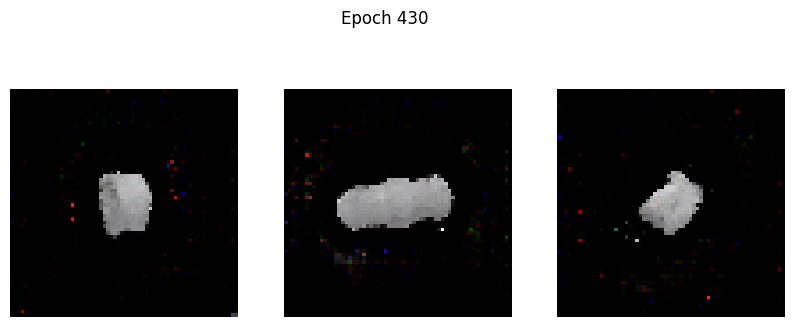

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0609 - g_loss: 6.3948
Epoch 431/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0496 - g_loss: 6.1514

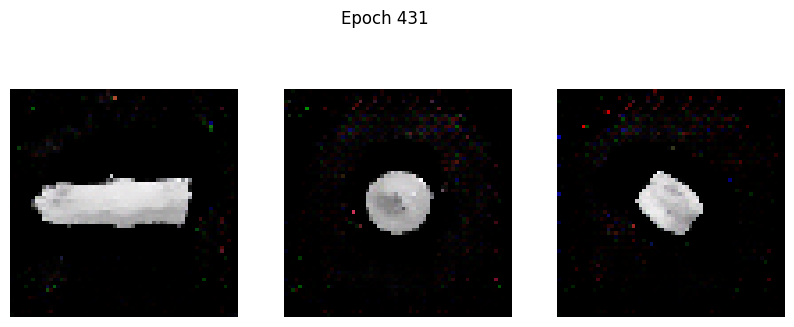

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0493 - g_loss: 6.1540
Epoch 432/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0300 - g_loss: 5.9124

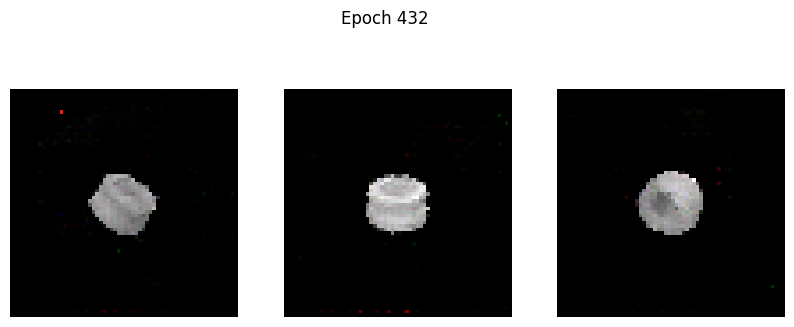

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0302 - g_loss: 5.9133
Epoch 433/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0471 - g_loss: 6.4920

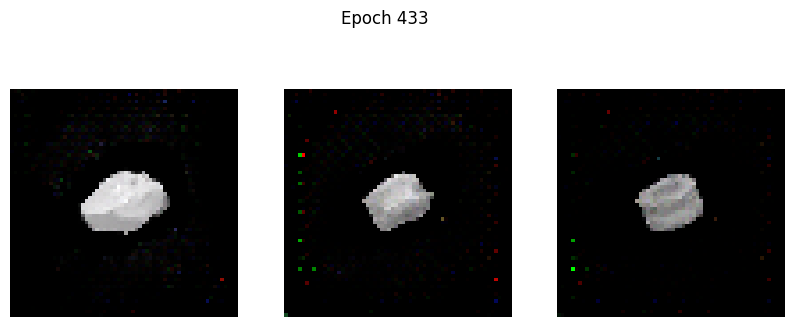

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0466 - g_loss: 6.4901
Epoch 434/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0592 - g_loss: 6.8225

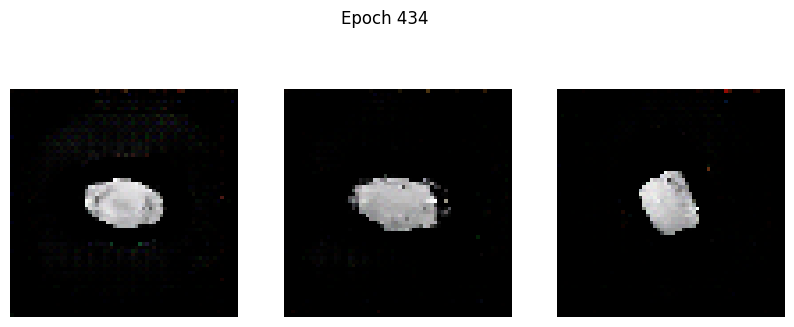

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0587 - g_loss: 6.8197
Epoch 435/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0456 - g_loss: 6.3567

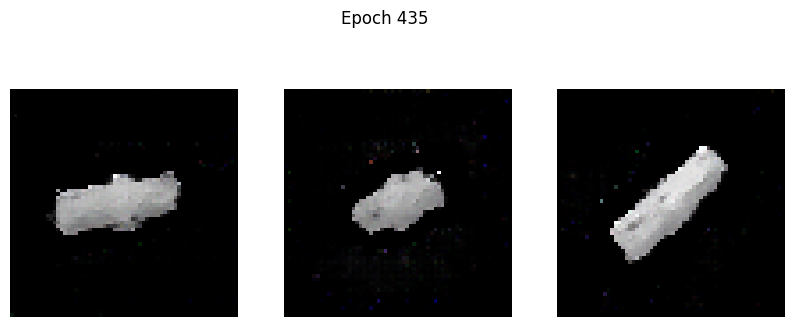

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0456 - g_loss: 6.3559
Epoch 436/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0923 - g_loss: 5.9932

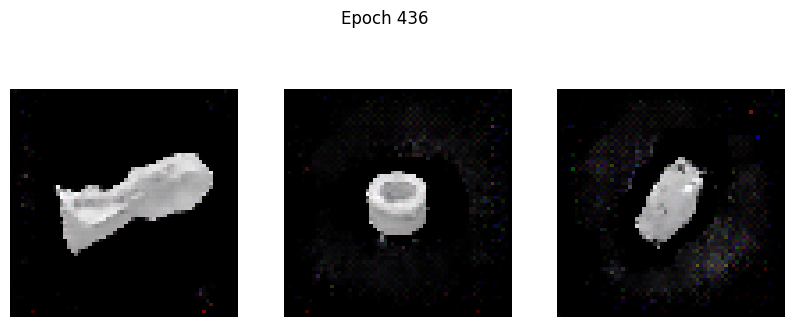

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0916 - g_loss: 5.9960
Epoch 437/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0679 - g_loss: 6.2557

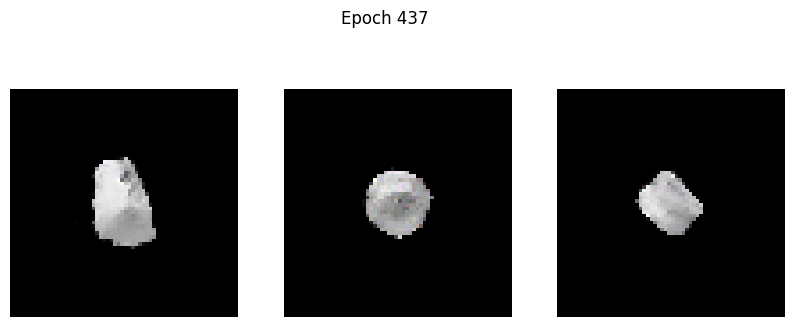

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0680 - g_loss: 6.2548
Epoch 438/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0473 - g_loss: 6.2223

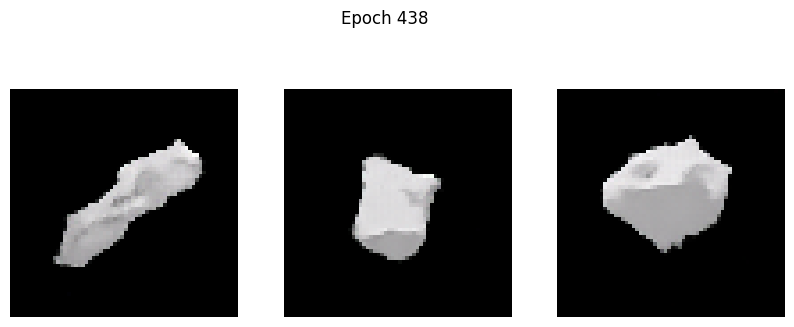

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0475 - g_loss: 6.2226
Epoch 439/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0946 - g_loss: 6.1068

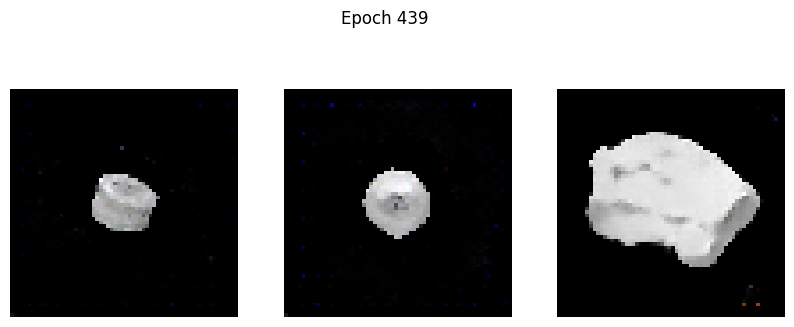

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0947 - g_loss: 6.1052
Epoch 440/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0339 - g_loss: 7.6024

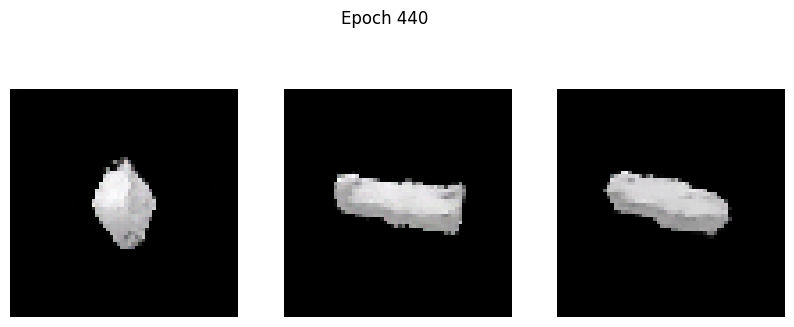

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0335 - g_loss: 7.5953
Epoch 441/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0854 - g_loss: 6.0330

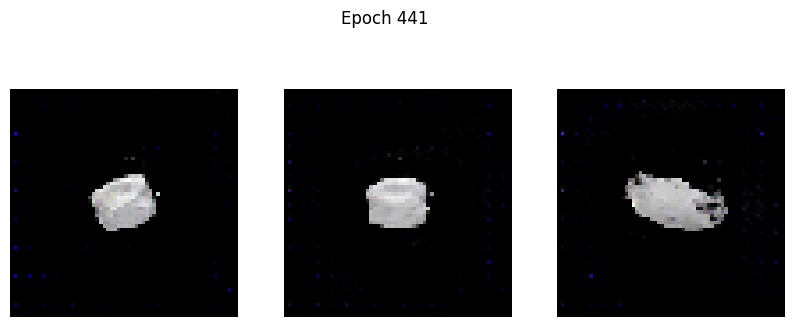

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0851 - g_loss: 6.0346
Epoch 442/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0633 - g_loss: 6.2400

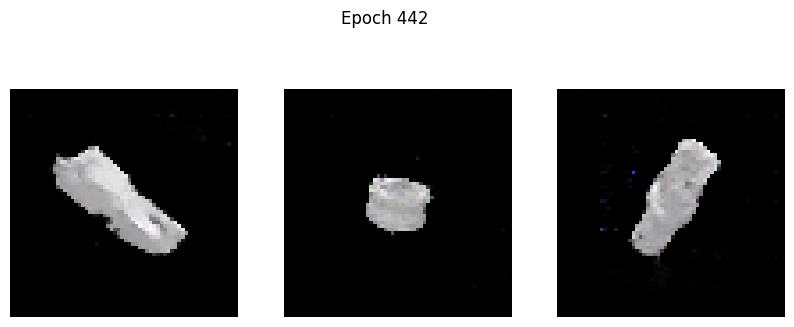

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0632 - g_loss: 6.2410
Epoch 443/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0819 - g_loss: 6.4386

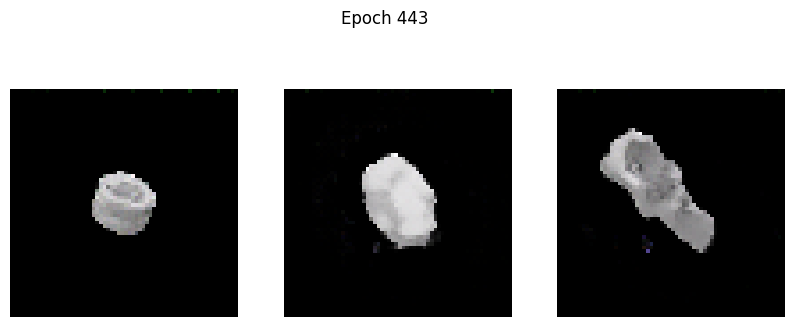

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0820 - g_loss: 6.4366
Epoch 444/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0272 - g_loss: 6.7884

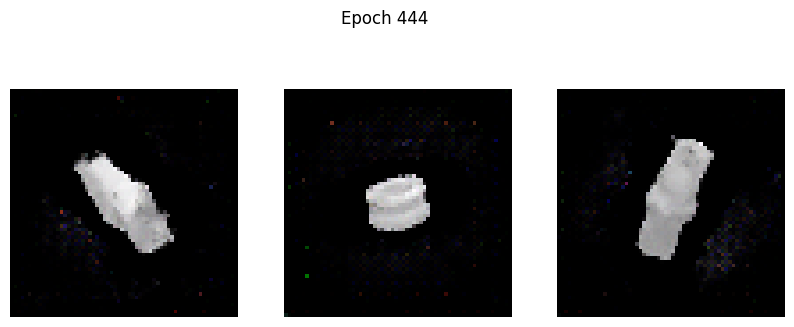

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0263 - g_loss: 6.7848
Epoch 445/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0552 - g_loss: 7.1725

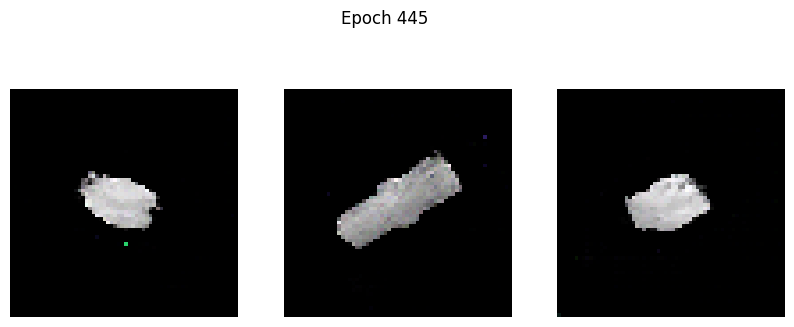

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0551 - g_loss: 7.1703
Epoch 446/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1316 - g_loss: 5.8022

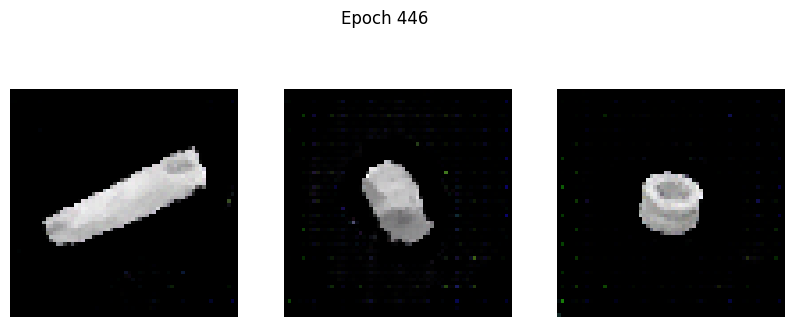

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1313 - g_loss: 5.8070
Epoch 447/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0965 - g_loss: 6.1588

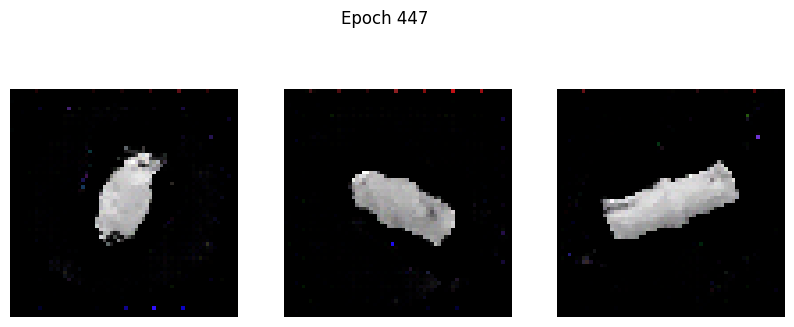

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0964 - g_loss: 6.1602
Epoch 448/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0966 - g_loss: 6.1989

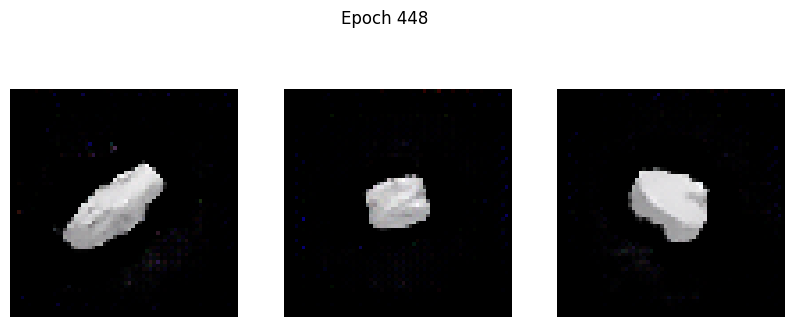

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: -0.0965 - g_loss: 6.1997
Epoch 449/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1037 - g_loss: 6.3044

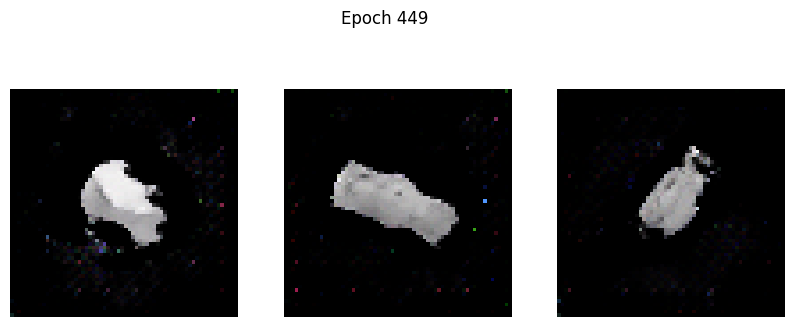

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1033 - g_loss: 6.3063
Epoch 450/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0051 - g_loss: 6.9325

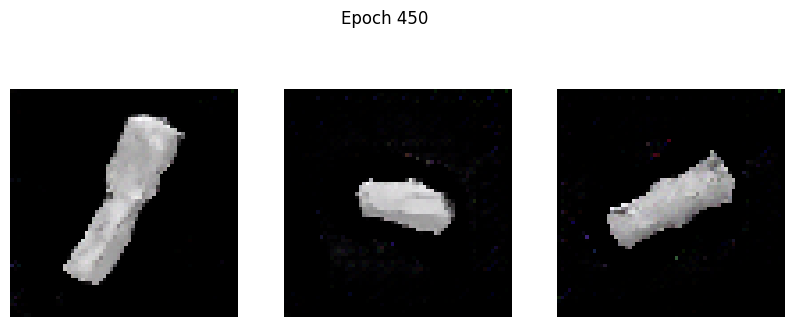

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0051 - g_loss: 6.9315
Epoch 451/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0170 - g_loss: 6.8635

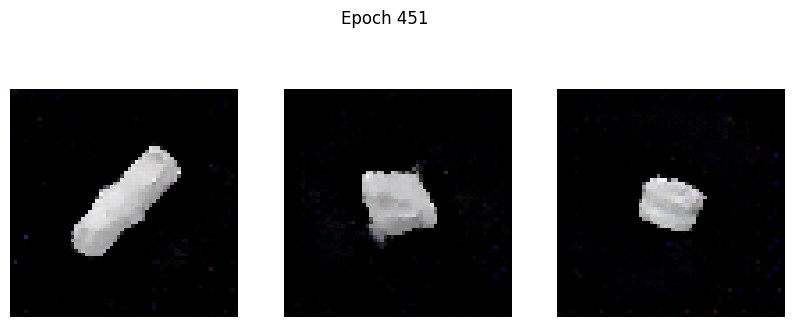

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0173 - g_loss: 6.8616
Epoch 452/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1179 - g_loss: 6.3853

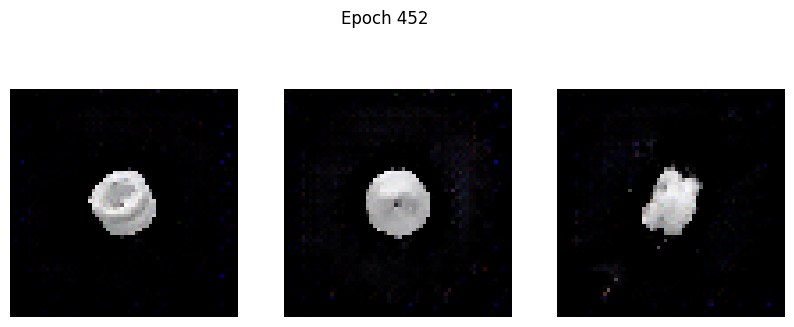

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1179 - g_loss: 6.3842
Epoch 453/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1346 - g_loss: 6.3943

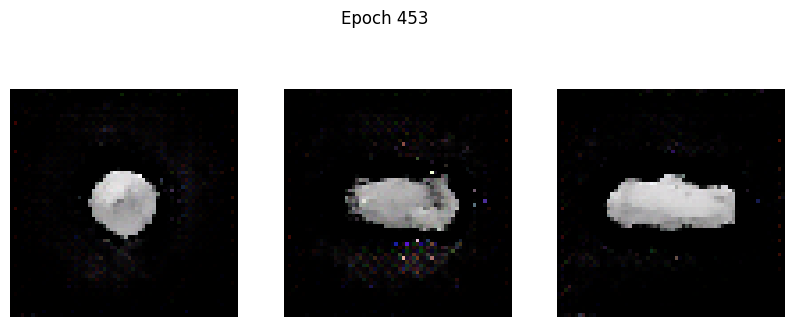

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1338 - g_loss: 6.3976
Epoch 454/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0860 - g_loss: 6.3911

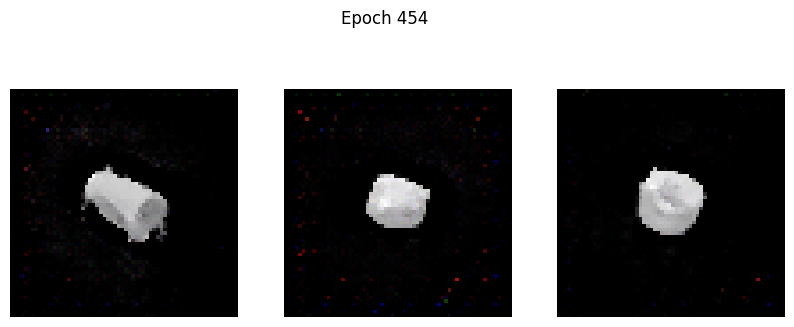

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.0863 - g_loss: 6.3906
Epoch 455/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0596 - g_loss: 7.0358

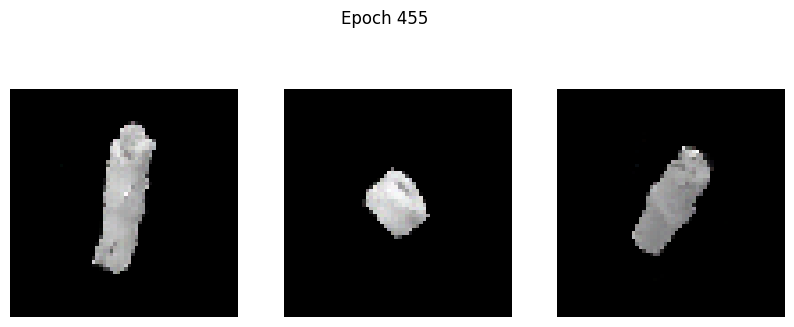

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0595 - g_loss: 7.0345
Epoch 456/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1481 - g_loss: 6.2606

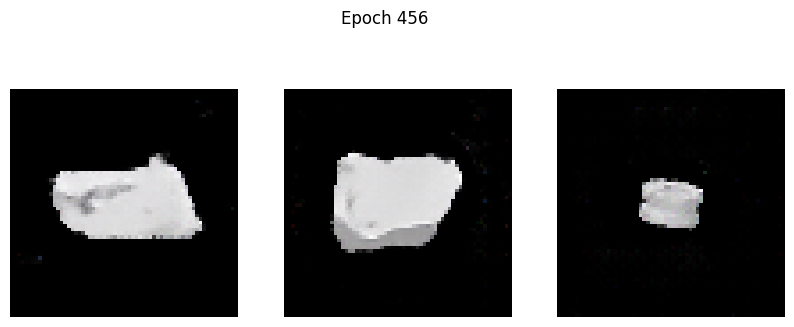

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1481 - g_loss: 6.2620
Epoch 457/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1209 - g_loss: 6.5036

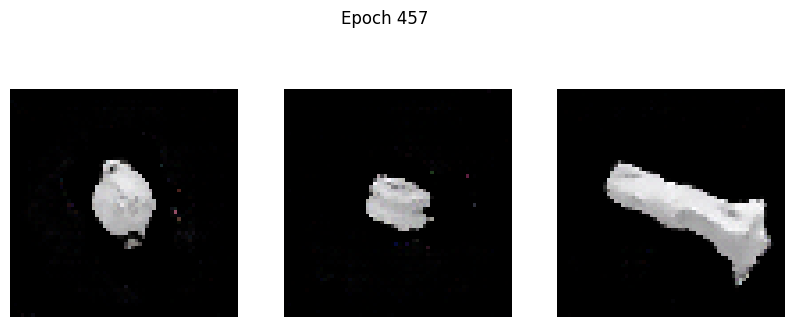

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1206 - g_loss: 6.5073
Epoch 458/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0776 - g_loss: 6.9642

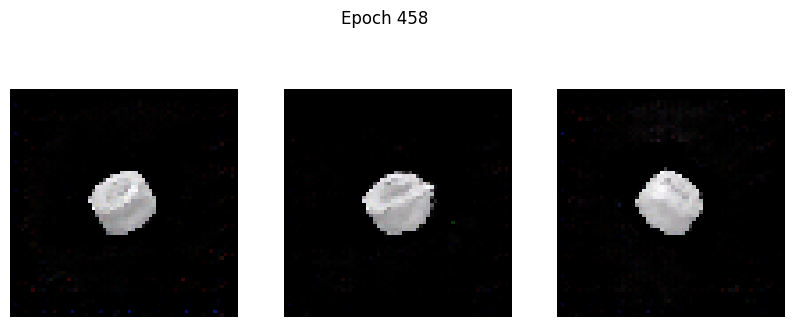

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0775 - g_loss: 6.9613
Epoch 459/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0489 - g_loss: 6.9409

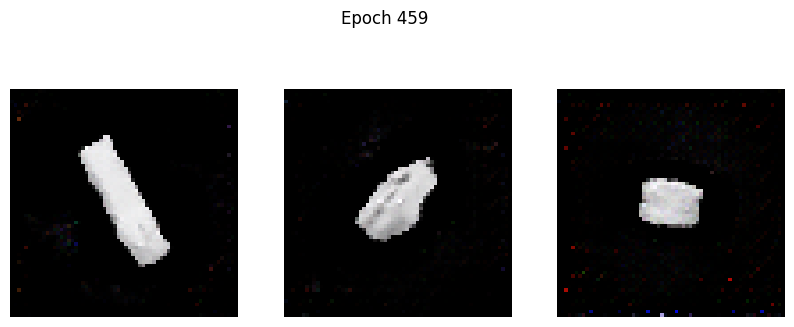

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0486 - g_loss: 6.9419
Epoch 460/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1694 - g_loss: 6.4556

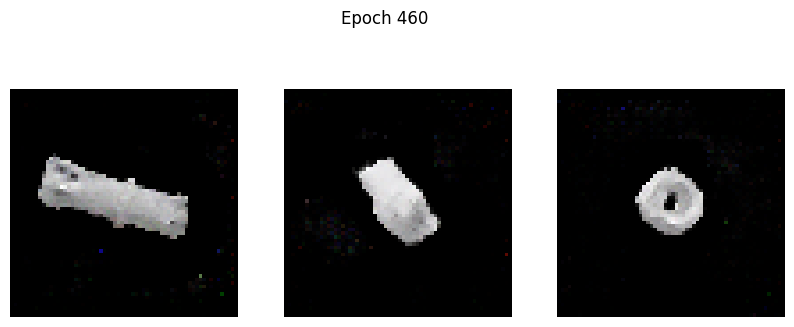

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1685 - g_loss: 6.4600
Epoch 461/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1244 - g_loss: 6.8233

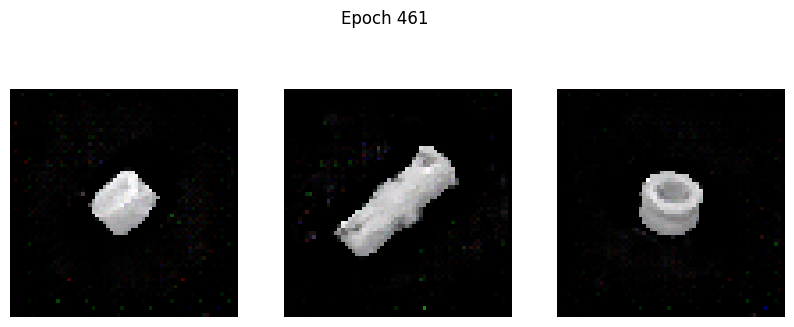

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.1243 - g_loss: 6.8242
Epoch 462/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1161 - g_loss: 6.7517

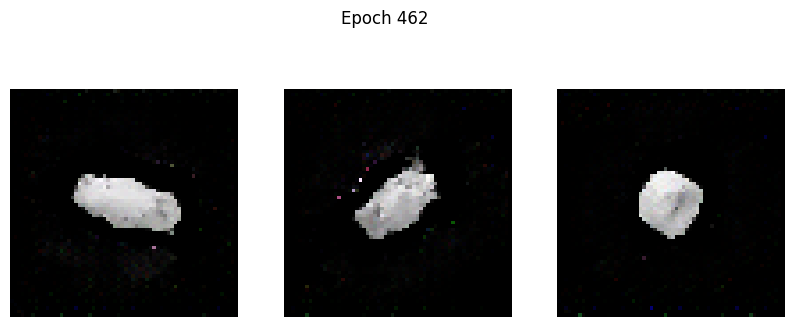

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: -0.1159 - g_loss: 6.7524
Epoch 463/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0313 - g_loss: 6.8974

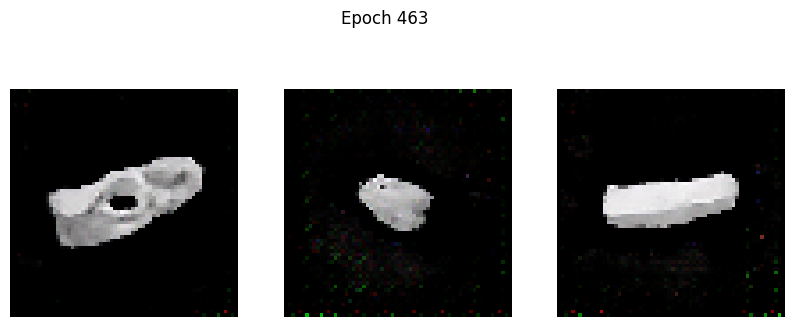

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0317 - g_loss: 6.8970
Epoch 464/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1446 - g_loss: 6.6211

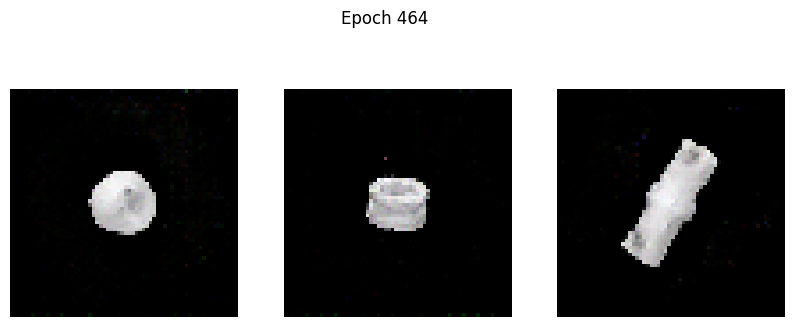

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1448 - g_loss: 6.6203
Epoch 465/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1319 - g_loss: 6.7545

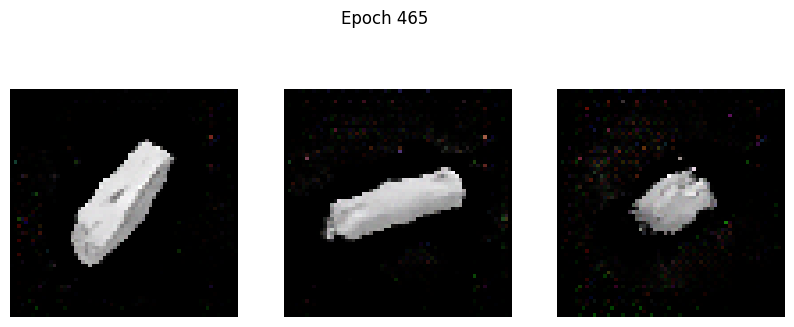

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1315 - g_loss: 6.7547
Epoch 466/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1250 - g_loss: 6.6508

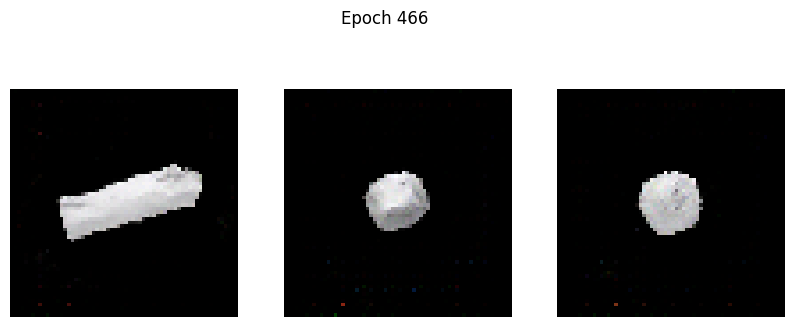

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1247 - g_loss: 6.6551
Epoch 467/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1358 - g_loss: 7.1976

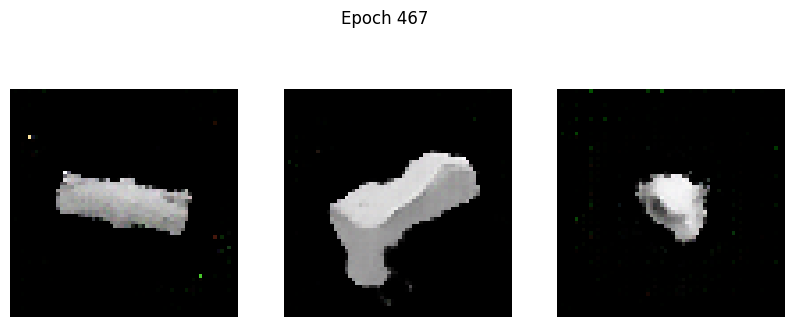

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1355 - g_loss: 7.1972
Epoch 468/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.1787 - g_loss: 6.6791

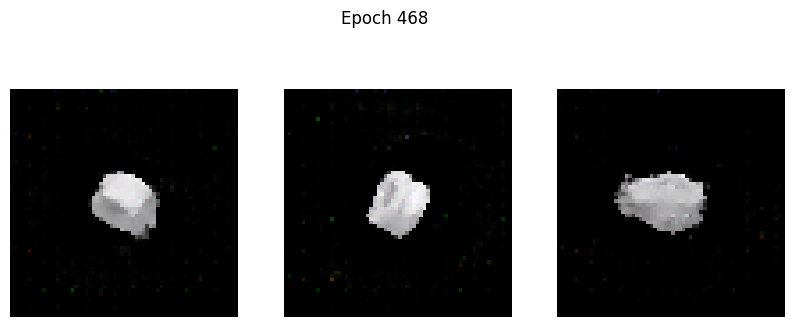

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: -0.1784 - g_loss: 6.6808
Epoch 469/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1334 - g_loss: 7.3722

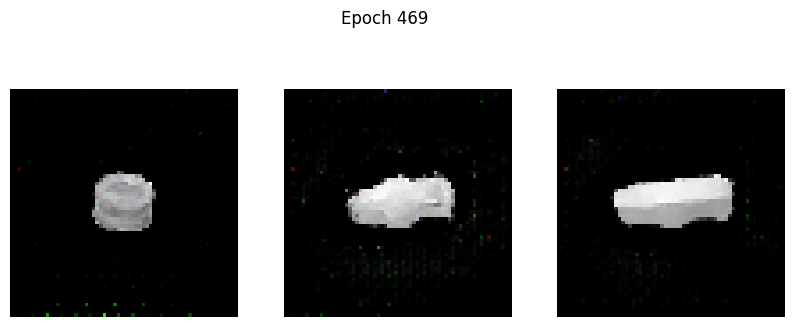

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1332 - g_loss: 7.3705
Epoch 470/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1269 - g_loss: 7.1064

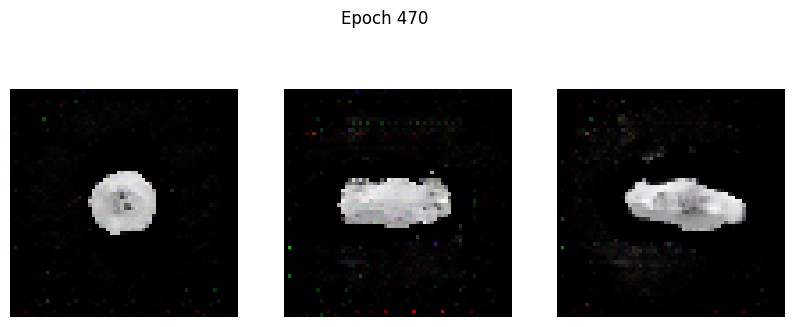

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1272 - g_loss: 7.1033
Epoch 471/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1284 - g_loss: 6.9756

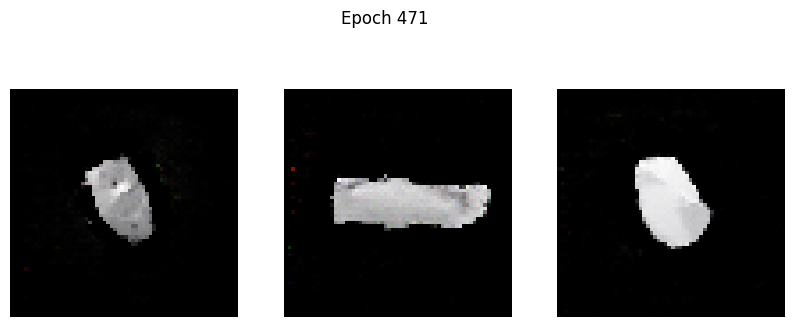

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1286 - g_loss: 6.9756
Epoch 472/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1212 - g_loss: 7.5843

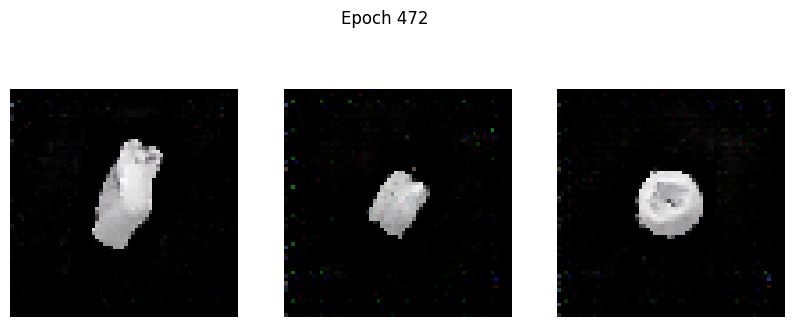

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1212 - g_loss: 7.5844
Epoch 473/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2051 - g_loss: 6.4260

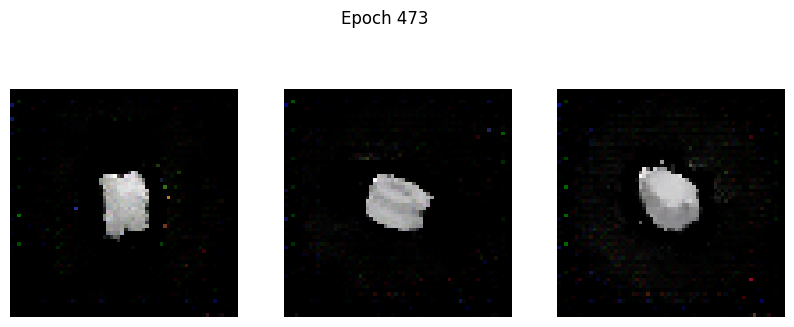

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2045 - g_loss: 6.4285
Epoch 474/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1922 - g_loss: 6.9687

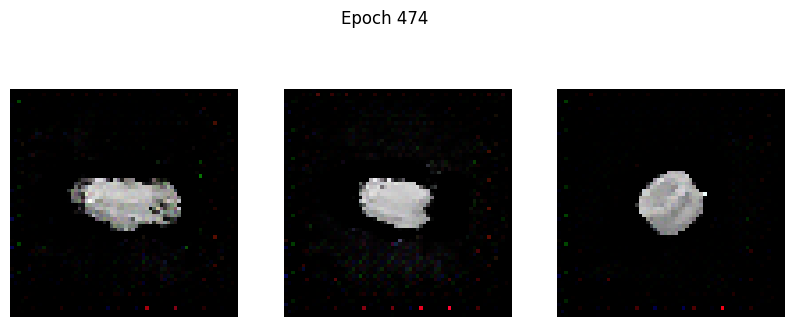

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1917 - g_loss: 6.9721
Epoch 475/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1987 - g_loss: 8.2307

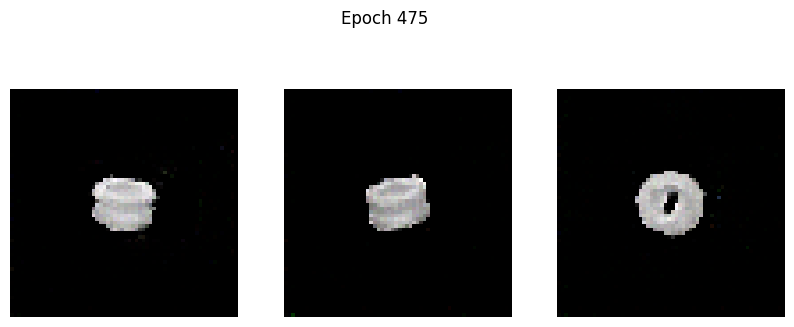

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1974 - g_loss: 8.2271
Epoch 476/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2033 - g_loss: 6.6835

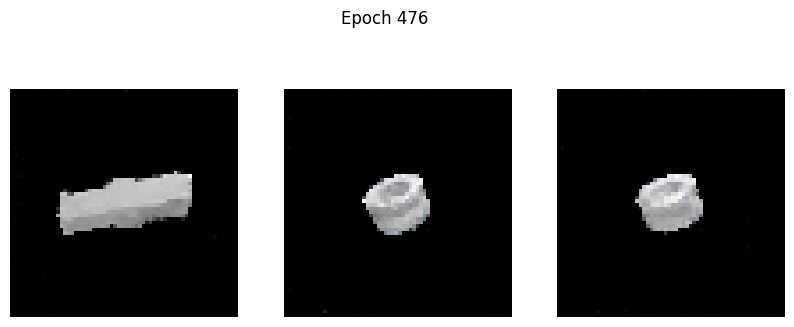

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2033 - g_loss: 6.6829
Epoch 477/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2229 - g_loss: 6.9899

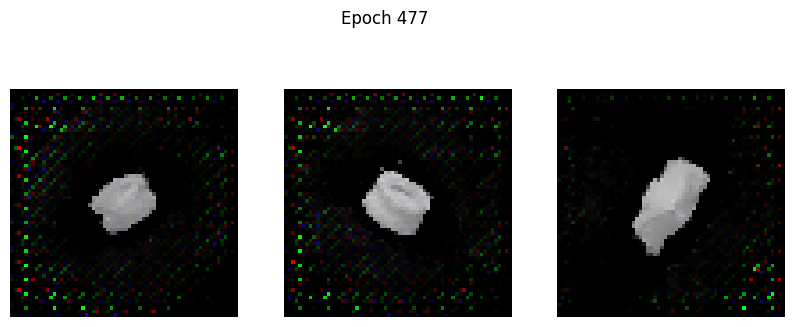

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2223 - g_loss: 6.9908
Epoch 478/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1218 - g_loss: 7.6174

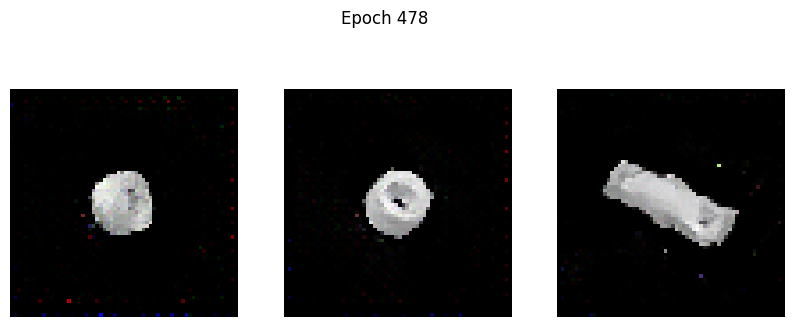

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1219 - g_loss: 7.6146
Epoch 479/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1395 - g_loss: 7.0637

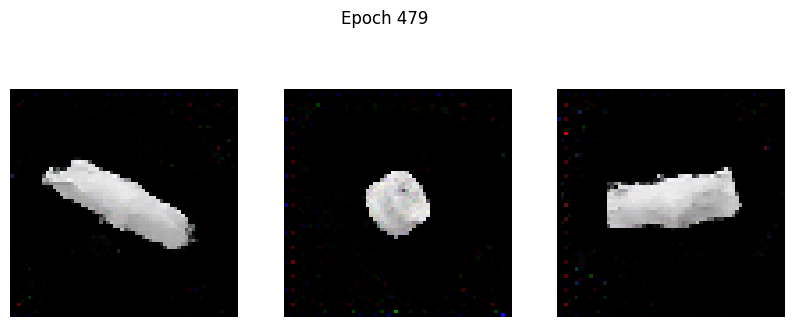

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1397 - g_loss: 7.0643
Epoch 480/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1388 - g_loss: 7.3514

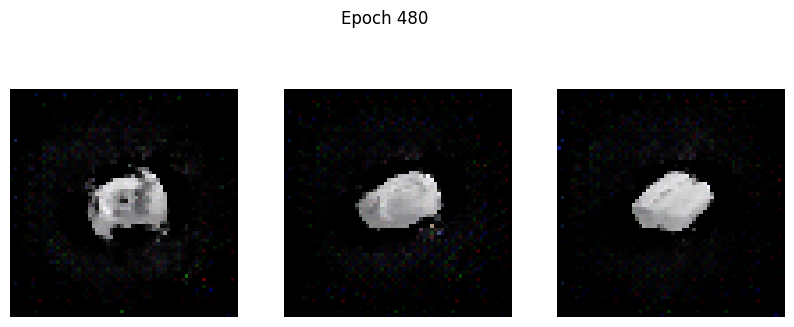

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1388 - g_loss: 7.3505
Epoch 481/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0273 - g_loss: 7.4811

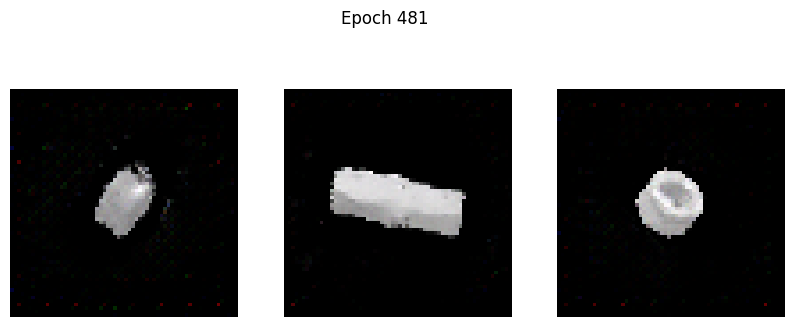

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0277 - g_loss: 7.4823
Epoch 482/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2149 - g_loss: 6.7734

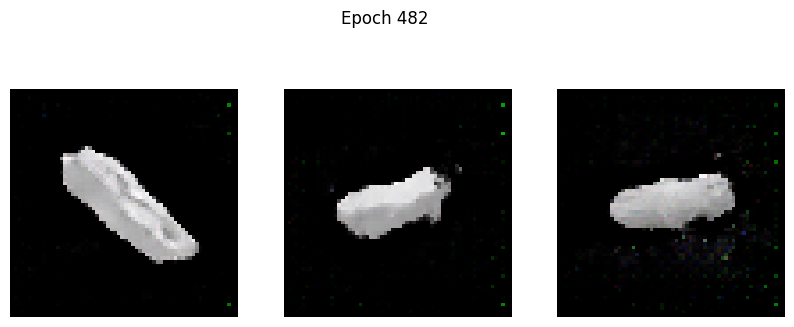

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2145 - g_loss: 6.7774
Epoch 483/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2047 - g_loss: 6.6549

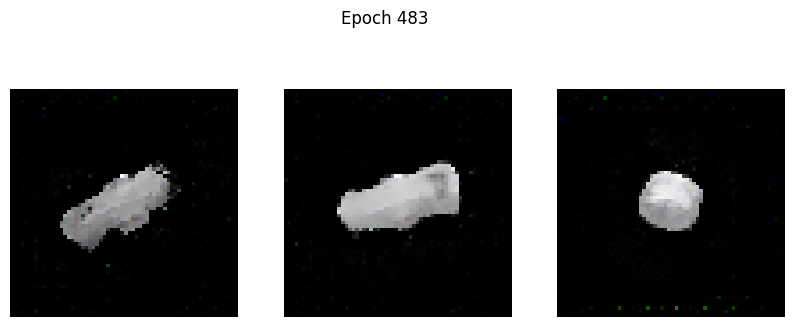

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2046 - g_loss: 6.6602
Epoch 484/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1358 - g_loss: 7.6328

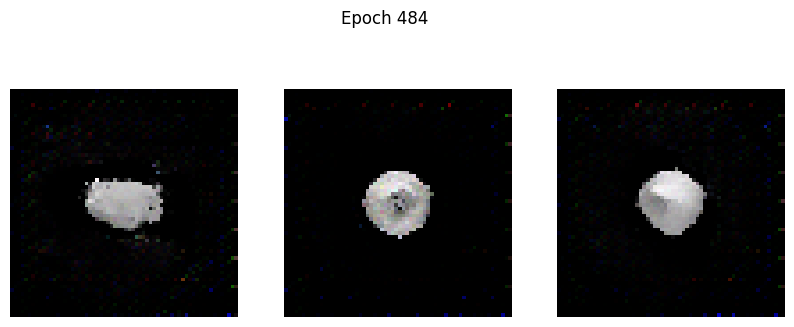

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1360 - g_loss: 7.6308
Epoch 485/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1646 - g_loss: 7.2922

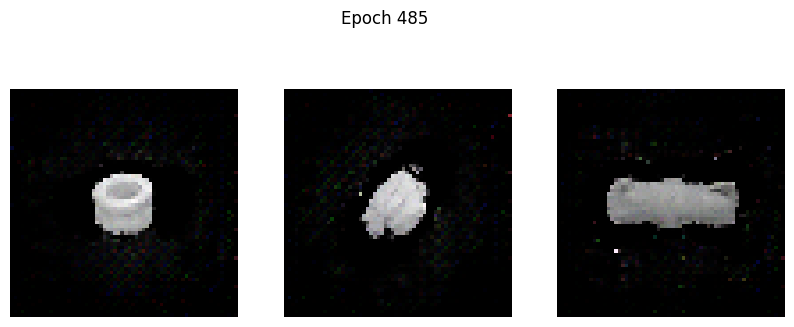

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1646 - g_loss: 7.2915
Epoch 486/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1160 - g_loss: 8.2666

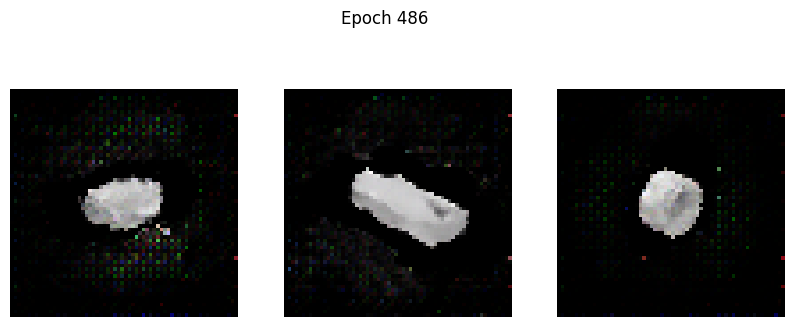

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1157 - g_loss: 8.2623
Epoch 487/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1459 - g_loss: 7.6223

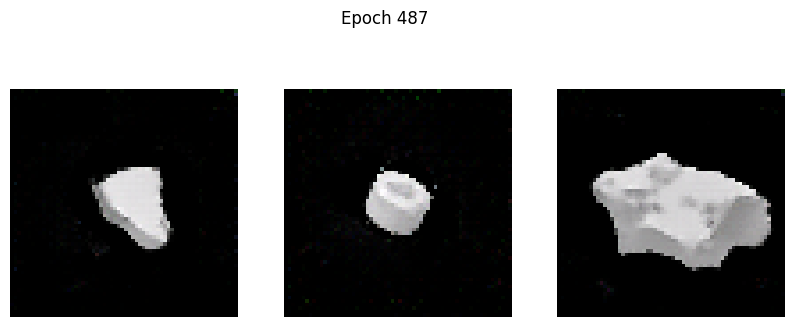

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1462 - g_loss: 7.6231
Epoch 488/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2197 - g_loss: 7.2126

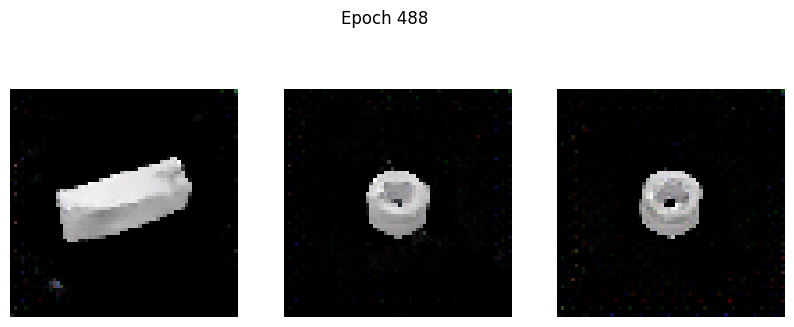

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2196 - g_loss: 7.2110
Epoch 489/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0247 - g_loss: 8.5564

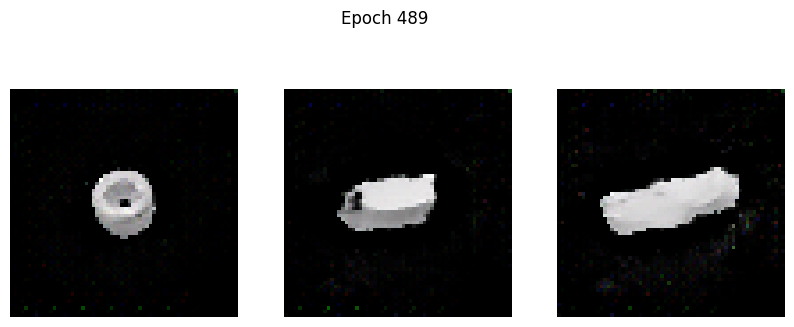

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0256 - g_loss: 8.5502
Epoch 490/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1523 - g_loss: 7.7121

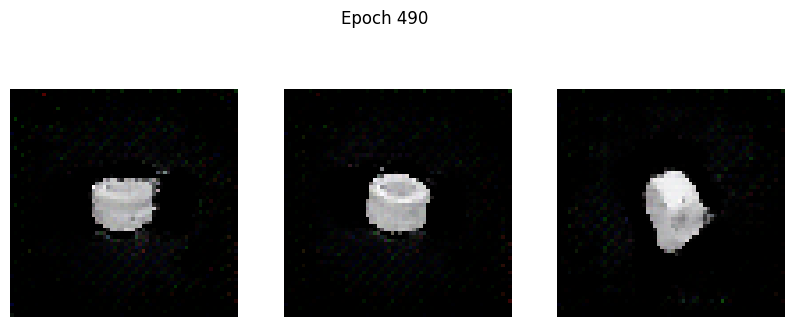

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1522 - g_loss: 7.7142
Epoch 491/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2093 - g_loss: 7.4613

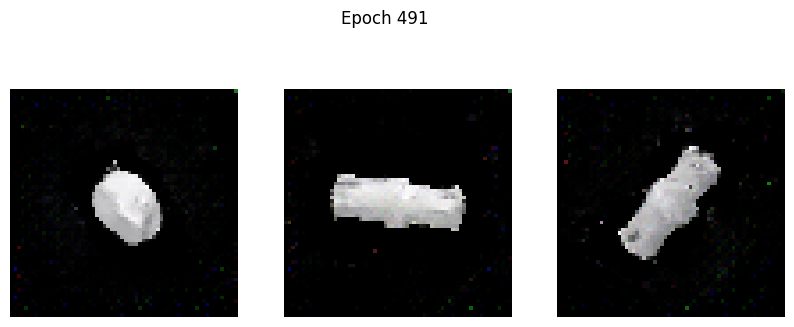

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2097 - g_loss: 7.4602
Epoch 492/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0984 - g_loss: 7.6841

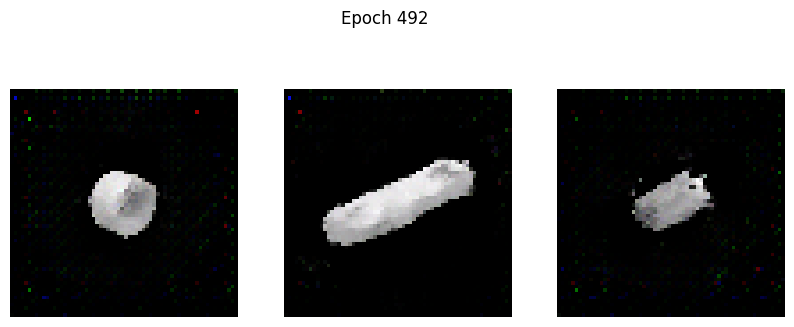

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0985 - g_loss: 7.6856
Epoch 493/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1816 - g_loss: 7.7815

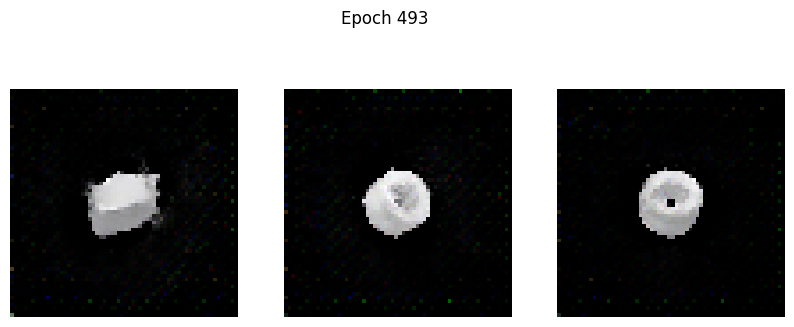

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.1818 - g_loss: 7.7787
Epoch 494/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2085 - g_loss: 7.4443

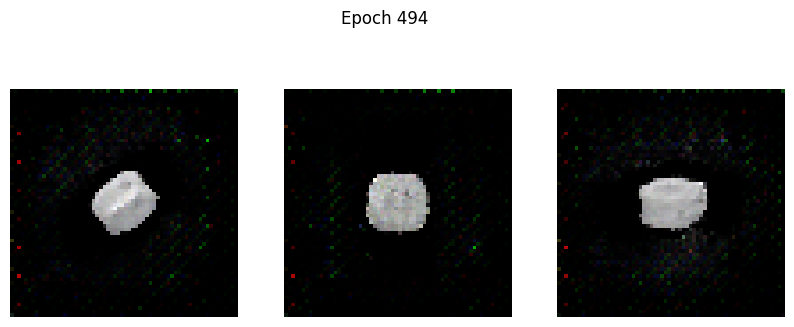

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2074 - g_loss: 7.4483
Epoch 495/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.1609 - g_loss: 7.5310

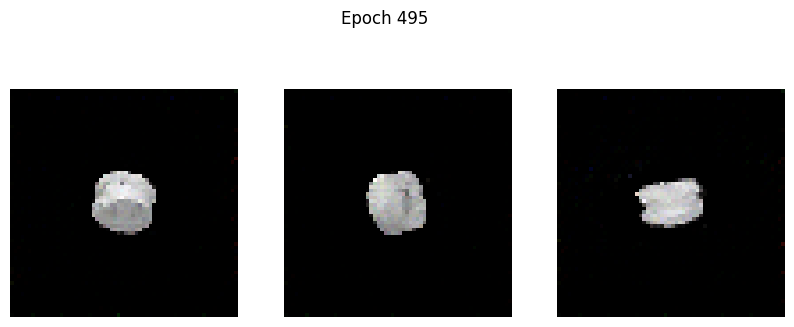

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1613 - g_loss: 7.5318
Epoch 496/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2596 - g_loss: 7.1295

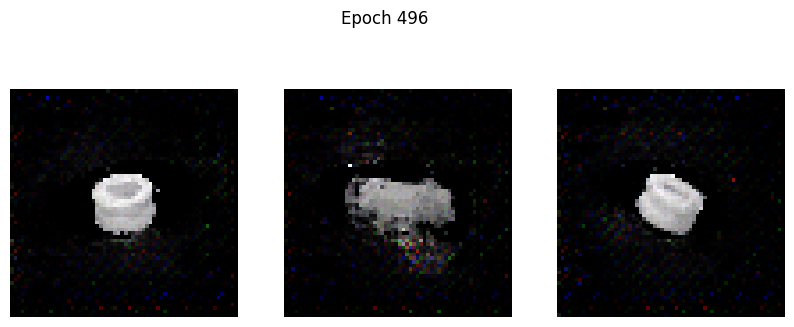

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2596 - g_loss: 7.1319
Epoch 497/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0432 - g_loss: 7.9163

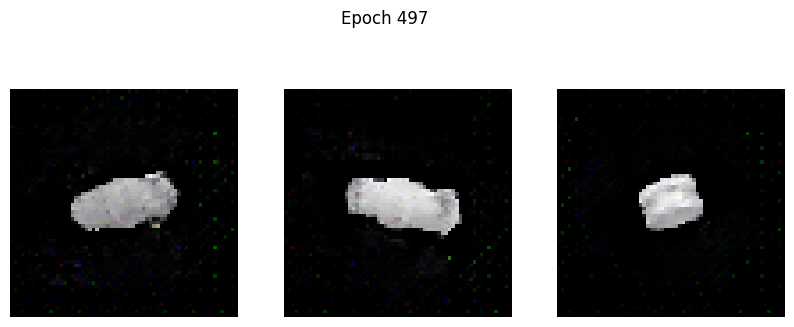

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0449 - g_loss: 7.9114
Epoch 498/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.2140 - g_loss: 7.1279

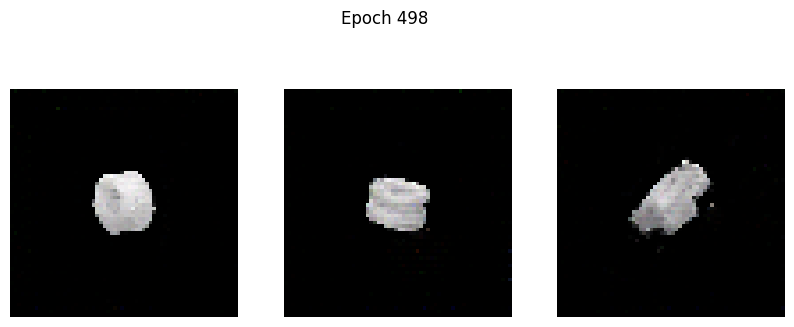

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.2140 - g_loss: 7.1297
Epoch 499/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2459 - g_loss: 7.8096

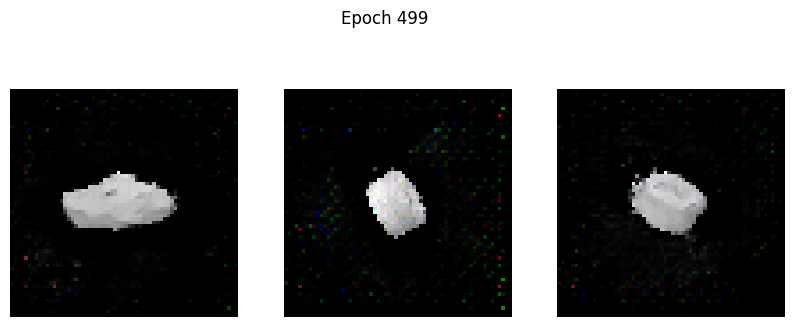

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2453 - g_loss: 7.8132
Epoch 500/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.2053 - g_loss: 7.9940

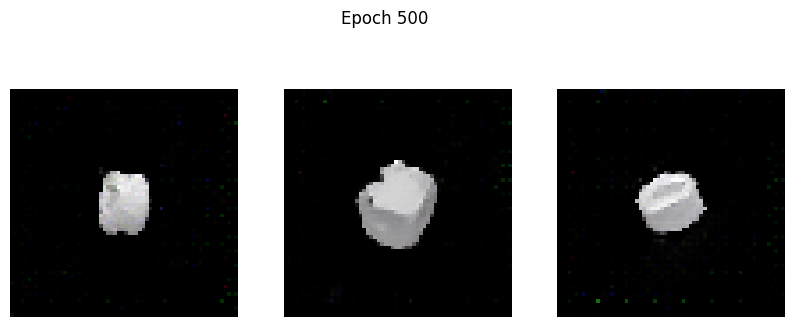

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.2055 - g_loss: 7.9923


In [9]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)